In [1]:
!pip install scikit-learn==1.1.3 xgboost --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 32.0/32.0 MB 57.5 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.6.0
    Uninstalling scikit-learn-1.6.0:
      Successfully uninstalled scikit-learn-1.6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imbalanced-learn 0.13.0 requires scikit-learn<2,>=1.3.2, but you have scikit-learn 1.1.3 which is incompatible.
bigframes 1.31.0 requires scikit-learn>=1.2.2, but you have scikit-learn 1.1.3 which is incompatible.
mlxtend 0.23.3 requires scikit-learn>=1.3.1, but you have scikit-learn 1.1.3 which is incompatible.
sklearn-compat 0.1.3 requires scikit-learn<1.7,>=1.2, but you have scikit-learn 1.1.3 which is incompatible.


# **1. Data Preprocessing**

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, KFold, cross_val_score, StratifiedKFold
from sklearn.metrics import roc_auc_score, confusion_matrix, classification_report, f1_score, precision_recall_curve, auc, accuracy_score

import warnings
warnings.filterwarnings('ignore')

In [5]:
dpath = "/content/drive/MyDrive/24-2/UNLV/Project/heg_sample_data.csv"
heg_meta = pd.read_csv(dpath)

In [6]:
heg_meta

,Unnamed: 0,days_from_entrance,age,document.sexo,UTI,delta_collect_timestamp_t-t1,delta_collect_timestamp_t1-t2,delta_collect_timestamp_t2-t3,delta_collect_timestamp_t3-t4,document.freq_cardiaca(t),...,delta_document.pa_sistolica_t3-t4,delta_document.sat_o2_t-t1,delta_document.sat_o2_t1-t2,delta_document.sat_o2_t2-t3,delta_document.sat_o2_t3-t4,delta_document.temperatura_t-t1,delta_document.temperatura_t1-t2,delta_document.temperatura_t2-t3,delta_document.temperatura_t3-t4,outcome
0,0,0.481160,-0.430375,1.0,0.0,0.181480,0.282895,0.397339,0.387741,-0.130331,...,0.107772,0.202479,0.194332,0.432788,0.012866,-0.144525,-0.024481,0.152412,0.007067,0.0
1,1,1.837695,0.230175,1.0,0.0,1.201338,1.826415,1.625187,2.170093,1.451289,...,-0.021933,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
2,2,0.226810,-0.719366,1.0,0.0,2.049497,4.031576,1.846655,2.285346,0.301020,...,0.139667,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
3,3,-0.366674,1.716413,1.0,0.0,1.038056,0.686616,1.107306,0.877358,0.684443,...,-0.101163,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
4,4,-0.366674,1.262285,0.0,0.0,0.879474,0.416499,0.427891,0.405360,0.492732,...,-0.021933,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13647,13647,-0.281891,0.643019,1.0,0.0,0.200458,0.235890,-0.313999,-0.015181,-1.184744,...,0.029118,1.636497,-0.833785,0.424839,0.011498,0.584695,-0.350259,-0.725431,-0.005497,0.0
13648,13648,0.142026,1.097147,0.0,0.0,0.056699,0.282506,0.406512,0.300970,-0.274114,...,-0.676939,0.004101,0.829661,-0.001954,0.439924,-0.444251,-0.350259,0.012286,0.657215,0.0
13649,13649,-0.281891,0.106322,0.0,0.0,0.139795,0.114485,0.240037,0.387741,-0.513754,...,0.272103,0.412200,-0.002062,-2.135920,-0.034930,0.422230,0.526740,-0.214704,-0.985154,0.0
13650,13650,-0.281891,1.386138,1.0,0.0,-0.243519,-0.186716,-0.200702,-0.262950,-0.178259,...,0.240936,-0.812096,-0.417923,-0.001954,0.011498,-1.310733,-0.240634,1.657963,-0.336854,0.0


In [7]:
# For Probable Calculate
data = heg_meta.copy()
drop_columns = ['days_from_entrance','delta_collect_timestamp_t-t1','delta_collect_timestamp_t1-t2',
                 'delta_collect_timestamp_t2-t3', 'delta_collect_timestamp_t3-t4']

data.drop(columns=drop_columns, inplace=True)
data.columns = data.columns.str.replace('[^A-Za-z0-9_]', '_', regex=True)

data

,Unnamed__0,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,...,delta_document_pa_sistolica_t3_t4,delta_document_sat_o2_t_t1,delta_document_sat_o2_t1_t2,delta_document_sat_o2_t2_t3,delta_document_sat_o2_t3_t4,delta_document_temperatura_t_t1,delta_document_temperatura_t1_t2,delta_document_temperatura_t2_t3,delta_document_temperatura_t3_t4,outcome
0,0,-0.430375,1.0,0.0,-0.130331,0.337252,0.349323,0.368394,0.258938,-0.369058,...,0.107772,0.202479,0.194332,0.432788,0.012866,-0.144525,-0.024481,0.152412,0.007067,0.0
1,1,0.230175,1.0,0.0,1.451289,1.601233,1.473310,1.576802,1.397064,-0.369058,...,-0.021933,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
2,2,-0.719366,1.0,0.0,0.301020,0.403377,0.349323,0.368394,0.258938,0.025295,...,0.139667,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
3,3,1.716413,1.0,0.0,0.684443,0.823398,0.701822,0.778084,0.820968,-0.106156,...,-0.101163,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
4,4,1.262285,0.0,0.0,0.492732,-0.537812,-0.415571,-0.812491,-0.569145,-0.106156,...,-0.021933,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13647,13647,0.643019,1.0,0.0,-1.184744,-0.732271,-0.954112,-0.239590,-0.256581,-0.106156,...,0.029118,1.636497,-0.833785,0.424839,0.011498,0.584695,-0.350259,-0.725431,-0.005497,0.0
13648,13648,1.097147,0.0,0.0,-0.274114,-0.148895,0.112743,1.411926,-0.256581,-0.106156,...,-0.676939,0.004101,0.829661,-0.001954,0.439924,-0.444251,-0.350259,0.012286,0.657215,0.0
13649,13649,0.106322,0.0,0.0,-0.513754,-1.218417,-0.165567,0.704134,0.812900,-0.369058,...,0.272103,0.412200,-0.002062,-2.135920,-0.034930,0.422230,0.526740,-0.214704,-0.985154,0.0
13650,13650,1.386138,1.0,0.0,-0.178259,0.094178,0.205513,0.043527,-0.165369,-1.157763,...,0.240936,-0.812096,-0.417923,-0.001954,0.011498,-1.310733,-0.240634,1.657963,-0.336854,0.0


In [8]:
data.head()

,Unnamed__0,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,...,delta_document_pa_sistolica_t3_t4,delta_document_sat_o2_t_t1,delta_document_sat_o2_t1_t2,delta_document_sat_o2_t2_t3,delta_document_sat_o2_t3_t4,delta_document_temperatura_t_t1,delta_document_temperatura_t1_t2,delta_document_temperatura_t2_t3,delta_document_temperatura_t3_t4,outcome
0,0,-0.430375,1.0,0.0,-0.130331,0.337252,0.349323,0.368394,0.258938,-0.369058,...,0.107772,0.202479,0.194332,0.432788,0.012866,-0.144525,-0.024481,0.152412,0.007067,0.0
1,1,0.230175,1.0,0.0,1.451289,1.601233,1.473310,1.576802,1.397064,-0.369058,...,-0.021933,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
2,2,-0.719366,1.0,0.0,0.301020,0.403377,0.349323,0.368394,0.258938,0.025295,...,0.139667,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
3,3,1.716413,1.0,0.0,0.684443,0.823398,0.701822,0.778084,0.820968,-0.106156,...,-0.101163,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
4,4,1.262285,0.0,0.0,0.492732,-0.537812,-0.415571,-0.812491,-0.569145,-0.106156,...,-0.021933,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,1.0


In [9]:
data_y = heg_meta['outcome']
data_y

,outcome
0,0.0
1,0.0
2,0.0
3,0.0
4,1.0
...,...
13647,0.0
13648,0.0
13649,0.0
13650,0.0


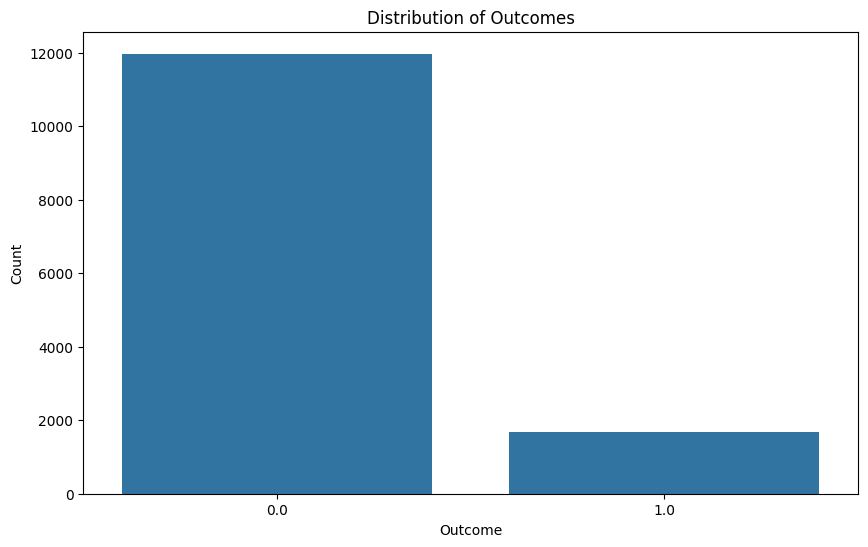

In [ ]:
# Assuming data_y is defined as in the previous code
plt.figure(figsize=(10, 6))
sns.countplot(x='outcome', data=heg_meta)
plt.title('Distribution of Outcomes')
plt.xlabel('Outcome')
plt.ylabel('Count')
plt.show()

In [ ]:
count_1 = (heg_meta['outcome'] == 1.0).sum()
print(f"# 1.0 in data_y: {count_1}")

count_0 = (heg_meta['outcome'] == 0.0).sum()
print(f"# 0.0 in data_y: {count_0}")

# 1.0 in data_y: 1682
# 0.0 in data_y: 11970


In [ ]:
total = len(data_y)
ratio_0 = count_0 / total
ratio_1 = count_1 / total
print(f"Ratio of 0.0 in data_y: {ratio_0:.4f}")
print(f"Ratio of 1.0 in data_y: {ratio_1:.4f}")

Ratio of 0.0 in data_y: 0.8768
Ratio of 1.0 in data_y: 0.1232


→ 0.0:1.0 = ***0.87:0.12***<br>
1:7(1682:11774)

In [10]:
majority_data = data[data['outcome'] == 0.0]
minority_data = data[data['outcome'] == 1.0]

In [11]:
minority_data

,Unnamed__0,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,...,delta_document_pa_sistolica_t3_t4,delta_document_sat_o2_t_t1,delta_document_sat_o2_t1_t2,delta_document_sat_o2_t2_t3,delta_document_sat_o2_t3_t4,delta_document_temperatura_t_t1,delta_document_temperatura_t1_t2,delta_document_temperatura_t2_t3,delta_document_temperatura_t3_t4,outcome
4,4,1.262285,0.0,0.0,0.492732,-0.537812,-0.415571,-0.812491,-0.569145,-0.106156,...,-0.021933,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,1.0
6,6,-0.141384,1.0,0.0,2.553630,1.698462,-0.351107,1.600671,1.413867,-0.106156,...,0.081035,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,1.0
7,7,0.188891,1.0,0.0,-0.561681,-0.148895,-0.536647,0.232272,0.381902,-0.894861,...,-0.676939,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,1.0
11,11,0.477881,0.0,0.0,-0.369970,-0.250262,-0.267864,-0.180706,-0.221517,-0.106156,...,0.133568,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,1.0
18,18,1.303569,0.0,0.0,0.157237,-0.003051,0.251898,-0.381148,0.564325,-0.106156,...,-0.676939,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,13575,0.354028,1.0,0.0,-2.095373,-0.732271,-0.583032,-0.003659,1.339625,0.288197,...,-0.676939,-2.444492,-0.833785,-0.855540,0.011498,-2.718764,-0.185822,2.565922,-1.607053,1.0
13584,13584,0.023753,1.0,1.0,0.924082,-0.732271,-0.861342,-0.853010,-0.849457,-0.106156,...,0.029118,2.452694,-0.833785,-0.428747,0.011498,4.754635,0.307490,0.012286,-0.005497,1.0
13590,13590,0.023753,1.0,0.0,-1.711950,-0.294739,0.715748,-0.192404,0.381902,0.156746,...,-0.676939,2.044596,-0.002062,-1.709127,0.011498,-0.660872,-0.021385,-0.498441,0.878120,1.0
13623,13623,0.643019,1.0,0.0,0.348948,-0.197509,0.437438,0.798506,0.655537,-0.369058,...,-1.171180,-3.260689,-0.417923,4.265978,-0.416929,-2.339679,0.143053,2.736165,-2.490670,1.0


In [12]:
data.iloc[:,:-1]

,Unnamed__0,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,...,delta_document_pa_sistolica_t2_t3,delta_document_pa_sistolica_t3_t4,delta_document_sat_o2_t_t1,delta_document_sat_o2_t1_t2,delta_document_sat_o2_t2_t3,delta_document_sat_o2_t3_t4,delta_document_temperatura_t_t1,delta_document_temperatura_t1_t2,delta_document_temperatura_t2_t3,delta_document_temperatura_t3_t4
0,0,-0.430375,1.0,0.0,-0.130331,0.337252,0.349323,0.368394,0.258938,-0.369058,...,-0.155667,0.107772,0.202479,0.194332,0.432788,0.012866,-0.144525,-0.024481,0.152412,0.007067
1,1,0.230175,1.0,0.0,1.451289,1.601233,1.473310,1.576802,1.397064,-0.369058,...,-0.110235,-0.021933,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067
2,2,-0.719366,1.0,0.0,0.301020,0.403377,0.349323,0.368394,0.258938,0.025295,...,-0.322535,0.139667,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067
3,3,1.716413,1.0,0.0,0.684443,0.823398,0.701822,0.778084,0.820968,-0.106156,...,0.017670,-0.101163,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067
4,4,1.262285,0.0,0.0,0.492732,-0.537812,-0.415571,-0.812491,-0.569145,-0.106156,...,-0.101644,-0.021933,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13647,13647,0.643019,1.0,0.0,-1.184744,-0.732271,-0.954112,-0.239590,-0.256581,-0.106156,...,-1.404179,0.029118,1.636497,-0.833785,0.424839,0.011498,0.584695,-0.350259,-0.725431,-0.005497
13648,13648,1.097147,0.0,0.0,-0.274114,-0.148895,0.112743,1.411926,-0.256581,-0.106156,...,0.022989,-0.676939,0.004101,0.829661,-0.001954,0.439924,-0.444251,-0.350259,0.012286,0.657215
13649,13649,0.106322,0.0,0.0,-0.513754,-1.218417,-0.165567,0.704134,0.812900,-0.369058,...,-0.690595,0.272103,0.412200,-0.002062,-2.135920,-0.034930,0.422230,0.526740,-0.214704,-0.985154
13650,13650,1.386138,1.0,0.0,-0.178259,0.094178,0.205513,0.043527,-0.165369,-1.157763,...,0.165705,0.240936,-0.812096,-0.417923,-0.001954,0.011498,-1.310733,-0.240634,1.657963,-0.336854


In [13]:
from xgboost import XGBClassifier

xgb_model = XGBClassifier(
    n_estimators = 500,
    learning_rate = 0.01,
    max_depth = 5,
    colsample_bytree = 0.8,
    random_state = 42
)

X = data.iloc[:,:-1]
y = data_y

train_dataset = np.concatenate([X, y.values.reshape(-1, 1)], axis = 1)
train_dataset = pd.DataFrame(train_dataset, columns = X.columns.tolist() + ['outcome'])

train_data_indices = train_dataset[train_dataset['outcome'] == 0.0].index

In [14]:
X.shape

(13652, 67)

In [15]:
y.shape

(13652,)

In [16]:
train_dataset

,Unnamed__0,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,...,delta_document_pa_sistolica_t3_t4,delta_document_sat_o2_t_t1,delta_document_sat_o2_t1_t2,delta_document_sat_o2_t2_t3,delta_document_sat_o2_t3_t4,delta_document_temperatura_t_t1,delta_document_temperatura_t1_t2,delta_document_temperatura_t2_t3,delta_document_temperatura_t3_t4,outcome
0,0.0,-0.430375,1.0,0.0,-0.130331,0.337252,0.349323,0.368394,0.258938,-0.369058,...,0.107772,0.202479,0.194332,0.432788,0.012866,-0.144525,-0.024481,0.152412,0.007067,0.0
1,1.0,0.230175,1.0,0.0,1.451289,1.601233,1.473310,1.576802,1.397064,-0.369058,...,-0.021933,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
2,2.0,-0.719366,1.0,0.0,0.301020,0.403377,0.349323,0.368394,0.258938,0.025295,...,0.139667,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
3,3.0,1.716413,1.0,0.0,0.684443,0.823398,0.701822,0.778084,0.820968,-0.106156,...,-0.101163,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
4,4.0,1.262285,0.0,0.0,0.492732,-0.537812,-0.415571,-0.812491,-0.569145,-0.106156,...,-0.021933,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13647,13647.0,0.643019,1.0,0.0,-1.184744,-0.732271,-0.954112,-0.239590,-0.256581,-0.106156,...,0.029118,1.636497,-0.833785,0.424839,0.011498,0.584695,-0.350259,-0.725431,-0.005497,0.0
13648,13648.0,1.097147,0.0,0.0,-0.274114,-0.148895,0.112743,1.411926,-0.256581,-0.106156,...,-0.676939,0.004101,0.829661,-0.001954,0.439924,-0.444251,-0.350259,0.012286,0.657215,0.0
13649,13649.0,0.106322,0.0,0.0,-0.513754,-1.218417,-0.165567,0.704134,0.812900,-0.369058,...,0.272103,0.412200,-0.002062,-2.135920,-0.034930,0.422230,0.526740,-0.214704,-0.985154,0.0
13650,13650.0,1.386138,1.0,0.0,-0.178259,0.094178,0.205513,0.043527,-0.165369,-1.157763,...,0.240936,-0.812096,-0.417923,-0.001954,0.011498,-1.310733,-0.240634,1.657963,-0.336854,0.0


In [17]:
data

,Unnamed__0,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,...,delta_document_pa_sistolica_t3_t4,delta_document_sat_o2_t_t1,delta_document_sat_o2_t1_t2,delta_document_sat_o2_t2_t3,delta_document_sat_o2_t3_t4,delta_document_temperatura_t_t1,delta_document_temperatura_t1_t2,delta_document_temperatura_t2_t3,delta_document_temperatura_t3_t4,outcome
0,0,-0.430375,1.0,0.0,-0.130331,0.337252,0.349323,0.368394,0.258938,-0.369058,...,0.107772,0.202479,0.194332,0.432788,0.012866,-0.144525,-0.024481,0.152412,0.007067,0.0
1,1,0.230175,1.0,0.0,1.451289,1.601233,1.473310,1.576802,1.397064,-0.369058,...,-0.021933,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
2,2,-0.719366,1.0,0.0,0.301020,0.403377,0.349323,0.368394,0.258938,0.025295,...,0.139667,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
3,3,1.716413,1.0,0.0,0.684443,0.823398,0.701822,0.778084,0.820968,-0.106156,...,-0.101163,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
4,4,1.262285,0.0,0.0,0.492732,-0.537812,-0.415571,-0.812491,-0.569145,-0.106156,...,-0.021933,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13647,13647,0.643019,1.0,0.0,-1.184744,-0.732271,-0.954112,-0.239590,-0.256581,-0.106156,...,0.029118,1.636497,-0.833785,0.424839,0.011498,0.584695,-0.350259,-0.725431,-0.005497,0.0
13648,13648,1.097147,0.0,0.0,-0.274114,-0.148895,0.112743,1.411926,-0.256581,-0.106156,...,-0.676939,0.004101,0.829661,-0.001954,0.439924,-0.444251,-0.350259,0.012286,0.657215,0.0
13649,13649,0.106322,0.0,0.0,-0.513754,-1.218417,-0.165567,0.704134,0.812900,-0.369058,...,0.272103,0.412200,-0.002062,-2.135920,-0.034930,0.422230,0.526740,-0.214704,-0.985154,0.0
13650,13650,1.386138,1.0,0.0,-0.178259,0.094178,0.205513,0.043527,-0.165369,-1.157763,...,0.240936,-0.812096,-0.417923,-0.001954,0.011498,-1.310733,-0.240634,1.657963,-0.336854,0.0


In [18]:
train_index_file = data[['Unnamed__0']].copy()
train_index_file

,Unnamed__0
0,0
1,1
2,2
3,3
4,4
...,...
13647,13647
13648,13648
13649,13649
13650,13650


In [19]:
train_dataset

,Unnamed__0,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,...,delta_document_pa_sistolica_t3_t4,delta_document_sat_o2_t_t1,delta_document_sat_o2_t1_t2,delta_document_sat_o2_t2_t3,delta_document_sat_o2_t3_t4,delta_document_temperatura_t_t1,delta_document_temperatura_t1_t2,delta_document_temperatura_t2_t3,delta_document_temperatura_t3_t4,outcome
0,0.0,-0.430375,1.0,0.0,-0.130331,0.337252,0.349323,0.368394,0.258938,-0.369058,...,0.107772,0.202479,0.194332,0.432788,0.012866,-0.144525,-0.024481,0.152412,0.007067,0.0
1,1.0,0.230175,1.0,0.0,1.451289,1.601233,1.473310,1.576802,1.397064,-0.369058,...,-0.021933,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
2,2.0,-0.719366,1.0,0.0,0.301020,0.403377,0.349323,0.368394,0.258938,0.025295,...,0.139667,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
3,3.0,1.716413,1.0,0.0,0.684443,0.823398,0.701822,0.778084,0.820968,-0.106156,...,-0.101163,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
4,4.0,1.262285,0.0,0.0,0.492732,-0.537812,-0.415571,-0.812491,-0.569145,-0.106156,...,-0.021933,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13647,13647.0,0.643019,1.0,0.0,-1.184744,-0.732271,-0.954112,-0.239590,-0.256581,-0.106156,...,0.029118,1.636497,-0.833785,0.424839,0.011498,0.584695,-0.350259,-0.725431,-0.005497,0.0
13648,13648.0,1.097147,0.0,0.0,-0.274114,-0.148895,0.112743,1.411926,-0.256581,-0.106156,...,-0.676939,0.004101,0.829661,-0.001954,0.439924,-0.444251,-0.350259,0.012286,0.657215,0.0
13649,13649.0,0.106322,0.0,0.0,-0.513754,-1.218417,-0.165567,0.704134,0.812900,-0.369058,...,0.272103,0.412200,-0.002062,-2.135920,-0.034930,0.422230,0.526740,-0.214704,-0.985154,0.0
13650,13650.0,1.386138,1.0,0.0,-0.178259,0.094178,0.205513,0.043527,-0.165369,-1.157763,...,0.240936,-0.812096,-0.417923,-0.001954,0.011498,-1.310733,-0.240634,1.657963,-0.336854,0.0


In [20]:
train_dataset['train_index'] = train_dataset.index
train_dataset

,Unnamed__0,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,...,delta_document_sat_o2_t_t1,delta_document_sat_o2_t1_t2,delta_document_sat_o2_t2_t3,delta_document_sat_o2_t3_t4,delta_document_temperatura_t_t1,delta_document_temperatura_t1_t2,delta_document_temperatura_t2_t3,delta_document_temperatura_t3_t4,outcome,train_index
0,0.0,-0.430375,1.0,0.0,-0.130331,0.337252,0.349323,0.368394,0.258938,-0.369058,...,0.202479,0.194332,0.432788,0.012866,-0.144525,-0.024481,0.152412,0.007067,0.0,0
1,1.0,0.230175,1.0,0.0,1.451289,1.601233,1.473310,1.576802,1.397064,-0.369058,...,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0,1
2,2.0,-0.719366,1.0,0.0,0.301020,0.403377,0.349323,0.368394,0.258938,0.025295,...,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0,2
3,3.0,1.716413,1.0,0.0,0.684443,0.823398,0.701822,0.778084,0.820968,-0.106156,...,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0,3
4,4.0,1.262285,0.0,0.0,0.492732,-0.537812,-0.415571,-0.812491,-0.569145,-0.106156,...,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,1.0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13647,13647.0,0.643019,1.0,0.0,-1.184744,-0.732271,-0.954112,-0.239590,-0.256581,-0.106156,...,1.636497,-0.833785,0.424839,0.011498,0.584695,-0.350259,-0.725431,-0.005497,0.0,13647
13648,13648.0,1.097147,0.0,0.0,-0.274114,-0.148895,0.112743,1.411926,-0.256581,-0.106156,...,0.004101,0.829661,-0.001954,0.439924,-0.444251,-0.350259,0.012286,0.657215,0.0,13648
13649,13649.0,0.106322,0.0,0.0,-0.513754,-1.218417,-0.165567,0.704134,0.812900,-0.369058,...,0.412200,-0.002062,-2.135920,-0.034930,0.422230,0.526740,-0.214704,-0.985154,0.0,13649
13650,13650.0,1.386138,1.0,0.0,-0.178259,0.094178,0.205513,0.043527,-0.165369,-1.157763,...,-0.812096,-0.417923,-0.001954,0.011498,-1.310733,-0.240634,1.657963,-0.336854,0.0,13650


In [21]:
!pip install --upgrade scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 112.0 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.1.3
    Uninstalling scikit-learn-1.1.3:
      Successfully uninstalled scikit-learn-1.1.3


In [ ]:
!pip install --upgrade scikit-learn xgboost

In [22]:
xgb_model.fit(X, y,
              eval_set = [(X, y)],
              verbose = True)

[0]	validation_0-logloss:0.38370
[1]	validation_0-logloss:0.38136
[2]	validation_0-logloss:0.37918
[3]	validation_0-logloss:0.37697
[4]	validation_0-logloss:0.37515
[5]	validation_0-logloss:0.37303
[6]	validation_0-logloss:0.37105
[7]	validation_0-logloss:0.36934
[8]	validation_0-logloss:0.36759
[9]	validation_0-logloss:0.36570
[10]	validation_0-logloss:0.36403
[11]	validation_0-logloss:0.36217
[12]	validation_0-logloss:0.36031
[13]	validation_0-logloss:0.35848
[14]	validation_0-logloss:0.35679
[15]	validation_0-logloss:0.35515
[16]	validation_0-logloss:0.35362
[17]	validation_0-logloss:0.35202
[18]	validation_0-logloss:0.35065
[19]	validation_0-logloss:0.34902
[20]	validation_0-logloss:0.34744
[21]	validation_0-logloss:0.34597
[22]	validation_0-logloss:0.34438
[23]	validation_0-logloss:0.34307
[24]	validation_0-logloss:0.34167
[25]	validation_0-logloss:0.34019
[26]	validation_0-logloss:0.33877
[27]	validation_0-logloss:0.33736
[28]	validation_0-logloss:0.33593
[29]	validation_0-loglos

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=500, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [23]:
# For Probable Calculate
def get_highest_probability_points(model, data, original_data, target_class):
    proba = model.predict_proba(data)[:, target_class]
    highest_proba_indices = np.argsort(proba)[::-1]
    highest_proba_points = original_data.iloc[highest_proba_indices].copy()
    highest_proba_points['Probability'] = proba[highest_proba_indices]
    return highest_proba_points, highest_proba_indices

In [24]:
# For Probable Calculate
train_data = data[data['outcome']==0.0]
train_data_others = train_data.drop(columns='outcome')

highest_df = pd.DataFrame()

highest_df, highest_indices = get_highest_probability_points(
    xgb_model, train_data_others, train_data, target_class=0)

highest_df = highest_df.reset_index(drop=True)
highest_df['Index'] = train_data.index[highest_indices]

highest_df

,Unnamed__0,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,...,delta_document_sat_o2_t1_t2,delta_document_sat_o2_t2_t3,delta_document_sat_o2_t3_t4,delta_document_temperatura_t_t1,delta_document_temperatura_t1_t2,delta_document_temperatura_t2_t3,delta_document_temperatura_t3_t4,outcome,Probability,Index
0,7739,-1.132210,1.0,0.0,-0.369970,-0.878114,-0.683442,-0.812491,-0.569145,0.025295,...,0.902141,-0.312279,0.303399,-0.119321,0.020588,0.029547,0.006474,0.0,0.993247,7739
1,7551,-1.132210,1.0,0.0,0.157237,-0.586427,-0.415571,-0.812491,-0.569145,0.288197,...,1.158744,-0.312279,0.303399,0.259765,0.700270,-0.003301,0.059689,0.0,0.993140,7551
2,10476,-1.090925,1.0,0.0,-0.034475,-0.391968,-0.258337,-0.333962,-0.712639,0.288197,...,1.245523,-0.855540,-0.416929,-0.823337,0.691177,0.182529,-0.557758,0.0,0.993093,10476
3,12233,-1.173494,1.0,0.0,-0.561681,-1.072573,-0.026412,0.002472,-0.135812,0.156746,...,0.413800,0.019769,-0.003620,0.747160,-0.350259,0.229388,0.007067,0.0,0.993089,12233
4,9520,-1.256063,1.0,0.0,-0.130331,0.191408,-0.536647,-0.381148,0.017055,0.156746,...,-0.002062,0.424839,-0.416929,0.747160,0.197865,-1.122663,1.099024,0.0,0.993036,9520
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11965,12303,0.849441,1.0,0.0,1.978495,1.649847,1.828988,1.883788,1.475557,0.025295,...,-2.081369,-0.001954,0.034334,1.072091,-0.021385,0.012286,1.252335,0.0,0.244437,12303
11966,5299,1.468707,1.0,0.0,0.876154,1.115086,0.391053,1.695043,-0.119763,-1.157763,...,0.829661,0.047617,-2.230771,-0.144525,-0.024481,0.152412,0.007067,0.0,0.227777,5299
11967,12896,0.808157,1.0,0.0,2.745341,1.552618,1.550678,2.025346,1.841289,2.391411,...,-0.002062,0.851632,0.439924,-0.119321,0.307490,0.182529,0.160181,0.0,0.225019,12896
11968,3758,0.973294,0.0,0.0,1.259577,0.483096,0.530208,0.373830,0.746748,0.156746,...,0.194332,0.432788,0.012866,-0.144525,-0.024481,0.152412,0.007067,0.0,0.209596,3758


In [ ]:
data[data.iloc[:, 0] == 7739] #맞네용 그냥 확인용

,Unnamed__0,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,...,delta_document_pa_sistolica_t3_t4,delta_document_sat_o2_t_t1,delta_document_sat_o2_t1_t2,delta_document_sat_o2_t2_t3,delta_document_sat_o2_t3_t4,delta_document_temperatura_t_t1,delta_document_temperatura_t1_t2,delta_document_temperatura_t2_t3,delta_document_temperatura_t3_t4,outcome
7739,7739,-1.13221,1.0,0.0,-0.36997,-0.878114,-0.683442,-0.812491,-0.569145,0.025295,...,-0.028585,0.013521,0.902141,-0.312279,0.303399,-0.119321,0.020588,0.029547,0.006474,0.0


In [ ]:
c_1 = (highest_df['outcome'] == 1.0).sum()
print(f"# 1.0 in highest_df: {c_1}")

c_0 = (highest_df['outcome'] == 0.0).sum()
print(f"# 0.0 in highest_df: {c_0}")

# 1.0 in highest_df: 0
# 0.0 in highest_df: 11970


In [ ]:
train_index_file

,Unnamed__0
0,0
1,1
2,2
3,3
4,4
...,...
13647,13647
13648,13648
13649,13649
13650,13650


In [25]:
# # 0.8보다 큰 확률을 가진 데이터 필터링
# lowest = highest_df[highest_df['Probability'] > 0.95]['Index']

# low_idx = []
# for idx in lowest:
#     matching_indices = train_index_file[train_index_file['Unnamed__0'] == idx]
#     if not matching_indices.empty:
#         low_idx.append(matching_indices['Unnamed__0'].values[0])

# temporal = train_data.loc[low_idx]

# temporal['outcome'].value_counts()

,count
outcome,
0.0,7195


In [104]:
# 0.8보다 큰 확률을 가진 데이터 필터링
high_prob_indices = highest_df[highest_df['Probability'] > 0.95]['Index']

high_idx = []
for idx in high_prob_indices:
    matching_indices = train_index_file[train_index_file['Unnamed__0'] == idx]
    if not matching_indices.empty:
        high_idx.append(matching_indices['Unnamed__0'].values[0])

plus_data = train_data.loc[high_idx]

plus_data['outcome'].value_counts()

,count
outcome,
0.0,7195


- 0.8 초과: 11294
- 0.925 초과: 8958
- 0.95 초과..가 겨우 7195개가 나오는데 의미가 있을까..

In [105]:
plus_data

,Unnamed__0,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,...,delta_document_pa_sistolica_t3_t4,delta_document_sat_o2_t_t1,delta_document_sat_o2_t1_t2,delta_document_sat_o2_t2_t3,delta_document_sat_o2_t3_t4,delta_document_temperatura_t_t1,delta_document_temperatura_t1_t2,delta_document_temperatura_t2_t3,delta_document_temperatura_t3_t4,outcome
7739,7739,-1.132210,1.0,0.0,-0.369970,-0.878114,-0.683442,-0.812491,-0.569145,0.025295,...,-0.028585,0.013521,0.902141,-0.312279,0.303399,-0.119321,0.020588,0.029547,0.006474,0.0
7551,7551,-1.132210,1.0,0.0,0.157237,-0.586427,-0.415571,-0.812491,-0.569145,0.288197,...,0.107772,0.004101,1.158744,-0.312279,0.303399,0.259765,0.700270,-0.003301,0.059689,0.0
10476,10476,-1.090925,1.0,0.0,-0.034475,-0.391968,-0.258337,-0.333962,-0.712639,0.288197,...,-0.676939,0.004101,1.245523,-0.855540,-0.416929,-0.823337,0.691177,0.182529,-0.557758,0.0
12233,12233,-1.173494,1.0,0.0,-0.561681,-1.072573,-0.026412,0.002472,-0.135812,0.156746,...,0.078211,0.412200,0.413800,0.019769,-0.003620,0.747160,-0.350259,0.229388,0.007067,0.0
9520,9520,-1.256063,1.0,0.0,-0.130331,0.191408,-0.536647,-0.381148,0.017055,0.156746,...,-0.747545,0.004101,-0.002062,0.424839,-0.416929,0.747160,0.197865,-1.122663,1.099024,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7160,7160,0.643019,1.0,0.0,0.396876,0.677554,0.302872,0.368394,0.258938,-0.106156,...,0.107772,0.013521,0.902141,-0.312279,0.303399,-0.985802,0.017345,0.229388,0.007067,0.0
11919,11919,-0.058816,0.0,0.0,0.013453,0.240022,-0.072797,-0.617079,0.290690,-0.500509,...,0.029118,3.268892,-2.913092,-0.855540,0.011498,-0.119321,0.307490,-0.498441,0.160181,0.0
5848,5848,1.509991,0.0,0.0,-0.322042,-0.294739,0.066358,-0.381148,0.290690,-0.369058,...,0.735176,0.004101,-0.833785,-0.428747,0.439924,-0.144525,-0.024481,0.152412,0.007067,0.0
5156,5156,0.477881,0.0,0.0,-0.369970,-1.072573,-1.145757,-1.155258,-1.230070,-0.369058,...,-0.021933,0.202479,0.194332,0.432788,0.012866,-0.144525,-0.024481,0.152412,0.007067,0.0


In [106]:
plus_data.shape

(7195, 68)

In [ ]:
plus_data.columns

Index(['Unnamed__0', 'age', 'document_sexo', 'UTI',
       'document_freq_cardiaca_t_', 'document_freq_cardiaca_t_1_',
       'document_freq_cardiaca_t_2_', 'document_freq_cardiaca_t_3_',
       'document_freq_cardiaca_t_4_', 'document_freq_respiratoria_t_',
       'document_freq_respiratoria_t_1_', 'document_freq_respiratoria_t_2_',
       'document_freq_respiratoria_t_3_', 'document_freq_respiratoria_t_4_',
       'document_glicemia_capilar_t_', 'document_glicemia_capilar_t_1_',
       'document_glicemia_capilar_t_2_', 'document_glicemia_capilar_t_3_',
       'document_glicemia_capilar_t_4_', 'document_pa_diastolica_t_',
       'document_pa_diastolica_t_1_', 'document_pa_diastolica_t_2_',
       'document_pa_diastolica_t_3_', 'document_pa_diastolica_t_4_',
       'document_pa_sistolica_t_', 'document_pa_sistolica_t_1_',
       'document_pa_sistolica_t_2_', 'document_pa_sistolica_t_3_',
       'document_pa_sistolica_t_4_', 'document_sat_o2_t_',
       'document_sat_o2_t_1_', 'document

In [107]:
#
columns_to_drop = [col for col in plus_data.columns if 'delta' in col]
plus_data2 = plus_data.drop(columns=columns_to_drop)
plus_data2.columns

Index(['Unnamed__0', 'age', 'document_sexo', 'UTI',
       'document_freq_cardiaca_t_', 'document_freq_cardiaca_t_1_',
       'document_freq_cardiaca_t_2_', 'document_freq_cardiaca_t_3_',
       'document_freq_cardiaca_t_4_', 'document_freq_respiratoria_t_',
       'document_freq_respiratoria_t_1_', 'document_freq_respiratoria_t_2_',
       'document_freq_respiratoria_t_3_', 'document_freq_respiratoria_t_4_',
       'document_glicemia_capilar_t_', 'document_glicemia_capilar_t_1_',
       'document_glicemia_capilar_t_2_', 'document_glicemia_capilar_t_3_',
       'document_glicemia_capilar_t_4_', 'document_pa_diastolica_t_',
       'document_pa_diastolica_t_1_', 'document_pa_diastolica_t_2_',
       'document_pa_diastolica_t_3_', 'document_pa_diastolica_t_4_',
       'document_pa_sistolica_t_', 'document_pa_sistolica_t_1_',
       'document_pa_sistolica_t_2_', 'document_pa_sistolica_t_3_',
       'document_pa_sistolica_t_4_', 'document_sat_o2_t_',
       'document_sat_o2_t_1_', 'document

In [90]:
plus_data = plus_data2

In [108]:
data_y = plus_data['outcome']

In [92]:
plus_data.shape

(2824, 40)

In [75]:
plus_data

,Unnamed__0,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,...,document_sat_o2_t_1_,document_sat_o2_t_2_,document_sat_o2_t_3_,document_sat_o2_t_4_,document_temperatura_t_,document_temperatura_t_1_,document_temperatura_t_2_,document_temperatura_t_3_,document_temperatura_t_4_,outcome
7739,7739,-1.132210,1.0,0.0,-0.369970,-0.878114,-0.683442,-0.812491,-0.569145,0.025295,...,0.240023,-0.376273,-0.040343,-0.406865,0.364402,0.453030,0.506020,0.419857,0.517788,0.0
7551,7551,-1.132210,1.0,0.0,0.157237,-0.586427,-0.415571,-0.812491,-0.569145,0.288197,...,0.549678,-0.373594,-0.040343,-0.406865,1.082213,0.777932,0.000081,-0.097609,-0.178545,0.0
10476,10476,-1.090925,1.0,0.0,-0.034475,-0.391968,-0.258337,-0.333962,-0.712639,0.288197,...,0.549678,-0.465565,0.196123,0.522713,0.695699,1.481886,0.773603,0.577308,1.067512,0.0
12233,12233,-1.173494,1.0,0.0,-0.561681,-1.072573,-0.026412,0.002472,-0.135812,0.156746,...,0.549678,0.203282,0.261002,0.305492,0.364402,-0.413376,-0.087636,-0.295943,-0.232898,0.0
9520,9520,-1.256063,1.0,0.0,-0.130331,0.191408,-0.536647,-0.381148,0.017055,0.156746,...,0.883871,0.872129,0.535478,0.863875,1.082213,0.290579,0.073846,1.107866,0.037721,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7160,7160,0.643019,1.0,0.0,0.396876,0.677554,0.302872,0.368394,0.258938,-0.106156,...,0.240023,-0.376273,-0.040343,-0.406865,-0.905571,0.073977,-0.102418,-0.295943,-0.232898,0.0
11919,11919,-0.058816,0.0,0.0,0.013453,0.240022,-0.072797,-0.617079,0.290690,-0.500509,...,-2.123870,0.203282,0.874833,0.863875,-0.353409,-0.250925,-0.572083,-0.112419,-0.271216,0.0
5848,5848,1.509991,0.0,0.0,-0.322042,-0.294739,0.066358,-0.381148,0.290690,-0.369058,...,-0.452903,0.203282,0.535478,0.181550,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,0.0
5156,5156,0.477881,0.0,0.0,-0.369970,-1.072573,-1.145757,-1.155258,-1.230070,-0.369058,...,-0.581133,-0.827232,-1.533416,-1.523816,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,0.0


In [ ]:
plus_data.shape

(7195, 40)

# **2. Data Splitting**

In [ ]:
X.shape

(13652, 67)

***Result:***

image.png

image.png

쩝 왜 떨어졌지

In [31]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.4/383.4 kB 33.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 22.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 9.1 MB/s eta 0:00:00


In [109]:
X = plus_data.iloc[:, 1:-1]

In [110]:
X.shape

(7195, 66)

In [111]:
X

,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,document_freq_respiratoria_t_1_,...,delta_document_pa_sistolica_t2_t3,delta_document_pa_sistolica_t3_t4,delta_document_sat_o2_t_t1,delta_document_sat_o2_t1_t2,delta_document_sat_o2_t2_t3,delta_document_sat_o2_t3_t4,delta_document_temperatura_t_t1,delta_document_temperatura_t1_t2,delta_document_temperatura_t2_t3,delta_document_temperatura_t3_t4
7739,-1.132210,1.0,0.0,-0.369970,-0.878114,-0.683442,-0.812491,-0.569145,0.025295,-0.484230,...,-0.068870,-0.028585,0.013521,0.902141,-0.312279,0.303399,-0.119321,0.020588,0.029547,0.006474
7551,-1.132210,1.0,0.0,0.157237,-0.586427,-0.415571,-0.812491,-0.569145,0.288197,-0.066732,...,-0.155667,0.107772,0.004101,1.158744,-0.312279,0.303399,0.259765,0.700270,-0.003301,0.059689
10476,-1.090925,1.0,0.0,-0.034475,-0.391968,-0.258337,-0.333962,-0.712639,0.288197,0.072434,...,0.807931,-0.676939,0.004101,1.245523,-0.855540,-0.416929,-0.823337,0.691177,0.182529,-0.557758
12233,-1.173494,1.0,0.0,-0.561681,-1.072573,-0.026412,0.002472,-0.135812,0.156746,-0.066732,...,-0.501829,0.078211,0.412200,0.413800,0.019769,-0.003620,0.747160,-0.350259,0.229388,0.007067
9520,-1.256063,1.0,0.0,-0.130331,0.191408,-0.536647,-0.381148,0.017055,0.156746,-0.066732,...,-0.476520,-0.747545,0.004101,-0.002062,0.424839,-0.416929,0.747160,0.197865,-1.122663,1.099024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7160,0.643019,1.0,0.0,0.396876,0.677554,0.302872,0.368394,0.258938,-0.106156,-0.345064,...,-0.155667,0.107772,0.013521,0.902141,-0.312279,0.303399,-0.985802,0.017345,0.229388,0.007067
11919,-0.058816,0.0,0.0,0.013453,0.240022,-0.072797,-0.617079,0.290690,-0.500509,-0.484230,...,0.022989,0.029118,3.268892,-2.913092,-0.855540,0.011498,-0.119321,0.307490,-0.498441,0.160181
5848,1.509991,0.0,0.0,-0.322042,-0.294739,0.066358,-0.381148,0.290690,-0.369058,-0.345064,...,0.736572,0.735176,0.004101,-0.833785,-0.428747,0.439924,-0.144525,-0.024481,0.152412,0.007067
5156,0.477881,0.0,0.0,-0.369970,-1.072573,-1.145757,-1.155258,-1.230070,-0.369058,-0.345064,...,-0.099033,-0.021933,0.202479,0.194332,0.432788,0.012866,-0.144525,-0.024481,0.152412,0.007067


In [112]:
columns_to_drop2 = [col for col in minority_data.columns if 'delta' in col]
plus_data3 = minority_data.drop(columns=columns_to_drop2).iloc[:, 1:]
plus_data3.columns

Index(['age', 'document_sexo', 'UTI', 'document_freq_cardiaca_t_',
       'document_freq_cardiaca_t_1_', 'document_freq_cardiaca_t_2_',
       'document_freq_cardiaca_t_3_', 'document_freq_cardiaca_t_4_',
       'document_freq_respiratoria_t_', 'document_freq_respiratoria_t_1_',
       'document_freq_respiratoria_t_2_', 'document_freq_respiratoria_t_3_',
       'document_freq_respiratoria_t_4_', 'document_glicemia_capilar_t_',
       'document_glicemia_capilar_t_1_', 'document_glicemia_capilar_t_2_',
       'document_glicemia_capilar_t_3_', 'document_glicemia_capilar_t_4_',
       'document_pa_diastolica_t_', 'document_pa_diastolica_t_1_',
       'document_pa_diastolica_t_2_', 'document_pa_diastolica_t_3_',
       'document_pa_diastolica_t_4_', 'document_pa_sistolica_t_',
       'document_pa_sistolica_t_1_', 'document_pa_sistolica_t_2_',
       'document_pa_sistolica_t_3_', 'document_pa_sistolica_t_4_',
       'document_sat_o2_t_', 'document_sat_o2_t_1_', 'document_sat_o2_t_2_',
      

In [113]:
plus_data3.shape

(1682, 39)

In [114]:
plus_data3

,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,document_freq_respiratoria_t_1_,...,document_sat_o2_t_1_,document_sat_o2_t_2_,document_sat_o2_t_3_,document_sat_o2_t_4_,document_temperatura_t_,document_temperatura_t_1_,document_temperatura_t_2_,document_temperatura_t_3_,document_temperatura_t_4_,outcome
4,1.262285,0.0,0.0,0.492732,-0.537812,-0.415571,-0.812491,-0.569145,-0.106156,-0.345064,...,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,1.0
6,-0.141384,1.0,0.0,2.553630,1.698462,-0.351107,1.600671,1.413867,-0.106156,-0.345064,...,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,1.0
7,0.188891,1.0,0.0,-0.561681,-0.148895,-0.536647,0.232272,0.381902,-0.894861,-1.180060,...,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,1.0
11,0.477881,0.0,0.0,-0.369970,-0.250262,-0.267864,-0.180706,-0.221517,-0.106156,-0.016105,...,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,1.0
18,1.303569,0.0,0.0,0.157237,-0.003051,0.251898,-0.381148,0.564325,-0.106156,-0.066732,...,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,0.354028,1.0,0.0,-2.095373,-0.732271,-0.583032,-0.003659,1.339625,0.288197,-0.205898,...,-0.118709,0.537705,1.214189,1.205038,-3.887247,-1.117330,-0.948875,-3.348827,-1.764413,1.0
13584,0.023753,1.0,1.0,0.924082,-0.732271,-0.861342,-0.853010,-0.849457,-0.106156,-0.901728,...,-2.123870,-1.468836,-1.161298,-1.183101,-0.353409,-5.124456,-5.416554,-5.364950,-5.214212,1.0
13590,0.023753,1.0,0.0,-1.711950,-0.294739,0.715748,-0.192404,0.381902,0.156746,-0.345064,...,-2.123870,-2.137683,-0.821943,-0.841938,-2.120328,-1.442232,-1.433322,-0.961312,-1.764413,1.0
13623,0.643019,1.0,0.0,0.348948,-0.197509,0.437438,0.798506,0.655537,-0.369058,-0.345064,...,0.549678,0.872129,-2.518719,-2.206589,-1.568166,0.777932,0.612121,-1.969374,0.398148,1.0


In [115]:
plus_data2.drop(columns=['Unnamed__0'], inplace=True)
plus_data2

,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,document_freq_respiratoria_t_1_,...,document_sat_o2_t_1_,document_sat_o2_t_2_,document_sat_o2_t_3_,document_sat_o2_t_4_,document_temperatura_t_,document_temperatura_t_1_,document_temperatura_t_2_,document_temperatura_t_3_,document_temperatura_t_4_,outcome
7739,-1.132210,1.0,0.0,-0.369970,-0.878114,-0.683442,-0.812491,-0.569145,0.025295,-0.484230,...,0.240023,-0.376273,-0.040343,-0.406865,0.364402,0.453030,0.506020,0.419857,0.517788,0.0
7551,-1.132210,1.0,0.0,0.157237,-0.586427,-0.415571,-0.812491,-0.569145,0.288197,-0.066732,...,0.549678,-0.373594,-0.040343,-0.406865,1.082213,0.777932,0.000081,-0.097609,-0.178545,0.0
10476,-1.090925,1.0,0.0,-0.034475,-0.391968,-0.258337,-0.333962,-0.712639,0.288197,0.072434,...,0.549678,-0.465565,0.196123,0.522713,0.695699,1.481886,0.773603,0.577308,1.067512,0.0
12233,-1.173494,1.0,0.0,-0.561681,-1.072573,-0.026412,0.002472,-0.135812,0.156746,-0.066732,...,0.549678,0.203282,0.261002,0.305492,0.364402,-0.413376,-0.087636,-0.295943,-0.232898,0.0
9520,-1.256063,1.0,0.0,-0.130331,0.191408,-0.536647,-0.381148,0.017055,0.156746,-0.066732,...,0.883871,0.872129,0.535478,0.863875,1.082213,0.290579,0.073846,1.107866,0.037721,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7160,0.643019,1.0,0.0,0.396876,0.677554,0.302872,0.368394,0.258938,-0.106156,-0.345064,...,0.240023,-0.376273,-0.040343,-0.406865,-0.905571,0.073977,-0.102418,-0.295943,-0.232898,0.0
11919,-0.058816,0.0,0.0,0.013453,0.240022,-0.072797,-0.617079,0.290690,-0.500509,-0.484230,...,-2.123870,0.203282,0.874833,0.863875,-0.353409,-0.250925,-0.572083,-0.112419,-0.271216,0.0
5848,1.509991,0.0,0.0,-0.322042,-0.294739,0.066358,-0.381148,0.290690,-0.369058,-0.345064,...,-0.452903,0.203282,0.535478,0.181550,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,0.0
5156,0.477881,0.0,0.0,-0.369970,-1.072573,-1.145757,-1.155258,-1.230070,-0.369058,-0.345064,...,-0.581133,-0.827232,-1.533416,-1.523816,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,0.0


In [116]:
plus_data3

,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,document_freq_respiratoria_t_1_,...,document_sat_o2_t_1_,document_sat_o2_t_2_,document_sat_o2_t_3_,document_sat_o2_t_4_,document_temperatura_t_,document_temperatura_t_1_,document_temperatura_t_2_,document_temperatura_t_3_,document_temperatura_t_4_,outcome
4,1.262285,0.0,0.0,0.492732,-0.537812,-0.415571,-0.812491,-0.569145,-0.106156,-0.345064,...,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,1.0
6,-0.141384,1.0,0.0,2.553630,1.698462,-0.351107,1.600671,1.413867,-0.106156,-0.345064,...,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,1.0
7,0.188891,1.0,0.0,-0.561681,-0.148895,-0.536647,0.232272,0.381902,-0.894861,-1.180060,...,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,1.0
11,0.477881,0.0,0.0,-0.369970,-0.250262,-0.267864,-0.180706,-0.221517,-0.106156,-0.016105,...,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,1.0
18,1.303569,0.0,0.0,0.157237,-0.003051,0.251898,-0.381148,0.564325,-0.106156,-0.066732,...,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,0.354028,1.0,0.0,-2.095373,-0.732271,-0.583032,-0.003659,1.339625,0.288197,-0.205898,...,-0.118709,0.537705,1.214189,1.205038,-3.887247,-1.117330,-0.948875,-3.348827,-1.764413,1.0
13584,0.023753,1.0,1.0,0.924082,-0.732271,-0.861342,-0.853010,-0.849457,-0.106156,-0.901728,...,-2.123870,-1.468836,-1.161298,-1.183101,-0.353409,-5.124456,-5.416554,-5.364950,-5.214212,1.0
13590,0.023753,1.0,0.0,-1.711950,-0.294739,0.715748,-0.192404,0.381902,0.156746,-0.345064,...,-2.123870,-2.137683,-0.821943,-0.841938,-2.120328,-1.442232,-1.433322,-0.961312,-1.764413,1.0
13623,0.643019,1.0,0.0,0.348948,-0.197509,0.437438,0.798506,0.655537,-0.369058,-0.345064,...,0.549678,0.872129,-2.518719,-2.206589,-1.568166,0.777932,0.612121,-1.969374,0.398148,1.0


In [117]:
plus_data = pd.concat([plus_data2, plus_data3])

In [99]:
plus_data

,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,document_freq_respiratoria_t_1_,...,document_sat_o2_t_1_,document_sat_o2_t_2_,document_sat_o2_t_3_,document_sat_o2_t_4_,document_temperatura_t_,document_temperatura_t_1_,document_temperatura_t_2_,document_temperatura_t_3_,document_temperatura_t_4_,outcome
7739,-1.132210,1.0,0.0,-0.369970,-0.878114,-0.683442,-0.812491,-0.569145,0.025295,-0.484230,...,0.240023,-0.376273,-0.040343,-0.406865,0.364402,0.453030,0.506020,0.419857,0.517788,0.0
7551,-1.132210,1.0,0.0,0.157237,-0.586427,-0.415571,-0.812491,-0.569145,0.288197,-0.066732,...,0.549678,-0.373594,-0.040343,-0.406865,1.082213,0.777932,0.000081,-0.097609,-0.178545,0.0
10476,-1.090925,1.0,0.0,-0.034475,-0.391968,-0.258337,-0.333962,-0.712639,0.288197,0.072434,...,0.549678,-0.465565,0.196123,0.522713,0.695699,1.481886,0.773603,0.577308,1.067512,0.0
12233,-1.173494,1.0,0.0,-0.561681,-1.072573,-0.026412,0.002472,-0.135812,0.156746,-0.066732,...,0.549678,0.203282,0.261002,0.305492,0.364402,-0.413376,-0.087636,-0.295943,-0.232898,0.0
9520,-1.256063,1.0,0.0,-0.130331,0.191408,-0.536647,-0.381148,0.017055,0.156746,-0.066732,...,0.883871,0.872129,0.535478,0.863875,1.082213,0.290579,0.073846,1.107866,0.037721,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,0.354028,1.0,0.0,-2.095373,-0.732271,-0.583032,-0.003659,1.339625,0.288197,-0.205898,...,-0.118709,0.537705,1.214189,1.205038,-3.887247,-1.117330,-0.948875,-3.348827,-1.764413,1.0
13584,0.023753,1.0,1.0,0.924082,-0.732271,-0.861342,-0.853010,-0.849457,-0.106156,-0.901728,...,-2.123870,-1.468836,-1.161298,-1.183101,-0.353409,-5.124456,-5.416554,-5.364950,-5.214212,1.0
13590,0.023753,1.0,0.0,-1.711950,-0.294739,0.715748,-0.192404,0.381902,0.156746,-0.345064,...,-2.123870,-2.137683,-0.821943,-0.841938,-2.120328,-1.442232,-1.433322,-0.961312,-1.764413,1.0
13623,0.643019,1.0,0.0,0.348948,-0.197509,0.437438,0.798506,0.655537,-0.369058,-0.345064,...,0.549678,0.872129,-2.518719,-2.206589,-1.568166,0.777932,0.612121,-1.969374,0.398148,1.0


In [62]:
plus_data

,Unnamed__0,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,...,delta_document_pa_sistolica_t3_t4,delta_document_sat_o2_t_t1,delta_document_sat_o2_t1_t2,delta_document_sat_o2_t2_t3,delta_document_sat_o2_t3_t4,delta_document_temperatura_t_t1,delta_document_temperatura_t1_t2,delta_document_temperatura_t2_t3,delta_document_temperatura_t3_t4,outcome
7739,7739,-1.132210,1.0,0.0,-0.369970,-0.878114,-0.683442,-0.812491,-0.569145,0.025295,...,-0.028585,0.013521,0.902141,-0.312279,0.303399,-0.119321,0.020588,0.029547,0.006474,0.0
7551,7551,-1.132210,1.0,0.0,0.157237,-0.586427,-0.415571,-0.812491,-0.569145,0.288197,...,0.107772,0.004101,1.158744,-0.312279,0.303399,0.259765,0.700270,-0.003301,0.059689,0.0
10476,10476,-1.090925,1.0,0.0,-0.034475,-0.391968,-0.258337,-0.333962,-0.712639,0.288197,...,-0.676939,0.004101,1.245523,-0.855540,-0.416929,-0.823337,0.691177,0.182529,-0.557758,0.0
12233,12233,-1.173494,1.0,0.0,-0.561681,-1.072573,-0.026412,0.002472,-0.135812,0.156746,...,0.078211,0.412200,0.413800,0.019769,-0.003620,0.747160,-0.350259,0.229388,0.007067,0.0
9520,9520,-1.256063,1.0,0.0,-0.130331,0.191408,-0.536647,-0.381148,0.017055,0.156746,...,-0.747545,0.004101,-0.002062,0.424839,-0.416929,0.747160,0.197865,-1.122663,1.099024,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8628,8628,0.560450,0.0,0.0,-1.184744,-0.975344,-0.716728,-0.947318,-0.816606,-0.369058,...,-0.021933,-1.220195,0.404328,0.180876,0.034334,-0.823337,0.700270,-0.003301,0.059689,0.0
7624,7624,0.725588,1.0,0.0,0.253092,0.094178,0.622978,0.704134,0.427507,-0.106156,...,1.441234,0.820299,-0.002062,-0.001954,0.011498,-0.823337,-0.021385,-0.328199,-0.392080,0.0
921,921,0.477881,0.0,0.0,-0.657537,0.531710,0.205513,0.515389,0.199478,-0.369058,...,0.735176,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0
3843,3843,0.849441,1.0,0.0,0.205164,0.403377,0.349323,0.368394,0.258938,0.025295,...,0.139667,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0


In [118]:
X = plus_data.iloc[:, :-1]

In [101]:
X

,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,document_freq_respiratoria_t_1_,...,document_sat_o2_t_,document_sat_o2_t_1_,document_sat_o2_t_2_,document_sat_o2_t_3_,document_sat_o2_t_4_,document_temperatura_t_,document_temperatura_t_1_,document_temperatura_t_2_,document_temperatura_t_3_,document_temperatura_t_4_
7739,-1.132210,1.0,0.0,-0.369970,-0.878114,-0.683442,-0.812491,-0.569145,0.025295,-0.484230,...,0.232931,0.240023,-0.376273,-0.040343,-0.406865,0.364402,0.453030,0.506020,0.419857,0.517788
7551,-1.132210,1.0,0.0,0.157237,-0.586427,-0.415571,-0.812491,-0.569145,0.288197,-0.066732,...,0.565059,0.549678,-0.373594,-0.040343,-0.406865,1.082213,0.777932,0.000081,-0.097609,-0.178545
10476,-1.090925,1.0,0.0,-0.034475,-0.391968,-0.258337,-0.333962,-0.712639,0.288197,0.072434,...,0.565059,0.549678,-0.465565,0.196123,0.522713,0.695699,1.481886,0.773603,0.577308,1.067512
12233,-1.173494,1.0,0.0,-0.561681,-1.072573,-0.026412,0.002472,-0.135812,0.156746,-0.066732,...,0.897187,0.549678,0.203282,0.261002,0.305492,0.364402,-0.413376,-0.087636,-0.295943,-0.232898
9520,-1.256063,1.0,0.0,-0.130331,0.191408,-0.536647,-0.381148,0.017055,0.156746,-0.066732,...,0.897187,0.883871,0.872129,0.535478,0.863875,1.082213,0.290579,0.073846,1.107866,0.037721
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,0.354028,1.0,0.0,-2.095373,-0.732271,-0.583032,-0.003659,1.339625,0.288197,-0.205898,...,-2.091966,-0.118709,0.537705,1.214189,1.205038,-3.887247,-1.117330,-0.948875,-3.348827,-1.764413
13584,0.023753,1.0,1.0,0.924082,-0.732271,-0.861342,-0.853010,-0.849457,-0.106156,-0.901728,...,-0.099197,-2.123870,-1.468836,-1.161298,-1.183101,-0.353409,-5.124456,-5.416554,-5.364950,-5.214212
13590,0.023753,1.0,0.0,-1.711950,-0.294739,0.715748,-0.192404,0.381902,0.156746,-0.345064,...,-0.431325,-2.123870,-2.137683,-0.821943,-0.841938,-2.120328,-1.442232,-1.433322,-0.961312,-1.764413
13623,0.643019,1.0,0.0,0.348948,-0.197509,0.437438,0.798506,0.655537,-0.369058,-0.345064,...,-2.091966,0.549678,0.872129,-2.518719,-2.206589,-1.568166,0.777932,0.612121,-1.969374,0.398148


In [119]:
y = plus_data['outcome']

In [66]:
X

,Unnamed__0,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,...,delta_document_pa_sistolica_t2_t3,delta_document_pa_sistolica_t3_t4,delta_document_sat_o2_t_t1,delta_document_sat_o2_t1_t2,delta_document_sat_o2_t2_t3,delta_document_sat_o2_t3_t4,delta_document_temperatura_t_t1,delta_document_temperatura_t1_t2,delta_document_temperatura_t2_t3,delta_document_temperatura_t3_t4
7739,7739,-1.132210,1.0,0.0,-0.369970,-0.878114,-0.683442,-0.812491,-0.569145,0.025295,...,-0.068870,-0.028585,0.013521,0.902141,-0.312279,0.303399,-0.119321,0.020588,0.029547,0.006474
7551,7551,-1.132210,1.0,0.0,0.157237,-0.586427,-0.415571,-0.812491,-0.569145,0.288197,...,-0.155667,0.107772,0.004101,1.158744,-0.312279,0.303399,0.259765,0.700270,-0.003301,0.059689
10476,10476,-1.090925,1.0,0.0,-0.034475,-0.391968,-0.258337,-0.333962,-0.712639,0.288197,...,0.807931,-0.676939,0.004101,1.245523,-0.855540,-0.416929,-0.823337,0.691177,0.182529,-0.557758
12233,12233,-1.173494,1.0,0.0,-0.561681,-1.072573,-0.026412,0.002472,-0.135812,0.156746,...,-0.501829,0.078211,0.412200,0.413800,0.019769,-0.003620,0.747160,-0.350259,0.229388,0.007067
9520,9520,-1.256063,1.0,0.0,-0.130331,0.191408,-0.536647,-0.381148,0.017055,0.156746,...,-0.476520,-0.747545,0.004101,-0.002062,0.424839,-0.416929,0.747160,0.197865,-1.122663,1.099024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8628,8628,0.560450,0.0,0.0,-1.184744,-0.975344,-0.716728,-0.947318,-0.816606,-0.369058,...,-0.099033,-0.021933,-1.220195,0.404328,0.180876,0.034334,-0.823337,0.700270,-0.003301,0.059689
7624,7624,0.725588,1.0,0.0,0.253092,0.094178,0.622978,0.704134,0.427507,-0.106156,...,0.022989,1.441234,0.820299,-0.002062,-0.001954,0.011498,-0.823337,-0.021385,-0.328199,-0.392080
921,921,0.477881,0.0,0.0,-0.657537,0.531710,0.205513,0.515389,0.199478,-0.369058,...,-0.690595,0.735176,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067
3843,3843,0.849441,1.0,0.0,0.205164,0.403377,0.349323,0.368394,0.258938,0.025295,...,-0.322535,0.139667,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067


In [67]:
y

,outcome
7739,0.0
7551,0.0
10476,0.0
12233,0.0
9520,0.0
...,...
8628,0.0
7624,0.0
921,0.0
3843,0.0


[I 2025-01-23 09:14:55,584] A new study created in memory with name: no-name-daff46ef-184f-4f60-9f60-a20e85e523fb
K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  7.39it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001018 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  6.77it/s]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  7.16it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  6.90it/s]
[I 2025-01-23 09:14:56,317] Trial 0 finished with value: 0.9145273427818729 and parameters: {'num_leaves': 66, 'learning_rate': 0.02120785191137827, 'feature_fraction': 0.7756368776961189, 'bagging_fraction': 0.5659933926035898, 'bagging_freq': 9, 'max_depth': 4, 'min_child_samples': 50}. Best is trial 0 with value: 0.9145273427818729.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.25it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.20it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.69it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.85it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.64it/s]
[I 2025-01-23 09:14:57,400] Trial 1 finished with value: 0.8848110137533849 and parameters: {'num_leaves': 59, 'learning_rate': 0.0068875425637009826, 'feature_fraction': 0.8747758746269927, 'bagging_fraction': 0.5370826047474087, 'bagging_freq': 7, 'max_depth': 9, 'min_child_samples': 80}. Best is trial 0 with value: 0.9145273427818729.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.30034


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.24it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.227262
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.16it/s]

[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  3.18it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  3.22it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  3.17it/s]
[I 2025-01-23 09:14:58,984] Trial 2 finished with value: 0.9194739828702752 and parameters: {'num_leaves': 83, 'learning_rate': 0.01301391855600333, 'feature_fraction': 0.6472553499643399, 'bagging_fraction': 0.80145175075457, 'bagging_freq': 9, 'max_depth': 31, 'min_child_samples': 79}. Best is trial 2 with value: 0.9194739828702752.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.91it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.299253
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.75it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.287416
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  3.89it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.298215
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  3.46it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.299801
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  3.65it/s]
[I 2025-01-23 09:15:00,362] Trial 3 finished with value: 0.900052228323551 and parameters: {'num_leaves': 53, 'learning_rate': 0.006370984786439812, 'feature_fraction': 0.7831456839306561, 'bagging_fraction': 0.9688097455318389, 'bagging_freq': 2, 'max_depth': 17, 'min_child_samples': 82}. Best is trial 2 with value: 0.9194739828702752.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.290475


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001004 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.88it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.138766
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[Ligh

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.85it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.04it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.10it/s]

[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  3.98it/s]
[I 2025-01-23 09:15:01,626] Trial 4 finished with value: 0.9436044119094611 and parameters: {'num_leaves': 51, 'learning_rate': 0.032645604909243994, 'feature_fraction': 0.6032364119203211, 'bagging_fraction': 0.6689540617682785, 'bagging_freq': 4, 'max_depth': 9, 'min_child_samples': 54}. Best is trial 4 with value: 0.9436044119094611.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.127358


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.04it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:  40%|████      | 2/5 [00:00<00:01,  2.85it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:  60%|██████    | 3/5 [00:01<00:00,  2.93it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.290462
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001068 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start 

K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  2.96it/s]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  2.95it/s]
[I 2025-01-23 09:15:03,328] Trial 5 finished with value: 0.8936022098756704 and parameters: {'num_leaves': 76, 'learning_rate': 0.006635024107505261, 'feature_fraction': 0.9874200574412433, 'bagging_fraction': 0.6058367796706781, 'bagging_freq': 10, 'max_depth': 19, 'min_child_samples': 56}. Best is trial 4 with value: 0.9436044119094611.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.285652


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  6.49it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.150948
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:Boo

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.21it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.126464
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[Ligh

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.47it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001966 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  2.03it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  2.71it/s]
[I 2025-01-23 09:15:05,178] Trial 6 finished with value: 0.9402890443422881 and parameters: {'num_leaves': 53, 'learning_rate': 0.04414038848398795, 'feature_fraction': 0.7984145820419349, 'bagging_fraction': 0.5070489315995402, 'bagging_freq': 2, 'max_depth': 4, 'min_child_samples': 69}. Best is trial 4 with value: 0.9436044119094611.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001147 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

K-Fold Progress:  20%|██        | 1/5 [00:01<00:05,  1.32s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:  40%|████      | 2/5 [00:02<00:03,  1.12s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:  60%|██████    | 3/5 [00:02<00:01,  1.27it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:  80%|████████  | 4/5 [00:02<00:00,  1.71it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress: 100%|██████████| 5/5 [00:03<00:00,  1.57it/s]
[I 2025-01-23 09:15:08,368] Trial 7 finished with value: 0.8957362974358418 and parameters: {'num_leaves': 35, 'learning_rate': 0.009659226092186238, 'feature_fraction': 0.7834194281831215, 'bagging_fraction': 0.5244893343817576, 'bagging_freq': 4, 'max_depth': 22, 'min_child_samples': 92}. Best is trial 4 with value: 0.9436044119094611.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  6.55it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.148375
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  6.17it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.129418
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.138323


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  5.67it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.83it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.135705
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.96it/s]
[I 2025-01-23 09:15:09,215] Trial 8 finished with value: 0.9388032211702759 and parameters: {'num_leaves': 27, 'learning_rate': 0.029419003204654737, 'feature_fraction': 0.6446169954601741, 'bagging_fraction': 0.5531424049064122, 'bagging_freq': 7, 'max_depth': 31, 'min_child_samples': 56}. Best is trial 4 with value: 0.9436044119094611.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.135665


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  2.80it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.16949
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:01,  2.65it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.152499
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001061 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:01<00:00,  2.74it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.161998
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  2.82it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.158535
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  2.75it/s]
[I 2025-01-23 09:15:11,041] Trial 9 finished with value: 0.9374829371645028 and parameters: {'num_leaves': 91, 'learning_rate': 0.018757410996781115, 'feature_fraction': 0.6701564329302928, 'bagging_fraction': 0.6904302193136943, 'bagging_freq': 6, 'max_depth': 16, 'min_child_samples': 20}. Best is trial 4 with value: 0.9436044119094611.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.160835


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001201 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.87it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.114502
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.28it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0880085
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000428 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  3.79it/s]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0908799
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.06it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.09391
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.08it/s]
[I 2025-01-23 09:15:12,302] Trial 10 finished with value: 0.9497287671349821 and parameters: {'num_leaves': 41, 'learning_rate': 0.07151799451886452, 'feature_fraction': 0.5165603308014524, 'bagging_fraction': 0.805402946924382, 'bagging_freq': 4, 'max_depth': 45, 'min_child_samples': 24}. Best is trial 10 with value: 0.9497287671349821.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0956595


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.58it/s]

Did not meet early stopping. Best iteration is:
[97]	valid_0's binary_logloss: 0.11678
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0855585


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.56it/s]

[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000428 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.00it/s]

Did not meet early stopping. Best iteration is:
[96]	valid_0's binary_logloss: 0.0891443
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.24it/s]

Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.0962478
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.35it/s]
[I 2025-01-23 09:15:13,490] Trial 11 finished with value: 0.9491749803083029 and parameters: {'num_leaves': 39, 'learning_rate': 0.08245997222635867, 'feature_fraction': 0.5085882946534968, 'bagging_fraction': 0.8101551253748573, 'bagging_freq': 4, 'max_depth': 49, 'min_child_samples': 21}. Best is trial 10 with value: 0.9497287671349821.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0924391


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.57it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.119598
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.86it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0845884
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.12it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0898041
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.35it/s]

Did not meet early stopping. Best iteration is:
[86]	valid_0's binary_logloss: 0.0935114
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.33it/s]
[I 2025-01-23 09:15:14,681] Trial 12 finished with value: 0.948118706823319 and parameters: {'num_leaves': 37, 'learning_rate': 0.09455095711080251, 'feature_fraction': 0.5006875334770322, 'bagging_fraction': 0.8312423127670664, 'bagging_freq': 4, 'max_depth': 50, 'min_child_samples': 7}. Best is trial 10 with value: 0.9497287671349821.


Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0927566


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.10it/s]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.110487
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000433 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.45it/s]

Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0859436
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  5.66it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0909244
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.86it/s]

Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.0907703
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.82it/s]
[I 2025-01-23 09:15:15,577] Trial 13 finished with value: 0.9505699095116921 and parameters: {'num_leaves': 20, 'learning_rate': 0.09533480999313476, 'feature_fraction': 0.5005775150982837, 'bagging_fraction': 0.9032598090248571, 'bagging_freq': 1, 'max_depth': 48, 'min_child_samples': 30}. Best is trial 13 with value: 0.9505699095116921.



Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.092216


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  6.20it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.116978
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001067 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0924448


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  5.88it/s]

[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0984979
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of d

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.89it/s]
[I 2025-01-23 09:15:16,463] Trial 14 finished with value: 0.951283492880918 and parameters: {'num_leaves': 21, 'learning_rate': 0.056300526441059894, 'feature_fraction': 0.5693172067977487, 'bagging_fraction': 0.9241074319721064, 'bagging_freq': 1, 'max_depth': 42, 'min_child_samples': 34}. Best is trial 14 with value: 0.951283492880918.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.100226
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.10045


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  6.47it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.11974
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[Li

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  5.55it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0953022
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.102683


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.64it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000514 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.100561
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.


K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.68it/s]
[I 2025-01-23 09:15:17,381] Trial 15 finished with value: 0.9508682741503769 and parameters: {'num_leaves': 20, 'learning_rate': 0.052893015907778514, 'feature_fraction': 0.5829667061337676, 'bagging_fraction': 0.9711453778123686, 'bagging_freq': 1, 'max_depth': 40, 'min_child_samples': 38}. Best is trial 14 with value: 0.951283492880918.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.10322


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.118979


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  6.46it/s]

[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  6.31it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0961023
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000417 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  5.53it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.101614
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.89it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0997146
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.77it/s]
[I 2025-01-23 09:15:18,468] Trial 16 finished with value: 0.9505569230057289 and parameters: {'num_leaves': 20, 'learning_rate': 0.05270049023504428, 'feature_fraction': 0.5723184572143147, 'bagging_fraction': 0.9982287021835912, 'bagging_freq': 1, 'max_depth': 40, 'min_child_samples': 37}. Best is trial 14 with value: 0.951283492880918.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.104793


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.107441 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:01<00:05,  1.44s/it]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.11215
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:02<00:03,  1.11s/it]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0910778
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:03<00:02,  1.11s/it]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0958829
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002700 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:03<00:00,  1.22it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0964342
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:04<00:00,  1.25it/s]
[I 2025-01-23 09:15:22,520] Trial 17 finished with value: 0.9503389651022693 and parameters: {'num_leaves': 28, 'learning_rate': 0.05627606914942823, 'feature_fraction': 0.7278410900741801, 'bagging_fraction': 0.9130197729792027, 'bagging_freq': 2, 'max_depth': 39, 'min_child_samples': 42}. Best is trial 14 with value: 0.951283492880918.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0952883


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.19it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.129806
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000794 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.106789


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.34it/s]

[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.34it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.114051
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000432 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.61it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.1103
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.115442



[I 2025-01-23 09:15:23,643] Trial 18 finished with value: 0.946659104536285 and parameters: {'num_leaves': 30, 'learning_rate': 0.03884114741902047, 'feature_fraction': 0.5799012911627164, 'bagging_fraction': 0.901195116245421, 'bagging_freq': 3, 'max_depth': 38, 'min_child_samples': 8}. Best is trial 14 with value: 0.951283492880918.
K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.18it/s]

Did not meet early stopping. Best iteration is:
[97]	valid_0's binary_logloss: 0.111452
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.55it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0850038
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  3.78it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0926698
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  3.80it/s]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0926762
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  3.76it/s]
[I 2025-01-23 09:15:25,011] Trial 19 finished with value: 0.9503404182351864 and parameters: {'num_leaves': 44, 'learning_rate': 0.06256822181209758, 'feature_fraction': 0.7179968885645959, 'bagging_fraction': 0.9441371186703708, 'bagging_freq': 1, 'max_depth': 34, 'min_child_samples': 40}. Best is trial 14 with value: 0.951283492880918.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0926573


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001004 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.08it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.150839
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.28it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.13507
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001011 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  3.21it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.140633
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  3.12it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.137738
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  3.18it/s]
[I 2025-01-23 09:15:26,622] Trial 20 finished with value: 0.9364926163307369 and parameters: {'num_leaves': 70, 'learning_rate': 0.025121992198616785, 'feature_fraction': 0.8747163443458759, 'bagging_fraction': 0.8639919903589688, 'bagging_freq': 3, 'max_depth': 42, 'min_child_samples': 65}. Best is trial 14 with value: 0.951283492880918.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.136518


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.85it/s]

Did not meet early stopping. Best iteration is:
[97]	valid_0's binary_logloss: 0.112175
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  6.12it/s]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0826026
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000823 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  5.94it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.090834


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.72it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0891882
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.93it/s]
[I 2025-01-23 09:15:27,503] Trial 21 finished with value: 0.9512817729407465 and parameters: {'num_leaves': 20, 'learning_rate': 0.08882444420696672, 'feature_fraction': 0.5458258832992877, 'bagging_fraction': 0.8802790171706548, 'bagging_freq': 1, 'max_depth': 45, 'min_child_samples': 30}. Best is trial 14 with value: 0.951283492880918.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0892281


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603

K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  6.85it/s]


[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.132971
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.78it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.109564
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  6.23it/s]


[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.118607
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  6.20it/s]
[I 2025-01-23 09:15:28,350] Trial 22 finished with value: 0.9473871484322169 and parameters: {'num_leaves': 20, 'learning_rate': 0.040217135916823535, 'feature_fraction': 0.5616701351224133, 'bagging_fraction': 0.9998208293986593, 'bagging_freq': 1, 'max_depth': 44, 'min_child_samples': 32}. Best is trial 14 with value: 0.951283492880918.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.11587
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.120001


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.49it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.109476
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[Li

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.52it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0852825
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.26it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0898944
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0904355


K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.28it/s]
[I 2025-01-23 09:15:29,338] Trial 23 finished with value: 0.9503096745360189 and parameters: {'num_leaves': 28, 'learning_rate': 0.07526293197681437, 'feature_fraction': 0.6209401722728025, 'bagging_fraction': 0.755708666848519, 'bagging_freq': 2, 'max_depth': 36, 'min_child_samples': 15}. Best is trial 14 with value: 0.951283492880918.


[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0939327


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.40it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.11654
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of dat

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.85it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0912021
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0949864


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.06it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0972378
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.05it/s]
[I 2025-01-23 09:15:30,366] Trial 24 finished with value: 0.9514293690946094 and parameters: {'num_leaves': 32, 'learning_rate': 0.05511389701677768, 'feature_fraction': 0.5521328657152941, 'bagging_fraction': 0.8659841779018008, 'bagging_freq': 3, 'max_depth': 28, 'min_child_samples': 46}. Best is trial 24 with value: 0.9514293690946094.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0980253


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.28it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.113357
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0881906


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.22it/s]

[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0910602


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  5.11it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.18it/s]

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0940869
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.17it/s]
[I 2025-01-23 09:15:31,373] Trial 25 finished with value: 0.9507183050403881 and parameters: {'num_leaves': 31, 'learning_rate': 0.06555251003193263, 'feature_fraction': 0.5462812831572613, 'bagging_fraction': 0.854536462323396, 'bagging_freq': 3, 'max_depth': 26, 'min_child_samples': 47}. Best is trial 24 with value: 0.9514293690946094.


Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0967505


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  2.77it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.192219
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:01,  2.43it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.176371
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:01<00:00,  2.32it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.186493
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:03<00:01,  1.14s/it]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.183442
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001075 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]
[I 2025-01-23 09:15:36,496] Trial 26 finished with value: 0.9337659504668638 and parameters: {'num_leaves': 98, 'learning_rate': 0.01556047188312439, 'feature_fraction': 0.6732379468062195, 'bagging_fraction': 0.7510026296909629, 'bagging_freq': 5, 'max_depth': 28, 'min_child_samples': 32}. Best is trial 24 with value: 0.9514293690946094.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.184934


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  2.35it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.119545
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.19it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0978743
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000404 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  3.41it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.10124
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  3.61it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.1037
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  3.40it/s]
[I 2025-01-23 09:15:38,009] Trial 27 finished with value: 0.9509684848135023 and parameters: {'num_leaves': 46, 'learning_rate': 0.04772317682300023, 'feature_fraction': 0.5442218067930266, 'bagging_fraction': 0.8700532760500862, 'bagging_freq': 2, 'max_depth': 46, 'min_child_samples': 64}. Best is trial 24 with value: 0.9514293690946094.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.104016


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001018 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.79it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.135071
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.85it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.116183
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  5.89it/s]

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.123712
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.44it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.120607
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.123405


K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.44it/s]
[I 2025-01-23 09:15:38,968] Trial 28 finished with value: 0.945066866777641 and parameters: {'num_leaves': 25, 'learning_rate': 0.03389046415908825, 'feature_fraction': 0.6188937082018111, 'bagging_fraction': 0.9174689191580871, 'bagging_freq': 3, 'max_depth': 25, 'min_child_samples': 46}. Best is trial 24 with value: 0.9514293690946094.
K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.71it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.151793


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.85it/s]

[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.133811
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[L

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.06it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.143751
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.18it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.13915
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.14308


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.37it/s]
[I 2025-01-23 09:15:40,151] Trial 29 finished with value: 0.940927539153851 and parameters: {'num_leaves': 34, 'learning_rate': 0.02483866215107544, 'feature_fraction': 0.6870420911984516, 'bagging_fraction': 0.9423701348838703, 'bagging_freq': 5, 'max_depth': 33, 'min_child_samples': 28}. Best is trial 24 with value: 0.9514293690946094.
K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.81it/s]

Did not meet early stopping. Best iteration is:
[88]	valid_0's binary_logloss: 0.116485
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.59it/s]

Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.0865326
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  3.56it/s]

Did not meet early stopping. Best iteration is:
[91]	valid_0's binary_logloss: 0.0868905
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  3.44it/s]

Did not meet early stopping. Best iteration is:
[89]	valid_0's binary_logloss: 0.0939448
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  3.54it/s]
[I 2025-01-23 09:15:41,604] Trial 30 finished with value: 0.9496847130073551 and parameters: {'num_leaves': 60, 'learning_rate': 0.08265767044926706, 'feature_fraction': 0.5481139471952571, 'bagging_fraction': 0.7749845535257022, 'bagging_freq': 2, 'max_depth': 43, 'min_child_samples': 49}. Best is trial 24 with value: 0.9514293690946094.


Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.0942539


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.81it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.120859
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000419 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.85it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.100755
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.03it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.103381
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000413 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  3.98it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.10581
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  3.90it/s]
[I 2025-01-23 09:15:42,927] Trial 31 finished with value: 0.9491606903931018 and parameters: {'num_leaves': 44, 'learning_rate': 0.04827334802275327, 'feature_fraction': 0.5357245942600269, 'bagging_fraction': 0.8899642588286882, 'bagging_freq': 2, 'max_depth': 47, 'min_child_samples': 69}. Best is trial 24 with value: 0.9514293690946094.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.105613


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.23it/s]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.112412
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.29it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0892061
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.35it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0916444
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.03it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0958578
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.16it/s]
[I 2025-01-23 09:15:44,170] Trial 32 finished with value: 0.9506869322818143 and parameters: {'num_leaves': 45, 'learning_rate': 0.061212642888335916, 'feature_fraction': 0.6031041632319265, 'bagging_fraction': 0.8647439847477147, 'bagging_freq': 1, 'max_depth': 46, 'min_child_samples': 62}. Best is trial 24 with value: 0.9514293690946094.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0931315


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.67it/s]

Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.108872
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.85it/s]

Did not meet early stopping. Best iteration is:
[91]	valid_0's binary_logloss: 0.0846551
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  5.98it/s]

Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[90]	valid_0's binary_logloss: 0.0856358
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.40it/s]

Did not meet early stopping. Best iteration is:
[92]	valid_0's binary_logloss: 0.0906486
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000480 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0868789


K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.53it/s]
[I 2025-01-23 09:15:45,116] Trial 33 finished with value: 0.9533538773742718 and parameters: {'num_leaves': 25, 'learning_rate': 0.09822039492038243, 'feature_fraction': 0.5400952732605239, 'bagging_fraction': 0.8448747598923307, 'bagging_freq': 3, 'max_depth': 37, 'min_child_samples': 74}. Best is trial 33 with value: 0.9533538773742718.
K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  6.62it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.109227
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[Li

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  6.49it/s]

Did not meet early stopping. Best iteration is:
[96]	valid_0's binary_logloss: 0.0865191
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001043 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0884693
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[Lig

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  6.20it/s]
[I 2025-01-23 09:15:45,963] Trial 34 finished with value: 0.951470672826215 and parameters: {'num_leaves': 25, 'learning_rate': 0.09692070536732852, 'feature_fraction': 0.6388932805681806, 'bagging_fraction': 0.7089167373232288, 'bagging_freq': 7, 'max_depth': 36, 'min_child_samples': 92}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[97]	valid_0's binary_logloss: 0.0923727
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0894126


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  7.17it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.338975
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000548 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of da

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  6.56it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.324301
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.340611
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[Ligh

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  6.65it/s]
[I 2025-01-23 09:15:46,756] Trial 35 finished with value: 0.8870901516233181 and parameters: {'num_leaves': 24, 'learning_rate': 0.005022629710282285, 'feature_fraction': 0.6240822365063937, 'bagging_fraction': 0.651862897397304, 'bagging_freq': 7, 'max_depth': 29, 'min_child_samples': 89}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.346645
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.332464


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.92it/s]

Did not meet early stopping. Best iteration is:
[96]	valid_0's binary_logloss: 0.112778
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.15it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0870814
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:01<00:01,  1.74it/s]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.090559
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

Did not meet early stopping. Best iteration is:
[95]	valid_0's binary_logloss: 0.0983396
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.128174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:03<00:00,  1.64it/s]
[I 2025-01-23 09:15:49,844] Trial 36 finished with value: 0.950725503665182 and parameters: {'num_leaves': 33, 'learning_rate': 0.07313178593682756, 'feature_fraction': 0.5929580643093837, 'bagging_fraction': 0.684784607764896, 'bagging_freq': 8, 'max_depth': 35, 'min_child_samples': 97}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0950746


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:01<00:04,  1.02s/it]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.110185
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:01<00:00,  2.61it/s]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0844849
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[95]	valid_0's binary_logloss: 0.0887575
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[Ligh

K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  2.85it/s]
[I 2025-01-23 09:15:51,640] Trial 37 finished with value: 0.9514292263689648 and parameters: {'num_leaves': 25, 'learning_rate': 0.09607254952243498, 'feature_fraction': 0.6580730582399994, 'bagging_fraction': 0.7081899437472915, 'bagging_freq': 9, 'max_depth': 32, 'min_child_samples': 80}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.0912493
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001004 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0882362


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.79it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[90]	valid_0's binary_logloss: 0.111779
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start t

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.64it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  3.78it/s]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  3.90it/s]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  3.80it/s]
[I 2025-01-23 09:15:53,000] Trial 38 finished with value: 0.9493301170354442 and parameters: {'num_leaves': 51, 'learning_rate': 0.09123476633515933, 'feature_fraction': 0.642056863974321, 'bagging_fraction': 0.7051068623735067, 'bagging_freq': 10, 'max_depth': 23, 'min_child_samples': 84}. Best is trial 33 with value: 0.9533538773742718.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[86]	valid_0's binary_logloss: 0.0937432


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.60it/s]

Did not meet early stopping. Best iteration is:
[68]	valid_0's binary_logloss: 0.113783
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001395 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.74it/s]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0861307
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.0822014


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.83it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[86]	valid_0's binary_logloss: 0.0917101
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.81it/s]
[I 2025-01-23 09:15:54,081] Trial 39 finished with value: 0.9504435944834948 and parameters: {'num_leaves': 37, 'learning_rate': 0.09767042877737092, 'feature_fraction': 0.8209351206540467, 'bagging_fraction': 0.621301511512319, 'bagging_freq': 9, 'max_depth': 31, 'min_child_samples': 76}. Best is trial 33 with value: 0.9533538773742718.


[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0898717


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.81it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[92]	valid_0's binary_logloss: 0.1065
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[Ligh

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  6.11it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0879903
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.0858402
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001007 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[Lig

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.81it/s]
[I 2025-01-23 09:15:54,984] Trial 40 finished with value: 0.9504981158088522 and parameters: {'num_leaves': 26, 'learning_rate': 0.07594422616387916, 'feature_fraction': 0.9739887315155404, 'bagging_fraction': 0.7203028417323488, 'bagging_freq': 8, 'max_depth': 20, 'min_child_samples': 77}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.0926368
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0894693


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.77it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.110103
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.26it/s]


[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0883921
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.76it/s]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0931913
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0972768
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[Lig

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.48it/s]
[I 2025-01-23 09:15:55,940] Trial 41 finished with value: 0.9506892814040591 and parameters: {'num_leaves': 31, 'learning_rate': 0.06771268895294749, 'feature_fraction': 0.6635523439384113, 'bagging_fraction': 0.725545689844542, 'bagging_freq': 6, 'max_depth': 37, 'min_child_samples': 100}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0954678


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.257296


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  6.67it/s]

[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.92it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.244343
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001024 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  6.17it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.256811
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  6.42it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.252784
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  6.41it/s]
[I 2025-01-23 09:15:56,765] Trial 42 finished with value: 0.9100011287534142 and parameters: {'num_leaves': 23, 'learning_rate': 0.010211566080521295, 'feature_fraction': 0.6920760044504335, 'bagging_fraction': 0.7773107277332612, 'bagging_freq': 9, 'max_depth': 31, 'min_child_samples': 87}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.250505


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.30it/s]

Did not meet early stopping. Best iteration is:
[96]	valid_0's binary_logloss: 0.109405
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.32it/s]

Did not meet early stopping. Best iteration is:
[93]	valid_0's binary_logloss: 0.0852624
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000559 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0847927


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.34it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[96]	valid_0's binary_logloss: 0.0912114
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[L

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.36it/s]
[I 2025-01-23 09:15:57,741] Trial 43 finished with value: 0.9516379714636363 and parameters: {'num_leaves': 24, 'learning_rate': 0.09977159722472873, 'feature_fraction': 0.7544490753722434, 'bagging_fraction': 0.833261767875064, 'bagging_freq': 8, 'max_depth': 33, 'min_child_samples': 93}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[95]	valid_0's binary_logloss: 0.0880762


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.67it/s]

Did not meet early stopping. Best iteration is:
[93]	valid_0's binary_logloss: 0.110445


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.24it/s]

[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.085593
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[L

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.99it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0891366


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.26it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.0919021
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[L

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.19it/s]
[I 2025-01-23 09:15:58,750] Trial 44 finished with value: 0.9503674494602421 and parameters: {'num_leaves': 26, 'learning_rate': 0.08174059480915032, 'feature_fraction': 0.7513626743416076, 'bagging_fraction': 0.8279832358986531, 'bagging_freq': 8, 'max_depth': 33, 'min_child_samples': 94}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0891012


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[83]	valid_0's binary_logloss: 0.110834


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.49it/s]

[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.60it/s]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0849319
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.39it/s]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0869515
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.0918922


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.63it/s]
[I 2025-01-23 09:15:59,876] Trial 45 finished with value: 0.9509156401053505 and parameters: {'num_leaves': 40, 'learning_rate': 0.08320246042162205, 'feature_fraction': 0.8219996015166079, 'bagging_fraction': 0.6532555008480495, 'bagging_freq': 7, 'max_depth': 27, 'min_child_samples': 73}. Best is trial 33 with value: 0.9533538773742718.


[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0867226


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001098 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  4.00it/s]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[81]	valid_0's binary_logloss: 0.109745
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
[LightGBM] [Warning] No further splits with p

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.79it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  3.86it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  3.63it/s]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[87]	valid_0's binary_logloss: 0.0948675
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain,

K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  3.60it/s]
[I 2025-01-23 09:16:01,313] Trial 46 finished with value: 0.9488726059093625 and parameters: {'num_leaves': 79, 'learning_rate': 0.09612006313303709, 'feature_fraction': 0.7475072416287593, 'bagging_fraction': 0.6057740130527559, 'bagging_freq': 9, 'max_depth': 29, 'min_child_samples': 83}. Best is trial 33 with value: 0.9533538773742718.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

K-Fold Progress:  20%|██        | 1/5 [00:01<00:04,  1.16s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.109861
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[Ligh

K-Fold Progress:  40%|████      | 2/5 [00:02<00:03,  1.32s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:  60%|██████    | 3/5 [00:03<00:01,  1.07it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.073884 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

K-Fold Progress:  80%|████████  | 4/5 [00:04<00:01,  1.04s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress: 100%|██████████| 5/5 [00:04<00:00,  1.09it/s]
[I 2025-01-23 09:16:05,949] Trial 47 finished with value: 0.95125283617694 and parameters: {'num_leaves': 56, 'learning_rate': 0.068068738639718, 'feature_fraction': 0.7085897169399084, 'bagging_fraction': 0.7939850165819071, 'bagging_freq': 7, 'max_depth': 32, 'min_child_samples': 92}. Best is trial 33 with value: 0.9533538773742718.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0920776


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.97it/s]

Did not meet early stopping. Best iteration is:
[78]	valid_0's binary_logloss: 0.109127
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0853649


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.96it/s]

[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[97]	valid_0's binary_logloss: 0.0857634


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.73it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[71]	valid_0's binary_logloss: 0.0889622
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[L

K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.49it/s]
[I 2025-01-23 09:16:07,107] Trial 48 finished with value: 0.9511424965747992 and parameters: {'num_leaves': 34, 'learning_rate': 0.0996782508572588, 'feature_fraction': 0.7592774167619444, 'bagging_fraction': 0.8451830083722291, 'bagging_freq': 6, 'max_depth': 12, 'min_child_samples': 59}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[96]	valid_0's binary_logloss: 0.0853684


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.42it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.112555
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.45it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0884419
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0927947


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  5.37it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.00it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0950505


K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.25it/s]
[I 2025-01-23 09:16:08,102] Trial 49 finished with value: 0.9509383592600502 and parameters: {'num_leaves': 29, 'learning_rate': 0.07881456198243021, 'feature_fraction': 0.525614121230972, 'bagging_fraction': 0.8236490163570972, 'bagging_freq': 8, 'max_depth': 36, 'min_child_samples': 81}. Best is trial 33 with value: 0.9533538773742718.


[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0911698


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  6.06it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.113499
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[L

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  5.78it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0900825
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0924932


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.83it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0957782
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.89it/s]
[I 2025-01-23 09:16:08,994] Trial 50 finished with value: 0.9514362299334922 and parameters: {'num_leaves': 24, 'learning_rate': 0.06214132325805988, 'feature_fraction': 0.6442062192360549, 'bagging_fraction': 0.7765470778158489, 'bagging_freq': 10, 'max_depth': 24, 'min_child_samples': 86}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0973523


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.63it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.116429
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  6.00it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0926049
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  6.06it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0967254
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.80it/s]

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0981884
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.70it/s]
[I 2025-01-23 09:16:09,916] Trial 51 finished with value: 0.9497221591864807 and parameters: {'num_leaves': 24, 'learning_rate': 0.05915973641916445, 'feature_fraction': 0.6470357216441778, 'bagging_fraction': 0.7288756732230521, 'bagging_freq': 10, 'max_depth': 24, 'min_child_samples': 86}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0981949


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001064 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.80it/s]

Did not meet early stopping. Best iteration is:
[90]	valid_0's binary_logloss: 0.110959
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.15it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0848542
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001004 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.27it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0878319
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.51it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0912696
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[87]	valid_0's binary_logloss: 0.0902515



[I 2025-01-23 09:16:11,072] Trial 52 finished with value: 0.9496754144212135 and parameters: {'num_leaves': 37, 'learning_rate': 0.08686614737195983, 'feature_fraction': 0.7887375507749776, 'bagging_fraction': 0.7871508394616138, 'bagging_freq': 10, 'max_depth': 20, 'min_child_samples': 90}. Best is trial 33 with value: 0.9533538773742718.
K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.65it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[94]	valid_0's binary_logloss: 0.107555
[LightGBM] [

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.52it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  3.54it/s]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  3.49it/s]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  3.51it/s]
[I 2025-01-23 09:16:12,541] Trial 53 finished with value: 0.9512315991348033 and parameters: {'num_leaves': 68, 'learning_rate': 0.09994657812595989, 'feature_fraction': 0.6981403477010902, 'bagging_fraction': 0.7693770077344929, 'bagging_freq': 9, 'max_depth': 17, 'min_child_samples': 96}. Best is trial 33 with value: 0.9533538773742718.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603

K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.92it/s]


[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.10831
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.06it/s]

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0867863
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.67it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0923146
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0899565
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[Li

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.48it/s]
[I 2025-01-23 09:16:13,497] Trial 54 finished with value: 0.9508847676825889 and parameters: {'num_leaves': 23, 'learning_rate': 0.06862599576796351, 'feature_fraction': 0.7366956212735885, 'bagging_fraction': 0.8148547481550155, 'bagging_freq': 8, 'max_depth': 30, 'min_child_samples': 53}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0913928


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.08it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.11836
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.87it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0976936
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001019 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.102231


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.03it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.103871
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[L

K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.89it/s]
[I 2025-01-23 09:16:14,564] Trial 55 finished with value: 0.9491233689958177 and parameters: {'num_leaves': 31, 'learning_rate': 0.04928827590018273, 'feature_fraction': 0.6683838383225376, 'bagging_fraction': 0.8430890704488591, 'bagging_freq': 9, 'max_depth': 34, 'min_child_samples': 100}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.103858


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.57it/s]

Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.109056


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.23it/s]

[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001064 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.086754
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of dat

K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.17it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0922844
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.15it/s]
[I 2025-01-23 09:16:15,578] Trial 56 finished with value: 0.9511080139329162 and parameters: {'num_leaves': 28, 'learning_rate': 0.07434104019120072, 'feature_fraction': 0.6268322260427188, 'bagging_fraction': 0.7389198604777436, 'bagging_freq': 10, 'max_depth': 40, 'min_child_samples': 80}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0948738


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.71it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.108945
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:01<00:02,  1.48it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0858461
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:01<00:01,  1.97it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0886503
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:02<00:00,  1.39it/s]

Did not meet early stopping. Best iteration is:
[91]	valid_0's binary_logloss: 0.0933661
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001080 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:02<00:00,  1.71it/s]
[I 2025-01-23 09:16:18,553] Trial 57 finished with value: 0.9506624499755405 and parameters: {'num_leaves': 23, 'learning_rate': 0.08689081194225295, 'feature_fraction': 0.6003219444913636, 'bagging_fraction': 0.6959226853667331, 'bagging_freq': 9, 'max_depth': 38, 'min_child_samples': 72}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0921646


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:03,  1.11it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.129311
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000419 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:01<00:01,  1.66it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.112988
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  3.03it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.117719
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.115975


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  2.66it/s]
[I 2025-01-23 09:16:20,476] Trial 58 finished with value: 0.9458655192952188 and parameters: {'num_leaves': 32, 'learning_rate': 0.03812007158623835, 'feature_fraction': 0.5665562255785805, 'bagging_fraction': 0.8079795777021301, 'bagging_freq': 5, 'max_depth': 27, 'min_child_samples': 86}. Best is trial 33 with value: 0.9533538773742718.


[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.118668


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.92it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001060 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.11611
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[Li

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.58it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0934282
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000530 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.33it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0975807
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0996036
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[Li

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.39it/s]
[I 2025-01-23 09:16:21,450] Trial 59 finished with value: 0.9505427099511068 and parameters: {'num_leaves': 27, 'learning_rate': 0.055860407013923696, 'feature_fraction': 0.7726373988129414, 'bagging_fraction': 0.7137337500748777, 'bagging_freq': 8, 'max_depth': 22, 'min_child_samples': 92}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0967027


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.84it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.122311
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.101749


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.38it/s]

[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  3.76it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.107567
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.107947


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.34it/s]
[I 2025-01-23 09:16:22,646] Trial 60 finished with value: 0.9476717943474787 and parameters: {'num_leaves': 36, 'learning_rate': 0.04192824231733727, 'feature_fraction': 0.8081412250304144, 'bagging_fraction': 0.6661412442151157, 'bagging_freq': 4, 'max_depth': 14, 'min_child_samples': 74}. Best is trial 33 with value: 0.9533538773742718.


[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.105469


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.08it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000527 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.116539
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of da

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  5.73it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0906256
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0962055
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[Li

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.71it/s]
[I 2025-01-23 09:16:23,566] Trial 61 finished with value: 0.9516416586707654 and parameters: {'num_leaves': 22, 'learning_rate': 0.06273673799738971, 'feature_fraction': 0.515341823299389, 'bagging_fraction': 0.9589614279999056, 'bagging_freq': 6, 'max_depth': 41, 'min_child_samples': 43}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0955758
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0995549


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.82it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.117366
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of da

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  5.50it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0916029
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0973645


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.77it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0973515
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.71it/s]
[I 2025-01-23 09:16:24,487] Trial 62 finished with value: 0.9508781591208492 and parameters: {'num_leaves': 22, 'learning_rate': 0.062112446832233284, 'feature_fraction': 0.5263931805476484, 'bagging_fraction': 0.9794411978374284, 'bagging_freq': 6, 'max_depth': 41, 'min_child_samples': 43}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0993791


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000400 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.24it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stoppi

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.25it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.137774
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.49it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000397 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.86it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.62it/s]
[I 2025-01-23 09:16:25,616] Trial 63 finished with value: 0.93453756252227 and parameters: {'num_leaves': 26, 'learning_rate': 0.03489800694464569, 'feature_fraction': 0.5020640725051989, 'bagging_fraction': 0.7557332837876947, 'bagging_freq': 7, 'max_depth': 5, 'min_child_samples': 78}. Best is trial 33 with value: 0.9533538773742718.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.08it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.176753
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.17it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.161643
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  3.36it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.168497
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  3.12it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.165938
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  3.18it/s]
[I 2025-01-23 09:16:27,235] Trial 64 finished with value: 0.9360786646114374 and parameters: {'num_leaves': 64, 'learning_rate': 0.019980401789513526, 'feature_fraction': 0.5574305255098688, 'bagging_fraction': 0.9412043180643692, 'bagging_freq': 7, 'max_depth': 35, 'min_child_samples': 56}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.168535


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  6.23it/s]

Did not meet early stopping. Best iteration is:
[97]	valid_0's binary_logloss: 0.112983
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000443 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.96it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0863148


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  6.23it/s]

[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0879449
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  6.01it/s]
[I 2025-01-23 09:16:28,117] Trial 65 finished with value: 0.9502594636228666 and parameters: {'num_leaves': 20, 'learning_rate': 0.08790404778233804, 'feature_fraction': 0.5207773371833173, 'bagging_fraction': 0.8355587200672572, 'bagging_freq': 6, 'max_depth': 33, 'min_child_samples': 68}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[97]	valid_0's binary_logloss: 0.0916828
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000399 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0916633


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.00it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.110857
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[Li

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  5.18it/s]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0836751
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0890464


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.01it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0908528
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  5.00it/s]
[I 2025-01-23 09:16:29,166] Trial 66 finished with value: 0.9523205192607174 and parameters: {'num_leaves': 30, 'learning_rate': 0.0751609299329857, 'feature_fraction': 0.6331590213713993, 'bagging_fraction': 0.8864661213100021, 'bagging_freq': 4, 'max_depth': 38, 'min_child_samples': 37}. Best is trial 33 with value: 0.9533538773742718.


[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0901825


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.77it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.121713


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.59it/s]

[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0981157


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.68it/s]

[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.105427
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[L

K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.10it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.104826
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  3.16it/s]
[I 2025-01-23 09:16:30,794] Trial 67 finished with value: 0.9477323660048321 and parameters: {'num_leaves': 30, 'learning_rate': 0.044585336808861106, 'feature_fraction': 0.5827410568895511, 'bagging_fraction': 0.8840500997113524, 'bagging_freq': 4, 'max_depth': 38, 'min_child_samples': 35}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.108775


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.107756 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:01<00:06,  1.51s/it]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.113207
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:02<00:02,  1.07it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0912096
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:03<00:01,  1.02it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0969889
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:03<00:00,  1.40it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.096613
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:03<00:00,  1.37it/s]
[I 2025-01-23 09:16:34,481] Trial 68 finished with value: 0.9512383323708933 and parameters: {'num_leaves': 39, 'learning_rate': 0.051967963497960894, 'feature_fraction': 0.6122386034516115, 'bagging_fraction': 0.8983889457757662, 'bagging_freq': 3, 'max_depth': 43, 'min_child_samples': 42}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0978323


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.140182


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.06it/s]

[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.09it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.121321
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.23it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.128043
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.07it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.125555
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.11it/s]
[I 2025-01-23 09:16:35,742] Trial 69 finished with value: 0.9427739844369729 and parameters: {'num_leaves': 42, 'learning_rate': 0.02957503995965164, 'feature_fraction': 0.63448867630068, 'bagging_fraction': 0.8720211622148755, 'bagging_freq': 5, 'max_depth': 39, 'min_child_samples': 49}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.128983


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.74it/s]

Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.110187
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.08349


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.02it/s]

[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.95it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0905672
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.63it/s]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0935274
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.56it/s]
[I 2025-01-23 09:16:36,886] Trial 70 finished with value: 0.952401218271665 and parameters: {'num_leaves': 29, 'learning_rate': 0.07363598861375002, 'feature_fraction': 0.5849614009101612, 'bagging_fraction': 0.9260135826219916, 'bagging_freq': 3, 'max_depth': 36, 'min_child_samples': 38}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0912929


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.59it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.108657
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0838521

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.12it/s]


[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.30it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0896949
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.49it/s]
[I 2025-01-23 09:16:38,047] Trial 71 finished with value: 0.9528589313026445 and parameters: {'num_leaves': 29, 'learning_rate': 0.07158178589452774, 'feature_fraction': 0.5874876369936141, 'bagging_fraction': 0.9604714254637373, 'bagging_freq': 3, 'max_depth': 36, 'min_child_samples': 45}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0926305
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0926813


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.21it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.105728
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[Li

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.25it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0848331
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.82it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0906506
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.95it/s]
[I 2025-01-23 09:16:39,103] Trial 72 finished with value: 0.9527448901566313 and parameters: {'num_leaves': 28, 'learning_rate': 0.0766768835239564, 'feature_fraction': 0.584057042617199, 'bagging_fraction': 0.9574615856116722, 'bagging_freq': 3, 'max_depth': 36, 'min_child_samples': 38}. Best is trial 33 with value: 0.9533538773742718.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0926796
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0907557


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.27it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[94]	valid_0's binary_logloss: 0.110077
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[Li

K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  5.28it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0834958
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0892886


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.05it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0891716
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.13it/s]
[I 2025-01-23 09:16:40,125] Trial 73 finished with value: 0.953537934862903 and parameters: {'num_leaves': 28, 'learning_rate': 0.07755225416810715, 'feature_fraction': 0.5902204117764063, 'bagging_fraction': 0.9601815384855581, 'bagging_freq': 3, 'max_depth': 36, 'min_child_samples': 38}. Best is trial 73 with value: 0.953537934862903.



[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0892161


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  5.61it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.110257
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[L

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.27it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0865609
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0915358


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  5.13it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.63it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.091277
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0933369



[I 2025-01-23 09:16:41,261] Trial 74 finished with value: 0.9516672329702072 and parameters: {'num_leaves': 29, 'learning_rate': 0.0674652523553226, 'feature_fraction': 0.5906891189949702, 'bagging_fraction': 0.9553836871434197, 'bagging_freq': 3, 'max_depth': 37, 'min_child_samples': 25}. Best is trial 73 with value: 0.953537934862903.
K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.87it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.107611
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[L

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.13it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0828597
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000491 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  3.96it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0885499
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.15it/s]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0922785
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.22it/s]
[I 2025-01-23 09:16:42,490] Trial 75 finished with value: 0.9525011198148348 and parameters: {'num_leaves': 35, 'learning_rate': 0.07099142230487895, 'feature_fraction': 0.5746611647566351, 'bagging_fraction': 0.9578293254939783, 'bagging_freq': 3, 'max_depth': 42, 'min_child_samples': 25}. Best is trial 73 with value: 0.953537934862903.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0918461


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.13it/s]

Did not meet early stopping. Best iteration is:
[95]	valid_0's binary_logloss: 0.113926
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.47it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0844431
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  3.50it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0931282
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001059 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  3.39it/s]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.091553
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  3.42it/s]
[I 2025-01-23 09:16:44,010] Trial 76 finished with value: 0.9489905499481832 and parameters: {'num_leaves': 48, 'learning_rate': 0.07158801709808112, 'feature_fraction': 0.5923602178334308, 'bagging_fraction': 0.9303925505885136, 'bagging_freq': 3, 'max_depth': 39, 'min_child_samples': 18}. Best is trial 73 with value: 0.953537934862903.


Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0910689


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.50it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.109014
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:01<00:02,  1.38it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.085807
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:02<00:01,  1.09it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0886942
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:02<00:00,  1.32it/s]

Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.0894375
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:04<00:00,  1.24it/s]
[I 2025-01-23 09:16:48,089] Trial 77 finished with value: 0.9513069641961794 and parameters: {'num_leaves': 34, 'learning_rate': 0.07724132044340687, 'feature_fraction': 0.5748363685672808, 'bagging_fraction': 0.9790497979009078, 'bagging_freq': 3, 'max_depth': 37, 'min_child_samples': 25}. Best is trial 73 with value: 0.953537934862903.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0916073


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001114 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.110582


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.23it/s]

[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0846992


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.67it/s]

[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.71it/s]

Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0927029
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.59it/s]
[I 2025-01-23 09:16:49,224] Trial 78 finished with value: 0.9511944776444827 and parameters: {'num_leaves': 29, 'learning_rate': 0.06891001052455771, 'feature_fraction': 0.6067582981646978, 'bagging_fraction': 0.9533516342759268, 'bagging_freq': 3, 'max_depth': 42, 'min_child_samples': 39}. Best is trial 73 with value: 0.953537934862903.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0912653
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0925478


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.47it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[97]	valid_0's binary_logloss: 0.114637
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of dat

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.98it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0822812
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000465 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  3.60it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0890981
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  3.84it/s]

Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.092211
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  3.90it/s]
[I 2025-01-23 09:16:50,552] Trial 79 finished with value: 0.9506242043394246 and parameters: {'num_leaves': 38, 'learning_rate': 0.07946221286894914, 'feature_fraction': 0.5364520994662398, 'bagging_fraction': 0.9904797613165156, 'bagging_freq': 4, 'max_depth': 35, 'min_child_samples': 26}. Best is trial 73 with value: 0.953537934862903.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0919031


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.91it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.112937
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.08it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0909261
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000446 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.06it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0950915
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000445 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.10it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0969006
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0972004


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.24it/s]
[I 2025-01-23 09:16:51,776] Trial 80 finished with value: 0.9504484353442102 and parameters: {'num_leaves': 33, 'learning_rate': 0.05747774728822802, 'feature_fraction': 0.584711370259617, 'bagging_fraction': 0.9134373039730483, 'bagging_freq': 2, 'max_depth': 37, 'min_child_samples': 36}. Best is trial 73 with value: 0.953537934862903.
K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.80it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.109587


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.95it/s]

[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0851236
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[

K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.32it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0964307
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0941164


K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.12it/s]
[I 2025-01-23 09:16:52,803] Trial 81 finished with value: 0.9514242135264179 and parameters: {'num_leaves': 28, 'learning_rate': 0.06498962345331771, 'feature_fraction': 0.5647186336791233, 'bagging_fraction': 0.9570392861930025, 'bagging_freq': 4, 'max_depth': 41, 'min_child_samples': 33}. Best is trial 73 with value: 0.953537934862903.


[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0938427


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000531 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.02it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.114728
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000776 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.29it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0876011
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0909582


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.66it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000493 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.0945522


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.52it/s]

[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0940857



[I 2025-01-23 09:16:53,965] Trial 82 finished with value: 0.950199126585988 and parameters: {'num_leaves': 31, 'learning_rate': 0.07418886472793702, 'feature_fraction': 0.5116870113534842, 'bagging_fraction': 0.957069129805253, 'bagging_freq': 3, 'max_depth': 44, 'min_child_samples': 22}. Best is trial 73 with value: 0.953537934862903.
K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  2.84it/s]

Did not meet early stopping. Best iteration is:
[73]	valid_0's binary_logloss: 0.110044
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:01,  2.84it/s]

Did not meet early stopping. Best iteration is:
[90]	valid_0's binary_logloss: 0.086067
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:01<00:00,  2.67it/s]

Did not meet early stopping. Best iteration is:
[86]	valid_0's binary_logloss: 0.0931366
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001104 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  2.74it/s]

Did not meet early stopping. Best iteration is:
[74]	valid_0's binary_logloss: 0.0966181
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  2.74it/s]
[I 2025-01-23 09:16:55,841] Trial 83 finished with value: 0.9509256460207236 and parameters: {'num_leaves': 87, 'learning_rate': 0.0834098849434273, 'feature_fraction': 0.5956320251531432, 'bagging_fraction': 0.9279310072122471, 'bagging_freq': 2, 'max_depth': 41, 'min_child_samples': 45}. Best is trial 73 with value: 0.953537934862903.


Did not meet early stopping. Best iteration is:
[97]	valid_0's binary_logloss: 0.0907904


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000517 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.54it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.115836
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.95it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0884889
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.19it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0937748
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.16it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0944438
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.07it/s]
[I 2025-01-23 09:16:57,115] Trial 84 finished with value: 0.9504259248518863 and parameters: {'num_leaves': 35, 'learning_rate': 0.06382761047446371, 'feature_fraction': 0.5349701685911721, 'bagging_fraction': 0.961744779701627, 'bagging_freq': 3, 'max_depth': 38, 'min_child_samples': 12}. Best is trial 73 with value: 0.953537934862903.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0960492


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.72it/s]

Did not meet early stopping. Best iteration is:
[97]	valid_0's binary_logloss: 0.108487
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  5.06it/s]

Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.0827761


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  5.21it/s]

[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0874895
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001004 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[

K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.88it/s]

Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.088399
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0907396


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.76it/s]
[I 2025-01-23 09:16:58,211] Trial 85 finished with value: 0.9521510516799244 and parameters: {'num_leaves': 27, 'learning_rate': 0.09071198176784734, 'feature_fraction': 0.5537444054867989, 'bagging_fraction': 0.9719972254848215, 'bagging_freq': 3, 'max_depth': 40, 'min_child_samples': 37}. Best is trial 73 with value: 0.953537934862903.
K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  2.82it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.110118
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:01<00:02,  1.49it/s]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0814748
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:02<00:01,  1.16it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0876971
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:02<00:00,  1.42it/s]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0903129
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:03<00:00,  1.29it/s]
[I 2025-01-23 09:17:02,128] Trial 86 finished with value: 0.9510983268920403 and parameters: {'num_leaves': 29, 'learning_rate': 0.0892540265537102, 'feature_fraction': 0.5767271756005374, 'bagging_fraction': 0.9754127171545635, 'bagging_freq': 2, 'max_depth': 36, 'min_child_samples': 31}. Best is trial 73 with value: 0.953537934862903.


Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0893401


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.21it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.195073
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.58it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.179165
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  3.79it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.188269
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  3.90it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.1875
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  3.80it/s]
[I 2025-01-23 09:17:03,492] Trial 87 finished with value: 0.9337854843659733 and parameters: {'num_leaves': 42, 'learning_rate': 0.01592403797233975, 'feature_fraction': 0.554939480010751, 'bagging_fraction': 0.9366611282065354, 'bagging_freq': 4, 'max_depth': 40, 'min_child_samples': 28}. Best is trial 73 with value: 0.953537934862903.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.188862


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.81it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.110986
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.86it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0861379
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0925537


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.76it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0920981


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.79it/s]
[I 2025-01-23 09:17:04,586] Trial 88 finished with value: 0.9511061117402682 and parameters: {'num_leaves': 27, 'learning_rate': 0.07182376047792266, 'feature_fraction': 0.6136663177614939, 'bagging_fraction': 0.9902523298694367, 'bagging_freq': 3, 'max_depth': 43, 'min_child_samples': 40}. Best is trial 73 with value: 0.953537934862903.


[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0924253


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.74it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.112571
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[95]	valid_0's binary_logloss: 0.0835597


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.41it/s]

[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0894979
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[

K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.13it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0901282
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.16it/s]
[I 2025-01-23 09:17:05,832] Trial 89 finished with value: 0.9522120650899173 and parameters: {'num_leaves': 35, 'learning_rate': 0.08121895337944286, 'feature_fraction': 0.588772924055572, 'bagging_fraction': 0.9097032659135798, 'bagging_freq': 2, 'max_depth': 49, 'min_child_samples': 28}. Best is trial 73 with value: 0.953537934862903.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0870028


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.32it/s]

Did not meet early stopping. Best iteration is:
[88]	valid_0's binary_logloss: 0.109672
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.32it/s]

Did not meet early stopping. Best iteration is:
[97]	valid_0's binary_logloss: 0.083107
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.07it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0879679
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.11it/s]

Did not meet early stopping. Best iteration is:
[89]	valid_0's binary_logloss: 0.0922612
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000463 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.10it/s]
[I 2025-01-23 09:17:07,100] Trial 90 finished with value: 0.9511891584260255 and parameters: {'num_leaves': 36, 'learning_rate': 0.09075548065208214, 'feature_fraction': 0.5405774203652667, 'bagging_fraction': 0.9042730802989158, 'bagging_freq': 2, 'max_depth': 50, 'min_child_samples': 37}. Best is trial 73 with value: 0.953537934862903.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0922777


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.52it/s]

Did not meet early stopping. Best iteration is:
[94]	valid_0's binary_logloss: 0.110758
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.16it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0847563
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  3.73it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.089469
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[95]	valid_0's binary_logloss: 0.0915588


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.26it/s]
[I 2025-01-23 09:17:08,320] Trial 91 finished with value: 0.951319389009486 and parameters: {'num_leaves': 32, 'learning_rate': 0.08141115134566446, 'feature_fraction': 0.5858277963102639, 'bagging_fraction': 0.9193943011849403, 'bagging_freq': 3, 'max_depth': 48, 'min_child_samples': 29}. Best is trial 73 with value: 0.953537934862903.


[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0896502


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.40it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.109826


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.55it/s]

[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.0853336


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.61it/s]

[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0898093
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[

K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.69it/s]

Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.0901121
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0914326


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.65it/s]
[I 2025-01-23 09:17:09,443] Trial 92 finished with value: 0.950880609207152 and parameters: {'num_leaves': 30, 'learning_rate': 0.0770112340998574, 'feature_fraction': 0.5654325782885984, 'bagging_fraction': 0.9676865443477196, 'bagging_freq': 3, 'max_depth': 45, 'min_child_samples': 23}. Best is trial 73 with value: 0.953537934862903.
K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.52it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.110002
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[Li

K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  4.08it/s]

Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.0839619
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001018 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.24it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0908144
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.26it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.089706
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.15it/s]
[I 2025-01-23 09:17:10,693] Trial 93 finished with value: 0.9524614272955023 and parameters: {'num_leaves': 34, 'learning_rate': 0.0689452182642646, 'feature_fraction': 0.6256413734988997, 'bagging_fraction': 0.9468001680806348, 'bagging_freq': 2, 'max_depth': 34, 'min_child_samples': 18}. Best is trial 73 with value: 0.953537934862903.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0897727


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001128 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.64it/s]

Did not meet early stopping. Best iteration is:
[84]	valid_0's binary_logloss: 0.11442
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.98it/s]

Did not meet early stopping. Best iteration is:
[97]	valid_0's binary_logloss: 0.0846834
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.02it/s]

Did not meet early stopping. Best iteration is:
[92]	valid_0's binary_logloss: 0.0902025
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  3.97it/s]

Did not meet early stopping. Best iteration is:
[91]	valid_0's binary_logloss: 0.089796
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  3.95it/s]
[I 2025-01-23 09:17:12,007] Trial 94 finished with value: 0.9505096368138387 and parameters: {'num_leaves': 35, 'learning_rate': 0.09283690099429888, 'feature_fraction': 0.6310892694052873, 'bagging_fraction': 0.9465382064632799, 'bagging_freq': 2, 'max_depth': 34, 'min_child_samples': 18}. Best is trial 73 with value: 0.953537934862903.


Did not meet early stopping. Best iteration is:
[93]	valid_0's binary_logloss: 0.0904494


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.25854

K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  3.77it/s]


[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001019 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:00,  3.24it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.244126
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:01<00:01,  1.55it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.254102
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:02<00:00,  1.16it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.25622
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]
[I 2025-01-23 09:17:15,398] Trial 95 finished with value: 0.9205101516930101 and parameters: {'num_leaves': 40, 'learning_rate': 0.008874227951356695, 'feature_fraction': 0.6558388394241504, 'bagging_fraction': 0.9016558770299513, 'bagging_freq': 2, 'max_depth': 35, 'min_child_samples': 40}. Best is trial 73 with value: 0.953537934862903.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.251222


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.127852 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:01<00:04,  1.04s/it]

Did not meet early stopping. Best iteration is:
[89]	valid_0's binary_logloss: 0.11259
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:01<00:01,  1.64it/s]

Did not meet early stopping. Best iteration is:
[90]	valid_0's binary_logloss: 0.0830836
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001038 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:01<00:00,  2.31it/s]

Did not meet early stopping. Best iteration is:
[99]	valid_0's binary_logloss: 0.0884019
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  2.82it/s]

Did not meet early stopping. Best iteration is:
[98]	valid_0's binary_logloss: 0.0903402
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0887087


K-Fold Progress: 100%|██████████| 5/5 [00:02<00:00,  2.50it/s]
[I 2025-01-23 09:17:17,448] Trial 96 finished with value: 0.9515118291986184 and parameters: {'num_leaves': 33, 'learning_rate': 0.08345595217910996, 'feature_fraction': 0.6026397082624274, 'bagging_fraction': 0.9302182508910778, 'bagging_freq': 4, 'max_depth': 39, 'min_child_samples': 34}. Best is trial 73 with value: 0.953537934862903.
K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001099 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:01,  2.49it/s]

Did not meet early stopping. Best iteration is:
[73]	valid_0's binary_logloss: 0.118949
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  40%|████      | 2/5 [00:00<00:01,  2.63it/s]

Did not meet early stopping. Best iteration is:
[93]	valid_0's binary_logloss: 0.085197
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:01<00:00,  2.71it/s]

Did not meet early stopping. Best iteration is:
[93]	valid_0's binary_logloss: 0.0948659
[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001024 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  80%|████████  | 4/5 [00:01<00:00,  2.66it/s]

Did not meet early stopping. Best iteration is:
[80]	valid_0's binary_logloss: 0.0965011
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001011 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190087 -> initscore=-1.449443
[LightGBM] [Info] Start training from score -1.449443
Training until validation scores don't improve for 50 rounds


K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  2.66it/s]
[I 2025-01-23 09:17:19,376] Trial 97 finished with value: 0.9496887183601364 and parameters: {'num_leaves': 74, 'learning_rate': 0.07076210383993929, 'feature_fraction': 0.6200921849490432, 'bagging_fraction': 0.8899319288823715, 'bagging_freq': 2, 'max_depth': 32, 'min_child_samples': 11}. Best is trial 73 with value: 0.953537934862903.


Did not meet early stopping. Best iteration is:
[96]	valid_0's binary_logloss: 0.0953162


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.99it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.119025
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.96it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0955259
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.100258


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  5.11it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0995837
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[

K-Fold Progress: 100%|██████████| 5/5 [00:00<00:00,  5.06it/s]
[I 2025-01-23 09:17:20,411] Trial 98 finished with value: 0.9495474929419716 and parameters: {'num_leaves': 26, 'learning_rate': 0.051383305361473376, 'feature_fraction': 0.5562949943899704, 'bagging_fraction': 0.9872793852196342, 'bagging_freq': 1, 'max_depth': 47, 'min_child_samples': 19}. Best is trial 73 with value: 0.953537934862903.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.105082


K-Fold Progress:   0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1342, number of negative: 5759
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4099
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.188987 -> initscore=-1.456603
[LightGBM] [Info] Start training from score -1.456603
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  20%|██        | 1/5 [00:00<00:00,  4.89it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.112023
[LightGBM] [Info] Number of positive: 1364, number of negative: 5737
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4095
[LightGBM] [Info] Number of data points in the train set: 7101, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.192086 -> initscore=-1.436515
[LightGBM] [Info] Start training from score -1.436515
Training until validation scores don't improve for 50 rounds


K-Fold Progress:  60%|██████    | 3/5 [00:00<00:00,  4.79it/s]

Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.087704
[LightGBM] [Info] Number of positive: 1355, number of negative: 5747
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4105
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.190791 -> initscore=-1.444877
[LightGBM] [Info] Start training from score -1.444877
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0955299


K-Fold Progress:  80%|████████  | 4/5 [00:00<00:00,  4.95it/s]

[LightGBM] [Info] Number of positive: 1317, number of negative: 5785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4078
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.185441 -> initscore=-1.479912
[LightGBM] [Info] Start training from score -1.479912
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0947634
[LightGBM] [Info] Number of positive: 1350, number of negative: 5752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4094
[LightGBM] [Info] Number of data points in the train set: 7102, number of used features: 38
[

K-Fold Progress: 100%|██████████| 5/5 [00:01<00:00,  4.90it/s]
[I 2025-01-23 09:17:21,480] Trial 99 finished with value: 0.9524516314262781 and parameters: {'num_leaves': 27, 'learning_rate': 0.060326719390272045, 'feature_fraction': 0.5734363163995683, 'bagging_fraction': 0.9443231012319547, 'bagging_freq': 4, 'max_depth': 36, 'min_child_samples': 51}. Best is trial 73 with value: 0.953537934862903.


Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.0954677
Best parameters: {'num_leaves': 28, 'learning_rate': 0.07755225416810715, 'feature_fraction': 0.5902204117764063, 'bagging_fraction': 0.9601815384855581, 'bagging_freq': 3, 'max_depth': 36, 'min_child_samples': 38}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3770
[LightGBM] [Info] Number of data points in the train set: 5325, number of used features: 38
[LightGBM] [Info] Start training from score 0.191174
Test AUPRC: 0.9546
Test F1-Score: 0.9054


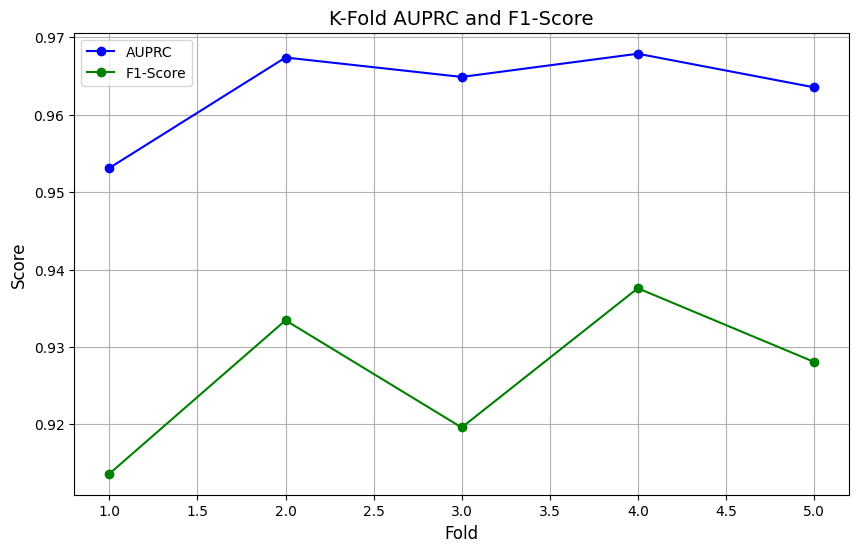

In [120]:
import optuna
import lightgbm as lgb
from sklearn.metrics import precision_recall_curve, auc, f1_score
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold

def calculate_metrics(y_true, y_pred_probs):
    """Calculate AUPRC and F1-Score."""
    precision, recall, thresholds = precision_recall_curve(y_true, y_pred_probs)
    auprc = auc(recall, precision)

    # Convert probabilities to binary predictions using the best threshold
    best_threshold = thresholds[np.argmax(2 * (precision * recall) / (precision + recall + 1e-6))]
    y_pred = (y_pred_probs >= best_threshold).astype(int)
    f1 = f1_score(y_true, y_pred)

    return auprc, f1
import numpy as np
from sklearn.model_selection import KFold
from tqdm import tqdm
import lightgbm as lgb

# Fold별 결과 저장을 위한 리스트
all_fold_results = []

def objective(trial):
    # Define hyperparameters to tune
    params = {
        'objective': 'binary',
        'metric': 'binary_logloss',
        'boosting_type': 'gbdt',
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.005, 0.1, log=True),
        'feature_fraction': trial.suggest_float('feature_fraction', 0.5, 1.0),
        'bagging_fraction': trial.suggest_float('bagging_fraction', 0.5, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 1, 10),
        'max_depth': trial.suggest_int('max_depth', 3, 50),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'random_state': 42
    }

    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    auprc_scores = []
    f1_scores = []

    for train_index, val_index in tqdm(kf.split(X), total=kf.get_n_splits(), desc="K-Fold Progress"):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]

        train_data = lgb.Dataset(X_train, label=y_train)
        val_data = lgb.Dataset(X_val, label=y_val, reference=train_data)

        model = lgb.train(
            params,
            train_data,
            valid_sets=[val_data],
            callbacks=[lgb.early_stopping(50)]
        )

        y_pred_probs = model.predict(X_val)
        auprc, f1 = calculate_metrics(y_val, y_pred_probs)

        auprc_scores.append(auprc)
        f1_scores.append(f1)

    # Fold별 점수 저장
    fold_results = {
        "Fold": list(range(1, kf.get_n_splits() + 1)),
        "AUPRC": auprc_scores,
        "F1-Score": f1_scores
    }
    all_fold_results.append(fold_results)  # 전역 리스트에 저장

    # Return the mean of AUPRC and F1 across all folds as the optimization target
    return (np.mean(auprc_scores) + np.mean(f1_scores)) / 2

#X_train_final, X_test, y_train_final, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train_final, X_val, y_train_final, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, random_state=42)

# Set up Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

# 시각화
# def plot_kfold_metrics(fold_results):
#     """
#     Function Description:
#     Plot K-Fold AUPRC and F1-Score for all folds.
#     """
#     fig, ax = plt.subplots(figsize=(10, 6))

#     folds = fold_results["Fold"]
#     auprc = fold_results["AUPRC"]
#     f1_scores = fold_results["F1-Score"]

#     ax.plot(folds, auprc, marker='o', label="AUPRC", color='blue')
#     ax.plot(folds, f1_scores, marker='o', label="F1-Score", color='green')

#     ax.set_title("K-Fold AUPRC and F1-Score", fontsize=14)
#     ax.set_xlabel("Fold", fontsize=12)
#     ax.set_ylabel("Score", fontsize=12)
#     ax.legend()
#     ax.grid(True)

#     plt.show()


def plot_kfold_metrics(fold_results):
    """
    Function Description:
    Plot K-Fold AUPRC and F1-Score for all folds.
    """
    # Extract the data from the first element (first fold)
    # Assuming all elements in fold_results have the same structure
    first_fold_result = fold_results[0]
    folds = first_fold_result["Fold"]
    auprc_scores = []
    f1_scores = []

    # Extract AUPRC and F1-Score from each fold
    for fold_result in fold_results:
        auprc_scores.extend(fold_result["AUPRC"])
        f1_scores.extend(fold_result["F1-Score"])

    fig, ax = plt.subplots(figsize=(10, 6))

    # Average scores across all folds
    avg_auprc = [np.mean(auprc_scores[i::len(folds)]) for i in range(len(folds))]
    avg_f1 = [np.mean(f1_scores[i::len(folds)]) for i in range(len(folds))]

    ax.plot(folds, avg_auprc, marker='o', label="AUPRC", color='blue')
    ax.plot(folds, avg_f1, marker='o', label="F1-Score", color='green')

    ax.set_title("K-Fold AUPRC and F1-Score", fontsize=14)
    ax.set_xlabel("Fold", fontsize=12)
    ax.set_ylabel("Score", fontsize=12)
    ax.legend()
    ax.grid(True)

    plt.show()

# Print best parameters and validation metrics
best_params = study.best_params
print(f"Best parameters: {best_params}")

# Train the model on the final training set with the best hyperparameters
final_train_data = lgb.Dataset(X_train_final, label=y_train_final)
final_model = lgb.train(study.best_params, final_train_data)

# Evaluate on the test set
y_test_probs = final_model.predict(X_test)
test_auprc, test_f1 = calculate_metrics(y_test, y_test_probs)

print(f"Test AUPRC: {test_auprc:.4f}")
print(f"Test F1-Score: {test_f1:.4f}")

plot_kfold_metrics(all_fold_results)

In [ ]:
train_dataset

,Unnamed__0,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,...,delta_document_sat_o2_t_t1,delta_document_sat_o2_t1_t2,delta_document_sat_o2_t2_t3,delta_document_sat_o2_t3_t4,delta_document_temperatura_t_t1,delta_document_temperatura_t1_t2,delta_document_temperatura_t2_t3,delta_document_temperatura_t3_t4,outcome,train_index
0,0.0,-0.430375,1.0,0.0,-0.130331,0.337252,0.349323,0.368394,0.258938,-0.369058,...,0.202479,0.194332,0.432788,0.012866,-0.144525,-0.024481,0.152412,0.007067,0.0,0
1,1.0,0.230175,1.0,0.0,1.451289,1.601233,1.473310,1.576802,1.397064,-0.369058,...,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0,1
2,2.0,-0.719366,1.0,0.0,0.301020,0.403377,0.349323,0.368394,0.258938,0.025295,...,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0,2
3,3.0,1.716413,1.0,0.0,0.684443,0.823398,0.701822,0.778084,0.820968,-0.106156,...,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,0.0,3
4,4.0,1.262285,0.0,0.0,0.492732,-0.537812,-0.415571,-0.812491,-0.569145,-0.106156,...,0.060615,0.114810,0.672236,-1.299337,-0.144525,-0.024481,0.152412,0.007067,1.0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13647,13647.0,0.643019,1.0,0.0,-1.184744,-0.732271,-0.954112,-0.239590,-0.256581,-0.106156,...,1.636497,-0.833785,0.424839,0.011498,0.584695,-0.350259,-0.725431,-0.005497,0.0,13647
13648,13648.0,1.097147,0.0,0.0,-0.274114,-0.148895,0.112743,1.411926,-0.256581,-0.106156,...,0.004101,0.829661,-0.001954,0.439924,-0.444251,-0.350259,0.012286,0.657215,0.0,13648
13649,13649.0,0.106322,0.0,0.0,-0.513754,-1.218417,-0.165567,0.704134,0.812900,-0.369058,...,0.412200,-0.002062,-2.135920,-0.034930,0.422230,0.526740,-0.214704,-0.985154,0.0,13649
13650,13650.0,1.386138,1.0,0.0,-0.178259,0.094178,0.205513,0.043527,-0.165369,-1.157763,...,-0.812096,-0.417923,-0.001954,0.011498,-1.310733,-0.240634,1.657963,-0.336854,0.0,13650


In [ ]:
#
columns_to_drop = [col for col in train_dataset.columns if 'delta' in col]
plus_data4 = train_dataset.drop(columns=columns_to_drop)
plus_data4.columns

Index(['Unnamed__0', 'age', 'document_sexo', 'UTI',
       'document_freq_cardiaca_t_', 'document_freq_cardiaca_t_1_',
       'document_freq_cardiaca_t_2_', 'document_freq_cardiaca_t_3_',
       'document_freq_cardiaca_t_4_', 'document_freq_respiratoria_t_',
       'document_freq_respiratoria_t_1_', 'document_freq_respiratoria_t_2_',
       'document_freq_respiratoria_t_3_', 'document_freq_respiratoria_t_4_',
       'document_glicemia_capilar_t_', 'document_glicemia_capilar_t_1_',
       'document_glicemia_capilar_t_2_', 'document_glicemia_capilar_t_3_',
       'document_glicemia_capilar_t_4_', 'document_pa_diastolica_t_',
       'document_pa_diastolica_t_1_', 'document_pa_diastolica_t_2_',
       'document_pa_diastolica_t_3_', 'document_pa_diastolica_t_4_',
       'document_pa_sistolica_t_', 'document_pa_sistolica_t_1_',
       'document_pa_sistolica_t_2_', 'document_pa_sistolica_t_3_',
       'document_pa_sistolica_t_4_', 'document_sat_o2_t_',
       'document_sat_o2_t_1_', 'document

In [ ]:
plus_data4.iloc[:, 1:-1]

,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,document_freq_respiratoria_t_1_,...,document_sat_o2_t_1_,document_sat_o2_t_2_,document_sat_o2_t_3_,document_sat_o2_t_4_,document_temperatura_t_,document_temperatura_t_1_,document_temperatura_t_2_,document_temperatura_t_3_,document_temperatura_t_4_,outcome
0,-0.430375,1.0,0.0,-0.130331,0.337252,0.349323,0.368394,0.258938,-0.369058,-0.345064,...,-0.581133,-0.827232,-1.533416,-1.523816,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,0.0
1,0.230175,1.0,0.0,1.451289,1.601233,1.473310,1.576802,1.397064,-0.369058,-0.205898,...,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,0.0
2,-0.719366,1.0,0.0,0.301020,0.403377,0.349323,0.368394,0.258938,0.025295,-0.084457,...,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,0.0
3,1.716413,1.0,0.0,0.684443,0.823398,0.701822,0.778084,0.820968,-0.106156,0.211600,...,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,0.0
4,1.262285,0.0,0.0,0.492732,-0.537812,-0.415571,-0.812491,-0.569145,-0.106156,-0.345064,...,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13647,0.643019,1.0,0.0,-1.184744,-0.732271,-0.954112,-0.239590,-0.256581,-0.106156,-0.901728,...,-1.121290,-0.465565,-0.821943,-0.841938,0.198753,-0.413376,-0.087636,0.577308,0.552616,0.0
13648,1.097147,0.0,0.0,-0.274114,-0.148895,0.112743,1.411926,-0.256581,-0.106156,-0.066732,...,-0.118709,-0.799989,-0.821943,-1.183101,-0.684706,-0.250925,0.073846,0.046749,-0.580154,0.0
13649,0.106322,0.0,0.0,-0.513754,-1.218417,-0.165567,0.704134,0.812900,-0.369058,-0.345064,...,-1.121290,-1.134413,0.535478,0.656811,0.198753,-0.250925,-0.787393,-0.589921,0.332689,0.0
13650,1.386138,1.0,0.0,-0.178259,0.094178,0.205513,0.043527,-0.165369,-1.157763,-2.154221,...,0.215484,0.537705,0.535478,0.522713,-0.353409,0.940383,1.150395,-0.430754,-0.116748,0.0


In [ ]:
test_dataset = plus_data4.iloc[:, 1:-1]

In [ ]:
# test_dataX  = test_dataset.iloc[:, :-1]
test_dataset.iloc[:, :-1]

,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,document_freq_respiratoria_t_1_,...,document_sat_o2_t_,document_sat_o2_t_1_,document_sat_o2_t_2_,document_sat_o2_t_3_,document_sat_o2_t_4_,document_temperatura_t_,document_temperatura_t_1_,document_temperatura_t_2_,document_temperatura_t_3_,document_temperatura_t_4_
0,-0.430375,1.0,0.0,-0.130331,0.337252,0.349323,0.368394,0.258938,-0.369058,-0.345064,...,-0.246188,-0.581133,-0.827232,-1.533416,-1.523816,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898
1,0.230175,1.0,0.0,1.451289,1.601233,1.473310,1.576802,1.397064,-0.369058,-0.205898,...,-0.306453,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898
2,-0.719366,1.0,0.0,0.301020,0.403377,0.349323,0.368394,0.258938,0.025295,-0.084457,...,-0.306453,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898
3,1.716413,1.0,0.0,0.684443,0.823398,0.701822,0.778084,0.820968,-0.106156,0.211600,...,-0.306453,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898
4,1.262285,0.0,0.0,0.492732,-0.537812,-0.415571,-0.812491,-0.569145,-0.106156,-0.345064,...,-0.306453,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13647,0.643019,1.0,0.0,-1.184744,-0.732271,-0.954112,-0.239590,-0.256581,-0.106156,-0.901728,...,0.232931,-1.121290,-0.465565,-0.821943,-0.841938,0.198753,-0.413376,-0.087636,0.577308,0.552616
13648,1.097147,0.0,0.0,-0.274114,-0.148895,0.112743,1.411926,-0.256581,-0.106156,-0.066732,...,-0.099197,-0.118709,-0.799989,-0.821943,-1.183101,-0.684706,-0.250925,0.073846,0.046749,-0.580154
13649,0.106322,0.0,0.0,-0.513754,-1.218417,-0.165567,0.704134,0.812900,-0.369058,-0.345064,...,-0.763453,-1.121290,-1.134413,0.535478,0.656811,0.198753,-0.250925,-0.787393,-0.589921,0.332689
13650,1.386138,1.0,0.0,-0.178259,0.094178,0.205513,0.043527,-0.165369,-1.157763,-2.154221,...,-0.431325,0.215484,0.537705,0.535478,0.522713,-0.353409,0.940383,1.150395,-0.430754,-0.116748


In [ ]:
test_dataY = test_dataset['outcome']
test_dataY

,outcome
0,0.0
1,0.0
2,0.0
3,0.0
4,1.0
...,...
13647,0.0
13648,0.0
13649,0.0
13650,0.0


In [ ]:
# Use Original Data for Test
import optuna
import lightgbm as lgb
from sklearn.metrics import precision_recall_curve, auc, f1_score
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.model_selection import KFold

def calculate_metrics(y_true, y_pred_probs):
    """Calculate AUPRC and F1-Score."""
    precision, recall, thresholds = precision_recall_curve(y_true, y_pred_probs)
    auprc = auc(recall, precision)

    # Convert probabilities to binary predictions using the best threshold
    best_threshold = thresholds[np.argmax(2 * (precision * recall) / (precision + recall + 1e-6))]
    y_pred = (y_pred_probs >= best_threshold).astype(int)
    f1 = f1_score(y_true, y_pred)

    return auprc, f1

def objective(trial):
    # Define hyperparameters to tune
    params = {
        'objective': 'binary',
        'metric': 'binary_logloss',
        'boosting_type': 'gbdt',
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.005, 0.1, log=True),
        'feature_fraction': trial.suggest_float('feature_fraction', 0.5, 1.0),
        'bagging_fraction': trial.suggest_float('bagging_fraction', 0.5, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 1, 10),
        'max_depth': trial.suggest_int('max_depth', 3, 50),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'random_state': 42
    }

    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    auprc_scores = []
    f1_scores = []

    for train_index, val_index in tqdm(kf.split(X), total=kf.get_n_splits(), desc="K-Fold Progress"):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]

        train_data = lgb.Dataset(X_train, label=y_train)
        val_data = lgb.Dataset(X_val, label=y_val, reference=train_data)

        model = lgb.train(
            params,
            train_data,
            valid_sets=[val_data],
            callbacks=[lgb.early_stopping(50)]
        )

        y_pred_probs = model.predict(X_val)
        auprc, f1 = calculate_metrics(y_val, y_pred_probs)

        auprc_scores.append(auprc)
        f1_scores.append(f1)

    # Return the mean of AUPRC and F1 across all folds
    return (np.mean(auprc_scores) + np.mean(f1_scores)) / 2

#X_train_final, X_test, y_train_final, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42) # Train : Val
X_train_final, X_val, y_train_final, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, random_state=42) # Validation : Test

In [ ]:
!pip install --upgrade scikit-learn imbalanced-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 95.7 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.1.3
    Uninstalling scikit-learn-1.1.3:
      Successfully uninstalled scikit-learn-1.1.3


In [ ]:
!pip uninstall scikit-learn imbalanced-learn -y

Found existing installation: scikit-learn 1.6.1
Uninstalling scikit-learn-1.6.1:
  Successfully uninstalled scikit-learn-1.6.1
Found existing installation: imbalanced-learn 0.8.0
Uninstalling imbalanced-learn-0.8.0:
  Successfully uninstalled imbalanced-learn-0.8.0


In [ ]:
!pip install imbalanced-learn==0.8.0

  Using cached imbalanced_learn-0.8.0-py3-none-any.whl.metadata (11 kB)
  Using cached scikit_learn-1.6.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (18 kB)
Using cached imbalanced_learn-0.8.0-py3-none-any.whl (206 kB)
Using cached scikit_learn-1.6.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (13.5 MB)


In [ ]:
!pip install scikit-learn imbalanced-learn --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 238.4/238.4 kB 16.6 MB/s eta 0:00:00
  Attempting uninstall: imbalanced-learn
    Found existing installation: imbalanced-learn 0.8.0
    Uninstalling imbalanced-learn-0.8.0:
      Successfully uninstalled imbalanced-learn-0.8.0


In [ ]:
# Undersampling for test dataset
from imblearn.under_sampling import RandomUnderSampler

undersampler = RandomUnderSampler(sampling_strategy='auto', random_state=42)

X_train_final_resampled, y_train_final_resampled = undersampler.fit_resample(X_train_final, y_train_final)
X_val_resampled, y_val_resampled = undersampler.fit_resample(test_dataset.iloc[:, :-1], test_dataset['outcome'])

ImportError: cannot import name '_fit_context' from 'sklearn.base' (/usr/local/lib/python3.11/dist-packages/sklearn/base.py)

In [ ]:
# Set up Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

# Print best parameters and validation metrics
best_params = study.best_params
print(f"Best parameters: {best_params}")

# Train the model on the final training set with the best hyperparameters
final_train_data = lgb.Dataset(X_train_final, label=y_train_final)
final_model = lgb.train(study.best_params, final_train_data)

# Evaluate on the test set
y_test_probs = final_model.predict(X_test)
test_auprc, test_f1 = calculate_metrics(y_test, y_test_probs)

print(f"Test AUPRC: {test_auprc:.4f}")
print(f"Test F1-Score: {test_f1:.4f}")

In [ ]:
# import optuna
# import lightgbm as lgb
# from sklearn.metrics import precision_recall_curve, auc, f1_score
# from sklearn.model_selection import train_test_split
# import numpy as np
# from sklearn.model_selection import KFold

# # Function for Metrics(AUPRC, F1-Score)
# def calculate_metrics(y_true, y_pred_probs):
#     """
#     Function Description:
#     Calculate AUPRC and F1-Score.
#     """
#     precision, recall, thresholds = precision_recall_curve(y_true, y_pred_probs)
#     auprc = auc(recall, precision)

#     # Convert probabilities -> binary predictions using the best threshold
#     best_threshold = thresholds[np.argmax(2 * (precision * recall) / (precision + recall + 1e-6))]
#     y_pred = (y_pred_probs >= best_threshold).astype(int)
#     f1 = f1_score(y_true, y_pred)
#     return auprc, f1

# # Modeling by using Optuna
# def objective(trial):
#     # Define hyperparameters to tune
#     params = {
#         'objective': 'binary',
#         'metric': 'binary_logloss',
#         'boosting_type': 'gbdt',
#         'num_leaves': trial.suggest_int('num_leaves', 20, 100),
#         'learning_rate': trial.suggest_float('learning_rate', 0.005, 0.1, log=True),
#         'feature_fraction': trial.suggest_float('feature_fraction', 0.5, 1.0),
#         'bagging_fraction': trial.suggest_float('bagging_fraction', 0.5, 1.0),
#         'bagging_freq': trial.suggest_int('bagging_freq', 1, 10),
#         'max_depth': trial.suggest_int('max_depth', 3, 50),
#         'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
#         'random_state': 42
#     }

#     # Use 5-Fold CV
#     kf = KFold(n_splits=5, shuffle=True, random_state=42)
#     auprc_scores = []
#     f1_scores = []
#     for train_index, val_index in tqdm(kf.split(X), total=kf.get_n_splits(), desc="K-Fold Progress"):
#         X_train, X_val = X.iloc[train_index], X.iloc[val_index]
#         y_train, y_val = y.iloc[train_index], y.iloc[val_index]
#         train_data = lgb.Dataset(X_train, label=y_train)
#         val_data = lgb.Dataset(X_val, label=y_val, reference=train_data)
#         model = lgb.train(
#             params,
#             train_data,
#             valid_sets=[val_data],
#             callbacks=[lgb.early_stopping(50)]
#         )
#         y_pred_probs = model.predict(X_val)
#         auprc, f1 = calculate_metrics(y_val, y_pred_probs)
#         auprc_scores.append(auprc)
#         f1_scores.append(f1)

#     # Return the mean of AUPRC and F1 across all folds
#     return (np.mean(auprc_scores) + np.mean(f1_scores)) / 2

# X_train_final, X_test, y_train_final, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Set up for Optuna study
# study = optuna.create_study(direction='maximize')
# study.optimize(objective, n_trials=100)

# # Print the best Parameters and Validation metrics
# best_params = study.best_params
# print(f"Best parameters: {best_params}")

# # Train the model on the final training set with the best hyperparameters
# final_train_data = lgb.Dataset(X_train_final, label=y_train_final)
# final_model = lgb.train(study.best_params, final_train_data)

# # Evaluate on the test set
# y_test_probs = final_model.predict(X_test)
# test_auprc, test_f1 = calculate_metrics(y_test, y_test_probs)
# print(f"Test AUPRC: {test_auprc:.4f}")
# print(f"Test F1-Score: {test_f1:.4f}")

In [ ]:
X_train

,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,document_freq_respiratoria_t_1_,...,document_sat_o2_t_,document_sat_o2_t_1_,document_sat_o2_t_2_,document_sat_o2_t_3_,document_sat_o2_t_4_,document_temperatura_t_,document_temperatura_t_1_,document_temperatura_t_2_,document_temperatura_t_3_,document_temperatura_t_4_
9601,0.725588,1.0,0.0,0.828227,-0.732271,-0.683442,-0.812491,-0.569145,-0.106156,-0.066732,...,-0.431325,0.215484,-0.081986,-0.632700,-0.412283,-0.022112,-0.575827,0.842520,0.444920,0.517788
11942,-1.338632,0.0,0.0,0.061381,0.337252,-0.165567,-0.098031,0.427507,0.025295,0.072434,...,-0.099197,-0.118709,0.203282,0.196123,-0.841938,1.247861,-0.250925,0.935086,0.418140,0.398148
7648,0.436597,1.0,0.0,-0.417898,-0.683656,-1.000497,-0.711451,-0.849457,-0.369058,-0.066732,...,0.316036,0.215484,0.203282,0.196123,0.522713,-0.022112,-0.413376,-0.572083,-0.112419,0.398148
4228,0.890725,1.0,0.0,-0.705465,-1.218417,-1.325192,-1.183313,-1.259909,-0.237607,-0.345064,...,-0.431325,-0.452903,-0.465565,-0.821943,-0.841938,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898
11307,-0.554228,0.0,0.0,-1.232671,-0.683656,-1.093267,-1.155258,-1.230070,-0.369058,-0.345064,...,0.232931,0.215484,0.537705,0.625333,0.656811,0.364402,0.615481,1.311878,0.790911,-0.009993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13078,0.519166,1.0,0.0,-0.513754,-0.246124,-0.351107,-0.900196,-0.165369,-0.106156,-0.345064,...,-0.099197,-1.121290,-0.131142,-0.143232,0.522713,0.695699,-0.250925,-0.087636,0.736475,-0.271216
11331,1.097147,0.0,0.0,-0.465826,-0.829500,-0.258337,-0.192404,-0.302186,-0.500509,-0.623396,...,0.565059,-1.455483,-0.799989,-0.482588,-0.500775,0.198753,-0.250925,0.289156,-0.271586,-0.116748
4784,-0.182669,1.0,0.0,0.157237,0.235984,0.318940,0.368394,0.258938,-0.106156,-0.016105,...,-0.306453,-0.466404,-0.321086,-1.144236,-0.140941,-0.395762,-0.179026,-0.200408,-0.290315,-0.232898
13521,-0.554228,1.0,0.0,0.636515,0.872013,0.701822,0.778084,0.820968,-0.237607,-0.345064,...,-1.759838,-1.455483,-1.208205,-1.551375,-1.523816,-0.353409,0.290579,0.169192,0.143689,-0.106572


In [ ]:
#X_train.shape
#X_val.shape
X_test.shape

(720, 38)

---

In [ ]:
X

,age,document_sexo,UTI,document_freq_cardiaca_t_,document_freq_cardiaca_t_1_,document_freq_cardiaca_t_2_,document_freq_cardiaca_t_3_,document_freq_cardiaca_t_4_,document_freq_respiratoria_t_,document_freq_respiratoria_t_1_,...,document_sat_o2_t_,document_sat_o2_t_1_,document_sat_o2_t_2_,document_sat_o2_t_3_,document_sat_o2_t_4_,document_temperatura_t_,document_temperatura_t_1_,document_temperatura_t_2_,document_temperatura_t_3_,document_temperatura_t_4_
7739,-1.132210,1.0,0.0,-0.369970,-0.878114,-0.683442,-0.812491,-0.569145,0.025295,-0.484230,...,0.232931,0.240023,-0.376273,-0.040343,-0.406865,0.364402,0.453030,0.506020,0.419857,0.517788
7551,-1.132210,1.0,0.0,0.157237,-0.586427,-0.415571,-0.812491,-0.569145,0.288197,-0.066732,...,0.565059,0.549678,-0.373594,-0.040343,-0.406865,1.082213,0.777932,0.000081,-0.097609,-0.178545
10476,-1.090925,1.0,0.0,-0.034475,-0.391968,-0.258337,-0.333962,-0.712639,0.288197,0.072434,...,0.565059,0.549678,-0.465565,0.196123,0.522713,0.695699,1.481886,0.773603,0.577308,1.067512
12233,-1.173494,1.0,0.0,-0.561681,-1.072573,-0.026412,0.002472,-0.135812,0.156746,-0.066732,...,0.897187,0.549678,0.203282,0.261002,0.305492,0.364402,-0.413376,-0.087636,-0.295943,-0.232898
9520,-1.256063,1.0,0.0,-0.130331,0.191408,-0.536647,-0.381148,0.017055,0.156746,-0.066732,...,0.897187,0.883871,0.872129,0.535478,0.863875,1.082213,0.290579,0.073846,1.107866,0.037721
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,0.354028,1.0,0.0,-2.095373,-0.732271,-0.583032,-0.003659,1.339625,0.288197,-0.205898,...,-2.091966,-0.118709,0.537705,1.214189,1.205038,-3.887247,-1.117330,-0.948875,-3.348827,-1.764413
13584,0.023753,1.0,1.0,0.924082,-0.732271,-0.861342,-0.853010,-0.849457,-0.106156,-0.901728,...,-0.099197,-2.123870,-1.468836,-1.161298,-1.183101,-0.353409,-5.124456,-5.416554,-5.364950,-5.214212
13590,0.023753,1.0,0.0,-1.711950,-0.294739,0.715748,-0.192404,0.381902,0.156746,-0.345064,...,-0.431325,-2.123870,-2.137683,-0.821943,-0.841938,-2.120328,-1.442232,-1.433322,-0.961312,-1.764413
13623,0.643019,1.0,0.0,0.348948,-0.197509,0.437438,0.798506,0.655537,-0.369058,-0.345064,...,-2.091966,0.549678,0.872129,-2.518719,-2.206589,-1.568166,0.777932,0.612121,-1.969374,0.398148


In [ ]:
from sklearn.model_selection import LeaveOneOut
from sklearn.metrics import roc_auc_score

# LOOCV 정의
loo = LeaveOneOut()

def calculate_metrics(y_true, y_pred_probs):
    """Calculate AUPRC and F1-Score."""
    precision, recall, thresholds = precision_recall_curve(y_true, y_pred_probs)
    auprc = auc(recall, precision)

    best_threshold = thresholds[np.argmax(2 * (precision * recall) / (precision + recall + 1e-6))]
    y_pred = (y_pred_probs >= best_threshold).astype(int)
    f1 = f1_score(y_true, y_pred)

    return auprc, f1

def loocv_objective(trial):
    params = {
        'objective': 'binary',
        'metric': 'binary_logloss',
        'boosting_type': 'gbdt',
        'num_leaves': trial.suggest_int('num_leaves', 20, 150),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
        'feature_fraction': trial.suggest_uniform('feature_fraction', 0.5, 1.0),
        'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.5, 1.0),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'random_state': 42
    }

    auprc_scores = []
    f1_scores = []

    # LOOCV 진행
    for train_idx, val_idx in loo.split(X):
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        # LightGBM Dataset
        train_data = lgb.Dataset(X_train, label=y_train)

        # 모델 학습
        model = lgb.train(params, train_data, verbose_eval=False)

        # 예측 및 AUC 계산
        y_pred = model.predict(X_val)
        auprc, f1 = calculate_metrics(y_val, y_pred)

        auprc_scores.append(auprc)
        f1_scores.append(f1)

    # LOOCV 평균 AUC 반환
    return np.mean(auprc_scores) + np.mean(f1_scores)

# LOOCV 기반 Optuna 실행
study = optuna.create_study(direction='maximize')
study.optimize(loocv_objective, n_trials=50)

print("Best params:", study.best_params)
print("")

In [ ]:
import tqdm

In [ ]:
from sklearn.model_selection import LeaveOneOut
from sklearn.metrics import precision_recall_curve, auc, f1_score
import lightgbm as lgb
import numpy as np
from tqdm import tqdm

# LOOCV 정의
loo = LeaveOneOut()

def calculate_metrics(y_true, y_pred_probs):
    """Calculate AUPRC and F1-Score."""
    precision, recall, thresholds = precision_recall_curve(y_true, y_pred_probs)
    auprc = auc(recall, precision)

    # F1-Score 계산
    best_threshold = thresholds[np.argmax(2 * (precision * recall) / (precision + recall + 1e-6))]
    y_pred = (y_pred_probs >= best_threshold).astype(int)
    f1 = f1_score(y_true, y_pred)

    return auprc, f1

def loocv_objective(trial):
    params = {
        'objective': 'binary',
        'metric': 'binary_logloss',
        'boosting_type': 'gbdt',
        'num_leaves': trial.suggest_int('num_leaves', 20, 150),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
        'feature_fraction': trial.suggest_uniform('feature_fraction', 0.5, 1.0),
        'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.5, 1.0),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'random_state': 42
    }

    auprc_scores = []
    f1_scores = []

    # LOOCV 진행
    for train_idx, val_idx in tqdm(loo.split(X), desc = "LOOCV Progress", total = len(X)):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

        # LightGBM Dataset
        train_data = lgb.Dataset(X_train, label=y_train)

        # 모델 학습
        model = lgb.train(params, train_data)#, verbose_eval=False)

        # 예측 및 AUPRC, F1-Score 계산
        y_pred_probs = model.predict(X_val)
        auprc, f1 = calculate_metrics(y_val, y_pred_probs)

        auprc_scores.append(auprc)
        f1_scores.append(f1)

    # LOOCV 평균 AUPRC와 F1-Score 반환
    return np.mean(auprc_scores) + np.mean(f1_scores)

# LOOCV 기반 Optuna 실행
study = optuna.create_study(direction='maximize')
study.optimize(loocv_objective, n_trials=50)

# 최적 파라미터 출력
print("Best params:", study.best_params)

# 최적 파라미터로 모델 학습
best_params = study.best_params
params = {
    'objective': 'binary',
    'metric': 'binary_logloss',
    'boosting_type': 'gbdt',
    'num_leaves': best_params['num_leaves'],
    'learning_rate': best_params['learning_rate'],
    'feature_fraction': best_params['feature_fraction'],
    'bagging_fraction': best_params['bagging_fraction'],
    'min_child_samples': best_params['min_child_samples'],
    'random_state': 42
}

# 전체 데이터로 학습 (Test용 데이터 포함)
train_data = lgb.Dataset(X, label=y)
model = lgb.train(params, train_data, verbose_eval=False)

# 예측 및 AUPRC, F1-Score 계산 (테스트 데이터에 대해)
y_pred_probs_test = model.predict(X_test)  # X_test는 테스트 데이터
auprc_test, f1_test = calculate_metrics(y_test, y_pred_probs_test)  # y_test는 테스트 라벨

print(f"Test AUPRC: {auprc_test}")
print(f"Test F1-Score: {f1_test}")


[I 2025-01-21 19:46:06,035] A new study created in memory with name: no-name-76e349b9-01b6-4669-8793-8cd4f4113588
LOOCV Progress:   0%|          | 0/4506 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   0%|          | 1/4506 [00:00<26:58,  2.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   0%|          | 2/4506 [00:00<36:47,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001087 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   0%|          | 3/4506 [00:01<38:38,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   0%|          | 4/4506 [00:01<35:33,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   0%|          | 5/4506 [00:02<34:52,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   0%|          | 6/4506 [00:02<33:12,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   0%|          | 7/4506 [00:05<1:27:53,  1.17s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   0%|          | 8/4506 [00:05<1:07:47,  1.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   0%|          | 9/4506 [00:06<1:10:13,  1.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   0%|          | 10/4506 [00:07<54:52,  1.37it/s] 

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   0%|          | 12/4506 [00:07<35:13,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   0%|          | 14/4506 [00:07<23:37,  3.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   0%|          | 16/4506 [00:08<18:53,  3.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   0%|          | 18/4506 [00:08<16:24,  4.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   0%|          | 20/4506 [00:08<14:25,  5.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   0%|          | 22/4506 [00:09<14:12,  5.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   1%|          | 23/4506 [00:09<13:54,  5.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   1%|          | 25/4506 [00:09<13:28,  5.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   1%|          | 27/4506 [00:10<13:26,  5.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   1%|          | 29/4506 [00:10<13:55,  5.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   1%|          | 31/4506 [00:10<13:26,  5.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   1%|          | 33/4506 [00:11<13:54,  5.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   1%|          | 34/4506 [00:11<13:42,  5.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   1%|          | 36/4506 [00:11<13:23,  5.57it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   1%|          | 37/4506 [00:12<13:15,  5.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   1%|          | 39/4506 [00:12<14:38,  5.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   1%|          | 40/4506 [00:12<14:12,  5.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   1%|          | 42/4506 [00:13<14:02,  5.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   1%|          | 44/4506 [00:13<14:16,  5.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   1%|          | 45/4506 [00:13<14:00,  5.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   1%|          | 47/4506 [00:13<13:31,  5.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   1%|          | 49/4506 [00:14<13:10,  5.64it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   1%|          | 51/4506 [00:14<13:42,  5.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   1%|          | 53/4506 [00:15<13:24,  5.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   1%|          | 55/4506 [00:15<13:28,  5.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705


LOOCV Progress:   1%|          | 56/4506 [00:15<13:55,  5.32it/s]

[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   1%|▏         | 58/4506 [00:15<13:21,  5.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   1%|▏         | 60/4506 [00:16<13:16,  5.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:   1%|▏         | 62/4506 [00:16<14:19,  5.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   1%|▏         | 64/4506 [00:17<13:37,  5.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   1%|▏         | 65/4506 [00:17<13:46,  5.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   1%|▏         | 66/4506 [00:17<15:12,  4.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001837 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   1%|▏         | 67/4506 [00:18<33:53,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   2%|▏         | 68/4506 [00:18<31:50,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   2%|▏         | 69/4506 [00:20<46:19,  1.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   2%|▏         | 70/4506 [00:20<40:46,  1.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   2%|▏         | 71/4506 [00:21<53:36,  1.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   2%|▏         | 73/4506 [00:21<34:45,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   2%|▏         | 75/4506 [00:22<23:45,  3.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   2%|▏         | 77/4506 [00:22<19:01,  3.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823

LOOCV Progress:   2%|▏         | 78/4506 [00:22<17:12,  4.29it/s]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] 

LOOCV Progress:   2%|▏         | 80/4506 [00:23<15:00,  4.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   2%|▏         | 82/4506 [00:23<14:07,  5.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   2%|▏         | 84/4506 [00:23<13:54,  5.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   2%|▏         | 86/4506 [00:24<13:27,  5.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   2%|▏         | 88/4506 [00:24<14:11,  5.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   2%|▏         | 89/4506 [00:24<13:37,  5.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   2%|▏         | 91/4506 [00:25<13:21,  5.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   2%|▏         | 93/4506 [00:25<13:19,  5.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   2%|▏         | 95/4506 [00:26<13:39,  5.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   2%|▏         | 97/4506 [00:26<13:33,  5.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   2%|▏         | 99/4506 [00:26<13:31,  5.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000639 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:   2%|▏         | 101/4506 [00:27<14:08,  5.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001724 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   2%|▏         | 103/4506 [00:27<13:41,  5.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000743 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   2%|▏         | 105/4506 [00:27<14:01,  5.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   2%|▏         | 106/4506 [00:28<13:41,  5.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   2%|▏         | 108/4506 [00:28<13:35,  5.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   2%|▏         | 110/4506 [00:28<13:10,  5.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008185 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:   2%|▏         | 111/4506 [00:29<14:35,  5.02it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   2%|▏         | 112/4506 [00:29<13:58,  5.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   3%|▎         | 114/4506 [00:29<13:36,  5.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   3%|▎         | 115/4506 [00:29<13:31,  5.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000531 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   3%|▎         | 117/4506 [00:30<14:31,  5.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   3%|▎         | 119/4506 [00:30<13:53,  5.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   3%|▎         | 121/4506 [00:30<14:09,  5.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   3%|▎         | 122/4506 [00:31<13:46,  5.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   3%|▎         | 124/4506 [00:31<13:22,  5.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   3%|▎         | 126/4506 [00:31<14:03,  5.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   3%|▎         | 127/4506 [00:32<16:02,  4.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   3%|▎         | 128/4506 [00:33<33:22,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   3%|▎         | 129/4506 [00:34<50:02,  1.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   3%|▎         | 130/4506 [00:34<42:47,  1.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   3%|▎         | 131/4506 [00:35<37:26,  1.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   3%|▎         | 133/4506 [00:36<40:28,  1.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   3%|▎         | 134/4506 [00:36<32:23,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.107862 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   3%|▎         | 136/4506 [00:37<28:07,  2.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   3%|▎         | 138/4506 [00:38<24:53,  2.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   3%|▎         | 140/4506 [00:38<19:42,  3.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   3%|▎         | 142/4506 [00:38<16:35,  4.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   3%|▎         | 144/4506 [00:39<14:52,  4.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   3%|▎         | 146/4506 [00:39<14:18,  5.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   3%|▎         | 148/4506 [00:39<13:46,  5.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   3%|▎         | 149/4506 [00:40<13:38,  5.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   3%|▎         | 151/4506 [00:40<13:51,  5.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   3%|▎         | 153/4506 [00:40<13:34,  5.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   3%|▎         | 155/4506 [00:41<13:26,  5.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   3%|▎         | 157/4506 [00:41<13:26,  5.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   4%|▎         | 159/4506 [00:41<13:14,  5.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   4%|▎         | 161/4506 [00:42<13:48,  5.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   4%|▎         | 162/4506 [00:42<13:27,  5.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   4%|▎         | 164/4506 [00:42<13:13,  5.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   4%|▎         | 166/4506 [00:43<13:11,  5.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   4%|▎         | 168/4506 [00:43<13:24,  5.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   4%|▍         | 170/4506 [00:44<13:21,  5.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   4%|▍         | 172/4506 [00:44<13:44,  5.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   4%|▍         | 173/4506 [00:44<13:21,  5.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   4%|▍         | 175/4506 [00:44<12:57,  5.57it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   4%|▍         | 177/4506 [00:45<12:45,  5.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   4%|▍         | 178/4506 [00:45<13:42,  5.26it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823

LOOCV Progress:   4%|▍         | 179/4506 [00:45<13:43,  5.26it/s]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] 

LOOCV Progress:   4%|▍         | 181/4506 [00:46<13:13,  5.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   4%|▍         | 182/4506 [00:46<13:43,  5.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   4%|▍         | 183/4506 [00:46<15:44,  4.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003362 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   4%|▍         | 184/4506 [00:47<32:22,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   4%|▍         | 185/4506 [00:48<49:36,  1.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   4%|▍         | 186/4506 [00:49<44:08,  1.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   4%|▍         | 187/4506 [00:49<39:06,  1.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   4%|▍         | 189/4506 [00:50<39:32,  1.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   4%|▍         | 191/4506 [00:51<25:48,  2.79it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   4%|▍         | 193/4506 [00:51<19:12,  3.74it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:   4%|▍         | 194/4506 [00:51<18:48,  3.82it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   4%|▍         | 195/4506 [00:52<16:55,  4.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   4%|▍         | 197/4506 [00:52<14:44,  4.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   4%|▍         | 199/4506 [00:52<14:15,  5.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:   4%|▍         | 200/4506 [00:52<14:02,  5.11it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [

LOOCV Progress:   4%|▍         | 202/4506 [00:53<13:25,  5.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▍         | 204/4506 [00:53<12:58,  5.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▍         | 206/4506 [00:54<13:09,  5.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▍         | 208/4506 [00:54<13:06,  5.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▍         | 210/4506 [00:54<13:29,  5.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   5%|▍         | 211/4506 [00:54<13:27,  5.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▍         | 213/4506 [00:55<13:16,  5.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▍         | 215/4506 [00:55<12:57,  5.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▍         | 217/4506 [00:56<13:21,  5.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▍         | 219/4506 [00:56<13:17,  5.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▍         | 221/4506 [00:56<13:34,  5.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   5%|▍         | 222/4506 [00:57<13:37,  5.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▍         | 224/4506 [00:57<13:19,  5.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▌         | 226/4506 [00:57<12:56,  5.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▌         | 228/4506 [00:58<13:12,  5.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▌         | 230/4506 [00:58<13:07,  5.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▌         | 232/4506 [00:58<13:25,  5.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▌         | 234/4506 [00:59<13:05,  5.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▌         | 236/4506 [00:59<13:07,  5.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▌         | 238/4506 [01:00<13:28,  5.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   5%|▌         | 239/4506 [01:00<13:23,  5.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▌         | 241/4506 [01:00<13:09,  5.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   5%|▌         | 242/4506 [01:00<13:28,  5.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   5%|▌         | 243/4506 [01:01<15:03,  4.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   5%|▌         | 244/4506 [01:01<29:42,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   5%|▌         | 245/4506 [01:02<29:47,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   5%|▌         | 246/4506 [01:03<44:38,  1.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   5%|▌         | 247/4506 [01:03<40:53,  1.74it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   6%|▌         | 248/4506 [01:04<51:45,  1.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   6%|▌         | 250/4506 [01:05<33:12,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   6%|▌         | 252/4506 [01:05<22:23,  3.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   6%|▌         | 254/4506 [01:06<18:14,  3.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000730 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   6%|▌         | 255/4506 [01:06<16:41,  4.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   6%|▌         | 257/4506 [01:06<14:28,  4.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   6%|▌         | 259/4506 [01:07<13:31,  5.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   6%|▌         | 261/4506 [01:07<13:25,  5.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   6%|▌         | 263/4506 [01:07<13:56,  5.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   6%|▌         | 264/4506 [01:08<14:52,  4.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   6%|▌         | 265/4506 [01:09<30:53,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   6%|▌         | 266/4506 [01:09<30:33,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   6%|▌         | 267/4506 [01:10<48:27,  1.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   6%|▌         | 268/4506 [01:11<40:50,  1.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   6%|▌         | 269/4506 [01:11<47:32,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   6%|▌         | 271/4506 [01:12<31:47,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   6%|▌         | 273/4506 [01:12<21:48,  3.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   6%|▌         | 274/4506 [01:13<19:08,  3.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002043 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   6%|▌         | 275/4506 [01:13<18:22,  3.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   6%|▌         | 277/4506 [01:13<15:54,  4.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   6%|▌         | 279/4506 [01:14<14:14,  4.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   6%|▌         | 281/4506 [01:14<14:14,  4.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   6%|▋         | 282/4506 [01:14<13:37,  5.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   6%|▋         | 284/4506 [01:14<12:52,  5.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   6%|▋         | 285/4506 [01:15<13:00,  5.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   6%|▋         | 286/4506 [01:15<13:56,  5.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   6%|▋         | 287/4506 [01:15<15:57,  4.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.120418 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   6%|▋         | 288/4506 [01:16<33:56,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   6%|▋         | 289/4506 [01:18<51:24,  1.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   6%|▋         | 290/4506 [01:18<42:41,  1.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   6%|▋         | 291/4506 [01:19<50:16,  1.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   7%|▋         | 293/4506 [01:19<33:23,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   7%|▋         | 295/4506 [01:20<22:48,  3.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   7%|▋         | 297/4506 [01:20<17:30,  4.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   7%|▋         | 299/4506 [01:20<15:16,  4.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   7%|▋         | 301/4506 [01:21<13:43,  5.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   7%|▋         | 303/4506 [01:21<13:26,  5.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   7%|▋         | 305/4506 [01:22<12:54,  5.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   7%|▋         | 307/4506 [01:22<12:51,  5.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   7%|▋         | 309/4506 [01:22<13:01,  5.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   7%|▋         | 310/4506 [01:22<12:52,  5.43it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   7%|▋         | 312/4506 [01:23<12:36,  5.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:   7%|▋         | 314/4506 [01:23<13:44,  5.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   7%|▋         | 315/4506 [01:23<13:18,  5.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   7%|▋         | 317/4506 [01:24<13:04,  5.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   7%|▋         | 319/4506 [01:24<12:54,  5.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   7%|▋         | 321/4506 [01:25<12:53,  5.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   7%|▋         | 323/4506 [01:25<12:48,  5.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   7%|▋         | 325/4506 [01:25<13:07,  5.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38


LOOCV Progress:   7%|▋         | 326/4506 [01:25<12:58,  5.37it/s]

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   7%|▋         | 328/4506 [01:26<12:41,  5.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   7%|▋         | 330/4506 [01:26<12:42,  5.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   7%|▋         | 332/4506 [01:27<12:59,  5.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   7%|▋         | 334/4506 [01:27<13:10,  5.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   7%|▋         | 335/4506 [01:27<13:04,  5.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   7%|▋         | 337/4506 [01:27<13:01,  5.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   8%|▊         | 339/4506 [01:28<12:51,  5.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   8%|▊         | 341/4506 [01:28<12:43,  5.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   8%|▊         | 343/4506 [01:29<12:47,  5.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   8%|▊         | 345/4506 [01:29<12:37,  5.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   8%|▊         | 346/4506 [01:29<13:07,  5.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   8%|▊         | 347/4506 [01:29<14:36,  4.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002713 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   8%|▊         | 348/4506 [01:30<28:56,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   8%|▊         | 349/4506 [01:31<28:49,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   8%|▊         | 350/4506 [01:32<43:25,  1.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   8%|▊         | 351/4506 [01:32<38:30,  1.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   8%|▊         | 352/4506 [01:33<47:27,  1.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   8%|▊         | 354/4506 [01:34<31:56,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   8%|▊         | 356/4506 [01:34<21:50,  3.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   8%|▊         | 358/4506 [01:34<16:56,  4.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   8%|▊         | 360/4506 [01:35<15:07,  4.57it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   8%|▊         | 362/4506 [01:35<13:41,  5.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   8%|▊         | 364/4506 [01:36<13:32,  5.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   8%|▊         | 365/4506 [01:36<13:20,  5.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   8%|▊         | 367/4506 [01:36<13:28,  5.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   8%|▊         | 369/4506 [01:37<12:56,  5.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   8%|▊         | 371/4506 [01:37<13:03,  5.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   8%|▊         | 373/4506 [01:37<12:33,  5.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   8%|▊         | 375/4506 [01:38<12:52,  5.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   8%|▊         | 376/4506 [01:38<13:03,  5.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   8%|▊         | 377/4506 [01:38<12:54,  5.33it/s]


[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   8%|▊         | 379/4506 [01:38<12:48,  5.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   8%|▊         | 380/4506 [01:39<12:43,  5.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   8%|▊         | 382/4506 [01:39<13:06,  5.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   9%|▊         | 384/4506 [01:39<12:32,  5.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   9%|▊         | 386/4506 [01:40<12:57,  5.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   9%|▊         | 387/4506 [01:40<13:01,  5.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   9%|▊         | 389/4506 [01:40<12:30,  5.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   9%|▊         | 391/4506 [01:41<12:23,  5.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   9%|▊         | 393/4506 [01:41<12:54,  5.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   9%|▉         | 395/4506 [01:41<12:24,  5.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   9%|▉         | 397/4506 [01:42<12:43,  5.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:   9%|▉         | 399/4506 [01:42<12:57,  5.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   9%|▉         | 401/4506 [01:43<12:42,  5.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   9%|▉         | 403/4506 [01:43<13:05,  5.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   9%|▉         | 404/4506 [01:43<12:45,  5.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   9%|▉         | 406/4506 [01:43<12:17,  5.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   9%|▉         | 407/4506 [01:44<12:47,  5.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   9%|▉         | 408/4506 [01:44<14:31,  4.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   9%|▉         | 409/4506 [01:45<27:41,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   9%|▉         | 410/4506 [01:45<27:58,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   9%|▉         | 411/4506 [01:46<43:03,  1.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   9%|▉         | 412/4506 [01:47<38:22,  1.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   9%|▉         | 413/4506 [01:48<43:59,  1.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   9%|▉         | 414/4506 [01:48<36:44,  1.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   9%|▉         | 416/4506 [01:48<25:30,  2.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   9%|▉         | 418/4506 [01:49<18:36,  3.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   9%|▉         | 420/4506 [01:49<15:47,  4.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   9%|▉         | 422/4506 [01:49<13:42,  4.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   9%|▉         | 424/4506 [01:50<12:47,  5.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   9%|▉         | 426/4506 [01:50<12:54,  5.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:   9%|▉         | 428/4506 [01:50<12:12,  5.57it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  10%|▉         | 430/4506 [01:51<12:36,  5.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  10%|▉         | 431/4506 [01:51<12:54,  5.26it/s]


[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

LOOCV Progress:  10%|▉         | 432/4506 [01:51<12:39,  5.37it/s]


[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  10%|▉         | 434/4506 [01:52<12:14,  5.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  10%|▉         | 436/4506 [01:52<12:11,  5.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.


LOOCV Progress:  10%|▉         | 437/4506 [01:52<13:03,  5.19it/s]

[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  10%|▉         | 438/4506 [01:52<12:43,  5.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  10%|▉         | 440/4506 [01:53<12:20,  5.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  10%|▉         | 442/4506 [01:53<12:26,  5.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  10%|▉         | 444/4506 [01:53<12:23,  5.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  10%|▉         | 446/4506 [01:54<12:21,  5.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  10%|▉         | 448/4506 [01:54<12:43,  5.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  10%|▉         | 449/4506 [01:54<12:30,  5.40it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000722 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [

LOOCV Progress:  10%|█         | 451/4506 [01:55<12:41,  5.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  10%|█         | 453/4506 [01:55<12:28,  5.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  10%|█         | 455/4506 [01:56<12:23,  5.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  10%|█         | 457/4506 [01:56<12:29,  5.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  10%|█         | 459/4506 [01:56<12:44,  5.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38


LOOCV Progress:  10%|█         | 460/4506 [01:56<12:29,  5.40it/s]

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  10%|█         | 462/4506 [01:57<12:19,  5.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  10%|█         | 464/4506 [01:57<13:32,  4.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  10%|█         | 466/4506 [01:58<12:40,  5.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  10%|█         | 468/4506 [01:58<12:58,  5.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  10%|█         | 469/4506 [01:58<14:03,  4.79it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  10%|█         | 470/4506 [01:59<27:39,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  10%|█         | 471/4506 [02:00<30:23,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114531 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  10%|█         | 472/4506 [02:01<44:53,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002690 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  10%|█         | 473/4506 [02:01<37:54,  1.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  11%|█         | 474/4506 [02:02<44:48,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  11%|█         | 476/4506 [02:03<29:52,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  11%|█         | 478/4506 [02:03<20:39,  3.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  11%|█         | 480/4506 [02:03<16:02,  4.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  11%|█         | 482/4506 [02:04<14:05,  4.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  11%|█         | 484/4506 [02:04<13:04,  5.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  11%|█         | 486/4506 [02:04<12:16,  5.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  11%|█         | 488/4506 [02:05<12:19,  5.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  11%|█         | 490/4506 [02:05<12:18,  5.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  11%|█         | 492/4506 [02:05<12:00,  5.57it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  11%|█         | 494/4506 [02:06<12:30,  5.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  11%|█         | 496/4506 [02:06<12:12,  5.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  11%|█         | 498/4506 [02:07<12:20,  5.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000743 seconds.
You can set `force_col_wise=true` to remove the overhead.

LOOCV Progress:  11%|█         | 499/4506 [02:07<12:19,  5.42it/s]


[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  11%|█         | 501/4506 [02:07<12:13,  5.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  11%|█         | 502/4506 [02:07<12:30,  5.34it/s]


[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  11%|█         | 503/4506 [02:07<12:22,  5.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  11%|█         | 505/4506 [02:08<13:32,  4.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  11%|█         | 506/4506 [02:08<13:06,  5.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  11%|█▏        | 508/4506 [02:08<12:18,  5.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  11%|█▏        | 510/4506 [02:09<12:31,  5.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  11%|█▏        | 512/4506 [02:09<12:09,  5.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  11%|█▏        | 514/4506 [02:10<11:45,  5.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  11%|█▏        | 516/4506 [02:10<12:28,  5.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  11%|█▏        | 518/4506 [02:10<12:06,  5.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  12%|█▏        | 520/4506 [02:11<12:02,  5.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  12%|█▏        | 522/4506 [02:11<12:04,  5.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  12%|█▏        | 524/4506 [02:11<11:54,  5.57it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  12%|█▏        | 526/4506 [02:12<12:16,  5.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38


LOOCV Progress:  12%|█▏        | 527/4506 [02:12<12:26,  5.33it/s]

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  12%|█▏        | 529/4506 [02:12<11:54,  5.57it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  12%|█▏        | 530/4506 [02:13<13:15,  5.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  12%|█▏        | 531/4506 [02:13<26:20,  2.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002948 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  12%|█▏        | 532/4506 [02:14<28:33,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  12%|█▏        | 533/4506 [02:15<42:10,  1.57it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  12%|█▏        | 534/4506 [02:16<38:56,  1.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  12%|█▏        | 535/4506 [02:16<46:10,  1.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  12%|█▏        | 537/4506 [02:17<30:58,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  12%|█▏        | 538/4506 [02:17<25:16,  2.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  12%|█▏        | 540/4506 [02:18<18:29,  3.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  12%|█▏        | 542/4506 [02:18<16:22,  4.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  12%|█▏        | 543/4506 [02:18<15:00,  4.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  12%|█▏        | 545/4506 [02:18<13:27,  4.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  12%|█▏        | 547/4506 [02:19<12:45,  5.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000743 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  12%|█▏        | 549/4506 [02:19<12:37,  5.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  12%|█▏        | 551/4506 [02:20<12:06,  5.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  12%|█▏        | 552/4506 [02:20<12:12,  5.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  12%|█▏        | 554/4506 [02:20<12:56,  5.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  12%|█▏        | 556/4506 [02:21<12:17,  5.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000731 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  12%|█▏        | 558/4506 [02:21<12:11,  5.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  12%|█▏        | 560/4506 [02:21<12:22,  5.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  12%|█▏        | 562/4506 [02:22<12:08,  5.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  13%|█▎        | 564/4506 [02:22<12:34,  5.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  13%|█▎        | 565/4506 [02:22<12:38,  5.20it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  13%|█▎        | 567/4506 [02:23<12:09,  5.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  13%|█▎        | 569/4506 [02:23<11:55,  5.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  13%|█▎        | 571/4506 [02:23<12:12,  5.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  13%|█▎        | 573/4506 [02:24<11:56,  5.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  13%|█▎        | 575/4506 [02:24<12:24,  5.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000756 seconds.
You can set `force_col_wise=true` to remove the overhead.


LOOCV Progress:  13%|█▎        | 576/4506 [02:24<12:18,  5.32it/s]

[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  13%|█▎        | 578/4506 [02:25<11:52,  5.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  13%|█▎        | 580/4506 [02:25<11:42,  5.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  13%|█▎        | 582/4506 [02:25<11:59,  5.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  13%|█▎        | 583/4506 [02:26<11:51,  5.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  13%|█▎        | 585/4506 [02:26<13:48,  4.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38


LOOCV Progress:  13%|█▎        | 586/4506 [02:26<13:44,  4.76it/s]

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000723 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  13%|█▎        | 588/4506 [02:27<12:38,  5.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  13%|█▎        | 590/4506 [02:27<13:56,  4.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  13%|█▎        | 591/4506 [02:28<28:10,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  13%|█▎        | 592/4506 [02:28<26:47,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  13%|█▎        | 593/4506 [02:30<40:03,  1.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  13%|█▎        | 594/4506 [02:30<34:58,  1.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  13%|█▎        | 595/4506 [02:31<39:56,  1.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  13%|█▎        | 597/4506 [02:31<27:47,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  13%|█▎        | 599/4506 [02:32<19:56,  3.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  13%|█▎        | 601/4506 [02:32<15:54,  4.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  13%|█▎        | 603/4506 [02:32<13:38,  4.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  13%|█▎        | 605/4506 [02:33<12:49,  5.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  13%|█▎        | 607/4506 [02:33<12:19,  5.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  14%|█▎        | 609/4506 [02:33<12:40,  5.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  14%|█▎        | 610/4506 [02:34<12:28,  5.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  14%|█▎        | 612/4506 [02:34<12:21,  5.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  14%|█▎        | 613/4506 [02:34<12:17,  5.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  14%|█▎        | 615/4506 [02:35<12:32,  5.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  14%|█▎        | 617/4506 [02:35<12:11,  5.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  14%|█▎        | 619/4506 [02:35<11:52,  5.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  14%|█▍        | 621/4506 [02:36<12:11,  5.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  14%|█▍        | 623/4506 [02:36<12:00,  5.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  14%|█▍        | 625/4506 [02:37<12:11,  5.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.

LOOCV Progress:  14%|█▍        | 626/4506 [02:37<12:11,  5.31it/s]


[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  14%|█▍        | 628/4506 [02:37<12:14,  5.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  14%|█▍        | 630/4506 [02:37<12:11,  5.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  14%|█▍        | 632/4506 [02:38<12:52,  5.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  14%|█▍        | 633/4506 [02:38<12:31,  5.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  14%|█▍        | 635/4506 [02:38<12:02,  5.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  14%|█▍        | 637/4506 [02:39<12:31,  5.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  14%|█▍        | 639/4506 [02:39<11:49,  5.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  14%|█▍        | 641/4506 [02:40<11:48,  5.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  14%|█▍        | 643/4506 [02:40<12:17,  5.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  14%|█▍        | 644/4506 [02:40<12:12,  5.27it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [

LOOCV Progress:  14%|█▍        | 646/4506 [02:41<11:50,  5.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  14%|█▍        | 648/4506 [02:41<12:10,  5.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  14%|█▍        | 650/4506 [02:41<13:19,  4.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002384 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  14%|█▍        | 651/4506 [02:42<27:47,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  14%|█▍        | 652/4506 [02:43<27:23,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  14%|█▍        | 653/4506 [02:44<40:32,  1.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  15%|█▍        | 654/4506 [02:44<34:31,  1.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  15%|█▍        | 655/4506 [02:45<43:43,  1.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  15%|█▍        | 657/4506 [02:46<29:18,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001037 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  15%|█▍        | 659/4506 [02:46<20:42,  3.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  15%|█▍        | 661/4506 [02:46<15:58,  4.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  15%|█▍        | 663/4506 [02:47<13:44,  4.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  15%|█▍        | 665/4506 [02:47<12:52,  4.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  15%|█▍        | 667/4506 [02:48<12:10,  5.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  15%|█▍        | 669/4506 [02:48<13:13,  4.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  15%|█▍        | 670/4506 [02:48<12:44,  5.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  15%|█▍        | 672/4506 [02:49<12:03,  5.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  15%|█▍        | 674/4506 [02:49<12:26,  5.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  15%|█▍        | 675/4506 [02:49<12:09,  5.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  15%|█▌        | 677/4506 [02:49<11:42,  5.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  15%|█▌        | 679/4506 [02:50<11:59,  5.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  15%|█▌        | 680/4506 [02:50<12:19,  5.18it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  15%|█▌        | 681/4506 [02:50<12:01,  5.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  15%|█▌        | 683/4506 [02:51<11:35,  5.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  15%|█▌        | 685/4506 [02:51<11:59,  5.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  15%|█▌        | 687/4506 [02:51<11:38,  5.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  15%|█▌        | 689/4506 [02:52<11:35,  5.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  15%|█▌        | 691/4506 [02:52<12:13,  5.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823

LOOCV Progress:  15%|█▌        | 692/4506 [02:52<12:01,  5.28it/s]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] 

LOOCV Progress:  15%|█▌        | 694/4506 [02:53<11:44,  5.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  15%|█▌        | 696/4506 [02:53<12:01,  5.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  15%|█▌        | 698/4506 [02:53<11:48,  5.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  16%|█▌        | 700/4506 [02:54<11:39,  5.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002068 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  16%|█▌        | 702/4506 [02:54<12:14,  5.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823

LOOCV Progress:  16%|█▌        | 703/4506 [02:54<12:04,  5.25it/s]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] 

LOOCV Progress:  16%|█▌        | 705/4506 [02:55<11:45,  5.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  16%|█▌        | 707/4506 [02:55<12:08,  5.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.

LOOCV Progress:  16%|█▌        | 708/4506 [02:55<12:02,  5.26it/s]


[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  16%|█▌        | 709/4506 [02:56<12:15,  5.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005998 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  16%|█▌        | 710/4506 [02:56<13:53,  4.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  16%|█▌        | 711/4506 [02:57<26:37,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001590 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  16%|█▌        | 712/4506 [02:57<27:06,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  16%|█▌        | 713/4506 [02:58<39:27,  1.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  16%|█▌        | 714/4506 [02:59<34:35,  1.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  16%|█▌        | 715/4506 [02:59<39:25,  1.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  16%|█▌        | 717/4506 [03:00<26:54,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  16%|█▌        | 719/4506 [03:00<18:55,  3.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  16%|█▌        | 721/4506 [03:01<15:08,  4.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  16%|█▌        | 722/4506 [03:01<14:06,  4.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  16%|█▌        | 724/4506 [03:01<13:24,  4.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  16%|█▌        | 726/4506 [03:02<12:45,  4.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  16%|█▌        | 728/4506 [03:02<12:09,  5.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  16%|█▌        | 730/4506 [03:02<11:36,  5.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  16%|█▌        | 731/4506 [03:03<12:14,  5.14it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  16%|█▋        | 733/4506 [03:03<12:00,  5.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  16%|█▋        | 735/4506 [03:03<11:29,  5.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  16%|█▋        | 737/4506 [03:04<11:49,  5.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  16%|█▋        | 739/4506 [03:04<11:44,  5.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  16%|█▋        | 741/4506 [03:04<12:02,  5.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  16%|█▋        | 742/4506 [03:05<12:12,  5.14it/s]


[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38

LOOCV Progress:  16%|█▋        | 743/4506 [03:05<12:20,  5.08it/s]


[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  17%|█▋        | 745/4506 [03:05<11:31,  5.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  17%|█▋        | 747/4506 [03:06<11:59,  5.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  17%|█▋        | 748/4506 [03:06<11:54,  5.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  17%|█▋        | 750/4506 [03:06<12:02,  5.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000713 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  17%|█▋        | 751/4506 [03:06<11:51,  5.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  17%|█▋        | 753/4506 [03:07<11:59,  5.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  17%|█▋        | 755/4506 [03:07<11:53,  5.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  17%|█▋        | 757/4506 [03:07<11:33,  5.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  17%|█▋        | 759/4506 [03:08<12:10,  5.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823

LOOCV Progress:  17%|█▋        | 760/4506 [03:08<12:01,  5.19it/s]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] 

LOOCV Progress:  17%|█▋        | 762/4506 [03:08<11:36,  5.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  17%|█▋        | 764/4506 [03:09<12:14,  5.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001132 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  17%|█▋        | 766/4506 [03:09<11:45,  5.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  17%|█▋        | 768/4506 [03:10<11:55,  5.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  17%|█▋        | 769/4506 [03:10<13:41,  4.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  17%|█▋        | 770/4506 [03:11<25:19,  2.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  17%|█▋        | 771/4506 [03:11<23:43,  2.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  17%|█▋        | 772/4506 [03:12<37:47,  1.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  17%|█▋        | 773/4506 [03:13<34:29,  1.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  17%|█▋        | 774/4506 [03:14<40:58,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  17%|█▋        | 776/4506 [03:14<28:11,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  17%|█▋        | 777/4506 [03:14<23:05,  2.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  17%|█▋        | 779/4506 [03:15<16:58,  3.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  17%|█▋        | 781/4506 [03:15<14:26,  4.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  17%|█▋        | 783/4506 [03:15<12:40,  4.90it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  17%|█▋        | 785/4506 [03:16<12:28,  4.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  17%|█▋        | 787/4506 [03:16<12:13,  5.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  18%|█▊        | 789/4506 [03:16<11:36,  5.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  18%|█▊        | 791/4506 [03:17<12:01,  5.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  18%|█▊        | 792/4506 [03:17<11:53,  5.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  18%|█▊        | 794/4506 [03:17<11:28,  5.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  18%|█▊        | 795/4506 [03:18<11:55,  5.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  18%|█▊        | 797/4506 [03:18<12:19,  5.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  18%|█▊        | 799/4506 [03:18<11:44,  5.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  18%|█▊        | 801/4506 [03:19<11:47,  5.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  18%|█▊        | 803/4506 [03:19<11:41,  5.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001007 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  18%|█▊        | 805/4506 [03:20<11:25,  5.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  18%|█▊        | 807/4506 [03:20<11:32,  5.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  18%|█▊        | 808/4506 [03:20<11:50,  5.21it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [

LOOCV Progress:  18%|█▊        | 810/4506 [03:21<11:23,  5.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  18%|█▊        | 812/4506 [03:21<12:00,  5.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  18%|█▊        | 813/4506 [03:21<12:28,  4.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  18%|█▊        | 814/4506 [03:21<12:08,  5.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  18%|█▊        | 816/4506 [03:22<11:39,  5.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  18%|█▊        | 818/4506 [03:22<12:04,  5.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  18%|█▊        | 820/4506 [03:22<11:40,  5.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  18%|█▊        | 822/4506 [03:23<11:42,  5.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  18%|█▊        | 824/4506 [03:23<11:59,  5.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  18%|█▊        | 825/4506 [03:23<11:47,  5.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  18%|█▊        | 827/4506 [03:24<11:35,  5.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  18%|█▊        | 828/4506 [03:24<12:08,  5.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  18%|█▊        | 829/4506 [03:24<13:19,  4.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  18%|█▊        | 830/4506 [03:25<26:54,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  18%|█▊        | 831/4506 [03:26<26:00,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  18%|█▊        | 832/4506 [03:27<38:29,  1.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  18%|█▊        | 833/4506 [03:27<33:14,  1.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  19%|█▊        | 834/4506 [03:28<40:05,  1.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  19%|█▊        | 836/4506 [03:28<26:59,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  19%|█▊        | 838/4506 [03:29<19:04,  3.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  19%|█▊        | 840/4506 [03:29<15:08,  4.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  19%|█▊        | 842/4506 [03:30<13:11,  4.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  19%|█▊        | 844/4506 [03:30<12:17,  4.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  19%|█▉        | 846/4506 [03:30<12:12,  5.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  19%|█▉        | 847/4506 [03:31<12:12,  5.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.

LOOCV Progress:  19%|█▉        | 848/4506 [03:31<12:00,  5.08it/s]


[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  19%|█▉        | 850/4506 [03:31<11:32,  5.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  19%|█▉        | 852/4506 [03:32<11:33,  5.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  19%|█▉        | 854/4506 [03:32<11:39,  5.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  19%|█▉        | 856/4506 [03:32<11:13,  5.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  19%|█▉        | 858/4506 [03:33<11:29,  5.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  19%|█▉        | 860/4506 [03:33<11:33,  5.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  19%|█▉        | 862/4506 [03:33<11:43,  5.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  19%|█▉        | 863/4506 [03:34<11:35,  5.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000731 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  19%|█▉        | 865/4506 [03:34<11:39,  5.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  19%|█▉        | 867/4506 [03:34<11:34,  5.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705


LOOCV Progress:  19%|█▉        | 868/4506 [03:35<11:51,  5.11it/s]

[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.

LOOCV Progress:  19%|█▉        | 869/4506 [03:35<12:15,  4.95it/s]


[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  19%|█▉        | 870/4506 [03:35<11:59,  5.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  19%|█▉        | 872/4506 [03:35<11:34,  5.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  19%|█▉        | 874/4506 [03:36<11:57,  5.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  19%|█▉        | 875/4506 [03:36<11:58,  5.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  19%|█▉        | 876/4506 [03:36<11:57,  5.06it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [

LOOCV Progress:  19%|█▉        | 878/4506 [03:37<12:02,  5.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  20%|█▉        | 879/4506 [03:37<12:12,  4.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  20%|█▉        | 880/4506 [03:37<12:03,  5.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  20%|█▉        | 882/4506 [03:37<11:40,  5.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  20%|█▉        | 883/4506 [03:38<12:05,  4.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  20%|█▉        | 885/4506 [03:38<12:09,  4.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  20%|█▉        | 886/4506 [03:38<12:07,  4.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  20%|█▉        | 887/4506 [03:38<12:32,  4.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  20%|█▉        | 888/4506 [03:39<14:48,  4.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.107547 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  20%|█▉        | 889/4506 [03:40<28:10,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  20%|█▉        | 890/4506 [03:41<38:44,  1.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  20%|█▉        | 891/4506 [03:41<34:00,  1.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  20%|█▉        | 892/4506 [03:42<43:17,  1.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  20%|█▉        | 893/4506 [03:43<35:51,  1.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  20%|█▉        | 895/4506 [03:43<24:01,  2.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  20%|█▉        | 897/4506 [03:43<17:13,  3.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  20%|█▉        | 899/4506 [03:44<14:39,  4.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006011 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  20%|█▉        | 901/4506 [03:44<13:45,  4.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  20%|██        | 903/4506 [03:45<12:28,  4.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  20%|██        | 905/4506 [03:45<12:19,  4.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  20%|██        | 907/4506 [03:45<11:42,  5.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  20%|██        | 909/4506 [03:46<11:17,  5.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  20%|██        | 911/4506 [03:46<11:19,  5.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  20%|██        | 913/4506 [03:47<10:59,  5.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  20%|██        | 914/4506 [03:47<11:07,  5.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  20%|██        | 916/4506 [03:47<11:33,  5.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  20%|██        | 918/4506 [03:47<11:10,  5.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  20%|██        | 919/4506 [03:48<11:13,  5.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  20%|██        | 921/4506 [03:48<12:28,  4.79it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  20%|██        | 923/4506 [03:48<11:36,  5.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  21%|██        | 925/4506 [03:49<11:38,  5.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  21%|██        | 927/4506 [03:49<11:56,  5.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  21%|██        | 929/4506 [03:50<11:23,  5.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  21%|██        | 931/4506 [03:50<12:06,  4.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  21%|██        | 932/4506 [03:50<11:44,  5.07it/s]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  21%|██        | 934/4506 [03:51<11:13,  5.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  21%|██        | 936/4506 [03:51<11:47,  5.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  21%|██        | 937/4506 [03:51<11:43,  5.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  21%|██        | 939/4506 [03:52<11:10,  5.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  21%|██        | 941/4506 [03:52<11:20,  5.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  21%|██        | 943/4506 [03:52<11:12,  5.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  21%|██        | 945/4506 [03:53<11:47,  5.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  21%|██        | 946/4506 [03:53<12:14,  4.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  21%|██        | 947/4506 [03:54<25:21,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  21%|██        | 948/4506 [03:55<38:40,  1.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  21%|██        | 949/4506 [03:56<34:15,  1.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  21%|██        | 950/4506 [03:56<33:56,  1.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  21%|██        | 951/4506 [03:56<29:17,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  21%|██        | 953/4506 [03:57<20:53,  2.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  21%|██        | 955/4506 [03:57<16:20,  3.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  21%|██        | 956/4506 [03:57<14:52,  3.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  21%|██▏       | 958/4506 [03:58<13:14,  4.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  21%|██▏       | 959/4506 [03:58<12:39,  4.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  21%|██▏       | 961/4506 [03:58<11:54,  4.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  21%|██▏       | 963/4506 [03:59<11:15,  5.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  21%|██▏       | 965/4506 [03:59<11:23,  5.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  21%|██▏       | 967/4506 [04:00<11:22,  5.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  22%|██▏       | 969/4506 [04:00<11:21,  5.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  22%|██▏       | 970/4506 [04:00<11:22,  5.18it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  22%|██▏       | 972/4506 [04:01<11:25,  5.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  22%|██▏       | 974/4506 [04:01<11:24,  5.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  22%|██▏       | 976/4506 [04:01<11:18,  5.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  22%|██▏       | 977/4506 [04:02<11:38,  5.05it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  22%|██▏       | 979/4506 [04:02<11:30,  5.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  22%|██▏       | 981/4506 [04:02<11:03,  5.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  22%|██▏       | 983/4506 [04:03<11:13,  5.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  22%|██▏       | 985/4506 [04:03<11:10,  5.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  22%|██▏       | 987/4506 [04:03<11:22,  5.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002123 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  22%|██▏       | 989/4506 [04:04<12:46,  4.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  22%|██▏       | 990/4506 [04:04<12:15,  4.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  22%|██▏       | 992/4506 [04:05<11:46,  4.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  22%|██▏       | 993/4506 [04:05<11:34,  5.06it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  22%|██▏       | 995/4506 [04:05<11:31,  5.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000716 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  22%|██▏       | 997/4506 [04:05<10:58,  5.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  22%|██▏       | 999/4506 [04:06<11:17,  5.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  22%|██▏       | 1000/4506 [04:06<11:33,  5.05it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  22%|██▏       | 1002/4506 [04:06<11:12,  5.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  22%|██▏       | 1003/4506 [04:07<12:23,  4.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  22%|██▏       | 1004/4506 [04:07<13:56,  4.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  22%|██▏       | 1005/4506 [04:08<25:19,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  22%|██▏       | 1006/4506 [04:08<24:26,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.104563 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  22%|██▏       | 1007/4506 [04:09<37:21,  1.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  22%|██▏       | 1008/4506 [04:10<44:21,  1.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  22%|██▏       | 1009/4506 [04:11<36:59,  1.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  22%|██▏       | 1011/4506 [04:11<24:11,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  22%|██▏       | 1013/4506 [04:12<17:27,  3.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  23%|██▎       | 1015/4506 [04:12<14:43,  3.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.


LOOCV Progress:  23%|██▎       | 1016/4506 [04:12<13:43,  4.24it/s]

[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  23%|██▎       | 1018/4506 [04:13<12:15,  4.74it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  23%|██▎       | 1020/4506 [04:13<12:03,  4.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  23%|██▎       | 1022/4506 [04:13<11:29,  5.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  23%|██▎       | 1024/4506 [04:14<11:55,  4.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  23%|██▎       | 1025/4506 [04:14<11:45,  4.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  23%|██▎       | 1027/4506 [04:14<11:21,  5.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  23%|██▎       | 1029/4506 [04:15<11:25,  5.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  23%|██▎       | 1030/4506 [04:15<11:21,  5.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  23%|██▎       | 1032/4506 [04:15<10:51,  5.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  23%|██▎       | 1034/4506 [04:16<10:42,  5.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  23%|██▎       | 1036/4506 [04:16<11:08,  5.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  23%|██▎       | 1038/4506 [04:17<10:52,  5.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  23%|██▎       | 1040/4506 [04:17<11:33,  5.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  23%|██▎       | 1041/4506 [04:17<11:28,  5.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  23%|██▎       | 1042/4506 [04:17<11:23,  5.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006478 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  23%|██▎       | 1044/4506 [04:18<11:49,  4.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  23%|██▎       | 1046/4506 [04:18<12:23,  4.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  23%|██▎       | 1047/4506 [04:18<11:59,  4.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  23%|██▎       | 1049/4506 [04:19<11:20,  5.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  23%|██▎       | 1051/4506 [04:19<11:34,  4.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  23%|██▎       | 1053/4506 [04:20<10:56,  5.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  23%|██▎       | 1055/4506 [04:20<10:57,  5.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823

LOOCV Progress:  23%|██▎       | 1056/4506 [04:20<11:18,  5.08it/s]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  23%|██▎       | 1057/4506 [04:20<11:13,  5.12it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015067 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [

LOOCV Progress:  24%|██▎       | 1059/4506 [04:21<10:54,  5.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  24%|██▎       | 1060/4506 [04:21<11:32,  4.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  24%|██▎       | 1061/4506 [04:21<12:58,  4.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  24%|██▎       | 1062/4506 [04:22<24:16,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  24%|██▎       | 1063/4506 [04:23<24:43,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.124059 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  24%|██▎       | 1064/4506 [04:24<37:16,  1.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  24%|██▎       | 1065/4506 [04:25<44:27,  1.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  24%|██▎       | 1066/4506 [04:25<37:11,  1.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  24%|██▎       | 1068/4506 [04:26<24:38,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  24%|██▎       | 1070/4506 [04:26<17:54,  3.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  24%|██▍       | 1072/4506 [04:26<14:25,  3.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  24%|██▍       | 1074/4506 [04:27<12:37,  4.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  24%|██▍       | 1076/4506 [04:27<11:29,  4.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  24%|██▍       | 1078/4506 [04:28<11:20,  5.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  24%|██▍       | 1080/4506 [04:28<11:23,  5.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  24%|██▍       | 1081/4506 [04:28<11:25,  4.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  24%|██▍       | 1083/4506 [04:29<11:18,  5.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  24%|██▍       | 1085/4506 [04:29<11:05,  5.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  24%|██▍       | 1087/4506 [04:29<11:24,  5.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  24%|██▍       | 1088/4506 [04:30<11:13,  5.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  24%|██▍       | 1090/4506 [04:30<11:06,  5.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  24%|██▍       | 1091/4506 [04:30<11:11,  5.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  24%|██▍       | 1093/4506 [04:31<10:53,  5.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  24%|██▍       | 1095/4506 [04:31<10:51,  5.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  24%|██▍       | 1097/4506 [04:31<10:45,  5.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  24%|██▍       | 1099/4506 [04:32<10:59,  5.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  24%|██▍       | 1101/4506 [04:32<10:53,  5.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  24%|██▍       | 1103/4506 [04:32<11:06,  5.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  25%|██▍       | 1104/4506 [04:33<11:08,  5.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  25%|██▍       | 1106/4506 [04:33<10:56,  5.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  25%|██▍       | 1108/4506 [04:33<11:07,  5.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  25%|██▍       | 1110/4506 [04:34<11:06,  5.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  25%|██▍       | 1111/4506 [04:34<11:09,  5.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  25%|██▍       | 1113/4506 [04:34<10:57,  5.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  25%|██▍       | 1115/4506 [04:35<11:08,  5.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  25%|██▍       | 1117/4506 [04:35<10:47,  5.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  25%|██▍       | 1118/4506 [04:35<11:44,  4.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  25%|██▍       | 1119/4506 [04:36<13:18,  4.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.121222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  25%|██▍       | 1120/4506 [04:37<26:47,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  25%|██▍       | 1121/4506 [04:38<37:29,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  25%|██▍       | 1122/4506 [04:38<33:01,  1.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  25%|██▍       | 1123/4506 [04:39<41:03,  1.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  25%|██▍       | 1125/4506 [04:40<27:34,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  25%|██▌       | 1127/4506 [04:40<18:35,  3.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001007 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  25%|██▌       | 1129/4506 [04:41<15:12,  3.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  25%|██▌       | 1131/4506 [04:41<13:05,  4.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  25%|██▌       | 1133/4506 [04:41<11:41,  4.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  25%|██▌       | 1134/4506 [04:42<11:38,  4.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  25%|██▌       | 1136/4506 [04:42<11:55,  4.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  25%|██▌       | 1138/4506 [04:43<11:20,  4.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  25%|██▌       | 1140/4506 [04:43<11:40,  4.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000731 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  25%|██▌       | 1141/4506 [04:43<11:22,  4.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  25%|██▌       | 1143/4506 [04:43<10:50,  5.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  25%|██▌       | 1145/4506 [04:44<11:17,  4.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  25%|██▌       | 1146/4506 [04:44<11:04,  5.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  25%|██▌       | 1148/4506 [04:44<10:49,  5.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  26%|██▌       | 1150/4506 [04:45<11:07,  5.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  26%|██▌       | 1151/4506 [04:45<10:58,  5.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  26%|██▌       | 1153/4506 [04:45<10:53,  5.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  26%|██▌       | 1154/4506 [04:46<10:51,  5.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  26%|██▌       | 1156/4506 [04:46<11:10,  4.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  26%|██▌       | 1158/4506 [04:46<10:50,  5.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  26%|██▌       | 1160/4506 [04:47<10:47,  5.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38

LOOCV Progress:  26%|██▌       | 1161/4506 [04:47<10:59,  5.07it/s]


[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  26%|██▌       | 1162/4506 [04:47<10:59,  5.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  26%|██▌       | 1164/4506 [04:48<10:44,  5.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  26%|██▌       | 1166/4506 [04:48<11:07,  5.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  26%|██▌       | 1168/4506 [04:48<11:34,  4.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  26%|██▌       | 1170/4506 [04:49<11:27,  4.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  26%|██▌       | 1171/4506 [04:49<11:26,  4.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  26%|██▌       | 1172/4506 [04:49<11:17,  4.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  26%|██▌       | 1174/4506 [04:50<10:50,  5.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  26%|██▌       | 1175/4506 [04:50<12:08,  4.57it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  26%|██▌       | 1176/4506 [04:51<17:54,  3.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.126709 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  26%|██▌       | 1177/4506 [04:51<26:18,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  26%|██▌       | 1178/4506 [04:52<37:02,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  26%|██▌       | 1179/4506 [04:53<42:15,  1.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  26%|██▌       | 1180/4506 [04:54<34:29,  1.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002691 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  26%|██▌       | 1182/4506 [04:54<23:44,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  26%|██▋       | 1184/4506 [04:55<17:49,  3.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  26%|██▋       | 1186/4506 [04:55<14:03,  3.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  26%|██▋       | 1188/4506 [04:55<12:29,  4.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  26%|██▋       | 1190/4506 [04:56<11:34,  4.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  26%|██▋       | 1192/4506 [04:56<11:22,  4.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  26%|██▋       | 1193/4506 [04:56<11:26,  4.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  27%|██▋       | 1195/4506 [04:57<11:06,  4.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004000 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  27%|██▋       | 1197/4506 [04:57<11:40,  4.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705

LOOCV Progress:  27%|██▋       | 1198/4506 [04:58<11:29,  4.80it/s]


[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  27%|██▋       | 1199/4506 [04:58<11:39,  4.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  27%|██▋       | 1200/4506 [04:58<13:11,  4.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  27%|██▋       | 1201/4506 [04:58<13:56,  3.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.117412 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  27%|██▋       | 1202/4506 [04:59<25:27,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  27%|██▋       | 1203/4506 [05:00<23:58,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.117848 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  27%|██▋       | 1204/4506 [05:01<35:54,  1.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  27%|██▋       | 1205/4506 [05:02<42:28,  1.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  27%|██▋       | 1206/4506 [05:02<34:53,  1.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  27%|██▋       | 1208/4506 [05:03<23:03,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  27%|██▋       | 1210/4506 [05:03<16:41,  3.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  27%|██▋       | 1212/4506 [05:03<13:20,  4.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  27%|██▋       | 1213/4506 [05:04<13:01,  4.22it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  27%|██▋       | 1215/4506 [05:04<11:53,  4.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  27%|██▋       | 1216/4506 [05:04<12:32,  4.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  27%|██▋       | 1217/4506 [05:05<23:11,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  27%|██▋       | 1218/4506 [05:06<23:38,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  27%|██▋       | 1219/4506 [05:07<35:10,  1.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  27%|██▋       | 1220/4506 [05:07<30:03,  1.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019190 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  27%|██▋       | 1221/4506 [05:08<38:39,  1.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  27%|██▋       | 1223/4506 [05:09<24:58,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  27%|██▋       | 1225/4506 [05:09<17:46,  3.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  27%|██▋       | 1227/4506 [05:09<13:56,  3.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  27%|██▋       | 1229/4506 [05:10<12:33,  4.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  27%|██▋       | 1231/4506 [05:10<11:58,  4.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  27%|██▋       | 1233/4506 [05:11<11:18,  4.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  27%|██▋       | 1235/4506 [05:11<11:03,  4.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  27%|██▋       | 1237/4506 [05:11<10:31,  5.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  27%|██▋       | 1239/4506 [05:12<10:53,  5.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  28%|██▊       | 1240/4506 [05:12<10:45,  5.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  28%|██▊       | 1242/4506 [05:12<10:31,  5.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  28%|██▊       | 1244/4506 [05:13<10:21,  5.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  28%|██▊       | 1246/4506 [05:13<10:37,  5.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  28%|██▊       | 1248/4506 [05:14<10:23,  5.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  28%|██▊       | 1250/4506 [05:14<10:42,  5.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  28%|██▊       | 1251/4506 [05:14<10:42,  5.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  28%|██▊       | 1253/4506 [05:15<10:24,  5.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  28%|██▊       | 1255/4506 [05:15<10:56,  4.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  28%|██▊       | 1256/4506 [05:15<10:50,  4.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  28%|██▊       | 1258/4506 [05:16<10:23,  5.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  28%|██▊       | 1259/4506 [05:16<10:34,  5.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  28%|██▊       | 1261/4506 [05:16<10:41,  5.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  28%|██▊       | 1263/4506 [05:16<10:28,  5.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  28%|██▊       | 1265/4506 [05:17<10:26,  5.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38


LOOCV Progress:  28%|██▊       | 1266/4506 [05:17<10:36,  5.09it/s]

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704

LOOCV Progress:  28%|██▊       | 1267/4506 [05:17<10:31,  5.13it/s]


[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  28%|██▊       | 1269/4506 [05:18<10:18,  5.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  28%|██▊       | 1271/4506 [05:18<10:50,  4.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  28%|██▊       | 1273/4506 [05:19<11:56,  4.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  28%|██▊       | 1274/4506 [05:19<22:24,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  28%|██▊       | 1275/4506 [05:20<22:34,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  28%|██▊       | 1276/4506 [05:21<32:23,  1.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004627 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  28%|██▊       | 1277/4506 [05:21<30:54,  1.74it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  28%|██▊       | 1278/4506 [05:22<37:36,  1.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  28%|██▊       | 1280/4506 [05:23<24:55,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  28%|██▊       | 1282/4506 [05:23<17:31,  3.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  28%|██▊       | 1284/4506 [05:24<13:44,  3.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  29%|██▊       | 1286/4506 [05:24<12:06,  4.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  29%|██▊       | 1288/4506 [05:24<11:16,  4.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  29%|██▊       | 1290/4506 [05:25<11:05,  4.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  29%|██▊       | 1291/4506 [05:25<10:53,  4.92it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  29%|██▊       | 1293/4506 [05:25<10:45,  4.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  29%|██▊       | 1295/4506 [05:26<10:37,  5.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  29%|██▉       | 1296/4506 [05:26<10:40,  5.01it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [

LOOCV Progress:  29%|██▉       | 1298/4506 [05:26<10:43,  4.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  29%|██▉       | 1300/4506 [05:27<10:37,  5.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  29%|██▉       | 1302/4506 [05:27<10:44,  4.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823

LOOCV Progress:  29%|██▉       | 1303/4506 [05:27<10:40,  5.00it/s]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817

LOOCV Progress:  29%|██▉       | 1304/4506 [05:28<10:37,  5.02it/s]


[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  29%|██▉       | 1305/4506 [05:28<11:03,  4.83it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.029697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000731 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705

LOOCV Progress:  29%|██▉       | 1306/4506 [05:28<10:52,  4.91it/s]


[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005145 seconds.
You can set `force_col_wise=true` to remove the overhead.

LOOCV Progress:  29%|██▉       | 1307/4506 [05:28<11:12,  4.76it/s]


[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  29%|██▉       | 1308/4506 [05:29<10:54,  4.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  29%|██▉       | 1309/4506 [05:29<11:00,  4.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002550 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  29%|██▉       | 1311/4506 [05:29<11:18,  4.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  29%|██▉       | 1313/4506 [05:30<10:54,  4.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  29%|██▉       | 1315/4506 [05:30<10:31,  5.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  29%|██▉       | 1317/4506 [05:30<10:21,  5.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  29%|██▉       | 1319/4506 [05:31<10:09,  5.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  29%|██▉       | 1321/4506 [05:31<10:09,  5.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  29%|██▉       | 1323/4506 [05:32<10:24,  5.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  29%|██▉       | 1324/4506 [05:32<10:43,  4.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  29%|██▉       | 1325/4506 [05:32<10:45,  4.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  29%|██▉       | 1326/4506 [05:32<10:45,  4.93it/s]


[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  29%|██▉       | 1328/4506 [05:33<10:36,  4.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  29%|██▉       | 1329/4506 [05:33<11:58,  4.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  30%|██▉       | 1330/4506 [05:33<12:54,  4.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114504 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  30%|██▉       | 1331/4506 [05:34<25:03,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  30%|██▉       | 1332/4506 [05:35<34:14,  1.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  30%|██▉       | 1333/4506 [05:36<31:01,  1.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  30%|██▉       | 1334/4506 [05:37<37:23,  1.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  30%|██▉       | 1335/4506 [05:37<31:02,  1.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003392 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  30%|██▉       | 1337/4506 [05:37<21:20,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  30%|██▉       | 1339/4506 [05:38<16:23,  3.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705

LOOCV Progress:  30%|██▉       | 1340/4506 [05:38<14:32,  3.63it/s]


[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817


LOOCV Progress:  30%|██▉       | 1341/4506 [05:38<13:29,  3.91it/s]

[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  30%|██▉       | 1342/4506 [05:38<12:44,  4.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  30%|██▉       | 1343/4506 [05:39<12:26,  4.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  30%|██▉       | 1344/4506 [05:39<12:17,  4.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  30%|██▉       | 1345/4506 [05:39<11:40,  4.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  30%|██▉       | 1347/4506 [05:40<10:50,  4.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  30%|██▉       | 1349/4506 [05:40<10:52,  4.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  30%|██▉       | 1351/4506 [05:40<10:27,  5.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  30%|███       | 1353/4506 [05:41<10:09,  5.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  30%|███       | 1355/4506 [05:41<10:25,  5.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  30%|███       | 1357/4506 [05:41<10:08,  5.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  30%|███       | 1358/4506 [05:42<10:15,  5.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  30%|███       | 1360/4506 [05:42<10:39,  4.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  30%|███       | 1362/4506 [05:42<10:16,  5.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000743 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  30%|███       | 1364/4506 [05:43<10:41,  4.90it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  30%|███       | 1365/4506 [05:43<10:30,  4.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  30%|███       | 1367/4506 [05:43<10:12,  5.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  30%|███       | 1369/4506 [05:44<10:32,  4.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  30%|███       | 1370/4506 [05:44<10:25,  5.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  30%|███       | 1372/4506 [05:44<10:12,  5.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  30%|███       | 1374/4506 [05:45<10:41,  4.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  31%|███       | 1375/4506 [05:45<10:30,  4.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  31%|███       | 1377/4506 [05:45<10:09,  5.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  31%|███       | 1379/4506 [05:46<10:40,  4.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  31%|███       | 1380/4506 [05:46<10:41,  4.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  31%|███       | 1382/4506 [05:46<10:15,  5.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  31%|███       | 1383/4506 [05:47<11:44,  4.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  31%|███       | 1384/4506 [05:47<12:48,  4.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  31%|███       | 1385/4506 [05:47<13:11,  3.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  31%|███       | 1386/4506 [05:48<22:40,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  31%|███       | 1387/4506 [05:49<23:04,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  31%|███       | 1388/4506 [05:50<34:09,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  31%|███       | 1389/4506 [05:51<40:10,  1.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  31%|███       | 1391/4506 [05:51<26:36,  1.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  31%|███       | 1393/4506 [05:52<18:08,  2.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710

LOOCV Progress:  31%|███       | 1394/4506 [05:52<15:56,  3.25it/s]


[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  31%|███       | 1396/4506 [05:52<13:40,  3.79it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  31%|███       | 1398/4506 [05:53<11:52,  4.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  31%|███       | 1399/4506 [05:53<11:33,  4.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  31%|███       | 1401/4506 [05:53<10:44,  4.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  31%|███       | 1403/4506 [05:54<10:20,  5.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38

LOOCV Progress:  31%|███       | 1404/4506 [05:54<10:21,  4.99it/s]


[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  31%|███       | 1406/4506 [05:54<10:28,  4.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  31%|███       | 1408/4506 [05:55<10:15,  5.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  31%|███▏      | 1410/4506 [05:55<10:36,  4.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  31%|███▏      | 1411/4506 [05:55<10:28,  4.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  31%|███▏      | 1413/4506 [05:56<10:18,  5.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  31%|███▏      | 1415/4506 [05:56<10:29,  4.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  31%|███▏      | 1416/4506 [05:56<10:26,  4.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  31%|███▏      | 1417/4506 [05:57<10:19,  4.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  31%|███▏      | 1419/4506 [05:57<10:56,  4.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  32%|███▏      | 1421/4506 [05:58<10:29,  4.90it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  32%|███▏      | 1423/4506 [05:58<10:21,  4.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  32%|███▏      | 1424/4506 [05:58<10:17,  4.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  32%|███▏      | 1426/4506 [05:59<10:18,  4.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000743 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  32%|███▏      | 1428/4506 [05:59<10:07,  5.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  32%|███▏      | 1429/4506 [05:59<10:15,  5.00it/s]


[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817

LOOCV Progress:  32%|███▏      | 1430/4506 [05:59<10:37,  4.82it/s]


[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  32%|███▏      | 1431/4506 [06:00<10:28,  4.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  32%|███▏      | 1433/4506 [06:00<10:13,  5.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  32%|███▏      | 1435/4506 [06:00<10:23,  4.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  32%|███▏      | 1436/4506 [06:01<10:14,  4.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001619 seconds.
You can set `force_col_wise=true` to remove the overhead.


LOOCV Progress:  32%|███▏      | 1437/4506 [06:01<10:19,  4.95it/s]

[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705

LOOCV Progress:  32%|███▏      | 1438/4506 [06:01<10:12,  5.01it/s]


[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1439/4506 [06:01<10:26,  4.90it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  32%|███▏      | 1440/4506 [06:01<11:53,  4.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  32%|███▏      | 1441/4506 [06:02<21:35,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  32%|███▏      | 1442/4506 [06:03<21:57,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  32%|███▏      | 1443/4506 [06:04<33:41,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  32%|███▏      | 1444/4506 [06:05<38:35,  1.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  32%|███▏      | 1445/4506 [06:05<31:41,  1.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  32%|███▏      | 1446/4506 [06:06<27:07,  1.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  32%|███▏      | 1448/4506 [06:06<18:32,  2.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  32%|███▏      | 1450/4506 [06:06<14:09,  3.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  32%|███▏      | 1452/4506 [06:07<12:20,  4.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  32%|███▏      | 1454/4506 [06:07<10:52,  4.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  32%|███▏      | 1456/4506 [06:08<10:38,  4.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  32%|███▏      | 1457/4506 [06:08<10:51,  4.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  32%|███▏      | 1458/4506 [06:08<10:36,  4.79it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  32%|███▏      | 1460/4506 [06:08<10:04,  5.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  32%|███▏      | 1462/4506 [06:09<10:17,  4.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  32%|███▏      | 1464/4506 [06:09<09:58,  5.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  33%|███▎      | 1466/4506 [06:10<09:46,  5.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  33%|███▎      | 1468/4506 [06:10<09:55,  5.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  33%|███▎      | 1470/4506 [06:10<09:49,  5.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  33%|███▎      | 1471/4506 [06:11<09:54,  5.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  33%|███▎      | 1473/4506 [06:11<10:08,  4.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  33%|███▎      | 1475/4506 [06:11<09:51,  5.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  33%|███▎      | 1477/4506 [06:12<10:09,  4.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  33%|███▎      | 1478/4506 [06:12<09:59,  5.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  33%|███▎      | 1480/4506 [06:12<09:43,  5.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  33%|███▎      | 1482/4506 [06:13<10:16,  4.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  33%|███▎      | 1483/4506 [06:13<10:12,  4.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  33%|███▎      | 1485/4506 [06:13<10:10,  4.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  33%|███▎      | 1486/4506 [06:14<10:15,  4.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  33%|███▎      | 1488/4506 [06:14<11:00,  4.57it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  33%|███▎      | 1490/4506 [06:15<10:21,  4.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  33%|███▎      | 1492/4506 [06:15<10:30,  4.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  33%|███▎      | 1493/4506 [06:15<10:21,  4.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  33%|███▎      | 1495/4506 [06:16<10:36,  4.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  33%|███▎      | 1496/4506 [06:16<12:06,  4.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  33%|███▎      | 1497/4506 [06:17<21:43,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  33%|███▎      | 1498/4506 [06:18<26:48,  1.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.118860 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  33%|███▎      | 1499/4506 [06:18<31:08,  1.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  33%|███▎      | 1500/4506 [06:19<36:06,  1.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  33%|███▎      | 1502/4506 [06:20<24:19,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  33%|███▎      | 1504/4506 [06:20<17:06,  2.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001611 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  33%|███▎      | 1506/4506 [06:21<13:37,  3.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  33%|███▎      | 1508/4506 [06:21<11:56,  4.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  33%|███▎      | 1509/4506 [06:21<11:26,  4.37it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [

LOOCV Progress:  34%|███▎      | 1511/4506 [06:22<10:30,  4.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  34%|███▎      | 1513/4506 [06:22<10:30,  4.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  34%|███▎      | 1514/4506 [06:22<10:25,  4.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  34%|███▎      | 1515/4506 [06:23<10:17,  4.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000731 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [

LOOCV Progress:  34%|███▎      | 1517/4506 [06:23<10:14,  4.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  34%|███▎      | 1518/4506 [06:23<10:35,  4.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  34%|███▎      | 1519/4506 [06:23<10:35,  4.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3711
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  34%|███▍      | 1521/4506 [06:24<10:01,  4.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  34%|███▍      | 1523/4506 [06:24<10:25,  4.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  34%|███▍      | 1524/4506 [06:24<10:31,  4.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  34%|███▍      | 1526/4506 [06:25<10:08,  4.90it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  34%|███▍      | 1527/4506 [06:25<10:15,  4.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  34%|███▍      | 1529/4506 [06:25<10:27,  4.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  34%|███▍      | 1531/4506 [06:26<10:22,  4.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  34%|███▍      | 1532/4506 [06:26<10:15,  4.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  34%|███▍      | 1534/4506 [06:27<10:18,  4.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  34%|███▍      | 1536/4506 [06:27<10:08,  4.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000565 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  34%|███▍      | 1538/4506 [06:27<10:39,  4.64it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  34%|███▍      | 1540/4506 [06:28<10:08,  4.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000813 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  34%|███▍      | 1542/4506 [06:28<09:47,  5.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  34%|███▍      | 1544/4506 [06:29<09:54,  4.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  34%|███▍      | 1546/4506 [06:29<09:58,  4.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000481 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  34%|███▍      | 1548/4506 [06:29<10:33,  4.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029299 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  34%|███▍      | 1549/4506 [06:30<11:48,  4.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  34%|███▍      | 1550/4506 [06:30<11:57,  4.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  34%|███▍      | 1551/4506 [06:31<21:41,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  34%|███▍      | 1552/4506 [06:31<21:03,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  34%|███▍      | 1553/4506 [06:32<32:06,  1.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  34%|███▍      | 1554/4506 [06:33<36:18,  1.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  35%|███▍      | 1556/4506 [06:34<24:59,  1.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  35%|███▍      | 1558/4506 [06:34<17:08,  2.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  35%|███▍      | 1560/4506 [06:35<13:22,  3.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  35%|███▍      | 1561/4506 [06:35<12:24,  3.95it/s]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  35%|███▍      | 1562/4506 [06:35<11:55,  4.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  35%|███▍      | 1564/4506 [06:36<10:59,  4.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  35%|███▍      | 1565/4506 [06:36<10:58,  4.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  35%|███▍      | 1566/4506 [06:36<10:34,  4.63it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1567/4506 [06:36<10:26,  4.69it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  35%|███▍      | 1569/4506 [06:37<10:18,  4.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  35%|███▍      | 1570/4506 [06:37<10:27,  4.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000749 seconds.
You can set `force_col_wise=true` to remove the overhead.

LOOCV Progress:  35%|███▍      | 1571/4506 [06:37<10:19,  4.74it/s]


[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  35%|███▍      | 1572/4506 [06:37<10:19,  4.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  35%|███▍      | 1573/4506 [06:38<10:37,  4.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008954 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  35%|███▍      | 1575/4506 [06:38<10:48,  4.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  35%|███▍      | 1577/4506 [06:38<10:18,  4.74it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  35%|███▌      | 1579/4506 [06:39<10:23,  4.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705


LOOCV Progress:  35%|███▌      | 1580/4506 [06:39<10:09,  4.80it/s]

[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.


LOOCV Progress:  35%|███▌      | 1581/4506 [06:39<10:11,  4.78it/s]

[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  35%|███▌      | 1582/4506 [06:40<10:11,  4.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  35%|███▌      | 1584/4506 [06:40<10:36,  4.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  35%|███▌      | 1585/4506 [06:40<10:30,  4.63it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  35%|███▌      | 1587/4506 [06:41<10:25,  4.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001102 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  35%|███▌      | 1589/4506 [06:41<11:01,  4.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  35%|███▌      | 1591/4506 [06:42<10:20,  4.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  35%|███▌      | 1593/4506 [06:42<10:17,  4.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  35%|███▌      | 1595/4506 [06:42<09:57,  4.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  35%|███▌      | 1597/4506 [06:43<10:25,  4.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  35%|███▌      | 1598/4506 [06:43<10:10,  4.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  36%|███▌      | 1600/4506 [06:43<09:49,  4.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  36%|███▌      | 1602/4506 [06:44<10:01,  4.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  36%|███▌      | 1603/4506 [06:44<11:11,  4.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  36%|███▌      | 1604/4506 [06:45<20:32,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  36%|███▌      | 1605/4506 [06:45<20:09,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  36%|███▌      | 1606/4506 [06:47<30:37,  1.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001151 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  36%|███▌      | 1607/4506 [06:48<38:32,  1.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  36%|███▌      | 1609/4506 [06:48<25:25,  1.90it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  36%|███▌      | 1611/4506 [06:49<17:14,  2.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  36%|███▌      | 1613/4506 [06:49<14:02,  3.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  36%|███▌      | 1615/4506 [06:50<11:38,  4.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  36%|███▌      | 1617/4506 [06:50<10:37,  4.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  36%|███▌      | 1619/4506 [06:50<10:14,  4.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  36%|███▌      | 1621/4506 [06:51<09:51,  4.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000730 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  36%|███▌      | 1623/4506 [06:51<09:52,  4.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  36%|███▌      | 1624/4506 [06:51<09:46,  4.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  36%|███▌      | 1626/4506 [06:52<09:36,  5.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  36%|███▌      | 1628/4506 [06:52<09:59,  4.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  36%|███▌      | 1629/4506 [06:52<10:06,  4.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  36%|███▌      | 1631/4506 [06:53<09:51,  4.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  36%|███▌      | 1633/4506 [06:53<09:58,  4.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  36%|███▋      | 1634/4506 [06:53<09:53,  4.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  36%|███▋      | 1636/4506 [06:54<09:51,  4.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  36%|███▋      | 1638/4506 [06:54<10:01,  4.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  36%|███▋      | 1639/4506 [06:55<10:34,  4.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000554 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  36%|███▋      | 1640/4506 [06:55<10:21,  4.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  36%|███▋      | 1642/4506 [06:55<09:56,  4.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  36%|███▋      | 1644/4506 [06:56<09:50,  4.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  37%|███▋      | 1645/4506 [06:56<09:54,  4.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  37%|███▋      | 1646/4506 [06:56<10:10,  4.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  37%|███▋      | 1648/4506 [06:56<10:12,  4.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  37%|███▋      | 1650/4506 [06:57<10:19,  4.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  37%|███▋      | 1651/4506 [06:57<10:08,  4.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  37%|███▋      | 1653/4506 [06:58<10:01,  4.74it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  37%|███▋      | 1655/4506 [06:58<09:52,  4.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  37%|███▋      | 1656/4506 [06:58<11:02,  4.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  37%|███▋      | 1657/4506 [06:58<11:42,  4.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  37%|███▋      | 1658/4506 [06:59<20:50,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  37%|███▋      | 1659/4506 [07:00<20:19,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  37%|███▋      | 1660/4506 [07:01<30:02,  1.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  37%|███▋      | 1661/4506 [07:01<25:45,  1.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  37%|███▋      | 1662/4506 [07:02<27:34,  1.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  37%|███▋      | 1664/4506 [07:02<19:24,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  37%|███▋      | 1665/4506 [07:03<16:48,  2.82it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  37%|███▋      | 1666/4506 [07:03<15:00,  3.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  37%|███▋      | 1667/4506 [07:03<13:21,  3.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  37%|███▋      | 1669/4506 [07:03<11:12,  4.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38


LOOCV Progress:  37%|███▋      | 1670/4506 [07:04<11:01,  4.29it/s]

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  37%|███▋      | 1671/4506 [07:04<10:47,  4.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  37%|███▋      | 1673/4506 [07:04<10:44,  4.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  37%|███▋      | 1675/4506 [07:05<10:10,  4.64it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  37%|███▋      | 1677/4506 [07:05<09:45,  4.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  37%|███▋      | 1679/4506 [07:06<09:53,  4.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021532 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  37%|███▋      | 1681/4506 [07:06<10:35,  4.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  37%|███▋      | 1683/4506 [07:07<09:53,  4.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  37%|███▋      | 1685/4506 [07:07<09:53,  4.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  37%|███▋      | 1686/4506 [07:07<09:59,  4.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705

LOOCV Progress:  37%|███▋      | 1687/4506 [07:07<09:55,  4.73it/s]


[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  37%|███▋      | 1688/4506 [07:08<09:52,  4.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  37%|███▋      | 1689/4506 [07:08<10:02,  4.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1691/4506 [07:08<10:05,  4.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  38%|███▊      | 1692/4506 [07:08<10:02,  4.67it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1694/4506 [07:09<10:02,  4.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1695/4506 [07:09<09:56,  4.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1696/4506 [07:09<09:42,  4.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  38%|███▊      | 1697/4506 [07:09<09:46,  4.79it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000440 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1699/4506 [07:10<10:16,  4.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38


LOOCV Progress:  38%|███▊      | 1700/4506 [07:10<10:05,  4.64it/s]

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1702/4506 [07:11<09:32,  4.90it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  38%|███▊      | 1704/4506 [07:11<09:36,  4.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  38%|███▊      | 1706/4506 [07:11<09:18,  5.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  38%|███▊      | 1708/4506 [07:12<09:36,  4.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1709/4506 [07:12<09:51,  4.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1710/4506 [07:12<10:00,  4.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  38%|███▊      | 1711/4506 [07:13<10:57,  4.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1712/4506 [07:13<20:07,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1713/4506 [07:14<25:04,  1.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.118698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1714/4506 [07:15<30:41,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1715/4506 [07:16<35:29,  1.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1717/4506 [07:17<23:08,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  38%|███▊      | 1719/4506 [07:17<16:33,  2.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1720/4506 [07:17<14:29,  3.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1721/4506 [07:18<13:03,  3.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823

LOOCV Progress:  38%|███▊      | 1722/4506 [07:18<12:11,  3.80it/s]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1723/4506 [07:18<11:35,  4.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1724/4506 [07:18<11:06,  4.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  38%|███▊      | 1726/4506 [07:19<10:03,  4.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  38%|███▊      | 1727/4506 [07:19<09:58,  4.64it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1729/4506 [07:19<10:00,  4.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  38%|███▊      | 1731/4506 [07:20<09:27,  4.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  38%|███▊      | 1733/4506 [07:20<09:41,  4.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  38%|███▊      | 1734/4506 [07:20<09:40,  4.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000813 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  39%|███▊      | 1736/4506 [07:21<09:15,  4.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  39%|███▊      | 1738/4506 [07:21<09:40,  4.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  39%|███▊      | 1739/4506 [07:21<09:41,  4.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  39%|███▊      | 1741/4506 [07:22<09:12,  5.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  39%|███▊      | 1743/4506 [07:22<09:15,  4.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  39%|███▊      | 1745/4506 [07:22<09:01,  5.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  39%|███▉      | 1747/4506 [07:23<09:20,  4.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  39%|███▉      | 1748/4506 [07:23<09:33,  4.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  39%|███▉      | 1750/4506 [07:24<09:14,  4.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  39%|███▉      | 1752/4506 [07:24<09:23,  4.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  39%|███▉      | 1753/4506 [07:24<09:38,  4.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  39%|███▉      | 1754/4506 [07:24<09:46,  4.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  39%|███▉      | 1755/4506 [07:25<09:45,  4.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  39%|███▉      | 1757/4506 [07:25<09:28,  4.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  39%|███▉      | 1759/4506 [07:25<09:25,  4.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  39%|███▉      | 1761/4506 [07:26<09:24,  4.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823

LOOCV Progress:  39%|███▉      | 1762/4506 [07:26<09:27,  4.84it/s]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  39%|███▉      | 1763/4506 [07:26<09:41,  4.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  39%|███▉      | 1764/4506 [07:27<11:04,  4.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  39%|███▉      | 1765/4506 [07:27<11:18,  4.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  39%|███▉      | 1766/4506 [07:28<20:16,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  39%|███▉      | 1767/4506 [07:28<20:08,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.123075 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  39%|███▉      | 1768/4506 [07:29<29:23,  1.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  39%|███▉      | 1769/4506 [07:30<35:44,  1.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  39%|███▉      | 1770/4506 [07:31<29:28,  1.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  39%|███▉      | 1772/4506 [07:31<19:52,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  39%|███▉      | 1774/4506 [07:32<14:30,  3.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  39%|███▉      | 1776/4506 [07:32<11:54,  3.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  39%|███▉      | 1778/4506 [07:32<10:49,  4.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  39%|███▉      | 1779/4506 [07:33<10:23,  4.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  40%|███▉      | 1781/4506 [07:33<09:41,  4.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  40%|███▉      | 1783/4506 [07:34<09:44,  4.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  40%|███▉      | 1784/4506 [07:34<09:35,  4.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  40%|███▉      | 1786/4506 [07:34<09:21,  4.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  40%|███▉      | 1788/4506 [07:35<09:30,  4.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  40%|███▉      | 1789/4506 [07:35<09:29,  4.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  40%|███▉      | 1790/4506 [07:35<09:38,  4.69it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  40%|███▉      | 1792/4506 [07:35<09:18,  4.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  40%|███▉      | 1794/4506 [07:36<09:33,  4.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  40%|███▉      | 1796/4506 [07:36<09:18,  4.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  40%|███▉      | 1798/4506 [07:37<09:26,  4.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  40%|███▉      | 1799/4506 [07:37<09:50,  4.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  40%|███▉      | 1800/4506 [07:37<09:36,  4.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  40%|███▉      | 1802/4506 [07:38<09:25,  4.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  40%|████      | 1804/4506 [07:38<09:44,  4.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  40%|████      | 1805/4506 [07:38<09:40,  4.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  40%|████      | 1807/4506 [07:39<09:13,  4.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  40%|████      | 1809/4506 [07:39<09:20,  4.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  40%|████      | 1811/4506 [07:39<09:01,  4.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  40%|████      | 1812/4506 [07:40<09:26,  4.75it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005158 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  40%|████      | 1814/4506 [07:40<10:16,  4.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  40%|████      | 1815/4506 [07:40<10:02,  4.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  40%|████      | 1816/4506 [07:41<09:52,  4.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  40%|████      | 1818/4506 [07:41<10:27,  4.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  40%|████      | 1819/4506 [07:42<15:12,  2.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.123870 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  40%|████      | 1820/4506 [07:43<21:58,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.121005 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  40%|████      | 1821/4506 [07:44<31:47,  1.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  40%|████      | 1822/4506 [07:45<34:57,  1.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  40%|████      | 1823/4506 [07:45<29:15,  1.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  41%|████      | 1825/4506 [07:46<19:45,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  41%|████      | 1826/4506 [07:46<16:43,  2.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  41%|████      | 1828/4506 [07:46<13:09,  3.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  41%|████      | 1830/4506 [07:47<10:58,  4.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  41%|████      | 1832/4506 [07:47<10:27,  4.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  41%|████      | 1833/4506 [07:47<10:07,  4.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  41%|████      | 1834/4506 [07:47<09:52,  4.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  41%|████      | 1836/4506 [07:48<09:34,  4.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011582 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  41%|████      | 1838/4506 [07:48<09:54,  4.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  41%|████      | 1840/4506 [07:49<09:28,  4.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  41%|████      | 1842/4506 [07:49<09:46,  4.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  41%|████      | 1844/4506 [07:50<09:25,  4.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38

LOOCV Progress:  41%|████      | 1845/4506 [07:50<09:35,  4.63it/s]


[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  41%|████      | 1847/4506 [07:50<09:58,  4.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  41%|████      | 1849/4506 [07:51<09:17,  4.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  41%|████      | 1851/4506 [07:51<09:17,  4.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  41%|████      | 1852/4506 [07:51<09:12,  4.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  41%|████      | 1854/4506 [07:52<08:53,  4.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001163 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  41%|████      | 1856/4506 [07:52<09:25,  4.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  41%|████      | 1858/4506 [07:53<08:59,  4.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  41%|████▏     | 1860/4506 [07:53<08:56,  4.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  41%|████▏     | 1862/4506 [07:53<08:56,  4.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  41%|████▏     | 1864/4506 [07:54<09:00,  4.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  41%|████▏     | 1865/4506 [07:54<09:10,  4.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  41%|████▏     | 1866/4506 [07:54<09:24,  4.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  41%|████▏     | 1867/4506 [07:55<09:19,  4.71it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  41%|████▏     | 1869/4506 [07:55<09:08,  4.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  42%|████▏     | 1870/4506 [07:55<10:19,  4.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  42%|████▏     | 1871/4506 [07:56<11:23,  3.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.118059 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  42%|████▏     | 1872/4506 [07:57<21:34,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  42%|████▏     | 1873/4506 [07:58<28:57,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  42%|████▏     | 1874/4506 [07:58<26:10,  1.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  42%|████▏     | 1875/4506 [07:59<30:36,  1.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  42%|████▏     | 1877/4506 [08:00<20:56,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  42%|████▏     | 1879/4506 [08:00<14:47,  2.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  42%|████▏     | 1881/4506 [08:00<11:56,  3.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  42%|████▏     | 1882/4506 [08:01<11:07,  3.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  42%|████▏     | 1884/4506 [08:01<09:55,  4.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  42%|████▏     | 1886/4506 [08:01<09:37,  4.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  42%|████▏     | 1887/4506 [08:02<09:39,  4.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705

LOOCV Progress:  42%|████▏     | 1888/4506 [08:02<09:41,  4.50it/s]


[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  42%|████▏     | 1889/4506 [08:02<09:41,  4.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  42%|████▏     | 1890/4506 [08:02<09:37,  4.53it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  42%|████▏     | 1892/4506 [08:03<09:27,  4.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  42%|████▏     | 1894/4506 [08:03<08:59,  4.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  42%|████▏     | 1896/4506 [08:04<09:05,  4.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  42%|████▏     | 1897/4506 [08:04<09:14,  4.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  42%|████▏     | 1898/4506 [08:04<09:15,  4.69it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [

LOOCV Progress:  42%|████▏     | 1900/4506 [08:04<09:13,  4.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  42%|████▏     | 1901/4506 [08:05<09:21,  4.64it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  42%|████▏     | 1902/4506 [08:05<09:32,  4.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  42%|████▏     | 1903/4506 [08:05<09:17,  4.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  42%|████▏     | 1905/4506 [08:06<08:58,  4.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  42%|████▏     | 1906/4506 [08:06<09:07,  4.75it/s]

LOOCV Progress:  42%|████▏     | 1907/4506 [08:06<09:14,  4.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  42%|████▏     | 1908/4506 [08:06<09:22,  4.62it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [

LOOCV Progress:  42%|████▏     | 1910/4506 [08:07<09:17,  4.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  42%|████▏     | 1911/4506 [08:07<09:33,  4.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  42%|████▏     | 1912/4506 [08:07<09:35,  4.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  42%|████▏     | 1913/4506 [08:07<09:40,  4.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  42%|████▏     | 1914/4506 [08:08<09:48,  4.41it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  42%|████▏     | 1915/4506 [08:08<09:50,  4.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  43%|████▎     | 1916/4506 [08:08<09:46,  4.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823

LOOCV Progress:  43%|████▎     | 1917/4506 [08:08<09:42,  4.45it/s]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  43%|████▎     | 1918/4506 [08:08<09:30,  4.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  43%|████▎     | 1920/4506 [08:09<10:05,  4.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  43%|████▎     | 1921/4506 [08:09<09:41,  4.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  43%|████▎     | 1922/4506 [08:09<09:37,  4.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  43%|████▎     | 1923/4506 [08:10<09:55,  4.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  43%|████▎     | 1924/4506 [08:11<19:12,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  43%|████▎     | 1925/4506 [08:11<18:47,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  43%|████▎     | 1926/4506 [08:12<28:12,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  43%|████▎     | 1927/4506 [08:13<24:29,  1.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  43%|████▎     | 1928/4506 [08:13<29:35,  1.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  43%|████▎     | 1930/4506 [08:14<20:05,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  43%|████▎     | 1932/4506 [08:14<14:17,  3.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  43%|████▎     | 1934/4506 [08:15<11:27,  3.74it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  43%|████▎     | 1935/4506 [08:15<10:52,  3.94it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  43%|████▎     | 1936/4506 [08:15<10:18,  4.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  43%|████▎     | 1938/4506 [08:16<09:25,  4.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  43%|████▎     | 1940/4506 [08:16<09:08,  4.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  43%|████▎     | 1942/4506 [08:17<08:49,  4.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  43%|████▎     | 1944/4506 [08:17<08:52,  4.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  43%|████▎     | 1945/4506 [08:17<09:06,  4.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  43%|████▎     | 1946/4506 [08:17<09:06,  4.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  43%|████▎     | 1947/4506 [08:18<09:09,  4.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  43%|████▎     | 1948/4506 [08:18<09:13,  4.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3701
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  43%|████▎     | 1950/4506 [08:18<09:01,  4.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  43%|████▎     | 1952/4506 [08:19<08:52,  4.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000459 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  43%|████▎     | 1953/4506 [08:19<09:37,  4.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000743 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  43%|████▎     | 1955/4506 [08:19<09:40,  4.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  43%|████▎     | 1957/4506 [08:20<09:24,  4.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  43%|████▎     | 1958/4506 [08:20<09:29,  4.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001059 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  43%|████▎     | 1959/4506 [08:20<09:22,  4.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  43%|████▎     | 1960/4506 [08:21<09:55,  4.28it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019175 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▎     | 1961/4506 [08:21<09:40,  4.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  44%|████▎     | 1962/4506 [08:21<09:37,  4.40it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▎     | 1964/4506 [08:21<09:16,  4.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  44%|████▎     | 1966/4506 [08:22<09:04,  4.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001007 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  44%|████▎     | 1968/4506 [08:22<08:59,  4.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▎     | 1969/4506 [08:22<09:04,  4.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  44%|████▎     | 1971/4506 [08:23<08:50,  4.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▍     | 1972/4506 [08:23<08:53,  4.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  44%|████▍     | 1974/4506 [08:24<08:50,  4.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000707 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  44%|████▍     | 1975/4506 [08:24<09:08,  4.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▍     | 1976/4506 [08:24<09:28,  4.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▍     | 1977/4506 [08:25<18:14,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001011 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▍     | 1978/4506 [08:25<17:58,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▍     | 1979/4506 [08:26<26:04,  1.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▍     | 1980/4506 [08:27<23:14,  1.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.093469 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▍     | 1982/4506 [08:28<23:30,  1.79it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▍     | 1983/4506 [08:28<19:06,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▍     | 1984/4506 [08:29<16:17,  2.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000730 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▍     | 1985/4506 [08:29<14:15,  2.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  44%|████▍     | 1986/4506 [08:29<12:48,  3.28it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817

LOOCV Progress:  44%|████▍     | 1987/4506 [08:29<11:41,  3.59it/s]


[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▍     | 1988/4506 [08:29<11:12,  3.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▍     | 1989/4506 [08:30<10:33,  3.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  44%|████▍     | 1990/4506 [08:30<10:18,  4.07it/s]

LOOCV Progress:  44%|████▍     | 1991/4506 [08:30<09:54,  4.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  44%|████▍     | 1993/4506 [08:31<09:21,  4.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▍     | 1994/4506 [08:31<09:19,  4.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  44%|████▍     | 1996/4506 [08:31<08:52,  4.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  44%|████▍     | 1998/4506 [08:32<08:52,  4.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  44%|████▍     | 2000/4506 [08:32<09:01,  4.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▍     | 2001/4506 [08:32<08:51,  4.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  44%|████▍     | 2003/4506 [08:33<08:50,  4.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▍     | 2004/4506 [08:33<08:59,  4.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  44%|████▍     | 2005/4506 [08:33<09:05,  4.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  45%|████▍     | 2006/4506 [08:33<09:03,  4.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  45%|████▍     | 2008/4506 [08:34<09:10,  4.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  45%|████▍     | 2010/4506 [08:34<08:47,  4.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  45%|████▍     | 2012/4506 [08:35<08:52,  4.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  45%|████▍     | 2013/4506 [08:35<09:06,  4.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  45%|████▍     | 2014/4506 [08:35<09:00,  4.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  45%|████▍     | 2016/4506 [08:35<08:44,  4.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  45%|████▍     | 2018/4506 [08:36<09:23,  4.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  45%|████▍     | 2019/4506 [08:36<09:13,  4.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  45%|████▍     | 2021/4506 [08:37<08:46,  4.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  45%|████▍     | 2022/4506 [08:37<09:04,  4.56it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  45%|████▍     | 2024/4506 [08:37<08:34,  4.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  45%|████▍     | 2026/4506 [08:38<08:31,  4.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018003 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  45%|████▌     | 2028/4506 [08:38<09:45,  4.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  45%|████▌     | 2029/4506 [08:39<18:20,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  45%|████▌     | 2030/4506 [08:40<19:42,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116731 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  45%|████▌     | 2031/4506 [08:41<27:52,  1.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  45%|████▌     | 2032/4506 [08:42<33:36,  1.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  45%|████▌     | 2033/4506 [08:42<27:27,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  45%|████▌     | 2035/4506 [08:43<18:15,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  45%|████▌     | 2037/4506 [08:43<13:27,  3.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  45%|████▌     | 2039/4506 [08:44<10:42,  3.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  45%|████▌     | 2040/4506 [08:44<10:10,  4.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003167 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  45%|████▌     | 2042/4506 [08:44<09:49,  4.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  45%|████▌     | 2044/4506 [08:45<09:05,  4.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  45%|████▌     | 2046/4506 [08:45<08:54,  4.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  45%|████▌     | 2048/4506 [08:45<08:24,  4.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  45%|████▌     | 2050/4506 [08:46<08:55,  4.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▌     | 2051/4506 [08:46<08:52,  4.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  46%|████▌     | 2053/4506 [08:47<08:27,  4.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  46%|████▌     | 2055/4506 [08:47<08:38,  4.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▌     | 2056/4506 [08:47<08:40,  4.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▌     | 2057/4506 [08:47<08:34,  4.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  46%|████▌     | 2059/4506 [08:48<08:33,  4.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▌     | 2060/4506 [08:48<08:56,  4.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▌     | 2061/4506 [08:48<08:53,  4.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  46%|████▌     | 2063/4506 [08:49<08:57,  4.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006007 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  46%|████▌     | 2064/4506 [08:49<10:52,  3.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▌     | 2065/4506 [08:50<20:35,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▌     | 2066/4506 [08:51<26:49,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▌     | 2067/4506 [08:52<24:13,  1.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▌     | 2068/4506 [08:52<26:42,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▌     | 2069/4506 [08:53<31:05,  1.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▌     | 2070/4506 [08:54<27:06,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113662 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▌     | 2071/4506 [08:55<33:09,  1.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▌     | 2072/4506 [08:56<34:39,  1.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▌     | 2074/4506 [08:57<22:11,  1.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  46%|████▌     | 2076/4506 [08:57<15:07,  2.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▌     | 2077/4506 [08:57<13:14,  3.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  46%|████▌     | 2079/4506 [08:58<10:51,  3.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  46%|████▌     | 2081/4506 [08:58<09:38,  4.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  46%|████▌     | 2083/4506 [08:58<09:18,  4.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▌     | 2084/4506 [08:59<09:11,  4.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▋     | 2085/4506 [08:59<09:21,  4.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▋     | 2086/4506 [08:59<09:07,  4.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  46%|████▋     | 2088/4506 [09:00<08:43,  4.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  46%|████▋     | 2090/4506 [09:00<08:33,  4.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  46%|████▋     | 2092/4506 [09:00<08:30,  4.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▋     | 2093/4506 [09:01<08:34,  4.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▋     | 2094/4506 [09:01<08:43,  4.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  46%|████▋     | 2095/4506 [09:01<08:38,  4.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000440 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  47%|████▋     | 2097/4506 [09:02<08:54,  4.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  47%|████▋     | 2098/4506 [09:02<08:48,  4.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  47%|████▋     | 2099/4506 [09:02<08:48,  4.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [

LOOCV Progress:  47%|████▋     | 2101/4506 [09:02<08:16,  4.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  47%|████▋     | 2103/4506 [09:03<08:29,  4.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  47%|████▋     | 2104/4506 [09:03<08:26,  4.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  47%|████▋     | 2106/4506 [09:03<08:06,  4.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  47%|████▋     | 2108/4506 [09:04<08:28,  4.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  47%|████▋     | 2109/4506 [09:04<08:25,  4.74it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  47%|████▋     | 2111/4506 [09:04<08:22,  4.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823

LOOCV Progress:  47%|████▋     | 2112/4506 [09:05<08:35,  4.65it/s]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  47%|████▋     | 2113/4506 [09:05<08:50,  4.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  47%|████▋     | 2114/4506 [09:05<08:44,  4.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  47%|████▋     | 2115/4506 [09:05<08:42,  4.57it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  47%|████▋     | 2117/4506 [09:06<08:58,  4.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  47%|████▋     | 2118/4506 [09:06<09:07,  4.36it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [

LOOCV Progress:  47%|████▋     | 2120/4506 [09:07<08:55,  4.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  47%|████▋     | 2121/4506 [09:08<18:02,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001061 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  47%|████▋     | 2122/4506 [09:08<17:57,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.121822 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  47%|████▋     | 2123/4506 [09:09<26:30,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  47%|████▋     | 2124/4506 [09:10<31:42,  1.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  47%|████▋     | 2125/4506 [09:11<26:01,  1.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  47%|████▋     | 2127/4506 [09:11<17:40,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  47%|████▋     | 2129/4506 [09:11<12:43,  3.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  47%|████▋     | 2131/4506 [09:12<10:40,  3.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  47%|████▋     | 2132/4506 [09:12<10:04,  3.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  47%|████▋     | 2133/4506 [09:12<09:50,  4.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  47%|████▋     | 2134/4506 [09:13<09:26,  4.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  47%|████▋     | 2136/4506 [09:13<09:03,  4.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  47%|████▋     | 2137/4506 [09:13<08:53,  4.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018399 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  47%|████▋     | 2139/4506 [09:14<08:48,  4.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  48%|████▊     | 2141/4506 [09:14<08:32,  4.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  48%|████▊     | 2143/4506 [09:15<08:09,  4.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  48%|████▊     | 2145/4506 [09:15<08:28,  4.64it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2146/4506 [09:15<08:22,  4.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  48%|████▊     | 2148/4506 [09:16<08:07,  4.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  48%|████▊     | 2150/4506 [09:16<08:20,  4.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2151/4506 [09:16<08:24,  4.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  48%|████▊     | 2152/4506 [09:16<08:23,  4.68it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2154/4506 [09:17<08:17,  4.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2155/4506 [09:17<08:44,  4.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015075 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2156/4506 [09:17<08:42,  4.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2157/4506 [09:18<08:39,  4.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  48%|████▊     | 2159/4506 [09:18<08:58,  4.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2160/4506 [09:18<08:52,  4.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2161/4506 [09:19<08:43,  4.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000724 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705


LOOCV Progress:  48%|████▊     | 2162/4506 [09:19<08:46,  4.45it/s]

[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2163/4506 [09:19<08:54,  4.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2164/4506 [09:19<08:58,  4.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  48%|████▊     | 2166/4506 [09:20<09:03,  4.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  48%|████▊     | 2168/4506 [09:20<08:52,  4.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  48%|████▊     | 2169/4506 [09:20<09:09,  4.25it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033829 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2170/4506 [09:21<08:54,  4.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  48%|████▊     | 2171/4506 [09:21<09:33,  4.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2172/4506 [09:21<10:29,  3.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.124053 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2173/4506 [09:22<19:00,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2174/4506 [09:23<26:05,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2175/4506 [09:24<23:20,  1.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2176/4506 [09:24<20:10,  1.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.119873 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2177/4506 [09:25<25:52,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2179/4506 [09:26<17:22,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  48%|████▊     | 2181/4506 [09:26<12:36,  3.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  48%|████▊     | 2183/4506 [09:26<10:23,  3.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  48%|████▊     | 2184/4506 [09:27<09:42,  3.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  49%|████▊     | 2186/4506 [09:27<08:59,  4.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  49%|████▊     | 2188/4506 [09:28<08:52,  4.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  49%|████▊     | 2190/4506 [09:28<08:19,  4.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  49%|████▊     | 2191/4506 [09:28<08:28,  4.55it/s]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▊     | 2193/4506 [09:29<08:29,  4.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  49%|████▊     | 2195/4506 [09:29<08:13,  4.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  49%|████▉     | 2197/4506 [09:30<08:12,  4.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2198/4506 [09:30<08:12,  4.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  49%|████▉     | 2200/4506 [09:30<08:01,  4.79it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  49%|████▉     | 2202/4506 [09:31<08:01,  4.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2203/4506 [09:31<08:09,  4.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2204/4506 [09:31<08:15,  4.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2205/4506 [09:31<08:09,  4.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  49%|████▉     | 2207/4506 [09:32<08:05,  4.74it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823

LOOCV Progress:  49%|████▉     | 2208/4506 [09:32<08:16,  4.63it/s]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2209/4506 [09:32<08:20,  4.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2210/4506 [09:32<08:25,  4.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2211/4506 [09:33<08:34,  4.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  49%|████▉     | 2213/4506 [09:33<08:43,  4.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705


LOOCV Progress:  49%|████▉     | 2214/4506 [09:33<08:41,  4.40it/s]

[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2215/4506 [09:33<08:39,  4.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2216/4506 [09:34<08:42,  4.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2217/4506 [09:34<08:40,  4.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2218/4506 [09:34<08:38,  4.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2219/4506 [09:34<08:30,  4.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2220/4506 [09:35<08:49,  4.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2221/4506 [09:35<08:47,  4.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2222/4506 [09:35<08:38,  4.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2223/4506 [09:35<08:47,  4.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006019 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  49%|████▉     | 2224/4506 [09:36<10:08,  3.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.075023 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2225/4506 [09:37<18:25,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2226/4506 [09:38<27:22,  1.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2227/4506 [09:39<32:21,  1.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  49%|████▉     | 2229/4506 [09:40<21:10,  1.79it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  50%|████▉     | 2231/4506 [09:40<14:50,  2.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  50%|████▉     | 2233/4506 [09:41<11:02,  3.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  50%|████▉     | 2235/4506 [09:41<09:43,  3.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|████▉     | 2236/4506 [09:41<09:21,  4.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  50%|████▉     | 2237/4506 [09:41<09:01,  4.19it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|████▉     | 2238/4506 [09:42<08:43,  4.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3711
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  50%|████▉     | 2240/4506 [09:42<08:42,  4.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|████▉     | 2241/4506 [09:42<08:38,  4.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|████▉     | 2242/4506 [09:43<08:30,  4.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  50%|████▉     | 2244/4506 [09:43<08:23,  4.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|████▉     | 2245/4506 [09:43<08:17,  4.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  50%|████▉     | 2247/4506 [09:44<07:54,  4.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  50%|████▉     | 2248/4506 [09:44<08:11,  4.59it/s]


[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|████▉     | 2249/4506 [09:44<08:17,  4.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017038 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|████▉     | 2250/4506 [09:44<08:22,  4.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|████▉     | 2251/4506 [09:45<08:16,  4.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  50%|█████     | 2253/4506 [09:45<08:30,  4.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|█████     | 2254/4506 [09:45<08:28,  4.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|█████     | 2255/4506 [09:45<08:20,  4.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705


LOOCV Progress:  50%|█████     | 2256/4506 [09:46<08:14,  4.55it/s]

[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|█████     | 2257/4506 [09:46<08:32,  4.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|█████     | 2259/4506 [09:46<08:45,  4.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|█████     | 2260/4506 [09:47<08:40,  4.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|█████     | 2261/4506 [09:47<08:50,  4.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|█████     | 2262/4506 [09:47<08:59,  4.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|█████     | 2263/4506 [09:47<08:52,  4.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|█████     | 2264/4506 [09:48<08:36,  4.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705

LOOCV Progress:  50%|█████     | 2265/4506 [09:48<08:35,  4.35it/s]


[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|█████     | 2266/4506 [09:48<08:26,  4.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  50%|█████     | 2268/4506 [09:48<08:24,  4.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  50%|█████     | 2270/4506 [09:49<08:08,  4.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  50%|█████     | 2272/4506 [09:49<08:23,  4.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  50%|█████     | 2273/4506 [09:50<09:18,  4.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|█████     | 2274/4506 [09:50<13:19,  2.79it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.127177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  50%|█████     | 2275/4506 [09:51<17:32,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  51%|█████     | 2276/4506 [09:52<24:08,  1.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  51%|█████     | 2277/4506 [09:52<21:32,  1.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  51%|█████     | 2278/4506 [09:53<24:58,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  51%|█████     | 2279/4506 [09:54<21:01,  1.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  51%|█████     | 2281/4506 [09:54<14:40,  2.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  51%|█████     | 2283/4506 [09:55<11:10,  3.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  51%|█████     | 2285/4506 [09:55<09:28,  3.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  51%|█████     | 2286/4506 [09:55<09:08,  4.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  51%|█████     | 2287/4506 [09:55<08:55,  4.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  51%|█████     | 2288/4506 [09:56<08:45,  4.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  51%|█████     | 2289/4506 [09:56<08:44,  4.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  51%|█████     | 2290/4506 [09:56<08:26,  4.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  51%|█████     | 2292/4506 [09:57<08:15,  4.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  51%|█████     | 2294/4506 [09:57<07:58,  4.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  51%|█████     | 2295/4506 [09:57<07:59,  4.61it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [

LOOCV Progress:  51%|█████     | 2297/4506 [09:58<07:56,  4.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  51%|█████     | 2299/4506 [09:58<07:48,  4.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  51%|█████     | 2300/4506 [09:58<07:57,  4.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004745 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  51%|█████     | 2302/4506 [09:59<08:27,  4.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823

LOOCV Progress:  51%|█████     | 2303/4506 [09:59<08:16,  4.44it/s]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  51%|█████     | 2304/4506 [09:59<08:09,  4.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  51%|█████     | 2306/4506 [10:00<08:21,  4.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  51%|█████     | 2307/4506 [10:00<08:16,  4.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38


LOOCV Progress:  51%|█████     | 2308/4506 [10:00<08:08,  4.49it/s]

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  51%|█████     | 2309/4506 [10:00<08:11,  4.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  51%|█████▏    | 2310/4506 [10:01<08:10,  4.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  51%|█████▏    | 2312/4506 [10:01<08:10,  4.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  51%|█████▏    | 2314/4506 [10:02<08:04,  4.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  51%|█████▏    | 2315/4506 [10:02<08:06,  4.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  51%|█████▏    | 2316/4506 [10:02<08:20,  4.38it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████▏    | 2317/4506 [10:02<08:11,  4.45it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  51%|█████▏    | 2318/4506 [10:02<08:11,  4.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  51%|█████▏    | 2319/4506 [10:03<08:24,  4.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  51%|█████▏    | 2320/4506 [10:03<08:24,  4.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  52%|█████▏    | 2321/4506 [10:03<08:20,  4.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  52%|█████▏    | 2322/4506 [10:03<08:11,  4.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  52%|█████▏    | 2324/4506 [10:04<08:36,  4.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  52%|█████▏    | 2325/4506 [10:04<09:18,  3.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000827 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  52%|█████▏    | 2326/4506 [10:05<18:02,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  52%|█████▏    | 2327/4506 [10:06<24:47,  1.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004411 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  52%|█████▏    | 2328/4506 [10:07<23:07,  1.57it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  52%|█████▏    | 2329/4506 [10:08<28:00,  1.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  52%|█████▏    | 2331/4506 [10:08<18:06,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  52%|█████▏    | 2332/4506 [10:09<15:07,  2.40it/s]

[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  52%|█████▏    | 2333/4506 [10:09<13:17,  2.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  52%|█████▏    | 2334/4506 [10:09<11:43,  3.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  52%|█████▏    | 2335/4506 [10:09<10:38,  3.40it/s]


[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  52%|█████▏    | 2336/4506 [10:10<09:49,  3.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  52%|█████▏    | 2338/4506 [10:10<09:06,  3.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  52%|█████▏    | 2340/4506 [10:10<08:09,  4.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  52%|█████▏    | 2342/4506 [10:11<08:01,  4.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  52%|█████▏    | 2343/4506 [10:11<07:59,  4.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  52%|█████▏    | 2345/4506 [10:12<07:53,  4.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  52%|█████▏    | 2347/4506 [10:12<07:53,  4.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  52%|█████▏    | 2349/4506 [10:12<07:38,  4.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  52%|█████▏    | 2351/4506 [10:13<07:57,  4.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025103 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  52%|█████▏    | 2353/4506 [10:13<08:09,  4.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  52%|█████▏    | 2355/4506 [10:14<07:51,  4.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  52%|█████▏    | 2356/4506 [10:14<08:05,  4.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  52%|█████▏    | 2357/4506 [10:14<08:02,  4.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823

LOOCV Progress:  52%|█████▏    | 2358/4506 [10:15<08:03,  4.44it/s]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  52%|█████▏    | 2359/4506 [10:15<08:05,  4.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  52%|█████▏    | 2361/4506 [10:15<08:19,  4.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  52%|█████▏    | 2362/4506 [10:15<08:11,  4.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  52%|█████▏    | 2363/4506 [10:16<08:12,  4.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  52%|█████▏    | 2364/4506 [10:16<08:13,  4.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  52%|█████▏    | 2365/4506 [10:16<08:06,  4.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  53%|█████▎    | 2367/4506 [10:17<07:47,  4.57it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  53%|█████▎    | 2369/4506 [10:17<07:29,  4.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  53%|█████▎    | 2371/4506 [10:17<07:19,  4.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  53%|█████▎    | 2373/4506 [10:18<07:36,  4.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  53%|█████▎    | 2375/4506 [10:18<08:19,  4.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  53%|█████▎    | 2376/4506 [10:19<12:06,  2.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114579 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  53%|█████▎    | 2377/4506 [10:20<17:28,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  53%|█████▎    | 2378/4506 [10:21<25:05,  1.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  53%|█████▎    | 2379/4506 [10:22<29:33,  1.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  53%|█████▎    | 2381/4506 [10:23<19:11,  1.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  53%|█████▎    | 2383/4506 [10:23<13:12,  2.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  53%|█████▎    | 2385/4506 [10:24<10:17,  3.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  53%|█████▎    | 2387/4506 [10:24<08:45,  4.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  53%|█████▎    | 2389/4506 [10:24<08:11,  4.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  53%|█████▎    | 2390/4506 [10:25<08:06,  4.35it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  53%|█████▎    | 2392/4506 [10:25<07:41,  4.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  53%|█████▎    | 2394/4506 [10:25<07:39,  4.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  53%|█████▎    | 2396/4506 [10:26<07:39,  4.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823

LOOCV Progress:  53%|█████▎    | 2397/4506 [10:26<07:40,  4.58it/s]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  53%|█████▎    | 2398/4506 [10:26<07:54,  4.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  53%|█████▎    | 2399/4506 [10:27<07:54,  4.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  53%|█████▎    | 2400/4506 [10:27<08:03,  4.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  53%|█████▎    | 2401/4506 [10:27<08:04,  4.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  53%|█████▎    | 2403/4506 [10:28<08:13,  4.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  53%|█████▎    | 2405/4506 [10:28<07:55,  4.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  53%|█████▎    | 2407/4506 [10:28<07:48,  4.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  53%|█████▎    | 2408/4506 [10:29<07:45,  4.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  53%|█████▎    | 2410/4506 [10:29<07:59,  4.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  54%|█████▎    | 2412/4506 [10:30<08:05,  4.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  54%|█████▎    | 2414/4506 [10:30<07:41,  4.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  54%|█████▎    | 2416/4506 [10:31<07:36,  4.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000730 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  54%|█████▎    | 2417/4506 [10:31<07:40,  4.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  54%|█████▎    | 2418/4506 [10:31<07:38,  4.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  54%|█████▎    | 2419/4506 [10:31<07:42,  4.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  54%|█████▎    | 2420/4506 [10:31<07:41,  4.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  54%|█████▎    | 2421/4506 [10:32<07:53,  4.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  54%|█████▍    | 2422/4506 [10:32<08:01,  4.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  54%|█████▍    | 2423/4506 [10:32<07:55,  4.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  54%|█████▍    | 2424/4506 [10:32<07:57,  4.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  54%|█████▍    | 2425/4506 [10:33<08:58,  3.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  54%|█████▍    | 2426/4506 [10:33<09:35,  3.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116544 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  54%|█████▍    | 2427/4506 [10:34<16:56,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  54%|█████▍    | 2428/4506 [10:35<23:21,  1.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  54%|█████▍    | 2429/4506 [10:36<20:58,  1.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  54%|█████▍    | 2430/4506 [10:37<25:53,  1.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  54%|█████▍    | 2432/4506 [10:37<17:06,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  54%|█████▍    | 2434/4506 [10:38<11:57,  2.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  54%|█████▍    | 2436/4506 [10:38<10:14,  3.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  54%|█████▍    | 2438/4506 [10:39<08:45,  3.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  54%|█████▍    | 2440/4506 [10:39<08:12,  4.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  54%|█████▍    | 2441/4506 [10:39<08:01,  4.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  54%|█████▍    | 2442/4506 [10:39<07:51,  4.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  54%|█████▍    | 2443/4506 [10:40<07:51,  4.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  54%|█████▍    | 2445/4506 [10:40<07:57,  4.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  54%|█████▍    | 2447/4506 [10:41<07:26,  4.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  54%|█████▍    | 2448/4506 [10:41<07:32,  4.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  54%|█████▍    | 2450/4506 [10:41<07:40,  4.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  54%|█████▍    | 2452/4506 [10:42<07:19,  4.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  54%|█████▍    | 2454/4506 [10:42<07:21,  4.64it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  55%|█████▍    | 2456/4506 [10:43<07:12,  4.74it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  55%|█████▍    | 2457/4506 [10:43<07:26,  4.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▍    | 2459/4506 [10:43<07:39,  4.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▍    | 2460/4506 [10:43<07:49,  4.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▍    | 2461/4506 [10:44<07:48,  4.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  55%|█████▍    | 2463/4506 [10:44<08:00,  4.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  55%|█████▍    | 2465/4506 [10:45<07:37,  4.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  55%|█████▍    | 2467/4506 [10:45<07:46,  4.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▍    | 2468/4506 [10:45<07:38,  4.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▍    | 2469/4506 [10:46<07:38,  4.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▍    | 2470/4506 [10:46<07:45,  4.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▍    | 2471/4506 [10:46<08:02,  4.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▍    | 2472/4506 [10:46<07:55,  4.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823

LOOCV Progress:  55%|█████▍    | 2473/4506 [10:46<07:49,  4.33it/s]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▍    | 2474/4506 [10:47<07:48,  4.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  55%|█████▍    | 2475/4506 [10:47<08:45,  3.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▍    | 2476/4506 [10:47<09:03,  3.74it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▍    | 2477/4506 [10:48<15:07,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▍    | 2478/4506 [10:49<15:01,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.121478 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▌    | 2479/4506 [10:50<23:22,  1.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▌    | 2480/4506 [10:51<25:47,  1.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000657 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▌    | 2482/4506 [10:51<17:47,  1.90it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  55%|█████▌    | 2484/4506 [10:52<12:24,  2.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  55%|█████▌    | 2486/4506 [10:52<10:09,  3.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▌    | 2487/4506 [10:53<09:20,  3.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  55%|█████▌    | 2488/4506 [10:53<09:00,  3.73it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▌    | 2489/4506 [10:53<08:40,  3.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▌    | 2490/4506 [10:53<08:33,  3.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▌    | 2491/4506 [10:54<08:13,  4.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▌    | 2492/4506 [10:54<08:01,  4.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▌    | 2493/4506 [10:54<07:55,  4.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▌    | 2494/4506 [10:54<07:53,  4.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▌    | 2495/4506 [10:54<07:45,  4.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▌    | 2496/4506 [10:55<07:40,  4.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▌    | 2497/4506 [10:55<07:48,  4.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▌    | 2498/4506 [10:55<07:48,  4.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▌    | 2499/4506 [10:55<07:59,  4.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  55%|█████▌    | 2500/4506 [10:56<07:50,  4.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019968 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  56%|█████▌    | 2502/4506 [10:56<08:03,  4.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  56%|█████▌    | 2504/4506 [10:57<07:33,  4.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  56%|█████▌    | 2506/4506 [10:57<07:22,  4.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  56%|█████▌    | 2508/4506 [10:57<07:19,  4.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▌    | 2509/4506 [10:58<07:23,  4.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▌    | 2510/4506 [10:58<07:36,  4.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▌    | 2511/4506 [10:58<07:29,  4.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  56%|█████▌    | 2513/4506 [10:59<07:40,  4.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  56%|█████▌    | 2515/4506 [10:59<07:28,  4.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  56%|█████▌    | 2517/4506 [11:00<07:25,  4.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▌    | 2518/4506 [11:00<07:32,  4.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▌    | 2519/4506 [11:00<07:31,  4.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▌    | 2520/4506 [11:00<07:30,  4.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▌    | 2521/4506 [11:00<07:41,  4.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▌    | 2522/4506 [11:01<07:37,  4.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▌    | 2523/4506 [11:01<07:39,  4.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▌    | 2524/4506 [11:01<07:36,  4.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  56%|█████▌    | 2525/4506 [11:01<08:39,  3.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001019 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▌    | 2526/4506 [11:02<14:48,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▌    | 2527/4506 [11:03<15:06,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▌    | 2528/4506 [11:04<21:33,  1.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▌    | 2529/4506 [11:04<18:29,  1.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▌    | 2530/4506 [11:05<22:09,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▌    | 2532/4506 [11:06<15:15,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015382 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  56%|█████▌    | 2534/4506 [11:06<11:41,  2.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  56%|█████▋    | 2536/4506 [11:07<09:23,  3.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.043858 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  56%|█████▋    | 2538/4506 [11:07<08:42,  3.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  56%|█████▋    | 2540/4506 [11:08<08:03,  4.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▋    | 2541/4506 [11:08<08:00,  4.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▋    | 2542/4506 [11:08<07:58,  4.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  56%|█████▋    | 2543/4506 [11:08<07:43,  4.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  56%|█████▋    | 2544/4506 [11:09<07:37,  4.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [

LOOCV Progress:  57%|█████▋    | 2546/4506 [11:09<07:40,  4.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2547/4506 [11:09<07:38,  4.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2548/4506 [11:10<07:30,  4.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  57%|█████▋    | 2550/4506 [11:10<07:29,  4.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2551/4506 [11:10<07:31,  4.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2552/4506 [11:11<07:27,  4.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2553/4506 [11:11<07:24,  4.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  57%|█████▋    | 2555/4506 [11:11<07:29,  4.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2556/4506 [11:11<07:29,  4.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2557/4506 [11:12<07:30,  4.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  57%|█████▋    | 2559/4506 [11:12<07:39,  4.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  57%|█████▋    | 2561/4506 [11:13<07:06,  4.57it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  57%|█████▋    | 2562/4506 [11:13<07:37,  4.25it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2563/4506 [11:13<07:31,  4.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2564/4506 [11:13<07:33,  4.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  57%|█████▋    | 2566/4506 [11:14<07:18,  4.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  57%|█████▋    | 2568/4506 [11:14<07:23,  4.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  57%|█████▋    | 2570/4506 [11:15<07:00,  4.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  57%|█████▋    | 2572/4506 [11:15<07:28,  4.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  57%|█████▋    | 2573/4506 [11:15<07:21,  4.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2574/4506 [11:16<07:30,  4.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2575/4506 [11:17<14:25,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2576/4506 [11:17<14:41,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.123457 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2577/4506 [11:18<21:40,  1.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2578/4506 [11:19<25:03,  1.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2579/4506 [11:20<20:41,  1.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2581/4506 [11:20<14:31,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2582/4506 [11:20<12:21,  2.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2583/4506 [11:21<10:49,  2.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  57%|█████▋    | 2585/4506 [11:21<09:24,  3.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2586/4506 [11:21<08:49,  3.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2587/4506 [11:22<08:27,  3.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2588/4506 [11:22<08:13,  3.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2589/4506 [11:22<08:00,  3.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  57%|█████▋    | 2590/4506 [11:22<07:51,  4.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2591/4506 [11:23<07:44,  4.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2592/4506 [11:23<07:37,  4.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2593/4506 [11:23<07:27,  4.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2594/4506 [11:23<07:37,  4.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2595/4506 [11:23<07:31,  4.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2596/4506 [11:24<07:33,  4.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2597/4506 [11:24<07:39,  4.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  58%|█████▊    | 2599/4506 [11:24<07:31,  4.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  58%|█████▊    | 2601/4506 [11:25<07:13,  4.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2602/4506 [11:25<07:15,  4.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050121 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  58%|█████▊    | 2604/4506 [11:26<07:36,  4.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000730 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  58%|█████▊    | 2606/4506 [11:26<07:09,  4.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  58%|█████▊    | 2608/4506 [11:27<07:07,  4.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2609/4506 [11:27<07:07,  4.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021922 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  58%|█████▊    | 2611/4506 [11:27<07:23,  4.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2612/4506 [11:28<07:20,  4.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2613/4506 [11:28<07:22,  4.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2614/4506 [11:28<07:16,  4.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38


LOOCV Progress:  58%|█████▊    | 2615/4506 [11:28<07:21,  4.28it/s]

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2617/4506 [11:29<07:20,  4.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2618/4506 [11:29<07:25,  4.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2619/4506 [11:29<07:22,  4.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  58%|█████▊    | 2621/4506 [11:30<07:20,  4.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  58%|█████▊    | 2622/4506 [11:30<08:03,  3.90it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2623/4506 [11:30<08:31,  3.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.109713 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2624/4506 [11:31<14:41,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2625/4506 [11:32<20:52,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2626/4506 [11:33<19:14,  1.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2628/4506 [11:34<19:15,  1.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  58%|█████▊    | 2630/4506 [11:35<13:05,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  58%|█████▊    | 2632/4506 [11:35<10:04,  3.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2633/4506 [11:35<09:06,  3.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  58%|█████▊    | 2635/4506 [11:36<08:18,  3.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  58%|█████▊    | 2636/4506 [11:36<07:58,  3.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▊    | 2637/4506 [11:36<07:40,  4.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▊    | 2638/4506 [11:37<07:31,  4.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▊    | 2639/4506 [11:37<07:32,  4.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▊    | 2640/4506 [11:37<07:19,  4.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  59%|█████▊    | 2642/4506 [11:37<07:14,  4.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001011 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  59%|█████▊    | 2644/4506 [11:38<07:22,  4.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▊    | 2645/4506 [11:38<07:24,  4.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▊    | 2646/4506 [11:38<07:17,  4.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▊    | 2647/4506 [11:39<07:12,  4.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  59%|█████▉    | 2649/4506 [11:39<07:11,  4.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  59%|█████▉    | 2651/4506 [11:40<06:47,  4.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  59%|█████▉    | 2652/4506 [11:40<07:14,  4.27it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▉    | 2653/4506 [11:40<07:12,  4.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▉    | 2654/4506 [11:40<07:13,  4.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▉    | 2655/4506 [11:41<07:08,  4.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▉    | 2656/4506 [11:41<07:14,  4.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▉    | 2657/4506 [11:41<07:11,  4.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▉    | 2658/4506 [11:41<07:09,  4.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▉    | 2659/4506 [11:41<07:06,  4.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▉    | 2660/4506 [11:42<07:07,  4.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  59%|█████▉    | 2662/4506 [11:42<07:10,  4.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  59%|█████▉    | 2664/4506 [11:43<06:53,  4.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▉    | 2665/4506 [11:43<07:09,  4.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▉    | 2666/4506 [11:43<07:08,  4.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  59%|█████▉    | 2668/4506 [11:44<07:11,  4.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  59%|█████▉    | 2670/4506 [11:44<07:25,  4.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  59%|█████▉    | 2671/4506 [11:44<08:22,  3.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▉    | 2672/4506 [11:45<14:00,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▉    | 2673/4506 [11:46<13:32,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.122728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▉    | 2674/4506 [11:47<20:05,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▉    | 2675/4506 [11:48<22:13,  1.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▉    | 2677/4506 [11:48<15:16,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▉    | 2678/4506 [11:49<12:48,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  59%|█████▉    | 2679/4506 [11:49<11:12,  2.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  59%|█████▉    | 2681/4506 [11:49<09:17,  3.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001067 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|█████▉    | 2682/4506 [11:50<08:39,  3.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|█████▉    | 2683/4506 [11:50<08:22,  3.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  60%|█████▉    | 2685/4506 [11:50<07:52,  3.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  60%|█████▉    | 2686/4506 [11:51<07:34,  4.01it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000724 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|█████▉    | 2688/4506 [11:51<07:26,  4.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|█████▉    | 2689/4506 [11:51<07:20,  4.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  60%|█████▉    | 2691/4506 [11:52<07:29,  4.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|█████▉    | 2692/4506 [11:52<07:25,  4.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  60%|█████▉    | 2694/4506 [11:53<07:22,  4.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|█████▉    | 2695/4506 [11:53<07:18,  4.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  60%|█████▉    | 2697/4506 [11:53<07:23,  4.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|█████▉    | 2698/4506 [11:54<07:21,  4.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|█████▉    | 2699/4506 [11:54<07:16,  4.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|█████▉    | 2700/4506 [11:54<07:13,  4.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  60%|█████▉    | 2702/4506 [11:55<07:14,  4.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  60%|██████    | 2704/4506 [11:55<07:11,  4.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029548 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  60%|██████    | 2706/4506 [11:56<07:32,  3.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|██████    | 2707/4506 [11:56<07:22,  4.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|██████    | 2708/4506 [11:56<07:13,  4.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|██████    | 2709/4506 [11:56<07:10,  4.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|██████    | 2710/4506 [11:56<07:05,  4.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|██████    | 2711/4506 [11:57<07:04,  4.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027117 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  60%|██████    | 2713/4506 [11:57<07:17,  4.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  60%|██████    | 2714/4506 [11:57<07:16,  4.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|██████    | 2715/4506 [11:58<07:09,  4.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3700
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  60%|██████    | 2717/4506 [11:58<07:17,  4.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  60%|██████    | 2718/4506 [11:59<08:36,  3.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.101656 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|██████    | 2719/4506 [12:00<16:18,  1.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|██████    | 2720/4506 [12:01<22:01,  1.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|██████    | 2721/4506 [12:02<25:49,  1.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  60%|██████    | 2723/4506 [12:03<16:46,  1.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000813 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  60%|██████    | 2725/4506 [12:03<11:44,  2.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  60%|██████    | 2726/4506 [12:03<10:19,  2.87it/s]

LOOCV Progress:  61%|██████    | 2727/4506 [12:04<09:27,  3.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  61%|██████    | 2728/4506 [12:04<08:45,  3.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  61%|██████    | 2729/4506 [12:04<08:11,  3.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  61%|██████    | 2730/4506 [12:04<07:47,  3.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  61%|██████    | 2732/4506 [12:05<07:42,  3.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001037 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  61%|██████    | 2733/4506 [12:05<07:33,  3.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  61%|██████    | 2734/4506 [12:05<07:22,  4.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  61%|██████    | 2735/4506 [12:06<07:25,  3.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  61%|██████    | 2737/4506 [12:06<07:05,  4.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  61%|██████    | 2739/4506 [12:07<06:56,  4.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  61%|██████    | 2741/4506 [12:07<06:54,  4.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  61%|██████    | 2742/4506 [12:07<06:54,  4.26it/s]

LOOCV Progress:  61%|██████    | 2743/4506 [12:08<06:57,  4.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  61%|██████    | 2745/4506 [12:08<07:01,  4.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  61%|██████    | 2747/4506 [12:08<06:35,  4.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  61%|██████    | 2749/4506 [12:09<06:49,  4.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  61%|██████    | 2751/4506 [12:09<06:34,  4.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  61%|██████    | 2752/4506 [12:10<06:41,  4.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  61%|██████    | 2754/4506 [12:10<07:01,  4.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  61%|██████    | 2755/4506 [12:10<06:55,  4.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  61%|██████    | 2756/4506 [12:11<06:53,  4.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  61%|██████    | 2758/4506 [12:11<07:00,  4.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  61%|██████    | 2759/4506 [12:11<06:58,  4.18it/s]

[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  61%|██████▏   | 2760/4506 [12:12<06:58,  4.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  61%|██████▏   | 2762/4506 [12:12<06:59,  4.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  61%|██████▏   | 2763/4506 [12:12<07:06,  4.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  61%|██████▏   | 2764/4506 [12:13<07:57,  3.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.115991 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  61%|██████▏   | 2765/4506 [12:14<14:16,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  61%|██████▏   | 2766/4506 [12:15<20:52,  1.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  61%|██████▏   | 2767/4506 [12:15<17:59,  1.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  61%|██████▏   | 2768/4506 [12:17<22:48,  1.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  61%|██████▏   | 2770/4506 [12:17<14:58,  1.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  61%|██████▏   | 2771/4506 [12:17<12:34,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  62%|██████▏   | 2772/4506 [12:18<10:47,  2.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  62%|██████▏   | 2773/4506 [12:18<09:39,  2.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  62%|██████▏   | 2775/4506 [12:18<08:20,  3.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  62%|██████▏   | 2777/4506 [12:19<07:13,  3.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  62%|██████▏   | 2778/4506 [12:19<07:06,  4.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  62%|██████▏   | 2779/4506 [12:19<07:07,  4.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018569 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3700
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  62%|██████▏   | 2781/4506 [12:20<07:04,  4.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  62%|██████▏   | 2783/4506 [12:20<07:14,  3.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823


LOOCV Progress:  62%|██████▏   | 2784/4506 [12:21<07:05,  4.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [

LOOCV Progress:  62%|██████▏   | 2786/4506 [12:21<06:41,  4.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  62%|██████▏   | 2788/4506 [12:21<06:46,  4.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  62%|██████▏   | 2789/4506 [12:22<06:46,  4.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  62%|██████▏   | 2790/4506 [12:22<06:51,  4.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  62%|██████▏   | 2792/4506 [12:22<06:54,  4.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  62%|██████▏   | 2793/4506 [12:23<06:55,  4.12it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  62%|██████▏   | 2795/4506 [12:23<06:41,  4.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  62%|██████▏   | 2796/4506 [12:23<06:47,  4.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  62%|██████▏   | 2797/4506 [12:24<06:43,  4.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  62%|██████▏   | 2799/4506 [12:24<06:50,  4.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  62%|██████▏   | 2801/4506 [12:25<06:47,  4.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  62%|██████▏   | 2803/4506 [12:25<06:46,  4.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  62%|██████▏   | 2805/4506 [12:26<06:57,  4.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  62%|██████▏   | 2806/4506 [12:26<06:57,  4.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  62%|██████▏   | 2807/4506 [12:26<06:51,  4.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  62%|██████▏   | 2809/4506 [12:27<06:48,  4.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  62%|██████▏   | 2810/4506 [12:27<07:42,  3.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  62%|██████▏   | 2811/4506 [12:28<13:31,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  62%|██████▏   | 2812/4506 [12:28<12:58,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  62%|██████▏   | 2813/4506 [12:29<18:46,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  62%|██████▏   | 2814/4506 [12:30<21:10,  1.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  62%|██████▏   | 2816/4506 [12:31<14:23,  1.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2817/4506 [12:31<12:02,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  63%|██████▎   | 2819/4506 [12:32<09:20,  3.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705


LOOCV Progress:  63%|██████▎   | 2820/4506 [12:32<08:35,  3.27it/s]

[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2821/4506 [12:32<07:57,  3.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2822/4506 [12:32<07:31,  3.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.5178

LOOCV Progress:  63%|██████▎   | 2823/4506 [12:33<07:44,  3.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2825/4506 [12:33<07:06,  3.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  63%|██████▎   | 2826/4506 [12:33<07:01,  3.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [

LOOCV Progress:  63%|██████▎   | 2828/4506 [12:34<06:44,  4.14it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2829/4506 [12:34<06:47,  4.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2830/4506 [12:34<06:49,  4.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  63%|██████▎   | 2831/4506 [12:35<07:02,  3.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032545 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2833/4506 [12:35<06:59,  3.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.

LOOCV Progress:  63%|██████▎   | 2834/4506 [12:35<06:53,  4.04it/s]


[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2836/4506 [12:36<06:57,  4.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2837/4506 [12:36<06:44,  4.13it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2838/4506 [12:36<06:41,  4.16it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  63%|██████▎   | 2839/4506 [12:37<06:46,  4.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2841/4506 [12:37<06:46,  4.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  63%|██████▎   | 2843/4506 [12:38<06:31,  4.25it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  63%|██████▎   | 2844/4506 [12:38<07:45,  3.57it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2845/4506 [12:39<13:01,  2.13it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2846/4506 [12:39<13:14,  2.09it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2847/4506 [12:40<18:09,  1.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2848/4506 [12:41<16:27,  1.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2849/4506 [12:42<23:27,  1.18it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2850/4506 [12:43<24:50,  1.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2851/4506 [12:45<26:43,  1.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2853/4506 [12:45<17:04,  1.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2854/4506 [12:45<13:55,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2855/4506 [12:46<11:41,  2.35it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2856/4506 [12:46<10:15,  2.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  63%|██████▎   | 2858/4506 [12:46<08:24,  3.27it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.


LOOCV Progress:  63%|██████▎   | 2859/4506 [12:47<07:50,  3.50it/s]

[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  63%|██████▎   | 2860/4506 [12:47<07:29,  3.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  64%|██████▎   | 2862/4506 [12:47<07:07,  3.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▎   | 2863/4506 [12:48<06:55,  3.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  64%|██████▎   | 2865/4506 [12:48<06:56,  3.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015112 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  64%|██████▎   | 2867/4506 [12:49<06:54,  3.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  64%|██████▎   | 2868/4506 [12:49<06:49,  4.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [

LOOCV Progress:  64%|██████▎   | 2870/4506 [12:49<06:47,  4.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▎   | 2871/4506 [12:50<06:37,  4.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▎   | 2872/4506 [12:50<06:40,  4.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001011 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  64%|██████▍   | 2874/4506 [12:50<06:52,  3.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▍   | 2875/4506 [12:51<06:44,  4.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  64%|██████▍   | 2877/4506 [12:51<06:38,  4.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▍   | 2878/4506 [12:51<06:36,  4.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▍   | 2879/4506 [12:52<06:36,  4.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▍   | 2880/4506 [12:52<06:39,  4.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.031799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  64%|██████▍   | 2882/4506 [12:52<06:42,  4.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▍   | 2883/4506 [12:53<06:31,  4.15it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  64%|██████▍   | 2885/4506 [12:53<06:31,  4.14it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  64%|██████▍   | 2887/4506 [12:54<06:44,  4.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▍   | 2888/4506 [12:54<06:47,  3.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001018 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▍   | 2889/4506 [12:54<06:44,  4.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  64%|██████▍   | 2891/4506 [12:55<06:36,  4.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  64%|██████▍   | 2892/4506 [12:55<06:40,  4.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▍   | 2893/4506 [12:55<07:32,  3.57it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▍   | 2894/4506 [12:56<12:49,  2.09it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▍   | 2895/4506 [12:57<12:35,  2.13it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▍   | 2896/4506 [12:58<17:47,  1.51it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▍   | 2897/4506 [12:58<15:23,  1.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.074442 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▍   | 2898/4506 [12:59<19:58,  1.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.034880 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▍   | 2900/4506 [13:00<13:18,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703

LOOCV Progress:  64%|██████▍   | 2901/4506 [13:00<11:13,  2.38it/s]


[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▍   | 2902/4506 [13:00<09:48,  2.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  64%|██████▍   | 2904/4506 [13:01<08:05,  3.30it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▍   | 2905/4506 [13:01<07:39,  3.48it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  64%|██████▍   | 2906/4506 [13:01<07:12,  3.70it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▍   | 2907/4506 [13:01<06:52,  3.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  65%|██████▍   | 2909/4506 [13:02<06:40,  3.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▍   | 2910/4506 [13:02<06:36,  4.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▍   | 2911/4506 [13:02<06:35,  4.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  65%|██████▍   | 2912/4506 [13:03<06:43,  3.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018519 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▍   | 2914/4506 [13:03<06:39,  3.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824

LOOCV Progress:  65%|██████▍   | 2915/4506 [13:03<06:34,  4.03it/s]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] 

LOOCV Progress:  65%|██████▍   | 2917/4506 [13:04<06:31,  4.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▍   | 2918/4506 [13:04<06:32,  4.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▍   | 2919/4506 [13:04<06:30,  4.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  65%|██████▍   | 2920/4506 [13:05<06:37,  3.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▍   | 2922/4506 [13:05<06:29,  4.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▍   | 2923/4506 [13:05<06:28,  4.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  65%|██████▍   | 2925/4506 [13:06<06:24,  4.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  65%|██████▍   | 2927/4506 [13:06<05:59,  4.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  65%|██████▌   | 2929/4506 [13:07<06:04,  4.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  65%|██████▌   | 2931/4506 [13:07<06:16,  4.18it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▌   | 2932/4506 [13:08<06:11,  4.24it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  65%|██████▌   | 2934/4506 [13:08<06:29,  4.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▌   | 2935/4506 [13:08<06:25,  4.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  65%|██████▌   | 2936/4506 [13:09<06:27,  4.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▌   | 2938/4506 [13:09<06:21,  4.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  65%|██████▌   | 2939/4506 [13:09<06:31,  4.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▌   | 2940/4506 [13:10<06:55,  3.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▌   | 2941/4506 [13:11<12:00,  2.17it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▌   | 2942/4506 [13:12<18:35,  1.40it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▌   | 2943/4506 [13:12<16:34,  1.57it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▌   | 2944/4506 [13:13<18:55,  1.38it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▌   | 2946/4506 [13:14<12:36,  2.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  65%|██████▌   | 2948/4506 [13:14<09:34,  2.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▌   | 2949/4506 [13:15<08:33,  3.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  65%|██████▌   | 2950/4506 [13:15<07:56,  3.27it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  66%|██████▌   | 2952/4506 [13:15<07:08,  3.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  66%|██████▌   | 2953/4506 [13:16<06:48,  3.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  66%|██████▌   | 2955/4506 [13:16<06:46,  3.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  66%|██████▌   | 2956/4506 [13:16<06:33,  3.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  66%|██████▌   | 2958/4506 [13:17<06:20,  4.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  66%|██████▌   | 2960/4506 [13:17<06:21,  4.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  66%|██████▌   | 2961/4506 [13:18<06:17,  4.10it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028054 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[L

LOOCV Progress:  66%|██████▌   | 2963/4506 [13:18<06:33,  3.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  66%|██████▌   | 2965/4506 [13:19<06:19,  4.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  66%|██████▌   | 2967/4506 [13:19<06:06,  4.20it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  66%|██████▌   | 2969/4506 [13:20<06:09,  4.16it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  66%|██████▌   | 2971/4506 [13:20<06:12,  4.12it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  66%|██████▌   | 2973/4506 [13:21<06:18,  4.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  66%|██████▌   | 2975/4506 [13:21<06:11,  4.12it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  66%|██████▌   | 2977/4506 [13:22<06:20,  4.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  66%|██████▌   | 2979/4506 [13:22<06:14,  4.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  66%|██████▌   | 2980/4506 [13:22<06:16,  4.05it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [

LOOCV Progress:  66%|██████▌   | 2982/4506 [13:23<06:23,  3.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  66%|██████▌   | 2983/4506 [13:23<06:18,  4.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  66%|██████▌   | 2984/4506 [13:23<06:15,  4.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  66%|██████▌   | 2985/4506 [13:24<07:01,  3.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001622 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  66%|██████▋   | 2986/4506 [13:25<12:26,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000827 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  66%|██████▋   | 2987/4506 [13:26<18:00,  1.41it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  66%|██████▋   | 2988/4506 [13:26<15:41,  1.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001823 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  66%|██████▋   | 2989/4506 [13:27<19:04,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  66%|██████▋   | 2991/4506 [13:28<12:59,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824

LOOCV Progress:  66%|██████▋   | 2992/4506 [13:28<10:52,  2.32it/s]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  66%|██████▋   | 2993/4506 [13:29<09:30,  2.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  66%|██████▋   | 2995/4506 [13:29<07:48,  3.23it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  66%|██████▋   | 2996/4506 [13:29<07:13,  3.48it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 2997/4506 [13:29<06:52,  3.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  67%|██████▋   | 2998/4506 [13:30<06:51,  3.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3000/4506 [13:30<06:23,  3.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3001/4506 [13:30<06:20,  3.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3002/4506 [13:31<06:12,  4.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3003/4506 [13:31<06:10,  4.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3004/4506 [13:31<06:05,  4.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  67%|██████▋   | 3006/4506 [13:32<06:07,  4.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  67%|██████▋   | 3008/4506 [13:32<06:07,  4.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3009/4506 [13:32<06:08,  4.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3010/4506 [13:33<06:01,  4.14it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  67%|██████▋   | 3011/4506 [13:33<06:41,  3.72it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3013/4506 [13:34<06:18,  3.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3014/4506 [13:34<06:13,  4.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  67%|██████▋   | 3016/4506 [13:34<06:11,  4.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  67%|██████▋   | 3017/4506 [13:35<06:14,  3.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3018/4506 [13:35<06:08,  4.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3019/4506 [13:35<06:12,  4.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3020/4506 [13:35<06:07,  4.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  67%|██████▋   | 3022/4506 [13:36<05:56,  4.16it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  67%|██████▋   | 3024/4506 [13:36<05:44,  4.30it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  67%|██████▋   | 3025/4506 [13:36<05:45,  4.28it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000743 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3026/4506 [13:37<05:48,  4.25it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3027/4506 [13:37<05:54,  4.17it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3028/4506 [13:37<05:51,  4.20it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3029/4506 [13:37<05:51,  4.20it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3030/4506 [13:38<05:51,  4.20it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  67%|██████▋   | 3031/4506 [13:38<07:01,  3.50it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3032/4506 [13:39<11:30,  2.13it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3033/4506 [13:39<11:27,  2.14it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.121762 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3034/4506 [13:41<16:39,  1.47it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3035/4506 [13:42<18:33,  1.32it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3037/4506 [13:42<12:29,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  67%|██████▋   | 3039/4506 [13:43<08:51,  2.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  67%|██████▋   | 3040/4506 [13:43<07:59,  3.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  68%|██████▊   | 3042/4506 [13:43<07:02,  3.47it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  68%|██████▊   | 3043/4506 [13:44<06:45,  3.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  68%|██████▊   | 3044/4506 [13:44<06:24,  3.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  68%|██████▊   | 3045/4506 [13:44<06:11,  3.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  68%|██████▊   | 3047/4506 [13:45<06:03,  4.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  68%|██████▊   | 3049/4506 [13:45<05:44,  4.23it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  68%|██████▊   | 3050/4506 [13:45<05:42,  4.25it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  68%|██████▊   | 3052/4506 [13:46<05:45,  4.20it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  68%|██████▊   | 3054/4506 [13:46<05:52,  4.12it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  68%|██████▊   | 3056/4506 [13:47<05:53,  4.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  68%|██████▊   | 3057/4506 [13:47<06:00,  4.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  68%|██████▊   | 3058/4506 [13:47<05:59,  4.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  68%|██████▊   | 3060/4506 [13:48<05:56,  4.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  68%|██████▊   | 3062/4506 [13:48<05:53,  4.09it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  68%|██████▊   | 3064/4506 [13:49<05:55,  4.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  68%|██████▊   | 3065/4506 [13:49<05:58,  4.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  68%|██████▊   | 3066/4506 [13:49<05:52,  4.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  68%|██████▊   | 3068/4506 [13:50<05:54,  4.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  68%|██████▊   | 3069/4506 [13:50<05:54,  4.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  68%|██████▊   | 3070/4506 [13:50<06:03,  3.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  68%|██████▊   | 3072/4506 [13:51<06:05,  3.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  68%|██████▊   | 3074/4506 [13:51<05:58,  4.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  68%|██████▊   | 3076/4506 [13:52<05:52,  4.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  68%|██████▊   | 3078/4506 [13:52<06:07,  3.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  68%|██████▊   | 3079/4506 [13:53<11:25,  2.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  68%|██████▊   | 3080/4506 [13:54<16:03,  1.48it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  68%|██████▊   | 3081/4506 [13:55<14:50,  1.60it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  68%|██████▊   | 3082/4506 [13:56<16:45,  1.42it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  68%|██████▊   | 3084/4506 [13:56<11:19,  2.09it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  68%|██████▊   | 3086/4506 [13:57<08:23,  2.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  69%|██████▊   | 3087/4506 [13:57<07:35,  3.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  69%|██████▊   | 3088/4506 [13:57<07:01,  3.37it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  69%|██████▊   | 3089/4506 [13:58<06:33,  3.60it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  69%|██████▊   | 3091/4506 [13:58<06:05,  3.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  69%|██████▊   | 3093/4506 [13:59<05:51,  4.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  69%|██████▊   | 3095/4506 [13:59<05:56,  3.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.

LOOCV Progress:  69%|██████▊   | 3096/4506 [13:59<05:50,  4.03it/s]


[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  69%|██████▊   | 3097/4506 [14:00<05:48,  4.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  69%|██████▉   | 3099/4506 [14:00<05:54,  3.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  69%|██████▉   | 3101/4506 [14:01<05:28,  4.28it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  69%|██████▉   | 3102/4506 [14:01<05:53,  3.98it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027424 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[L

LOOCV Progress:  69%|██████▉   | 3104/4506 [14:01<05:56,  3.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  69%|██████▉   | 3105/4506 [14:02<05:49,  4.01it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  69%|██████▉   | 3107/4506 [14:02<05:50,  4.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  69%|██████▉   | 3108/4506 [14:02<05:44,  4.06it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  69%|██████▉   | 3109/4506 [14:03<05:42,  4.08it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [

LOOCV Progress:  69%|██████▉   | 3111/4506 [14:03<05:46,  4.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  69%|██████▉   | 3113/4506 [14:04<05:31,  4.20it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  69%|██████▉   | 3115/4506 [14:04<05:40,  4.09it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  69%|██████▉   | 3117/4506 [14:05<05:39,  4.09it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  69%|██████▉   | 3118/4506 [14:05<05:40,  4.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  69%|██████▉   | 3120/4506 [14:05<05:40,  4.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  69%|██████▉   | 3121/4506 [14:06<05:34,  4.14it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  69%|██████▉   | 3122/4506 [14:06<06:03,  3.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  69%|██████▉   | 3123/4506 [14:06<06:08,  3.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  69%|██████▉   | 3124/4506 [14:07<10:47,  2.13it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  69%|██████▉   | 3125/4506 [14:08<10:46,  2.14it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.103708 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  69%|██████▉   | 3126/4506 [14:09<15:21,  1.50it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  69%|██████▉   | 3127/4506 [14:10<17:14,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  69%|██████▉   | 3129/4506 [14:10<11:49,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  69%|██████▉   | 3130/4506 [14:11<09:56,  2.31it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  69%|██████▉   | 3131/4506 [14:11<08:38,  2.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|██████▉   | 3132/4506 [14:11<07:45,  2.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  70%|██████▉   | 3134/4506 [14:12<06:40,  3.42it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.


LOOCV Progress:  70%|██████▉   | 3135/4506 [14:12<06:17,  3.63it/s]

[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|██████▉   | 3136/4506 [14:12<06:06,  3.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|██████▉   | 3138/4506 [14:13<05:49,  3.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  70%|██████▉   | 3139/4506 [14:13<05:43,  3.98it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|██████▉   | 3140/4506 [14:13<05:50,  3.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000813 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|██████▉   | 3142/4506 [14:14<05:35,  4.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  70%|██████▉   | 3144/4506 [14:14<05:30,  4.12it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  70%|██████▉   | 3146/4506 [14:15<05:37,  4.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  70%|██████▉   | 3147/4506 [14:15<05:33,  4.07it/s]


[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|██████▉   | 3148/4506 [14:15<05:31,  4.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  70%|██████▉   | 3150/4506 [14:16<05:36,  4.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  70%|██████▉   | 3151/4506 [14:16<05:32,  4.07it/s]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|██████▉   | 3152/4506 [14:16<05:31,  4.09it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|██████▉   | 3153/4506 [14:16<05:36,  4.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|██████▉   | 3154/4506 [14:17<05:35,  4.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|███████   | 3155/4506 [14:17<05:29,  4.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  70%|███████   | 3157/4506 [14:17<05:25,  4.15it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|███████   | 3158/4506 [14:17<05:27,  4.12it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|███████   | 3159/4506 [14:18<05:24,  4.15it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  70%|███████   | 3161/4506 [14:18<05:24,  4.15it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  70%|███████   | 3163/4506 [14:19<05:27,  4.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  70%|███████   | 3164/4506 [14:19<05:27,  4.10it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|███████   | 3165/4506 [14:19<05:31,  4.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|███████   | 3167/4506 [14:20<05:34,  4.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|███████   | 3168/4506 [14:20<05:37,  3.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  70%|███████   | 3169/4506 [14:20<06:19,  3.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|███████   | 3170/4506 [14:21<10:45,  2.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|███████   | 3171/4506 [14:22<10:27,  2.13it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|███████   | 3172/4506 [14:23<14:44,  1.51it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|███████   | 3173/4506 [14:23<12:43,  1.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|███████   | 3174/4506 [14:24<15:57,  1.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  70%|███████   | 3176/4506 [14:25<11:03,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████   | 3177/4506 [14:25<09:18,  2.38it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████   | 3178/4506 [14:25<08:05,  2.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  71%|███████   | 3180/4506 [14:26<06:52,  3.21it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████   | 3181/4506 [14:26<06:24,  3.45it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████   | 3182/4506 [14:26<06:06,  3.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  71%|███████   | 3184/4506 [14:27<05:51,  3.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████   | 3185/4506 [14:27<05:41,  3.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  71%|███████   | 3187/4506 [14:28<05:44,  3.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  71%|███████   | 3189/4506 [14:28<05:37,  3.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████   | 3190/4506 [14:28<05:35,  3.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  71%|███████   | 3192/4506 [14:29<05:31,  3.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████   | 3193/4506 [14:29<05:27,  4.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████   | 3194/4506 [14:29<05:27,  4.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  71%|███████   | 3196/4506 [14:30<05:34,  3.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████   | 3197/4506 [14:30<05:30,  3.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████   | 3198/4506 [14:31<05:28,  3.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  71%|███████   | 3200/4506 [14:31<05:31,  3.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████   | 3201/4506 [14:31<05:28,  3.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████   | 3202/4506 [14:32<05:26,  3.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  71%|███████   | 3204/4506 [14:32<05:28,  3.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████   | 3205/4506 [14:32<05:24,  4.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████   | 3206/4506 [14:33<05:23,  4.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  71%|███████   | 3208/4506 [14:33<05:22,  4.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  71%|███████   | 3210/4506 [14:34<05:16,  4.09it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  71%|███████▏  | 3212/4506 [14:34<05:21,  4.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████▏  | 3213/4506 [14:34<05:17,  4.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  71%|███████▏  | 3214/4506 [14:35<05:43,  3.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████▏  | 3215/4506 [14:35<06:09,  3.49it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████▏  | 3216/4506 [14:36<10:26,  2.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████▏  | 3217/4506 [14:36<10:19,  2.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.118950 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████▏  | 3218/4506 [14:38<14:26,  1.49it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████▏  | 3219/4506 [14:39<17:03,  1.26it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002618 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  71%|███████▏  | 3221/4506 [14:39<11:47,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  72%|███████▏  | 3223/4506 [14:40<08:28,  2.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  72%|███████▏  | 3224/4506 [14:40<07:29,  2.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  72%|███████▏  | 3225/4506 [14:40<06:52,  3.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  72%|███████▏  | 3226/4506 [14:41<06:23,  3.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  72%|███████▏  | 3228/4506 [14:41<05:48,  3.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  72%|███████▏  | 3229/4506 [14:41<05:39,  3.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  72%|███████▏  | 3230/4506 [14:42<05:29,  3.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  72%|███████▏  | 3232/4506 [14:42<05:17,  4.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  72%|███████▏  | 3234/4506 [14:43<05:20,  3.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  72%|███████▏  | 3235/4506 [14:43<05:16,  4.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  72%|███████▏  | 3236/4506 [14:43<05:13,  4.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  72%|███████▏  | 3238/4506 [14:44<05:17,  4.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  72%|███████▏  | 3239/4506 [14:44<05:14,  4.02it/s]

[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  72%|███████▏  | 3240/4506 [14:44<05:16,  4.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  72%|███████▏  | 3242/4506 [14:45<05:21,  3.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  72%|███████▏  | 3244/4506 [14:45<05:16,  3.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  72%|███████▏  | 3246/4506 [14:46<05:16,  3.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  72%|███████▏  | 3248/4506 [14:46<05:15,  3.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  72%|███████▏  | 3250/4506 [14:47<05:21,  3.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  72%|███████▏  | 3252/4506 [14:47<05:17,  3.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  72%|███████▏  | 3254/4506 [14:48<05:17,  3.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  72%|███████▏  | 3256/4506 [14:48<05:14,  3.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  72%|███████▏  | 3258/4506 [14:49<05:12,  3.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  72%|███████▏  | 3259/4506 [14:49<05:22,  3.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  72%|███████▏  | 3260/4506 [14:49<05:48,  3.57it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  72%|███████▏  | 3261/4506 [14:50<09:40,  2.14it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  72%|███████▏  | 3262/4506 [14:51<09:55,  2.09it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.073019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  72%|███████▏  | 3263/4506 [14:52<14:18,  1.45it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  72%|███████▏  | 3264/4506 [14:53<15:35,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  72%|███████▏  | 3265/4506 [14:53<13:05,  1.58it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  73%|███████▎  | 3267/4506 [14:54<09:10,  2.25it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  73%|███████▎  | 3268/4506 [14:54<07:54,  2.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  73%|███████▎  | 3270/4506 [14:54<06:22,  3.23it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  73%|███████▎  | 3272/4506 [14:55<05:40,  3.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  73%|███████▎  | 3273/4506 [14:55<05:33,  3.70it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  73%|███████▎  | 3274/4506 [14:55<05:22,  3.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  73%|███████▎  | 3276/4506 [14:56<05:25,  3.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  73%|███████▎  | 3278/4506 [14:57<05:11,  3.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  73%|███████▎  | 3280/4506 [14:57<05:11,  3.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  73%|███████▎  | 3281/4506 [14:57<05:05,  4.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  73%|███████▎  | 3283/4506 [14:58<05:21,  3.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  73%|███████▎  | 3284/4506 [14:58<05:18,  3.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  73%|███████▎  | 3285/4506 [14:58<05:11,  3.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057722 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  73%|███████▎  | 3287/4506 [14:59<05:22,  3.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  73%|███████▎  | 3288/4506 [14:59<05:13,  3.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  73%|███████▎  | 3289/4506 [14:59<05:09,  3.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  73%|███████▎  | 3290/4506 [15:00<05:11,  3.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  73%|███████▎  | 3292/4506 [15:00<05:02,  4.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  73%|███████▎  | 3293/4506 [15:00<05:03,  3.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  73%|███████▎  | 3294/4506 [15:01<05:00,  4.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  73%|███████▎  | 3296/4506 [15:01<05:05,  3.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027821 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  73%|███████▎  | 3298/4506 [15:02<05:13,  3.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041749 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  73%|███████▎  | 3300/4506 [15:02<05:13,  3.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  73%|███████▎  | 3302/4506 [15:03<05:01,  3.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.029605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  73%|███████▎  | 3304/4506 [15:03<05:00,  4.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  73%|███████▎  | 3305/4506 [15:04<05:40,  3.53it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.109976 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  73%|███████▎  | 3306/4506 [15:05<10:04,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  73%|███████▎  | 3307/4506 [15:06<14:42,  1.36it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  73%|███████▎  | 3308/4506 [15:06<12:37,  1.58it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001104 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  73%|███████▎  | 3309/4506 [15:07<14:44,  1.35it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  73%|███████▎  | 3311/4506 [15:08<09:57,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  74%|███████▎  | 3313/4506 [15:08<07:26,  2.67it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000724 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  74%|███████▎  | 3314/4506 [15:09<06:47,  2.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  74%|███████▎  | 3316/4506 [15:09<05:59,  3.31it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  74%|███████▎  | 3317/4506 [15:10<05:38,  3.51it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049655 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  74%|███████▎  | 3319/4506 [15:10<05:28,  3.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  74%|███████▎  | 3321/4506 [15:11<05:13,  3.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001018 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  74%|███████▎  | 3323/4506 [15:11<05:05,  3.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  74%|███████▍  | 3324/4506 [15:11<04:59,  3.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  74%|███████▍  | 3326/4506 [15:12<05:00,  3.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  74%|███████▍  | 3327/4506 [15:12<04:56,  3.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  74%|███████▍  | 3329/4506 [15:13<04:54,  4.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  74%|███████▍  | 3331/4506 [15:13<04:54,  3.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  74%|███████▍  | 3333/4506 [15:14<05:02,  3.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  74%|███████▍  | 3335/4506 [15:14<04:58,  3.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  74%|███████▍  | 3336/4506 [15:14<04:55,  3.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  74%|███████▍  | 3337/4506 [15:15<04:53,  3.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  74%|███████▍  | 3339/4506 [15:15<04:50,  4.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  74%|███████▍  | 3340/4506 [15:15<04:53,  3.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  74%|███████▍  | 3341/4506 [15:16<04:54,  3.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  74%|███████▍  | 3343/4506 [15:16<04:56,  3.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  74%|███████▍  | 3345/4506 [15:17<05:02,  3.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  74%|███████▍  | 3346/4506 [15:17<04:55,  3.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  74%|███████▍  | 3347/4506 [15:17<04:58,  3.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  74%|███████▍  | 3348/4506 [15:18<05:17,  3.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  74%|███████▍  | 3349/4506 [15:18<07:39,  2.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125931 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  74%|███████▍  | 3350/4506 [15:19<10:07,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  74%|███████▍  | 3351/4506 [15:20<13:38,  1.41it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  74%|███████▍  | 3352/4506 [15:21<11:48,  1.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113716 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  74%|███████▍  | 3354/4506 [15:22<11:40,  1.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033081 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  74%|███████▍  | 3356/4506 [15:23<08:28,  2.26it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  75%|███████▍  | 3358/4506 [15:23<06:41,  2.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  75%|███████▍  | 3360/4506 [15:24<05:54,  3.23it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  75%|███████▍  | 3362/4506 [15:24<05:15,  3.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  75%|███████▍  | 3363/4506 [15:24<05:06,  3.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  75%|███████▍  | 3365/4506 [15:25<04:58,  3.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  75%|███████▍  | 3367/4506 [15:25<04:45,  3.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  75%|███████▍  | 3369/4506 [15:26<04:47,  3.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  75%|███████▍  | 3370/4506 [15:26<04:47,  3.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  75%|███████▍  | 3371/4506 [15:27<04:46,  3.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  75%|███████▍  | 3373/4506 [15:27<04:45,  3.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  75%|███████▍  | 3375/4506 [15:28<04:43,  3.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  75%|███████▍  | 3377/4506 [15:28<04:47,  3.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3700
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  75%|███████▍  | 3379/4506 [15:29<04:50,  3.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  75%|███████▌  | 3381/4506 [15:29<04:53,  3.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  75%|███████▌  | 3382/4506 [15:29<04:51,  3.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  75%|███████▌  | 3383/4506 [15:30<04:49,  3.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  75%|███████▌  | 3385/4506 [15:30<04:44,  3.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  75%|███████▌  | 3386/4506 [15:30<04:42,  3.96it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765

LOOCV Progress:  75%|███████▌  | 3387/4506 [15:31<04:40,  3.99it/s]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  75%|███████▌  | 3389/4506 [15:31<04:42,  3.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  75%|███████▌  | 3390/4506 [15:31<04:39,  4.00it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [

LOOCV Progress:  75%|███████▌  | 3391/4506 [15:32<04:41,  3.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  75%|███████▌  | 3392/4506 [15:32<05:13,  3.56it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  75%|███████▌  | 3393/4506 [15:32<05:24,  3.43it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113391 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  75%|███████▌  | 3394/4506 [15:33<09:24,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  75%|███████▌  | 3395/4506 [15:34<12:34,  1.47it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  75%|███████▌  | 3396/4506 [15:35<11:25,  1.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.122206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  75%|███████▌  | 3397/4506 [15:36<13:01,  1.42it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006018 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  75%|███████▌  | 3399/4506 [15:36<08:46,  2.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  75%|███████▌  | 3400/4506 [15:37<07:30,  2.45it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  75%|███████▌  | 3402/4506 [15:37<06:11,  2.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  76%|███████▌  | 3403/4506 [15:37<05:38,  3.26it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  76%|███████▌  | 3404/4506 [15:38<05:22,  3.41it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  76%|███████▌  | 3405/4506 [15:38<05:10,  3.55it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  76%|███████▌  | 3406/4506 [15:38<05:24,  3.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  76%|███████▌  | 3407/4506 [15:39<05:01,  3.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  76%|███████▌  | 3409/4506 [15:39<04:45,  3.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  76%|███████▌  | 3411/4506 [15:40<04:53,  3.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  76%|███████▌  | 3413/4506 [15:40<04:44,  3.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  76%|███████▌  | 3415/4506 [15:41<04:40,  3.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  76%|███████▌  | 3417/4506 [15:41<04:40,  3.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  76%|███████▌  | 3419/4506 [15:42<04:36,  3.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  76%|███████▌  | 3420/4506 [15:42<04:37,  3.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  76%|███████▌  | 3421/4506 [15:42<04:34,  3.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  76%|███████▌  | 3423/4506 [15:43<04:32,  3.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  76%|███████▌  | 3425/4506 [15:43<04:29,  4.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  76%|███████▌  | 3427/4506 [15:44<04:30,  3.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  76%|███████▌  | 3428/4506 [15:44<04:30,  3.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  76%|███████▌  | 3430/4506 [15:45<04:30,  3.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  76%|███████▌  | 3431/4506 [15:45<04:28,  4.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  76%|███████▌  | 3432/4506 [15:45<04:29,  3.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  76%|███████▌  | 3433/4506 [15:45<04:28,  4.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007627 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  76%|███████▌  | 3435/4506 [15:46<04:25,  4.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  76%|███████▋  | 3436/4506 [15:46<04:51,  3.67it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  76%|███████▋  | 3437/4506 [15:47<06:35,  2.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.129219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  76%|███████▋  | 3438/4506 [15:48<09:05,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025920 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  76%|███████▋  | 3439/4506 [15:49<12:55,  1.38it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  76%|███████▋  | 3440/4506 [15:50<13:49,  1.28it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  76%|███████▋  | 3442/4506 [15:50<09:16,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  76%|███████▋  | 3443/4506 [15:51<07:53,  2.24it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  76%|███████▋  | 3444/4506 [15:51<06:48,  2.60it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  76%|███████▋  | 3446/4506 [15:51<05:41,  3.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  76%|███████▋  | 3447/4506 [15:52<05:40,  3.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009061 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  77%|███████▋  | 3449/4506 [15:52<05:04,  3.47it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  77%|███████▋  | 3450/4506 [15:52<04:52,  3.61it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  77%|███████▋  | 3452/4506 [15:53<04:40,  3.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  77%|███████▋  | 3454/4506 [15:53<04:28,  3.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  77%|███████▋  | 3456/4506 [15:54<04:28,  3.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  77%|███████▋  | 3457/4506 [15:54<04:25,  3.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  77%|███████▋  | 3458/4506 [15:54<04:23,  3.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  77%|███████▋  | 3460/4506 [15:55<04:27,  3.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  77%|███████▋  | 3461/4506 [15:55<04:24,  3.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  77%|███████▋  | 3462/4506 [15:56<04:22,  3.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  77%|███████▋  | 3464/4506 [15:56<04:26,  3.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  77%|███████▋  | 3465/4506 [15:56<04:26,  3.91it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016684 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [

LOOCV Progress:  77%|███████▋  | 3466/4506 [15:57<04:24,  3.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  77%|███████▋  | 3468/4506 [15:57<04:31,  3.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  77%|███████▋  | 3469/4506 [15:57<04:27,  3.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  77%|███████▋  | 3471/4506 [15:58<04:29,  3.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  77%|███████▋  | 3473/4506 [15:58<04:23,  3.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  77%|███████▋  | 3474/4506 [15:59<04:24,  3.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  77%|███████▋  | 3476/4506 [15:59<04:22,  3.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.051139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  77%|███████▋  | 3478/4506 [16:00<04:28,  3.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  77%|███████▋  | 3479/4506 [16:00<04:42,  3.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  77%|███████▋  | 3480/4506 [16:00<04:54,  3.48it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  77%|███████▋  | 3481/4506 [16:01<07:59,  2.14it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  77%|███████▋  | 3482/4506 [16:03<12:24,  1.38it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000831 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  77%|███████▋  | 3483/4506 [16:04<14:03,  1.21it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  77%|███████▋  | 3485/4506 [16:04<09:14,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  77%|███████▋  | 3487/4506 [16:05<06:42,  2.53it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  77%|███████▋  | 3488/4506 [16:05<05:56,  2.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  77%|███████▋  | 3490/4506 [16:06<05:01,  3.37it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  77%|███████▋  | 3491/4506 [16:06<04:53,  3.46it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3493/4506 [16:06<04:25,  3.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000724 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3494/4506 [16:07<04:20,  3.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3495/4506 [16:07<04:19,  3.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3496/4506 [16:07<04:18,  3.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  78%|███████▊  | 3498/4506 [16:08<04:15,  3.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  78%|███████▊  | 3500/4506 [16:08<04:18,  3.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  78%|███████▊  | 3501/4506 [16:08<04:22,  3.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.035488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3503/4506 [16:09<04:19,  3.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3504/4506 [16:09<04:16,  3.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3505/4506 [16:09<04:11,  3.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  78%|███████▊  | 3506/4506 [16:10<04:11,  3.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3508/4506 [16:10<04:19,  3.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  78%|███████▊  | 3510/4506 [16:11<04:14,  3.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  78%|███████▊  | 3512/4506 [16:11<04:10,  3.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3513/4506 [16:11<04:09,  3.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  78%|███████▊  | 3515/4506 [16:12<04:11,  3.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3516/4506 [16:12<04:10,  3.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3517/4506 [16:13<04:08,  3.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3518/4506 [16:13<04:07,  4.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052082 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  78%|███████▊  | 3520/4506 [16:13<04:13,  3.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  78%|███████▊  | 3521/4506 [16:14<04:14,  3.88it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  78%|███████▊  | 3522/4506 [16:14<04:18,  3.81it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [

LOOCV Progress:  78%|███████▊  | 3523/4506 [16:14<04:39,  3.51it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3524/4506 [16:15<07:47,  2.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3525/4506 [16:16<07:49,  2.09it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004975 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3526/4506 [16:17<11:21,  1.44it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3527/4506 [16:18<11:51,  1.38it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3529/4506 [16:18<08:11,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3530/4506 [16:18<06:57,  2.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  78%|███████▊  | 3532/4506 [16:19<05:31,  2.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  78%|███████▊  | 3534/4506 [16:19<04:44,  3.42it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  78%|███████▊  | 3535/4506 [16:20<04:33,  3.55it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  78%|███████▊  | 3537/4506 [16:20<04:27,  3.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  79%|███████▊  | 3539/4506 [16:21<04:24,  3.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  79%|███████▊  | 3541/4506 [16:21<04:24,  3.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  79%|███████▊  | 3543/4506 [16:22<04:16,  3.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  79%|███████▊  | 3545/4506 [16:22<04:05,  3.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  79%|███████▊  | 3547/4506 [16:23<04:09,  3.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  79%|███████▉  | 3549/4506 [16:24<04:10,  3.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003637 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  79%|███████▉  | 3551/4506 [16:24<04:14,  3.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  79%|███████▉  | 3552/4506 [16:24<04:11,  3.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  79%|███████▉  | 3553/4506 [16:25<04:30,  3.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  79%|███████▉  | 3554/4506 [16:25<04:23,  3.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  79%|███████▉  | 3555/4506 [16:25<04:53,  3.24it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.123293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  79%|███████▉  | 3556/4506 [16:26<08:41,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.119660 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  79%|███████▉  | 3557/4506 [16:28<11:44,  1.35it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  79%|███████▉  | 3558/4506 [16:29<14:59,  1.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  79%|███████▉  | 3559/4506 [16:30<12:44,  1.24it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.121691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  79%|███████▉  | 3560/4506 [16:31<14:22,  1.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  79%|███████▉  | 3561/4506 [16:32<15:00,  1.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  79%|███████▉  | 3563/4506 [16:32<09:29,  1.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040768 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  79%|███████▉  | 3565/4506 [16:33<06:51,  2.29it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  79%|███████▉  | 3567/4506 [16:33<05:21,  2.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  79%|███████▉  | 3568/4506 [16:34<04:53,  3.19it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  79%|███████▉  | 3570/4506 [16:34<04:26,  3.51it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  79%|███████▉  | 3571/4506 [16:34<04:17,  3.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  79%|███████▉  | 3573/4506 [16:35<04:06,  3.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  79%|███████▉  | 3575/4506 [16:35<03:59,  3.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  79%|███████▉  | 3576/4506 [16:36<03:58,  3.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  79%|███████▉  | 3577/4506 [16:36<03:57,  3.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  79%|███████▉  | 3579/4506 [16:37<03:59,  3.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  79%|███████▉  | 3581/4506 [16:37<03:57,  3.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  80%|███████▉  | 3583/4506 [16:38<03:55,  3.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  80%|███████▉  | 3585/4506 [16:38<03:56,  3.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  80%|███████▉  | 3586/4506 [16:38<03:54,  3.92it/s]

[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  80%|███████▉  | 3588/4506 [16:39<03:57,  3.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  80%|███████▉  | 3589/4506 [16:39<03:53,  3.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  80%|███████▉  | 3591/4506 [16:40<03:56,  3.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056056 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  80%|███████▉  | 3593/4506 [16:40<04:11,  3.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  80%|███████▉  | 3595/4506 [16:41<04:02,  3.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  80%|███████▉  | 3596/4506 [16:41<03:57,  3.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  80%|███████▉  | 3598/4506 [16:42<03:56,  3.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  80%|███████▉  | 3599/4506 [16:42<03:59,  3.79it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [

LOOCV Progress:  80%|███████▉  | 3600/4506 [16:42<04:19,  3.49it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  80%|███████▉  | 3601/4506 [16:43<04:35,  3.28it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.127691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  80%|███████▉  | 3602/4506 [16:44<08:20,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125013 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  80%|███████▉  | 3603/4506 [16:45<11:09,  1.35it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  80%|███████▉  | 3604/4506 [16:46<12:16,  1.22it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  80%|████████  | 3605/4506 [16:46<10:13,  1.47it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  80%|████████  | 3607/4506 [16:47<06:58,  2.15it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  80%|████████  | 3609/4506 [16:47<05:18,  2.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  80%|████████  | 3610/4506 [16:48<05:16,  2.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  80%|████████  | 3612/4506 [16:48<04:21,  3.42it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  80%|████████  | 3613/4506 [16:48<04:11,  3.55it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [

LOOCV Progress:  80%|████████  | 3614/4506 [16:49<04:23,  3.38it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  80%|████████  | 3615/4506 [16:49<04:03,  3.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  80%|████████  | 3617/4506 [16:49<03:59,  3.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  80%|████████  | 3619/4506 [16:50<03:54,  3.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  80%|████████  | 3620/4506 [16:50<03:50,  3.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  80%|████████  | 3621/4506 [16:50<03:46,  3.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  80%|████████  | 3623/4506 [16:51<03:45,  3.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  80%|████████  | 3625/4506 [16:52<03:45,  3.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  80%|████████  | 3627/4506 [16:52<03:43,  3.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000724 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  81%|████████  | 3629/4506 [16:53<03:39,  4.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001007 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  81%|████████  | 3631/4506 [16:53<03:40,  3.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  81%|████████  | 3632/4506 [16:53<03:38,  4.00it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  81%|████████  | 3633/4506 [16:54<03:38,  3.99it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  81%|████████  | 3634/4506 [16:54<03:45,  3.86it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [

LOOCV Progress:  81%|████████  | 3636/4506 [16:54<03:43,  3.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  81%|████████  | 3637/4506 [16:55<03:40,  3.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  81%|████████  | 3639/4506 [16:55<03:38,  3.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38


LOOCV Progress:  81%|████████  | 3640/4506 [16:55<03:37,  3.98it/s]

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  81%|████████  | 3641/4506 [16:56<03:39,  3.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  81%|████████  | 3643/4506 [16:56<03:42,  3.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  81%|████████  | 3644/4506 [16:57<04:08,  3.47it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  81%|████████  | 3645/4506 [16:58<06:55,  2.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  81%|████████  | 3646/4506 [16:59<10:09,  1.41it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  81%|████████  | 3647/4506 [16:59<09:18,  1.54it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.124682 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  81%|████████  | 3649/4506 [17:01<08:30,  1.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  81%|████████  | 3650/4506 [17:01<07:01,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014901 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  81%|████████  | 3652/4506 [17:01<05:27,  2.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  81%|████████  | 3654/4506 [17:02<04:37,  3.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  81%|████████  | 3656/4506 [17:02<04:03,  3.49it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  81%|████████  | 3657/4506 [17:03<03:55,  3.60it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  81%|████████  | 3659/4506 [17:03<03:45,  3.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  81%|████████  | 3661/4506 [17:04<03:40,  3.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  81%|████████▏ | 3662/4506 [17:04<03:40,  3.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  81%|████████▏ | 3663/4506 [17:04<03:38,  3.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  81%|████████▏ | 3665/4506 [17:05<03:33,  3.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  81%|████████▏ | 3667/4506 [17:05<03:35,  3.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  81%|████████▏ | 3669/4506 [17:06<03:32,  3.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  81%|████████▏ | 3671/4506 [17:06<03:34,  3.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  82%|████████▏ | 3673/4506 [17:07<03:33,  3.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000723 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  82%|████████▏ | 3675/4506 [17:07<03:32,  3.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  82%|████████▏ | 3676/4506 [17:08<03:33,  3.88it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [

LOOCV Progress:  82%|████████▏ | 3678/4506 [17:08<03:39,  3.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  82%|████████▏ | 3679/4506 [17:08<03:35,  3.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  82%|████████▏ | 3680/4506 [17:09<03:32,  3.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001068 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  82%|████████▏ | 3682/4506 [17:09<03:35,  3.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  82%|████████▏ | 3683/4506 [17:10<03:32,  3.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  82%|████████▏ | 3684/4506 [17:10<03:36,  3.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  82%|████████▏ | 3686/4506 [17:10<03:31,  3.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  82%|████████▏ | 3687/4506 [17:11<04:00,  3.41it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  82%|████████▏ | 3688/4506 [17:12<06:29,  2.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  82%|████████▏ | 3689/4506 [17:12<06:14,  2.18it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011838 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  82%|████████▏ | 3690/4506 [17:13<09:17,  1.46it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  82%|████████▏ | 3691/4506 [17:14<11:15,  1.21it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  82%|████████▏ | 3693/4506 [17:15<07:31,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  82%|████████▏ | 3695/4506 [17:16<05:32,  2.44it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  82%|████████▏ | 3697/4506 [17:16<04:30,  3.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  82%|████████▏ | 3698/4506 [17:16<04:16,  3.15it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  82%|████████▏ | 3699/4506 [17:17<04:01,  3.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  82%|████████▏ | 3701/4506 [17:17<03:41,  3.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  82%|████████▏ | 3702/4506 [17:17<03:35,  3.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  82%|████████▏ | 3703/4506 [17:18<03:34,  3.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  82%|████████▏ | 3705/4506 [17:18<03:28,  3.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  82%|████████▏ | 3706/4506 [17:18<03:28,  3.85it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [

LOOCV Progress:  82%|████████▏ | 3708/4506 [17:19<03:28,  3.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  82%|████████▏ | 3710/4506 [17:20<03:27,  3.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001844 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  82%|████████▏ | 3712/4506 [17:20<03:30,  3.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  82%|████████▏ | 3713/4506 [17:20<03:32,  3.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  82%|████████▏ | 3715/4506 [17:21<03:26,  3.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  82%|████████▏ | 3716/4506 [17:21<03:24,  3.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026821 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  83%|████████▎ | 3718/4506 [17:22<03:38,  3.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  83%|████████▎ | 3719/4506 [17:22<03:35,  3.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  83%|████████▎ | 3720/4506 [17:22<03:32,  3.70it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  83%|████████▎ | 3721/4506 [17:23<03:25,  3.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  83%|████████▎ | 3723/4506 [17:23<03:22,  3.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  83%|████████▎ | 3725/4506 [17:24<03:18,  3.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  83%|████████▎ | 3727/4506 [17:24<03:20,  3.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  83%|████████▎ | 3728/4506 [17:24<03:18,  3.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  83%|████████▎ | 3729/4506 [17:25<03:21,  3.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.053628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  83%|████████▎ | 3730/4506 [17:25<04:00,  3.23it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  83%|████████▎ | 3731/4506 [17:26<06:18,  2.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  83%|████████▎ | 3732/4506 [17:26<06:18,  2.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.119904 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  83%|████████▎ | 3733/4506 [17:28<08:55,  1.44it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  83%|████████▎ | 3734/4506 [17:29<10:35,  1.21it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  83%|████████▎ | 3736/4506 [17:29<07:01,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  83%|████████▎ | 3737/4506 [17:30<05:53,  2.17it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  83%|████████▎ | 3739/4506 [17:30<04:31,  2.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  83%|████████▎ | 3740/4506 [17:30<04:08,  3.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.046280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  83%|████████▎ | 3742/4506 [17:31<03:41,  3.45it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  83%|████████▎ | 3744/4506 [17:31<03:27,  3.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  83%|████████▎ | 3746/4506 [17:32<03:28,  3.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  83%|████████▎ | 3748/4506 [17:33<03:20,  3.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  83%|████████▎ | 3749/4506 [17:33<03:18,  3.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  83%|████████▎ | 3751/4506 [17:33<03:17,  3.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  83%|████████▎ | 3752/4506 [17:34<03:16,  3.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  83%|████████▎ | 3753/4506 [17:34<03:15,  3.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  83%|████████▎ | 3755/4506 [17:34<03:13,  3.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  83%|████████▎ | 3756/4506 [17:35<03:13,  3.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  83%|████████▎ | 3757/4506 [17:35<03:25,  3.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.035779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  83%|████████▎ | 3759/4506 [17:35<03:13,  3.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  83%|████████▎ | 3760/4506 [17:36<03:10,  3.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.043329 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  83%|████████▎ | 3762/4506 [17:36<03:21,  3.69it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  84%|████████▎ | 3763/4506 [17:37<03:16,  3.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  84%|████████▎ | 3765/4506 [17:37<03:17,  3.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  84%|████████▎ | 3767/4506 [17:38<03:15,  3.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  84%|████████▎ | 3769/4506 [17:38<03:25,  3.59it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  84%|████████▎ | 3771/4506 [17:39<03:20,  3.67it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  84%|████████▎ | 3772/4506 [17:39<03:21,  3.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  84%|████████▎ | 3773/4506 [17:40<06:02,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  84%|████████▍ | 3774/4506 [17:41<06:05,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  84%|████████▍ | 3775/4506 [17:42<08:32,  1.43it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  84%|████████▍ | 3776/4506 [17:43<09:48,  1.24it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  84%|████████▍ | 3778/4506 [17:43<06:38,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  84%|████████▍ | 3779/4506 [17:44<05:34,  2.17it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  84%|████████▍ | 3781/4506 [17:44<04:25,  2.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  84%|████████▍ | 3783/4506 [17:45<03:47,  3.18it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  84%|████████▍ | 3785/4506 [17:45<03:25,  3.51it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  84%|████████▍ | 3787/4506 [17:46<03:21,  3.58it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  84%|████████▍ | 3789/4506 [17:47<03:19,  3.60it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  84%|████████▍ | 3790/4506 [17:47<03:18,  3.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  84%|████████▍ | 3792/4506 [17:47<03:12,  3.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  84%|████████▍ | 3794/4506 [17:48<03:12,  3.69it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  84%|████████▍ | 3795/4506 [17:48<03:08,  3.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  84%|████████▍ | 3796/4506 [17:48<03:06,  3.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  84%|████████▍ | 3798/4506 [17:49<03:04,  3.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  84%|████████▍ | 3799/4506 [17:49<03:03,  3.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  84%|████████▍ | 3800/4506 [17:49<03:04,  3.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  84%|████████▍ | 3802/4506 [17:50<03:03,  3.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  84%|████████▍ | 3804/4506 [17:51<03:03,  3.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  84%|████████▍ | 3806/4506 [17:51<03:03,  3.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3701
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  85%|████████▍ | 3808/4506 [17:52<03:10,  3.67it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  85%|████████▍ | 3810/4506 [17:52<03:06,  3.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  85%|████████▍ | 3811/4506 [17:52<03:03,  3.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  85%|████████▍ | 3813/4506 [17:53<03:01,  3.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  85%|████████▍ | 3814/4506 [17:53<03:23,  3.41it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  85%|████████▍ | 3815/4506 [17:54<04:27,  2.58it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.122845 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  85%|████████▍ | 3816/4506 [17:55<05:46,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  85%|████████▍ | 3817/4506 [17:56<07:43,  1.49it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  85%|████████▍ | 3818/4506 [17:56<07:05,  1.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.031231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  85%|████████▍ | 3819/4506 [17:57<07:58,  1.44it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  85%|████████▍ | 3821/4506 [17:58<05:33,  2.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001050 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  85%|████████▍ | 3822/4506 [17:58<04:59,  2.29it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  85%|████████▍ | 3824/4506 [17:59<03:56,  2.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  85%|████████▍ | 3826/4506 [17:59<03:28,  3.27it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  85%|████████▍ | 3827/4506 [17:59<03:16,  3.45it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  85%|████████▍ | 3828/4506 [18:00<03:14,  3.48it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  85%|████████▍ | 3830/4506 [18:00<03:01,  3.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  85%|████████▌ | 3831/4506 [18:01<02:58,  3.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  85%|████████▌ | 3833/4506 [18:01<02:58,  3.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  85%|████████▌ | 3834/4506 [18:01<02:56,  3.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  85%|████████▌ | 3836/4506 [18:02<02:55,  3.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  85%|████████▌ | 3837/4506 [18:02<02:54,  3.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  85%|████████▌ | 3839/4506 [18:03<02:52,  3.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  85%|████████▌ | 3841/4506 [18:03<02:54,  3.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  85%|████████▌ | 3843/4506 [18:04<02:49,  3.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  85%|████████▌ | 3845/4506 [18:04<02:52,  3.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  85%|████████▌ | 3846/4506 [18:04<02:50,  3.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001004 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  85%|████████▌ | 3848/4506 [18:05<02:49,  3.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  85%|████████▌ | 3849/4506 [18:05<02:50,  3.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3711
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  85%|████████▌ | 3851/4506 [18:06<02:47,  3.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  86%|████████▌ | 3853/4506 [18:06<02:47,  3.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  86%|████████▌ | 3855/4506 [18:07<02:46,  3.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  86%|████████▌ | 3856/4506 [18:07<02:47,  3.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  86%|████████▌ | 3857/4506 [18:07<02:47,  3.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001007 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  86%|████████▌ | 3858/4506 [18:08<03:15,  3.32it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  86%|████████▌ | 3859/4506 [18:09<05:11,  2.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  86%|████████▌ | 3860/4506 [18:09<05:08,  2.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113790 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  86%|████████▌ | 3861/4506 [18:10<07:20,  1.46it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  86%|████████▌ | 3862/4506 [18:11<08:22,  1.28it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  86%|████████▌ | 3864/4506 [18:12<05:37,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  86%|████████▌ | 3866/4506 [18:12<04:11,  2.54it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  86%|████████▌ | 3867/4506 [18:13<03:47,  2.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  86%|████████▌ | 3869/4506 [18:13<03:16,  3.25it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.034617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003060 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  86%|████████▌ | 3871/4506 [18:14<03:00,  3.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  86%|████████▌ | 3873/4506 [18:14<02:54,  3.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  86%|████████▌ | 3875/4506 [18:15<02:51,  3.67it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  86%|████████▌ | 3876/4506 [18:15<02:47,  3.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  86%|████████▌ | 3878/4506 [18:16<02:47,  3.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  86%|████████▌ | 3879/4506 [18:16<02:48,  3.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  86%|████████▌ | 3880/4506 [18:16<02:45,  3.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  86%|████████▌ | 3882/4506 [18:17<02:46,  3.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052541 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  86%|████████▌ | 3884/4506 [18:17<02:49,  3.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  86%|████████▌ | 3886/4506 [18:18<02:47,  3.70it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040072 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  86%|████████▋ | 3887/4506 [18:18<03:04,  3.36it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  86%|████████▋ | 3889/4506 [18:19<02:45,  3.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  86%|████████▋ | 3891/4506 [18:19<02:41,  3.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  86%|████████▋ | 3893/4506 [18:20<02:42,  3.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  86%|████████▋ | 3895/4506 [18:20<02:38,  3.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  86%|████████▋ | 3897/4506 [18:21<02:43,  3.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  87%|████████▋ | 3898/4506 [18:21<02:53,  3.51it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  87%|████████▋ | 3899/4506 [18:22<02:50,  3.57it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  87%|████████▋ | 3900/4506 [18:22<03:05,  3.27it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  87%|████████▋ | 3901/4506 [18:23<04:58,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008700 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  87%|████████▋ | 3902/4506 [18:23<05:04,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114143 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  87%|████████▋ | 3903/4506 [18:25<07:09,  1.40it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  87%|████████▋ | 3904/4506 [18:26<08:02,  1.25it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  87%|████████▋ | 3906/4506 [18:26<05:23,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3711
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  87%|████████▋ | 3908/4506 [18:27<03:55,  2.54it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  87%|████████▋ | 3910/4506 [18:27<03:13,  3.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  87%|████████▋ | 3912/4506 [18:28<02:53,  3.42it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  87%|████████▋ | 3913/4506 [18:28<02:50,  3.49it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.053850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [

LOOCV Progress:  87%|████████▋ | 3914/4506 [18:28<02:44,  3.59it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  87%|████████▋ | 3916/4506 [18:29<02:41,  3.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  87%|████████▋ | 3918/4506 [18:29<02:34,  3.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  87%|████████▋ | 3919/4506 [18:30<02:33,  3.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  87%|████████▋ | 3921/4506 [18:30<02:36,  3.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030059 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  87%|████████▋ | 3922/4506 [18:30<02:36,  3.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  87%|████████▋ | 3923/4506 [18:31<02:33,  3.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  87%|████████▋ | 3925/4506 [18:31<02:34,  3.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  87%|████████▋ | 3927/4506 [18:32<02:35,  3.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  87%|████████▋ | 3929/4506 [18:32<02:33,  3.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  87%|████████▋ | 3930/4506 [18:33<02:30,  3.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  87%|████████▋ | 3932/4506 [18:33<02:32,  3.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  87%|████████▋ | 3933/4506 [18:34<02:37,  3.64it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.063512 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[L

LOOCV Progress:  87%|████████▋ | 3934/4506 [18:34<02:46,  3.44it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  87%|████████▋ | 3935/4506 [18:34<02:40,  3.55it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  87%|████████▋ | 3937/4506 [18:35<02:40,  3.55it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  87%|████████▋ | 3939/4506 [18:35<02:34,  3.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  87%|████████▋ | 3940/4506 [18:35<02:32,  3.72it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001011 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [

LOOCV Progress:  87%|████████▋ | 3941/4506 [18:36<02:43,  3.45it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  87%|████████▋ | 3942/4506 [18:36<02:50,  3.31it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  88%|████████▊ | 3943/4506 [18:37<04:40,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  88%|████████▊ | 3944/4506 [18:38<04:32,  2.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.122602 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  88%|████████▊ | 3945/4506 [18:39<06:26,  1.45it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  88%|████████▊ | 3946/4506 [18:39<05:41,  1.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.122831 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  88%|████████▊ | 3948/4506 [18:40<04:55,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  88%|████████▊ | 3950/4506 [18:41<03:40,  2.53it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  88%|████████▊ | 3951/4506 [18:41<03:16,  2.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046299 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  88%|████████▊ | 3953/4506 [18:42<02:56,  3.13it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  88%|████████▊ | 3955/4506 [18:42<02:39,  3.45it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  88%|████████▊ | 3957/4506 [18:43<02:32,  3.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060907 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  88%|████████▊ | 3959/4506 [18:43<02:33,  3.57it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  88%|████████▊ | 3961/4506 [18:44<02:27,  3.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  88%|████████▊ | 3963/4506 [18:44<02:27,  3.69it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  88%|████████▊ | 3964/4506 [18:45<02:28,  3.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  88%|████████▊ | 3966/4506 [18:45<02:20,  3.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  88%|████████▊ | 3968/4506 [18:46<02:24,  3.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  88%|████████▊ | 3969/4506 [18:46<02:27,  3.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001060 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  88%|████████▊ | 3970/4506 [18:46<02:23,  3.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  88%|████████▊ | 3972/4506 [18:47<02:21,  3.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  88%|████████▊ | 3974/4506 [18:47<02:21,  3.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  88%|████████▊ | 3976/4506 [18:48<02:21,  3.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  88%|████████▊ | 3978/4506 [18:48<02:20,  3.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  88%|████████▊ | 3980/4506 [18:49<02:18,  3.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  88%|████████▊ | 3982/4506 [18:50<02:19,  3.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  88%|████████▊ | 3983/4506 [18:50<02:28,  3.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  88%|████████▊ | 3984/4506 [18:50<02:36,  3.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  88%|████████▊ | 3985/4506 [18:51<04:13,  2.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  88%|████████▊ | 3986/4506 [18:52<04:14,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116087 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  88%|████████▊ | 3987/4506 [18:53<05:56,  1.46it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  89%|████████▊ | 3988/4506 [18:54<06:43,  1.28it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  89%|████████▊ | 3990/4506 [18:54<04:31,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  89%|████████▊ | 3992/4506 [18:55<03:20,  2.57it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  89%|████████▊ | 3994/4506 [18:55<02:45,  3.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  89%|████████▊ | 3996/4506 [18:56<02:28,  3.42it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  89%|████████▊ | 3998/4506 [18:57<02:17,  3.69it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  89%|████████▉ | 4000/4506 [18:57<02:16,  3.69it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  89%|████████▉ | 4001/4506 [18:57<02:15,  3.73it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  89%|████████▉ | 4002/4506 [18:58<02:13,  3.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  89%|████████▉ | 4004/4506 [18:58<02:14,  3.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  89%|████████▉ | 4006/4506 [18:59<02:12,  3.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  89%|████████▉ | 4008/4506 [18:59<02:12,  3.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060408 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  89%|████████▉ | 4009/4506 [19:00<02:26,  3.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  89%|████████▉ | 4010/4506 [19:00<02:21,  3.49it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  89%|████████▉ | 4011/4506 [19:00<02:18,  3.59it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.035198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  89%|████████▉ | 4013/4506 [19:01<02:11,  3.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  89%|████████▉ | 4015/4506 [19:01<02:11,  3.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  89%|████████▉ | 4016/4506 [19:02<02:09,  3.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  89%|████████▉ | 4018/4506 [19:02<02:09,  3.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  89%|████████▉ | 4020/4506 [19:03<02:07,  3.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  89%|████████▉ | 4022/4506 [19:03<02:08,  3.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  89%|████████▉ | 4024/4506 [19:04<02:07,  3.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  89%|████████▉ | 4026/4506 [19:04<02:10,  3.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.034508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  89%|████████▉ | 4027/4506 [19:05<03:59,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  89%|████████▉ | 4028/4506 [19:06<03:53,  2.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.127244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  89%|████████▉ | 4029/4506 [19:07<05:36,  1.42it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  89%|████████▉ | 4030/4506 [19:08<06:42,  1.18it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  89%|████████▉ | 4032/4506 [19:09<04:25,  1.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  90%|████████▉ | 4033/4506 [19:09<03:44,  2.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  90%|████████▉ | 4035/4506 [19:10<02:53,  2.72it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  90%|████████▉ | 4037/4506 [19:10<02:26,  3.19it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  90%|████████▉ | 4039/4506 [19:11<02:12,  3.54it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  90%|████████▉ | 4041/4506 [19:11<02:05,  3.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  90%|████████▉ | 4043/4506 [19:12<02:02,  3.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  90%|████████▉ | 4045/4506 [19:12<01:59,  3.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  90%|████████▉ | 4046/4506 [19:13<02:00,  3.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  90%|████████▉ | 4048/4506 [19:13<02:01,  3.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  90%|████████▉ | 4050/4506 [19:14<02:01,  3.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.064045 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  90%|████████▉ | 4052/4506 [19:14<02:05,  3.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  90%|████████▉ | 4054/4506 [19:15<02:05,  3.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  90%|█████████ | 4056/4506 [19:15<02:01,  3.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.050667 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  90%|█████████ | 4058/4506 [19:16<02:00,  3.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  90%|█████████ | 4060/4506 [19:17<02:04,  3.60it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  90%|█████████ | 4062/4506 [19:17<01:58,  3.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  90%|█████████ | 4064/4506 [19:18<01:57,  3.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  90%|█████████ | 4066/4506 [19:18<01:55,  3.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  90%|█████████ | 4067/4506 [19:18<01:54,  3.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  90%|█████████ | 4068/4506 [19:19<02:14,  3.27it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003118 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  90%|█████████ | 4069/4506 [19:20<03:32,  2.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  90%|█████████ | 4070/4506 [19:20<03:30,  2.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  90%|█████████ | 4071/4506 [19:21<04:58,  1.46it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  90%|█████████ | 4072/4506 [19:23<06:05,  1.19it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3700
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  90%|█████████ | 4074/4506 [19:23<04:03,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  90%|█████████ | 4076/4506 [19:24<02:59,  2.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  91%|█████████ | 4078/4506 [19:24<02:23,  2.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001060 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  91%|█████████ | 4080/4506 [19:25<02:10,  3.26it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  91%|█████████ | 4081/4506 [19:25<02:14,  3.15it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  91%|█████████ | 4082/4506 [19:25<02:07,  3.32it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  91%|█████████ | 4084/4506 [19:26<01:59,  3.53it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  91%|█████████ | 4086/4506 [19:27<01:53,  3.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003011 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  91%|█████████ | 4088/4506 [19:27<01:51,  3.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  91%|█████████ | 4090/4506 [19:28<01:48,  3.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824


LOOCV Progress:  91%|█████████ | 4091/4506 [19:28<01:53,  3.65it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [

LOOCV Progress:  91%|█████████ | 4093/4506 [19:28<01:48,  3.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  91%|█████████ | 4095/4506 [19:29<01:48,  3.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  91%|█████████ | 4097/4506 [19:30<01:45,  3.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3701
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  91%|█████████ | 4099/4506 [19:30<01:48,  3.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001018 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  91%|█████████ | 4101/4506 [19:31<01:47,  3.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004667 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  91%|█████████ | 4103/4506 [19:31<01:48,  3.70it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  91%|█████████ | 4104/4506 [19:32<01:46,  3.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  91%|█████████ | 4106/4506 [19:32<01:48,  3.70it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  91%|█████████ | 4108/4506 [19:33<01:44,  3.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  91%|█████████ | 4109/4506 [19:33<01:53,  3.48it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  91%|█████████ | 4110/4506 [19:33<01:56,  3.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  91%|█████████ | 4111/4506 [19:34<03:14,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  91%|█████████▏| 4112/4506 [19:35<03:10,  2.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  91%|█████████▏| 4113/4506 [19:36<04:20,  1.51it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  91%|█████████▏| 4114/4506 [19:36<03:56,  1.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.120860 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  91%|█████████▏| 4116/4506 [19:38<03:56,  1.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  91%|█████████▏| 4117/4506 [19:38<03:23,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009890 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  91%|█████████▏| 4119/4506 [19:38<02:30,  2.58it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  91%|█████████▏| 4121/4506 [19:39<02:03,  3.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060709 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  92%|█████████▏| 4123/4506 [19:40<01:56,  3.29it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  92%|█████████▏| 4125/4506 [19:40<01:48,  3.50it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000730 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  92%|█████████▏| 4127/4506 [19:41<01:44,  3.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  92%|█████████▏| 4129/4506 [19:41<01:40,  3.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  92%|█████████▏| 4130/4506 [19:42<01:41,  3.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  92%|█████████▏| 4131/4506 [19:42<01:39,  3.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  92%|█████████▏| 4133/4506 [19:42<01:38,  3.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  92%|█████████▏| 4135/4506 [19:43<01:39,  3.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  92%|█████████▏| 4137/4506 [19:43<01:41,  3.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  92%|█████████▏| 4139/4506 [19:44<01:39,  3.70it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  92%|█████████▏| 4140/4506 [19:44<01:46,  3.44it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011129 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  92%|█████████▏| 4142/4506 [19:45<01:41,  3.58it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  92%|█████████▏| 4143/4506 [19:45<01:39,  3.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  92%|█████████▏| 4145/4506 [19:46<01:36,  3.72it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057755 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  92%|█████████▏| 4147/4506 [19:46<01:37,  3.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  92%|█████████▏| 4149/4506 [19:47<01:38,  3.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  92%|█████████▏| 4151/4506 [19:47<01:36,  3.67it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.040207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  92%|█████████▏| 4152/4506 [19:49<03:04,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  92%|█████████▏| 4153/4506 [19:49<02:53,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  92%|█████████▏| 4154/4506 [19:50<04:01,  1.46it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  92%|█████████▏| 4155/4506 [19:50<03:29,  1.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125619 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  92%|█████████▏| 4156/4506 [19:51<04:06,  1.42it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  92%|█████████▏| 4157/4506 [19:52<03:28,  1.67it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  92%|█████████▏| 4159/4506 [19:52<02:25,  2.38it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  92%|█████████▏| 4160/4506 [19:53<02:14,  2.56it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  92%|█████████▏| 4161/4506 [19:53<02:00,  2.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3700
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  92%|█████████▏| 4163/4506 [19:53<01:43,  3.32it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  92%|█████████▏| 4165/4506 [19:54<01:38,  3.47it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  92%|█████████▏| 4167/4506 [19:55<01:34,  3.58it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  93%|█████████▎| 4169/4506 [19:55<01:32,  3.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  93%|█████████▎| 4171/4506 [19:56<01:29,  3.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  93%|█████████▎| 4173/4506 [19:56<01:31,  3.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  93%|█████████▎| 4175/4506 [19:57<01:27,  3.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  93%|█████████▎| 4177/4506 [19:57<01:25,  3.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3701
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  93%|█████████▎| 4178/4506 [19:58<01:26,  3.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.042438 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  93%|█████████▎| 4179/4506 [19:58<01:37,  3.36it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019464 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  93%|█████████▎| 4181/4506 [19:58<01:31,  3.57it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  93%|█████████▎| 4183/4506 [19:59<01:28,  3.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  93%|█████████▎| 4185/4506 [20:00<01:25,  3.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  93%|█████████▎| 4187/4506 [20:00<01:25,  3.72it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  93%|█████████▎| 4189/4506 [20:01<01:25,  3.72it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  93%|█████████▎| 4191/4506 [20:01<01:27,  3.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  93%|█████████▎| 4192/4506 [20:02<01:33,  3.35it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  93%|█████████▎| 4193/4506 [20:02<01:42,  3.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.112502 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  93%|█████████▎| 4194/4506 [20:03<02:48,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.118186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  93%|█████████▎| 4195/4506 [20:04<03:54,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  93%|█████████▎| 4196/4506 [20:05<04:12,  1.23it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  93%|█████████▎| 4197/4506 [20:06<03:30,  1.47it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  93%|█████████▎| 4198/4506 [20:06<02:58,  1.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  93%|█████████▎| 4199/4506 [20:06<02:27,  2.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  93%|█████████▎| 4201/4506 [20:07<01:54,  2.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.061968 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  93%|█████████▎| 4203/4506 [20:07<01:40,  3.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  93%|█████████▎| 4205/4506 [20:08<01:33,  3.22it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  93%|█████████▎| 4207/4506 [20:09<01:26,  3.46it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  93%|█████████▎| 4209/4506 [20:09<01:24,  3.53it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.028313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  93%|█████████▎| 4211/4506 [20:10<01:22,  3.58it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  93%|█████████▎| 4212/4506 [20:10<01:28,  3.30it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  93%|█████████▎| 4213/4506 [20:11<02:25,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  94%|█████████▎| 4214/4506 [20:12<02:25,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.119532 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  94%|█████████▎| 4215/4506 [20:13<03:28,  1.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  94%|█████████▎| 4216/4506 [20:14<03:59,  1.21it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  94%|█████████▎| 4218/4506 [20:14<02:39,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  94%|█████████▎| 4220/4506 [20:15<01:59,  2.38it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  94%|█████████▎| 4222/4506 [20:16<01:40,  2.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040827 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  94%|█████████▎| 4223/4506 [20:17<02:42,  1.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  94%|█████████▎| 4224/4506 [20:18<03:34,  1.32it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  94%|█████████▍| 4225/4506 [20:18<03:07,  1.49it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  94%|█████████▍| 4226/4506 [20:19<03:30,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  94%|█████████▍| 4228/4506 [20:20<02:23,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  94%|█████████▍| 4230/4506 [20:21<01:48,  2.55it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  94%|█████████▍| 4232/4506 [20:21<01:29,  3.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  94%|█████████▍| 4234/4506 [20:22<01:22,  3.31it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  94%|█████████▍| 4236/4506 [20:22<01:19,  3.41it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  94%|█████████▍| 4237/4506 [20:23<01:16,  3.53it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001024 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  94%|█████████▍| 4239/4506 [20:23<01:14,  3.58it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  94%|█████████▍| 4241/4506 [20:24<01:11,  3.70it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  94%|█████████▍| 4243/4506 [20:24<01:09,  3.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  94%|█████████▍| 4245/4506 [20:25<01:11,  3.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3701
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  94%|█████████▍| 4247/4506 [20:25<01:09,  3.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  94%|█████████▍| 4249/4506 [20:26<01:11,  3.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001114 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  94%|█████████▍| 4251/4506 [20:26<01:08,  3.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  94%|█████████▍| 4253/4506 [20:27<01:09,  3.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  94%|█████████▍| 4254/4506 [20:27<01:08,  3.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  94%|█████████▍| 4255/4506 [20:28<01:12,  3.45it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  94%|█████████▍| 4256/4506 [20:28<01:09,  3.59it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  94%|█████████▍| 4258/4506 [20:28<01:07,  3.69it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▍| 4260/4506 [20:29<01:08,  3.57it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▍| 4262/4506 [20:30<01:07,  3.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▍| 4263/4506 [20:30<01:16,  3.18it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  95%|█████████▍| 4264/4506 [20:31<02:04,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  95%|█████████▍| 4265/4506 [20:32<02:22,  1.69it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.126918 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  95%|█████████▍| 4266/4506 [20:33<02:45,  1.45it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  95%|█████████▍| 4267/4506 [20:34<03:17,  1.21it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  95%|█████████▍| 4269/4506 [20:35<02:16,  1.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▍| 4271/4506 [20:35<01:39,  2.36it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▍| 4273/4506 [20:36<01:19,  2.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▍| 4275/4506 [20:36<01:11,  3.25it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▍| 4277/4506 [20:37<01:07,  3.41it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▍| 4279/4506 [20:37<01:05,  3.45it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▌| 4281/4506 [20:38<01:02,  3.60it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▌| 4283/4506 [20:39<01:01,  3.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011707 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▌| 4285/4506 [20:39<00:59,  3.72it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▌| 4287/4506 [20:40<00:59,  3.70it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▌| 4289/4506 [20:40<00:57,  3.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▌| 4291/4506 [20:41<00:57,  3.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▌| 4293/4506 [20:41<00:59,  3.60it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▌| 4295/4506 [20:42<00:57,  3.67it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▌| 4297/4506 [20:42<00:57,  3.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▌| 4299/4506 [20:43<00:55,  3.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▌| 4301/4506 [20:44<00:55,  3.67it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  95%|█████████▌| 4303/4506 [20:44<00:55,  3.67it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.051216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  96%|█████████▌| 4304/4506 [20:45<01:07,  2.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  96%|█████████▌| 4305/4506 [20:46<01:43,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.038374 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  96%|█████████▌| 4306/4506 [20:47<02:27,  1.35it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  96%|█████████▌| 4307/4506 [20:47<02:14,  1.48it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  96%|█████████▌| 4308/4506 [20:48<02:29,  1.32it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005554 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  96%|█████████▌| 4310/4506 [20:49<01:44,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  96%|█████████▌| 4312/4506 [20:50<01:17,  2.51it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000827 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  96%|█████████▌| 4314/4506 [20:50<01:05,  2.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  96%|█████████▌| 4316/4506 [20:51<00:59,  3.20it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  96%|█████████▌| 4318/4506 [20:51<00:54,  3.43it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  96%|█████████▌| 4320/4506 [20:52<00:53,  3.51it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  96%|█████████▌| 4322/4506 [20:53<00:52,  3.50it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  96%|█████████▌| 4324/4506 [20:53<00:51,  3.53it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  96%|█████████▌| 4326/4506 [20:54<00:49,  3.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  96%|█████████▌| 4328/4506 [20:54<00:47,  3.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  96%|█████████▌| 4329/4506 [20:55<00:51,  3.46it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  96%|█████████▌| 4331/4506 [20:55<00:48,  3.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  96%|█████████▌| 4333/4506 [20:56<00:46,  3.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.039934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  96%|█████████▌| 4335/4506 [20:56<00:46,  3.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  96%|█████████▌| 4337/4506 [20:57<00:46,  3.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  96%|█████████▋| 4339/4506 [20:57<00:44,  3.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.061066 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  96%|█████████▋| 4341/4506 [20:58<00:47,  3.47it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  96%|█████████▋| 4342/4506 [20:58<00:46,  3.55it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  96%|█████████▋| 4343/4506 [20:58<00:44,  3.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  96%|█████████▋| 4344/4506 [20:59<00:47,  3.41it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  96%|█████████▋| 4345/4506 [20:59<00:49,  3.29it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  96%|█████████▋| 4346/4506 [21:00<01:18,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  96%|█████████▋| 4347/4506 [21:01<01:53,  1.40it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  96%|█████████▋| 4348/4506 [21:02<01:43,  1.53it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.119321 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  97%|█████████▋| 4349/4506 [21:03<02:07,  1.23it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  97%|█████████▋| 4351/4506 [21:04<01:22,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  97%|█████████▋| 4352/4506 [21:04<01:14,  2.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  97%|█████████▋| 4354/4506 [21:04<00:55,  2.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  97%|█████████▋| 4356/4506 [21:05<00:47,  3.13it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002663 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  97%|█████████▋| 4358/4506 [21:06<00:43,  3.41it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  97%|█████████▋| 4360/4506 [21:06<00:40,  3.58it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  97%|█████████▋| 4362/4506 [21:07<00:39,  3.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  97%|█████████▋| 4364/4506 [21:07<00:40,  3.55it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019679 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  97%|█████████▋| 4365/4506 [21:08<00:42,  3.35it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  97%|█████████▋| 4366/4506 [21:08<00:40,  3.49it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3701
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  97%|█████████▋| 4368/4506 [21:08<00:37,  3.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  97%|█████████▋| 4369/4506 [21:09<00:40,  3.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010721 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  97%|█████████▋| 4371/4506 [21:09<00:39,  3.44it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  97%|█████████▋| 4373/4506 [21:10<00:37,  3.57it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  97%|█████████▋| 4375/4506 [21:10<00:36,  3.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  97%|█████████▋| 4377/4506 [21:11<00:34,  3.69it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  97%|█████████▋| 4379/4506 [21:12<00:34,  3.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  97%|█████████▋| 4381/4506 [21:12<00:34,  3.67it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  97%|█████████▋| 4383/4506 [21:13<00:34,  3.60it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  97%|█████████▋| 4384/4506 [21:13<00:36,  3.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  97%|█████████▋| 4385/4506 [21:13<00:35,  3.43it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  97%|█████████▋| 4386/4506 [21:14<01:00,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  97%|█████████▋| 4387/4506 [21:16<01:24,  1.41it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  97%|█████████▋| 4388/4506 [21:16<01:17,  1.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  97%|█████████▋| 4389/4506 [21:17<01:27,  1.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  97%|█████████▋| 4391/4506 [21:18<00:58,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059612 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  97%|█████████▋| 4393/4506 [21:18<00:45,  2.51it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  98%|█████████▊| 4395/4506 [21:19<00:37,  2.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005038 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  98%|█████████▊| 4396/4506 [21:19<00:36,  2.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029887 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  98%|█████████▊| 4398/4506 [21:20<00:32,  3.29it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.058867 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress:  98%|█████████▊| 4400/4506 [21:20<00:31,  3.40it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019690 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  98%|█████████▊| 4402/4506 [21:21<00:29,  3.50it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  98%|█████████▊| 4404/4506 [21:21<00:28,  3.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  98%|█████████▊| 4406/4506 [21:22<00:27,  3.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  98%|█████████▊| 4408/4506 [21:23<00:28,  3.47it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  98%|█████████▊| 4410/4506 [21:23<00:26,  3.59it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  98%|█████████▊| 4411/4506 [21:24<00:27,  3.40it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  98%|█████████▊| 4413/4506 [21:24<00:25,  3.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  98%|█████████▊| 4415/4506 [21:25<00:25,  3.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014099 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  98%|█████████▊| 4417/4506 [21:25<00:24,  3.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  98%|█████████▊| 4418/4506 [21:26<00:25,  3.48it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  98%|█████████▊| 4420/4506 [21:26<00:23,  3.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  98%|█████████▊| 4422/4506 [21:27<00:23,  3.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  98%|█████████▊| 4424/4506 [21:27<00:22,  3.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  98%|█████████▊| 4425/4506 [21:28<00:25,  3.20it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  98%|█████████▊| 4426/4506 [21:29<00:40,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  98%|█████████▊| 4427/4506 [21:29<00:39,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.127133 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  98%|█████████▊| 4428/4506 [21:30<00:54,  1.43it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  98%|█████████▊| 4429/4506 [21:31<01:04,  1.20it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  98%|█████████▊| 4431/4506 [21:32<00:42,  1.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  98%|█████████▊| 4433/4506 [21:33<00:30,  2.42it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  98%|█████████▊| 4435/4506 [21:33<00:24,  2.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  98%|█████████▊| 4437/4506 [21:34<00:21,  3.27it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▊| 4439/4506 [21:34<00:19,  3.50it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▊| 4441/4506 [21:35<00:18,  3.57it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▊| 4443/4506 [21:35<00:17,  3.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▊| 4445/4506 [21:36<00:16,  3.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▊| 4447/4506 [21:37<00:16,  3.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▊| 4449/4506 [21:37<00:15,  3.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▉| 4451/4506 [21:38<00:15,  3.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008153 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▉| 4453/4506 [21:38<00:14,  3.57it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▉| 4455/4506 [21:39<00:14,  3.58it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000827 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▉| 4457/4506 [21:39<00:13,  3.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▉| 4459/4506 [21:40<00:13,  3.60it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▉| 4461/4506 [21:41<00:12,  3.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▉| 4463/4506 [21:41<00:11,  3.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▉| 4465/4506 [21:42<00:11,  3.53it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▉| 4466/4506 [21:43<00:20,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  99%|█████████▉| 4467/4506 [21:43<00:19,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003080 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  99%|█████████▉| 4468/4506 [21:44<00:26,  1.45it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  99%|█████████▉| 4469/4506 [21:45<00:22,  1.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.111971 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  99%|█████████▉| 4471/4506 [21:46<00:20,  1.72it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▉| 4473/4506 [21:47<00:14,  2.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▉| 4475/4506 [21:47<00:10,  2.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▉| 4477/4506 [21:48<00:09,  3.16it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:  99%|█████████▉| 4478/4506 [21:48<00:08,  3.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▉| 4480/4506 [21:49<00:07,  3.48it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress:  99%|█████████▉| 4482/4506 [21:49<00:06,  3.59it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress: 100%|█████████▉| 4484/4506 [21:50<00:06,  3.57it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress: 100%|█████████▉| 4486/4506 [21:50<00:05,  3.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress: 100%|█████████▉| 4488/4506 [21:51<00:04,  3.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress: 100%|█████████▉| 4490/4506 [21:52<00:04,  3.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress: 100%|█████████▉| 4492/4506 [21:52<00:03,  3.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.061041 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress: 100%|█████████▉| 4493/4506 [21:52<00:03,  3.27it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.038223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress: 100%|█████████▉| 4495/4506 [21:53<00:03,  3.31it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000635 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress: 100%|█████████▉| 4497/4506 [21:54<00:02,  3.53it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress: 100%|█████████▉| 4499/4506 [21:54<00:01,  3.54it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress: 100%|█████████▉| 4501/4506 [21:55<00:01,  3.47it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.5187

LOOCV Progress: 100%|█████████▉| 4503/4506 [21:55<00:00,  3.59it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057937 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [I

LOOCV Progress: 100%|█████████▉| 4504/4506 [21:56<00:00,  3.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress: 100%|█████████▉| 4505/4506 [21:56<00:00,  3.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress: 100%|██████████| 4506/4506 [21:56<00:00,  3.42it/s]
[I 2025-01-21 20:08:03,016] Trial 0 finished with value: 1.0599201065246338 and parameters: {'num_leaves': 47, 'learning_rate': 0.004688038655117488, 'feature_fraction': 0.5944357155744623, 'bagging_fraction': 0.8414320870062657, 'min_child_samples': 57}. Best is trial 0 with value: 1.0599201065246338.
LOOCV Progress:   0%|          | 0/4506 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.111235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 1/4506 [00:01<2:29:44,  1.99s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 2/4506 [00:02<1:31:56,  1.22s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.117913 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 3/4506 [00:03<1:28:40,  1.18s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 4/4506 [00:04<1:05:29,  1.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 5/4506 [00:04<53:00,  1.42it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 6/4506 [00:05<44:46,  1.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 7/4506 [00:05<39:36,  1.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 8/4506 [00:05<36:46,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 9/4506 [00:06<34:05,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 10/4506 [00:06<33:23,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005703 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 11/4506 [00:07<32:27,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 12/4506 [00:07<31:42,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 13/4506 [00:07<31:20,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 14/4506 [00:08<30:28,  2.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 15/4506 [00:08<30:50,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 16/4506 [00:08<29:58,  2.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 17/4506 [00:09<29:48,  2.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 18/4506 [00:09<30:00,  2.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 19/4506 [00:10<29:28,  2.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 20/4506 [00:10<29:48,  2.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 21/4506 [00:11<30:38,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   0%|          | 22/4506 [00:11<30:17,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 23/4506 [00:11<29:47,  2.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 24/4506 [00:12<29:23,  2.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 25/4506 [00:12<29:21,  2.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 26/4506 [00:12<29:58,  2.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 27/4506 [00:13<29:50,  2.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 28/4506 [00:13<30:01,  2.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 29/4506 [00:14<31:44,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 30/4506 [00:15<48:53,  1.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 31/4506 [00:16<1:03:44,  1.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 32/4506 [00:18<1:11:59,  1.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010682 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 33/4506 [00:18<1:01:12,  1.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 34/4506 [00:18<51:18,  1.45it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 35/4506 [00:19<45:15,  1.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 36/4506 [00:19<40:15,  1.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 37/4506 [00:20<37:05,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003586 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 38/4506 [00:20<35:23,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 39/4506 [00:20<33:39,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 40/4506 [00:21<32:35,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 41/4506 [00:21<31:16,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 42/4506 [00:22<31:11,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 43/4506 [00:22<30:47,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 44/4506 [00:22<30:05,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 45/4506 [00:23<30:30,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 46/4506 [00:23<29:33,  2.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 47/4506 [00:24<29:18,  2.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 48/4506 [00:24<29:56,  2.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 49/4506 [00:24<29:20,  2.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 50/4506 [00:25<29:29,  2.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 51/4506 [00:25<29:40,  2.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 52/4506 [00:26<30:00,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 53/4506 [00:26<30:21,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 54/4506 [00:26<29:44,  2.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 55/4506 [00:27<29:55,  2.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|          | 56/4506 [00:27<29:51,  2.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|▏         | 57/4506 [00:28<29:45,  2.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|▏         | 58/4506 [00:28<31:15,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001011 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|▏         | 59/4506 [00:29<49:40,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018575 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|▏         | 60/4506 [00:31<1:05:30,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|▏         | 61/4506 [00:32<1:12:20,  1.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|▏         | 62/4506 [00:32<1:01:23,  1.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|▏         | 63/4506 [00:33<51:53,  1.43it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|▏         | 64/4506 [00:33<45:31,  1.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|▏         | 65/4506 [00:34<40:36,  1.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|▏         | 66/4506 [00:34<36:55,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018913 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   1%|▏         | 67/4506 [00:34<35:11,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 68/4506 [00:35<32:57,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 69/4506 [00:35<32:22,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 70/4506 [00:36<30:51,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 71/4506 [00:36<30:17,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 72/4506 [00:36<30:14,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 73/4506 [00:37<29:25,  2.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 74/4506 [00:37<30:18,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 75/4506 [00:38<30:54,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 76/4506 [00:38<30:47,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 77/4506 [00:38<30:37,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 78/4506 [00:39<29:57,  2.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 79/4506 [00:39<30:13,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 80/4506 [00:40<29:45,  2.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 81/4506 [00:40<29:17,  2.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 82/4506 [00:40<29:57,  2.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 83/4506 [00:41<29:47,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 84/4506 [00:41<29:32,  2.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 85/4506 [00:42<29:14,  2.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 86/4506 [00:42<28:57,  2.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 87/4506 [00:42<29:55,  2.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 88/4506 [00:44<49:23,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.110370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 89/4506 [00:45<1:03:36,  1.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 90/4506 [00:46<1:11:14,  1.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 91/4506 [00:47<59:46,  1.23it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 92/4506 [00:47<50:37,  1.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 93/4506 [00:47<44:04,  1.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 94/4506 [00:48<39:40,  1.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 95/4506 [00:48<36:06,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 96/4506 [00:49<34:19,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 97/4506 [00:49<32:51,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 98/4506 [00:49<31:32,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 99/4506 [00:50<31:25,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 100/4506 [00:50<30:36,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 101/4506 [00:51<29:41,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 102/4506 [00:51<29:51,  2.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 103/4506 [00:51<29:14,  2.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 104/4506 [00:52<29:52,  2.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 105/4506 [00:52<29:42,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 106/4506 [00:53<29:45,  2.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 107/4506 [00:53<29:43,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 108/4506 [00:53<29:22,  2.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 109/4506 [00:54<29:59,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 110/4506 [00:54<29:40,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 111/4506 [00:55<29:15,  2.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   2%|▏         | 112/4506 [00:55<29:49,  2.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 113/4506 [00:55<29:19,  2.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 114/4506 [00:56<30:53,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 115/4506 [00:56<30:36,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 116/4506 [00:57<46:09,  1.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049446 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 117/4506 [00:59<1:03:47,  1.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 118/4506 [01:00<1:10:38,  1.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 119/4506 [01:01<59:53,  1.22it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 120/4506 [01:01<51:25,  1.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000741 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 121/4506 [01:01<44:38,  1.64it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 122/4506 [01:02<39:53,  1.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 123/4506 [01:02<36:49,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 124/4506 [01:03<34:29,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 125/4506 [01:03<33:53,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 126/4506 [01:03<32:12,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 127/4506 [01:04<31:19,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 128/4506 [01:04<30:57,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 129/4506 [01:05<30:12,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 130/4506 [01:05<29:32,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 131/4506 [01:05<29:22,  2.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 132/4506 [01:06<29:18,  2.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 133/4506 [01:06<29:10,  2.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 134/4506 [01:07<28:50,  2.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 135/4506 [01:07<28:57,  2.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 136/4506 [01:07<29:29,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 137/4506 [01:08<29:21,  2.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 138/4506 [01:08<29:30,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 139/4506 [01:09<29:30,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 140/4506 [01:09<29:00,  2.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 141/4506 [01:09<29:14,  2.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001075 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 142/4506 [01:10<28:58,  2.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 143/4506 [01:10<29:30,  2.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 144/4506 [01:11<30:21,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008781 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 145/4506 [01:12<48:11,  1.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 146/4506 [01:13<1:02:10,  1.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 147/4506 [01:15<1:11:16,  1.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 148/4506 [01:15<59:48,  1.21it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 149/4506 [01:15<50:21,  1.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 150/4506 [01:16<44:27,  1.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 151/4506 [01:16<39:31,  1.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 152/4506 [01:17<36:54,  1.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 153/4506 [01:17<34:55,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 154/4506 [01:17<32:45,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 155/4506 [01:18<32:21,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 156/4506 [01:18<30:58,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   3%|▎         | 157/4506 [01:19<30:44,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▎         | 158/4506 [01:19<30:16,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▎         | 159/4506 [01:19<29:34,  2.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▎         | 160/4506 [01:20<29:57,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▎         | 161/4506 [01:20<29:14,  2.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▎         | 162/4506 [01:21<29:23,  2.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▎         | 163/4506 [01:21<29:11,  2.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▎         | 164/4506 [01:21<28:51,  2.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▎         | 165/4506 [01:22<29:11,  2.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▎         | 166/4506 [01:22<28:53,  2.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▎         | 167/4506 [01:23<28:44,  2.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006431 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▎         | 168/4506 [01:23<29:05,  2.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 169/4506 [01:23<28:47,  2.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 170/4506 [01:24<29:15,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 171/4506 [01:24<28:43,  2.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 172/4506 [01:25<29:18,  2.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 173/4506 [01:26<46:47,  1.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 174/4506 [01:27<1:06:20,  1.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 175/4506 [01:29<1:11:48,  1.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 176/4506 [01:29<1:00:38,  1.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 177/4506 [01:29<50:37,  1.43it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 178/4506 [01:30<44:12,  1.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 179/4506 [01:30<39:41,  1.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 180/4506 [01:31<35:56,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 181/4506 [01:31<34:17,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 182/4506 [01:31<32:06,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010471 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 183/4506 [01:32<31:53,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 184/4506 [01:32<31:11,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 185/4506 [01:33<30:17,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 186/4506 [01:33<30:25,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 187/4506 [01:33<29:36,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 188/4506 [01:34<29:22,  2.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 189/4506 [01:34<29:35,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 190/4506 [01:35<29:06,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 191/4506 [01:35<29:39,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001064 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 192/4506 [01:36<29:08,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 193/4506 [01:36<28:33,  2.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 194/4506 [01:36<28:55,  2.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 195/4506 [01:37<28:28,  2.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 196/4506 [01:37<28:37,  2.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 197/4506 [01:37<28:43,  2.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 198/4506 [01:38<28:51,  2.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 199/4506 [01:38<28:18,  2.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 200/4506 [01:39<28:24,  2.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 201/4506 [01:39<29:39,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   4%|▍         | 202/4506 [01:40<45:03,  1.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 203/4506 [01:42<1:02:26,  1.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 204/4506 [01:43<1:14:27,  1.04s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 205/4506 [01:44<1:02:40,  1.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 206/4506 [01:44<52:54,  1.35it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 207/4506 [01:44<46:03,  1.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 208/4506 [01:45<40:57,  1.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 209/4506 [01:45<36:47,  1.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 210/4506 [01:46<35:06,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 211/4506 [01:46<33:35,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 212/4506 [01:47<32:16,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 213/4506 [01:47<31:04,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 214/4506 [01:47<30:17,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 215/4506 [01:48<30:18,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 216/4506 [01:48<29:40,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 217/4506 [01:49<29:38,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 218/4506 [01:49<29:22,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 219/4506 [01:49<28:30,  2.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 220/4506 [01:50<28:39,  2.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 221/4506 [01:50<28:36,  2.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 222/4506 [01:50<28:01,  2.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 223/4506 [01:51<28:49,  2.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 224/4506 [01:51<28:30,  2.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▍         | 225/4506 [01:52<28:44,  2.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 226/4506 [01:52<28:25,  2.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 227/4506 [01:52<28:02,  2.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 228/4506 [01:53<28:46,  2.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 229/4506 [01:53<28:11,  2.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 230/4506 [01:54<30:44,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 231/4506 [01:55<44:54,  1.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 232/4506 [01:58<1:40:53,  1.42s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 233/4506 [02:00<1:42:12,  1.44s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 234/4506 [02:00<1:20:38,  1.13s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 235/4506 [02:00<1:05:05,  1.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 236/4506 [02:01<54:13,  1.31it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 237/4506 [02:01<46:40,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 238/4506 [02:02<40:55,  1.74it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 239/4506 [02:02<37:49,  1.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 240/4506 [02:02<34:44,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 241/4506 [02:03<32:55,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 242/4506 [02:03<31:34,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 243/4506 [02:04<30:18,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 244/4506 [02:04<30:33,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 245/4506 [02:04<29:28,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 246/4506 [02:05<29:27,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   5%|▌         | 247/4506 [02:05<29:06,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 248/4506 [02:06<28:56,  2.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 249/4506 [02:06<28:41,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 250/4506 [02:07<28:42,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 251/4506 [02:07<28:10,  2.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 252/4506 [02:07<28:05,  2.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 253/4506 [02:08<27:44,  2.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 254/4506 [02:08<30:17,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 255/4506 [02:09<46:33,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 256/4506 [02:11<1:01:20,  1.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 257/4506 [02:12<1:09:09,  1.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 258/4506 [02:12<58:39,  1.21it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 259/4506 [02:13<49:39,  1.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 260/4506 [02:13<42:51,  1.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 261/4506 [02:14<39:01,  1.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 262/4506 [02:14<35:35,  1.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 263/4506 [02:14<33:53,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 264/4506 [02:15<32:43,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 265/4506 [02:15<31:29,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 266/4506 [02:16<30:49,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001037 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 267/4506 [02:16<30:12,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 268/4506 [02:17<29:59,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 269/4506 [02:17<29:11,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 270/4506 [02:17<28:42,  2.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 271/4506 [02:18<28:52,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 272/4506 [02:18<28:38,  2.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002379 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 273/4506 [02:19<28:22,  2.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 274/4506 [02:19<28:17,  2.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 275/4506 [02:19<28:04,  2.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 276/4506 [02:20<28:20,  2.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 277/4506 [02:20<28:42,  2.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 278/4506 [02:21<28:23,  2.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 279/4506 [02:21<28:43,  2.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 280/4506 [02:21<28:22,  2.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▌         | 281/4506 [02:22<28:45,  2.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▋         | 282/4506 [02:22<28:16,  2.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▋         | 283/4506 [02:23<29:23,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039865 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▋         | 284/4506 [02:24<47:04,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▋         | 285/4506 [02:25<1:01:38,  1.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▋         | 286/4506 [02:26<1:05:09,  1.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▋         | 287/4506 [02:27<55:25,  1.27it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▋         | 288/4506 [02:27<47:48,  1.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▋         | 289/4506 [02:28<42:01,  1.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▋         | 290/4506 [02:28<38:27,  1.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▋         | 291/4506 [02:28<34:54,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   6%|▋         | 292/4506 [02:29<32:43,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 293/4506 [02:29<31:52,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 294/4506 [02:30<30:16,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 295/4506 [02:30<29:38,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 296/4506 [02:30<29:07,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 297/4506 [02:31<28:42,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 298/4506 [02:31<29:02,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 299/4506 [02:32<28:21,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 300/4506 [02:32<28:08,  2.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 301/4506 [02:32<28:28,  2.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 302/4506 [02:33<28:10,  2.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 303/4506 [02:33<28:14,  2.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001018 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 304/4506 [02:34<27:57,  2.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 305/4506 [02:34<27:54,  2.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011851 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 306/4506 [02:34<28:46,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 307/4506 [02:35<28:08,  2.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 308/4506 [02:35<28:25,  2.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 309/4506 [02:36<27:58,  2.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 310/4506 [02:36<27:58,  2.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 311/4506 [02:36<28:16,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 312/4506 [02:37<30:14,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 313/4506 [02:38<46:47,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113484 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 314/4506 [02:40<1:02:04,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.073497 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 315/4506 [02:41<1:10:40,  1.01s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 316/4506 [02:41<57:44,  1.21it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 317/4506 [02:42<49:21,  1.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 318/4506 [02:42<43:05,  1.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 319/4506 [02:42<38:58,  1.79it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 320/4506 [02:43<35:35,  1.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 321/4506 [02:43<33:11,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 322/4506 [02:44<32:01,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 323/4506 [02:44<31:04,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 324/4506 [02:45<30:47,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 325/4506 [02:45<29:43,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 326/4506 [02:45<29:06,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024055 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 327/4506 [02:46<29:36,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 328/4506 [02:46<29:04,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 329/4506 [02:47<29:20,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 330/4506 [02:47<28:54,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 331/4506 [02:47<28:29,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 332/4506 [02:48<28:38,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 333/4506 [02:48<28:07,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 334/4506 [02:49<28:03,  2.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 335/4506 [02:49<28:30,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 336/4506 [02:49<28:26,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   7%|▋         | 337/4506 [02:50<28:46,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 338/4506 [02:50<28:40,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 339/4506 [02:51<28:49,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 340/4506 [02:51<29:58,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 341/4506 [02:52<46:58,  1.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 342/4506 [02:54<1:00:37,  1.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 343/4506 [02:55<1:03:38,  1.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 344/4506 [02:55<54:57,  1.26it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 345/4506 [02:56<46:48,  1.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 346/4506 [02:56<43:02,  1.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 347/4506 [02:57<38:24,  1.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 348/4506 [02:57<35:38,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005934 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 349/4506 [02:57<33:24,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 350/4506 [02:58<31:29,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 351/4506 [02:58<30:34,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001719 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 352/4506 [02:59<29:33,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 353/4506 [02:59<29:55,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 354/4506 [02:59<28:57,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 355/4506 [03:00<28:40,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 356/4506 [03:00<29:19,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 357/4506 [03:01<28:55,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 358/4506 [03:01<28:59,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 359/4506 [03:01<28:22,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 360/4506 [03:02<28:26,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 361/4506 [03:02<28:48,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001019 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 362/4506 [03:03<28:18,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 363/4506 [03:03<28:36,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 364/4506 [03:04<28:36,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 365/4506 [03:04<28:08,  2.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 366/4506 [03:04<28:28,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 367/4506 [03:05<28:19,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 368/4506 [03:05<29:29,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 369/4506 [03:06<46:00,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 370/4506 [03:08<1:02:16,  1.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 371/4506 [03:09<1:00:35,  1.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 372/4506 [03:09<53:19,  1.29it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 373/4506 [03:10<45:51,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 374/4506 [03:10<40:23,  1.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 375/4506 [03:11<36:49,  1.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 376/4506 [03:11<33:59,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 377/4506 [03:11<32:04,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 378/4506 [03:12<30:59,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 379/4506 [03:12<30:13,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 380/4506 [03:13<29:49,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 381/4506 [03:13<28:53,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 382/4506 [03:13<28:27,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   8%|▊         | 383/4506 [03:14<28:57,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021998 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▊         | 384/4506 [03:14<28:45,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▊         | 385/4506 [03:15<28:25,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▊         | 386/4506 [03:15<28:25,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▊         | 387/4506 [03:15<28:12,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▊         | 388/4506 [03:16<28:38,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▊         | 389/4506 [03:16<28:15,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▊         | 390/4506 [03:17<27:42,  2.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▊         | 391/4506 [03:17<27:52,  2.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▊         | 392/4506 [03:17<27:37,  2.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▊         | 393/4506 [03:18<28:10,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▊         | 394/4506 [03:18<28:08,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 395/4506 [03:19<28:10,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 396/4506 [03:19<28:42,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 397/4506 [03:20<43:59,  1.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 398/4506 [03:22<1:02:30,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 399/4506 [03:23<1:07:23,  1.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 400/4506 [03:23<56:57,  1.20it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 401/4506 [03:24<48:46,  1.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 402/4506 [03:24<42:26,  1.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 403/4506 [03:25<37:34,  1.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 404/4506 [03:25<35:04,  1.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 405/4506 [03:26<32:33,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 406/4506 [03:26<31:38,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 407/4506 [03:26<31:37,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 408/4506 [03:27<29:59,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 409/4506 [03:27<29:56,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 410/4506 [03:28<29:23,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 411/4506 [03:28<29:15,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020955 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 412/4506 [03:28<28:57,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 413/4506 [03:29<28:49,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 414/4506 [03:29<29:08,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 415/4506 [03:30<28:28,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017095 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 416/4506 [03:30<28:59,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 417/4506 [03:31<28:30,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 418/4506 [03:31<28:15,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008697 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 419/4506 [03:31<28:37,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 420/4506 [03:32<28:16,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 421/4506 [03:32<28:05,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 422/4506 [03:33<27:41,  2.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 423/4506 [03:33<28:11,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 424/4506 [03:33<28:59,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001018 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 425/4506 [03:35<44:13,  1.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 426/4506 [03:36<59:40,  1.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 427/4506 [03:37<1:04:35,  1.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:   9%|▉         | 428/4506 [03:38<54:39,  1.24it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 429/4506 [03:38<46:32,  1.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001128 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 430/4506 [03:38<41:17,  1.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 431/4506 [03:39<37:02,  1.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 432/4506 [03:39<34:13,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 433/4506 [03:40<32:25,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 434/4506 [03:40<31:10,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 435/4506 [03:41<30:28,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 436/4506 [03:41<29:39,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 437/4506 [03:41<28:47,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 438/4506 [03:42<28:36,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 439/4506 [03:42<28:17,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 440/4506 [03:43<28:49,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 441/4506 [03:43<28:17,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 442/4506 [03:43<28:13,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 443/4506 [03:44<27:49,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 444/4506 [03:44<28:43,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 445/4506 [03:45<28:25,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 446/4506 [03:45<28:26,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 447/4506 [03:46<27:59,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 448/4506 [03:46<27:54,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001007 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 449/4506 [03:46<27:49,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|▉         | 450/4506 [03:47<28:21,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 451/4506 [03:47<27:57,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 452/4506 [03:48<29:52,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014060 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 453/4506 [03:49<46:57,  1.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 454/4506 [03:50<1:00:47,  1.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002711 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 455/4506 [03:52<1:07:01,  1.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 456/4506 [03:52<55:43,  1.21it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 457/4506 [03:52<47:51,  1.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 458/4506 [03:53<42:15,  1.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 459/4506 [03:53<37:30,  1.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 460/4506 [03:54<34:32,  1.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 461/4506 [03:54<32:47,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 462/4506 [03:55<31:14,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 463/4506 [03:55<30:16,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 464/4506 [03:55<29:15,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 465/4506 [03:56<28:54,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 466/4506 [03:56<29:01,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 467/4506 [03:57<29:19,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 468/4506 [03:57<29:21,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 469/4506 [03:57<28:26,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 470/4506 [03:58<28:15,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 471/4506 [03:58<28:06,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 472/4506 [03:59<28:00,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  10%|█         | 473/4506 [03:59<28:16,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 474/4506 [04:00<27:55,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 475/4506 [04:00<27:23,  2.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 476/4506 [04:00<27:53,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 477/4506 [04:01<27:36,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 478/4506 [04:01<27:36,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 479/4506 [04:02<27:33,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 480/4506 [04:02<29:01,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 481/4506 [04:03<45:00,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.037613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 482/4506 [04:05<58:08,  1.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 483/4506 [04:06<1:05:01,  1.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 484/4506 [04:06<55:56,  1.20it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 485/4506 [04:07<47:05,  1.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 486/4506 [04:07<40:59,  1.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 487/4506 [04:08<37:17,  1.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 488/4506 [04:08<34:02,  1.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 489/4506 [04:08<31:56,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 490/4506 [04:09<30:26,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 491/4506 [04:09<29:23,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 492/4506 [04:10<28:50,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 493/4506 [04:10<28:13,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 494/4506 [04:10<28:33,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 495/4506 [04:11<28:33,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 496/4506 [04:11<28:08,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 497/4506 [04:12<28:15,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 498/4506 [04:12<27:54,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 499/4506 [04:13<28:13,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 500/4506 [04:13<28:06,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 501/4506 [04:13<27:45,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 502/4506 [04:14<28:08,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 503/4506 [04:14<27:36,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 504/4506 [04:15<27:25,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 505/4506 [04:15<27:14,  2.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█         | 506/4506 [04:15<27:22,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█▏        | 507/4506 [04:16<27:16,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█▏        | 508/4506 [04:16<27:25,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028493 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█▏        | 509/4506 [04:17<42:58,  1.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.082856 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█▏        | 510/4506 [04:19<1:04:25,  1.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.107873 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█▏        | 511/4506 [04:20<1:07:47,  1.02s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█▏        | 512/4506 [04:21<55:33,  1.20it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█▏        | 513/4506 [04:21<47:12,  1.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█▏        | 514/4506 [04:21<41:03,  1.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█▏        | 515/4506 [04:22<36:49,  1.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█▏        | 516/4506 [04:22<33:33,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█▏        | 517/4506 [04:23<31:17,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  11%|█▏        | 518/4506 [04:23<30:39,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 519/4506 [04:24<29:23,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 520/4506 [04:24<28:33,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 521/4506 [04:24<28:01,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 522/4506 [04:25<27:28,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 523/4506 [04:25<28:02,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 524/4506 [04:26<27:50,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 525/4506 [04:26<27:56,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 526/4506 [04:26<27:21,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 527/4506 [04:27<28:23,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 528/4506 [04:27<28:18,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 529/4506 [04:28<28:33,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 530/4506 [04:28<28:19,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 531/4506 [04:29<27:44,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 532/4506 [04:29<27:28,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 533/4506 [04:29<27:19,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 534/4506 [04:30<27:15,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 535/4506 [04:30<27:11,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 536/4506 [04:31<28:09,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 537/4506 [04:32<44:21,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 538/4506 [04:33<57:56,  1.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 539/4506 [04:34<59:04,  1.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018938 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 540/4506 [04:35<51:49,  1.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 541/4506 [04:35<44:29,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 542/4506 [04:36<39:45,  1.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 543/4506 [04:36<35:48,  1.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 544/4506 [04:36<33:04,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 545/4506 [04:37<30:53,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 546/4506 [04:37<29:58,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 547/4506 [04:38<29:23,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 548/4506 [04:38<28:57,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 549/4506 [04:38<28:16,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 550/4506 [04:39<27:33,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 551/4506 [04:39<27:04,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 552/4506 [04:40<27:25,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 553/4506 [04:40<26:56,  2.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 554/4506 [04:40<27:19,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 555/4506 [04:41<28:05,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 556/4506 [04:41<27:41,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 557/4506 [04:42<27:48,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 558/4506 [04:42<27:20,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 559/4506 [04:43<27:24,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 560/4506 [04:43<27:12,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 561/4506 [04:43<26:54,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 562/4506 [04:44<27:27,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  12%|█▏        | 563/4506 [04:44<27:14,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 564/4506 [04:45<27:49,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 565/4506 [04:46<44:39,  1.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 566/4506 [04:47<58:26,  1.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 567/4506 [04:48<1:03:46,  1.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033488 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 568/4506 [04:49<54:43,  1.20it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 569/4506 [04:49<46:19,  1.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 570/4506 [04:50<40:35,  1.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 571/4506 [04:50<36:15,  1.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 572/4506 [04:51<33:07,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 573/4506 [04:51<31:55,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 574/4506 [04:51<30:22,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 575/4506 [04:52<29:25,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 576/4506 [04:52<28:32,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 577/4506 [04:53<27:47,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 578/4506 [04:53<27:54,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 579/4506 [04:53<27:11,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 580/4506 [04:54<27:23,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 581/4506 [04:54<27:04,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 582/4506 [04:55<26:56,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 583/4506 [04:55<27:36,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 584/4506 [04:56<27:12,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 585/4506 [04:56<27:20,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 586/4506 [04:56<27:00,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 587/4506 [04:57<28:17,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001109 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 588/4506 [04:57<27:52,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 589/4506 [04:58<27:31,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 590/4506 [04:58<27:38,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 591/4506 [04:59<27:14,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001019 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 592/4506 [04:59<28:58,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113657 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 593/4506 [05:00<44:06,  1.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 594/4506 [05:02<58:37,  1.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 595/4506 [05:03<59:02,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 596/4506 [05:03<50:47,  1.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 597/4506 [05:04<44:00,  1.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 598/4506 [05:04<38:37,  1.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 599/4506 [05:04<35:06,  1.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 600/4506 [05:05<32:39,  1.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009462 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 601/4506 [05:05<31:32,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 602/4506 [05:06<30:22,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 603/4506 [05:06<29:11,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 604/4506 [05:06<28:33,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 605/4506 [05:07<28:02,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 606/4506 [05:07<27:25,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 607/4506 [05:08<27:20,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  13%|█▎        | 608/4506 [05:08<27:25,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▎        | 609/4506 [05:09<27:17,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▎        | 610/4506 [05:09<27:12,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▎        | 611/4506 [05:09<26:44,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▎        | 612/4506 [05:10<26:50,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▎        | 613/4506 [05:10<26:39,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.048841 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▎        | 614/4506 [05:11<27:41,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010909 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▎        | 615/4506 [05:11<27:43,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▎        | 616/4506 [05:11<27:05,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▎        | 617/4506 [05:12<27:20,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▎        | 618/4506 [05:12<26:41,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▎        | 619/4506 [05:13<26:40,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 620/4506 [05:13<28:24,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114733 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 621/4506 [05:14<42:37,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019394 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 622/4506 [05:16<57:20,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 623/4506 [05:17<1:02:04,  1.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001711 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 624/4506 [05:17<52:01,  1.24it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 625/4506 [05:18<45:03,  1.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 626/4506 [05:18<39:30,  1.64it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 627/4506 [05:19<35:26,  1.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024729 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 628/4506 [05:19<33:58,  1.90it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 629/4506 [05:19<31:32,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 630/4506 [05:20<30:13,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 631/4506 [05:20<29:24,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009195 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 632/4506 [05:21<28:34,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 633/4506 [05:21<28:06,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 634/4506 [05:22<27:28,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 635/4506 [05:22<26:57,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 636/4506 [05:22<26:34,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 637/4506 [05:23<26:06,  2.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 638/4506 [05:23<26:46,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 639/4506 [05:24<26:31,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 640/4506 [05:24<26:29,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 641/4506 [05:24<26:23,  2.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 642/4506 [05:25<26:28,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 643/4506 [05:25<26:48,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 644/4506 [05:26<26:14,  2.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 645/4506 [05:26<26:51,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 646/4506 [05:26<27:07,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031045 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 647/4506 [05:27<28:16,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 648/4506 [05:28<35:25,  1.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116493 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 649/4506 [05:29<42:32,  1.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.109410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 650/4506 [05:30<56:34,  1.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.110104 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 651/4506 [05:31<1:03:25,  1.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 652/4506 [05:32<52:09,  1.23it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  14%|█▍        | 653/4506 [05:32<44:21,  1.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 654/4506 [05:33<38:50,  1.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 655/4506 [05:33<34:52,  1.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 656/4506 [05:33<32:33,  1.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 657/4506 [05:34<30:29,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 658/4506 [05:34<29:10,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022727 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 659/4506 [05:35<28:54,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 660/4506 [05:35<27:50,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 661/4506 [05:35<27:17,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 662/4506 [05:36<26:50,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 663/4506 [05:36<26:24,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018097 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 664/4506 [05:37<27:09,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 665/4506 [05:37<26:45,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 666/4506 [05:37<26:35,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 667/4506 [05:38<26:23,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 668/4506 [05:38<26:16,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028395 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 669/4506 [05:39<27:04,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 670/4506 [05:39<27:01,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 671/4506 [05:40<27:10,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 672/4506 [05:40<26:57,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018965 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 673/4506 [05:40<27:09,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 674/4506 [05:41<27:35,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▍        | 675/4506 [05:41<27:06,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032641 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 676/4506 [05:42<41:48,  1.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 677/4506 [05:44<57:58,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 678/4506 [05:45<1:04:19,  1.01s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.034608 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 679/4506 [05:46<56:11,  1.14it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 680/4506 [05:46<46:53,  1.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 681/4506 [05:47<40:52,  1.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 682/4506 [05:47<36:40,  1.74it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 683/4506 [05:47<33:31,  1.90it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 684/4506 [05:48<31:44,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 685/4506 [05:48<30:02,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 686/4506 [05:49<29:22,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019969 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 687/4506 [05:49<28:32,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 688/4506 [05:50<27:49,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 689/4506 [05:50<27:43,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022991 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 690/4506 [05:50<27:31,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 691/4506 [05:51<27:32,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 692/4506 [05:51<26:46,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 693/4506 [05:52<26:39,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 694/4506 [05:52<26:42,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 695/4506 [05:52<26:18,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 696/4506 [05:53<26:17,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 697/4506 [05:53<26:07,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  15%|█▌        | 698/4506 [05:54<26:15,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 699/4506 [05:54<26:24,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 700/4506 [05:55<26:13,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 701/4506 [05:55<26:31,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 702/4506 [05:55<26:14,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 703/4506 [05:56<26:58,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004112 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 704/4506 [05:57<43:33,  1.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 705/4506 [05:58<55:55,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 706/4506 [06:00<1:03:53,  1.01s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.035374 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 707/4506 [06:00<54:56,  1.15it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 708/4506 [06:01<46:05,  1.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 709/4506 [06:01<39:59,  1.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 710/4506 [06:02<35:42,  1.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 711/4506 [06:02<32:49,  1.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010423 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 712/4506 [06:02<31:27,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 713/4506 [06:03<30:09,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 714/4506 [06:03<29:23,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 715/4506 [06:04<28:09,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 716/4506 [06:04<27:39,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 717/4506 [06:05<27:56,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 718/4506 [06:05<27:20,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 719/4506 [06:05<26:53,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 720/4506 [06:06<26:28,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 721/4506 [06:06<26:30,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 722/4506 [06:07<26:34,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 723/4506 [06:07<26:17,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015346 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 724/4506 [06:07<26:40,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 725/4506 [06:08<26:19,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 726/4506 [06:08<26:02,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 727/4506 [06:09<26:30,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 728/4506 [06:09<26:27,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 729/4506 [06:10<26:17,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 730/4506 [06:10<25:53,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 731/4506 [06:10<27:49,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▌        | 732/4506 [06:12<42:17,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▋        | 733/4506 [06:13<54:15,  1.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▋        | 734/4506 [06:14<1:02:32,  1.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▋        | 735/4506 [06:15<53:23,  1.18it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▋        | 736/4506 [06:15<45:12,  1.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▋        | 737/4506 [06:16<39:23,  1.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▋        | 738/4506 [06:16<35:25,  1.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▋        | 739/4506 [06:16<32:16,  1.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▋        | 740/4506 [06:17<31:04,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▋        | 741/4506 [06:17<29:16,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▋        | 742/4506 [06:18<28:47,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  16%|█▋        | 743/4506 [06:18<28:01,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 744/4506 [06:19<27:15,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 745/4506 [06:19<27:14,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 746/4506 [06:19<26:52,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 747/4506 [06:20<26:45,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 748/4506 [06:20<26:31,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 749/4506 [06:21<26:18,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 750/4506 [06:21<26:26,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 751/4506 [06:21<26:03,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 752/4506 [06:22<26:38,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 753/4506 [06:22<26:06,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 754/4506 [06:23<26:15,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 755/4506 [06:23<26:34,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 756/4506 [06:24<26:16,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 757/4506 [06:24<26:29,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 758/4506 [06:24<26:14,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 759/4506 [06:26<40:06,  1.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 760/4506 [06:27<1:01:37,  1.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.083259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 761/4506 [06:30<1:24:16,  1.35s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 762/4506 [06:31<1:17:25,  1.24s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 763/4506 [06:31<1:02:52,  1.01s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021755 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 764/4506 [06:31<52:18,  1.19it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 765/4506 [06:32<44:21,  1.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 766/4506 [06:32<38:54,  1.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 767/4506 [06:33<34:55,  1.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 768/4506 [06:33<32:39,  1.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 769/4506 [06:34<31:09,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 770/4506 [06:34<29:52,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 771/4506 [06:34<29:20,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 772/4506 [06:35<28:11,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 773/4506 [06:35<27:50,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 774/4506 [06:36<26:49,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 775/4506 [06:36<26:41,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 776/4506 [06:37<26:38,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 777/4506 [06:37<26:22,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 778/4506 [06:37<26:37,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 779/4506 [06:38<26:47,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 780/4506 [06:38<26:26,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049710 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 781/4506 [06:39<26:56,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 782/4506 [06:39<27:56,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 783/4506 [06:40<42:15,  1.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 784/4506 [06:42<54:48,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 785/4506 [06:43<57:50,  1.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002101 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 786/4506 [06:43<49:39,  1.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 787/4506 [06:44<42:39,  1.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  17%|█▋        | 788/4506 [06:44<37:32,  1.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 789/4506 [06:45<33:34,  1.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 790/4506 [06:45<31:06,  1.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025756 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 791/4506 [06:45<29:35,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 792/4506 [06:46<29:02,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 793/4506 [06:46<27:41,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 794/4506 [06:47<26:54,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 795/4506 [06:47<26:22,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 796/4506 [06:47<26:07,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 797/4506 [06:48<26:45,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 798/4506 [06:48<26:11,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 799/4506 [06:49<26:02,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 800/4506 [06:49<26:05,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 801/4506 [06:50<25:33,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 802/4506 [06:50<25:57,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 803/4506 [06:50<26:10,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 804/4506 [06:51<26:22,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 805/4506 [06:51<25:56,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 806/4506 [06:52<25:50,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 807/4506 [06:52<26:28,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 808/4506 [06:53<25:43,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 809/4506 [06:53<26:02,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 810/4506 [06:53<27:20,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014402 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 811/4506 [06:55<42:04,  1.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 812/4506 [06:56<54:24,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044391 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 813/4506 [06:57<1:03:05,  1.03s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.048359 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 814/4506 [06:58<53:23,  1.15it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 815/4506 [06:58<45:30,  1.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 816/4506 [06:59<39:36,  1.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 817/4506 [06:59<35:28,  1.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 818/4506 [07:00<32:04,  1.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 819/4506 [07:00<30:14,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 820/4506 [07:00<28:59,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.034645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 821/4506 [07:01<28:33,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 822/4506 [07:01<27:54,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 823/4506 [07:02<26:45,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 824/4506 [07:02<26:10,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 825/4506 [07:03<26:27,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 826/4506 [07:03<25:53,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 827/4506 [07:03<25:36,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 828/4506 [07:04<25:22,  2.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000813 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 829/4506 [07:04<25:16,  2.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 830/4506 [07:05<25:39,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 831/4506 [07:05<25:37,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 832/4506 [07:05<25:32,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  18%|█▊        | 833/4506 [07:06<25:39,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▊        | 834/4506 [07:06<25:36,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▊        | 835/4506 [07:07<25:33,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▊        | 836/4506 [07:07<25:33,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▊        | 837/4506 [07:08<25:45,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▊        | 838/4506 [07:09<38:10,  1.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▊        | 839/4506 [07:10<52:44,  1.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▊        | 840/4506 [07:11<49:29,  1.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019620 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▊        | 841/4506 [07:12<55:17,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▊        | 842/4506 [07:12<46:10,  1.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▊        | 843/4506 [07:13<39:55,  1.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▊        | 844/4506 [07:13<35:33,  1.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 845/4506 [07:14<32:37,  1.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 846/4506 [07:14<30:29,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 847/4506 [07:14<28:27,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 848/4506 [07:15<27:56,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 849/4506 [07:15<27:14,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 850/4506 [07:16<26:22,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023039 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 851/4506 [07:16<26:30,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 852/4506 [07:16<26:05,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 853/4506 [07:17<26:06,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 854/4506 [07:17<25:45,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 855/4506 [07:18<26:09,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 856/4506 [07:18<25:43,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 857/4506 [07:19<25:24,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 858/4506 [07:19<25:47,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 859/4506 [07:19<25:31,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020775 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 860/4506 [07:20<26:24,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 861/4506 [07:20<25:44,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 862/4506 [07:21<25:24,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 863/4506 [07:21<25:37,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 864/4506 [07:22<25:27,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 865/4506 [07:22<25:31,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 866/4506 [07:23<37:47,  1.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 867/4506 [07:25<54:40,  1.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 868/4506 [07:26<1:01:59,  1.02s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029803 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 869/4506 [07:26<52:41,  1.15it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 870/4506 [07:27<44:51,  1.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 871/4506 [07:27<40:08,  1.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 872/4506 [07:28<35:34,  1.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023093 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 873/4506 [07:28<33:16,  1.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 874/4506 [07:29<30:41,  1.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 875/4506 [07:29<29:13,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 876/4506 [07:29<28:00,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 877/4506 [07:30<27:20,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  19%|█▉        | 878/4506 [07:30<26:53,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 879/4506 [07:31<26:25,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030136 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 880/4506 [07:31<26:58,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 881/4506 [07:32<26:17,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 882/4506 [07:32<26:07,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 883/4506 [07:32<26:11,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001007 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 884/4506 [07:33<26:08,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 885/4506 [07:33<25:45,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 886/4506 [07:34<25:23,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 887/4506 [07:34<25:18,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 888/4506 [07:35<25:25,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 889/4506 [07:35<25:27,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014869 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 890/4506 [07:35<25:34,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 891/4506 [07:36<25:50,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 892/4506 [07:36<25:53,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 893/4506 [07:38<41:12,  1.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047531 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 894/4506 [07:39<53:20,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001371 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 895/4506 [07:40<1:01:36,  1.02s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021938 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 896/4506 [07:41<53:24,  1.13it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 897/4506 [07:41<44:34,  1.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 898/4506 [07:42<38:35,  1.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 899/4506 [07:42<34:46,  1.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 900/4506 [07:42<31:49,  1.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039890 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|█▉        | 901/4506 [07:43<30:27,  1.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 902/4506 [07:43<28:34,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 903/4506 [07:44<27:48,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 904/4506 [07:44<26:31,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 905/4506 [07:45<25:54,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 906/4506 [07:45<26:10,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019149 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 907/4506 [07:45<25:56,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 908/4506 [07:46<26:10,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 909/4506 [07:46<25:22,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 910/4506 [07:47<25:44,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 911/4506 [07:47<25:41,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 912/4506 [07:48<25:22,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 913/4506 [07:48<25:46,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 914/4506 [07:48<25:26,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024080 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 915/4506 [07:49<26:31,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 916/4506 [07:49<25:44,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 917/4506 [07:50<25:50,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024122 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 918/4506 [07:50<25:49,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 919/4506 [07:51<25:42,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024048 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 920/4506 [07:52<39:52,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 921/4506 [07:53<55:19,  1.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 922/4506 [07:55<1:03:10,  1.06s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001004 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  20%|██        | 923/4506 [07:55<52:45,  1.13it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 924/4506 [07:56<44:15,  1.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 925/4506 [07:56<38:31,  1.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 926/4506 [07:56<34:27,  1.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 927/4506 [07:57<31:41,  1.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 928/4506 [07:57<29:51,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021557 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 929/4506 [07:58<29:14,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011480 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 930/4506 [07:58<28:24,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 931/4506 [07:59<27:09,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 932/4506 [07:59<26:34,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 933/4506 [07:59<26:15,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 934/4506 [08:00<26:07,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 935/4506 [08:00<25:46,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 936/4506 [08:01<25:03,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.034148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 937/4506 [08:01<25:19,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 938/4506 [08:02<24:50,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 939/4506 [08:02<24:38,  2.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 940/4506 [08:02<24:59,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 941/4506 [08:03<24:46,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016619 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 942/4506 [08:03<24:54,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 943/4506 [08:04<25:04,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 944/4506 [08:04<25:13,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 945/4506 [08:05<25:27,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024813 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 946/4506 [08:05<26:02,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023916 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 947/4506 [08:06<39:19,  1.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 948/4506 [08:08<54:18,  1.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 949/4506 [08:09<58:57,  1.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 950/4506 [08:09<49:50,  1.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000813 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 951/4506 [08:10<42:35,  1.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 952/4506 [08:10<37:06,  1.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 953/4506 [08:11<33:27,  1.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 954/4506 [08:11<31:16,  1.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 955/4506 [08:11<29:11,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000813 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 956/4506 [08:12<28:19,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██        | 957/4506 [08:12<27:42,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██▏       | 958/4506 [08:13<27:08,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██▏       | 959/4506 [08:13<26:17,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██▏       | 960/4506 [08:14<25:31,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031592 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██▏       | 961/4506 [08:14<25:51,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██▏       | 962/4506 [08:14<25:09,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██▏       | 963/4506 [08:15<25:35,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██▏       | 964/4506 [08:15<25:13,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██▏       | 965/4506 [08:16<25:17,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██▏       | 966/4506 [08:16<24:59,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██▏       | 967/4506 [08:17<24:34,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  21%|██▏       | 968/4506 [08:17<25:06,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001038 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 969/4506 [08:17<24:53,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 970/4506 [08:18<25:18,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 971/4506 [08:18<25:04,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 972/4506 [08:19<24:50,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 973/4506 [08:19<26:09,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027600 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 974/4506 [08:20<39:27,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 975/4506 [08:22<53:09,  1.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 976/4506 [08:23<52:57,  1.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029327 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 977/4506 [08:23<46:07,  1.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 978/4506 [08:24<39:34,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 979/4506 [08:24<35:22,  1.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 980/4506 [08:25<32:10,  1.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 981/4506 [08:25<30:02,  1.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 982/4506 [08:25<28:34,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 983/4506 [08:26<27:10,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 984/4506 [08:26<26:40,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 985/4506 [08:27<25:59,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 986/4506 [08:27<25:29,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019898 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 987/4506 [08:27<25:21,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 988/4506 [08:28<26:16,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 989/4506 [08:28<26:08,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 990/4506 [08:29<25:50,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 991/4506 [08:29<25:38,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 992/4506 [08:30<25:18,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 993/4506 [08:30<25:23,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 994/4506 [08:31<25:28,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 995/4506 [08:31<25:01,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 996/4506 [08:31<24:57,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 997/4506 [08:32<24:35,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 998/4506 [08:32<24:39,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 999/4506 [08:33<24:33,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 1000/4506 [08:33<25:10,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029862 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 1001/4506 [08:34<38:45,  1.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023541 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 1002/4506 [08:36<51:53,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 1003/4506 [08:37<58:34,  1.00s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 1004/4506 [08:38<50:38,  1.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 1005/4506 [08:38<42:23,  1.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 1006/4506 [08:38<36:47,  1.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 1007/4506 [08:39<33:40,  1.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 1008/4506 [08:39<30:32,  1.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.117884 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 1009/4506 [08:40<31:44,  1.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 1010/4506 [08:40<29:36,  1.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 1011/4506 [08:41<28:30,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 1012/4506 [08:41<27:03,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  22%|██▏       | 1013/4506 [08:41<26:16,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1014/4506 [08:42<26:11,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1015/4506 [08:42<25:22,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1016/4506 [08:43<24:53,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1017/4506 [08:43<24:39,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1018/4506 [08:44<24:31,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1019/4506 [08:44<24:58,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1020/4506 [08:44<24:29,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001101 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1021/4506 [08:45<24:36,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1022/4506 [08:45<24:09,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1023/4506 [08:46<24:20,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1024/4506 [08:46<24:31,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1025/4506 [08:47<24:31,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1026/4506 [08:47<24:16,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1027/4506 [08:47<24:57,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1028/4506 [08:49<37:39,  1.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1029/4506 [08:50<51:09,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1030/4506 [08:51<55:50,  1.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1031/4506 [08:52<47:48,  1.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1032/4506 [08:52<41:13,  1.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1033/4506 [08:53<36:20,  1.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1034/4506 [08:53<32:40,  1.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1035/4506 [08:53<30:33,  1.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1036/4506 [08:54<28:54,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1037/4506 [08:54<27:50,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1038/4506 [08:55<26:54,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1039/4506 [08:55<26:20,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1040/4506 [08:56<25:19,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1041/4506 [08:56<25:02,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1042/4506 [08:56<25:14,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1043/4506 [08:57<24:57,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1044/4506 [08:57<24:56,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1045/4506 [08:58<24:31,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1046/4506 [08:58<24:57,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1047/4506 [08:59<24:56,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1048/4506 [08:59<24:34,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1049/4506 [08:59<24:43,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1050/4506 [09:00<24:20,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1051/4506 [09:00<23:58,  2.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1052/4506 [09:01<24:02,  2.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1053/4506 [09:01<24:33,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1054/4506 [09:02<25:29,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052783 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1055/4506 [09:03<41:40,  1.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.106508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1056/4506 [09:04<52:27,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.107290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1057/4506 [09:05<55:42,  1.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  23%|██▎       | 1058/4506 [09:06<46:31,  1.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▎       | 1059/4506 [09:06<39:46,  1.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▎       | 1060/4506 [09:07<34:55,  1.64it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▎       | 1061/4506 [09:07<31:40,  1.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▎       | 1062/4506 [09:07<29:08,  1.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032955 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▎       | 1063/4506 [09:08<28:40,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▎       | 1064/4506 [09:08<26:55,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▎       | 1065/4506 [09:09<26:40,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▎       | 1066/4506 [09:09<25:46,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▎       | 1067/4506 [09:10<25:37,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▎       | 1068/4506 [09:10<25:16,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▎       | 1069/4506 [09:10<24:46,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▎       | 1070/4506 [09:11<25:13,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1071/4506 [09:11<24:33,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1072/4506 [09:12<24:51,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020824 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1073/4506 [09:12<24:34,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1074/4506 [09:13<24:19,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1075/4506 [09:13<24:18,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1076/4506 [09:13<24:08,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1077/4506 [09:14<24:27,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1078/4506 [09:14<24:13,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1079/4506 [09:15<24:01,  2.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1080/4506 [09:15<24:11,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1081/4506 [09:16<24:40,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047576 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1082/4506 [09:17<46:41,  1.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.107691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1083/4506 [09:18<50:03,  1.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1084/4506 [09:20<56:29,  1.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1085/4506 [09:20<46:42,  1.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1086/4506 [09:20<39:42,  1.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1087/4506 [09:21<35:05,  1.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1088/4506 [09:21<32:02,  1.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1089/4506 [09:22<29:20,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1090/4506 [09:22<27:47,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1091/4506 [09:23<26:25,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1092/4506 [09:23<25:53,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024910 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1093/4506 [09:23<25:24,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1094/4506 [09:24<25:00,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1095/4506 [09:24<24:48,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1096/4506 [09:25<24:28,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1097/4506 [09:25<24:59,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1098/4506 [09:26<24:24,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1099/4506 [09:26<24:22,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040738 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1100/4506 [09:26<24:48,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1101/4506 [09:27<24:27,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1102/4506 [09:27<24:43,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  24%|██▍       | 1103/4506 [09:28<24:24,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1104/4506 [09:28<25:19,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1105/4506 [09:29<24:51,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1106/4506 [09:29<24:46,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1107/4506 [09:29<24:39,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1108/4506 [09:30<26:06,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1109/4506 [09:31<38:47,  1.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.107351 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1110/4506 [09:33<52:05,  1.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.051543 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1111/4506 [09:34<57:32,  1.02s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1112/4506 [09:34<47:26,  1.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1113/4506 [09:35<40:49,  1.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1114/4506 [09:35<35:38,  1.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1115/4506 [09:36<31:58,  1.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1116/4506 [09:36<29:30,  1.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1117/4506 [09:36<27:33,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1118/4506 [09:37<26:21,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1119/4506 [09:37<25:31,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1120/4506 [09:38<25:11,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1121/4506 [09:38<24:57,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1122/4506 [09:39<24:36,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1123/4506 [09:39<24:37,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1124/4506 [09:39<24:19,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1125/4506 [09:40<24:41,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▍       | 1126/4506 [09:40<24:16,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1127/4506 [09:41<24:25,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1128/4506 [09:41<24:20,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017510 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1129/4506 [09:42<24:23,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1130/4506 [09:42<24:38,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024834 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1131/4506 [09:42<24:43,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1132/4506 [09:43<24:51,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1133/4506 [09:43<24:08,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1134/4506 [09:44<24:27,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1135/4506 [09:44<25:12,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1136/4506 [09:45<36:29,  1.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1137/4506 [09:47<50:18,  1.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000630 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1138/4506 [09:48<51:03,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1139/4506 [09:48<44:13,  1.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1140/4506 [09:49<37:47,  1.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1141/4506 [09:49<34:20,  1.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1142/4506 [09:50<31:01,  1.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1143/4506 [09:50<29:11,  1.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1144/4506 [09:50<27:21,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1145/4506 [09:51<26:18,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1146/4506 [09:51<25:39,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1147/4506 [09:52<25:11,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1148/4506 [09:52<24:36,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  25%|██▌       | 1149/4506 [09:53<24:43,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1150/4506 [09:53<24:23,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1151/4506 [09:53<24:26,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1152/4506 [09:54<24:17,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1153/4506 [09:54<24:29,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1154/4506 [09:55<24:10,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1155/4506 [09:55<24:05,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1156/4506 [09:56<24:17,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1157/4506 [09:56<24:13,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1158/4506 [09:56<24:16,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1159/4506 [09:57<24:08,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1160/4506 [09:57<24:08,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1161/4506 [09:58<23:36,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1162/4506 [09:58<25:59,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1163/4506 [10:00<52:37,  1.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.054724 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1164/4506 [10:02<1:00:37,  1.09s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1165/4506 [10:02<50:51,  1.09it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1166/4506 [10:03<42:54,  1.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026552 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1167/4506 [10:03<37:28,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1168/4506 [10:04<33:25,  1.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1169/4506 [10:04<30:55,  1.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1170/4506 [10:05<28:41,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031520 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1171/4506 [10:05<27:26,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1172/4506 [10:05<26:28,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1173/4506 [10:06<26:42,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033788 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1174/4506 [10:07<40:13,  1.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.105601 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1175/4506 [10:09<52:50,  1.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1176/4506 [10:10<57:17,  1.03s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1177/4506 [10:10<46:58,  1.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001024 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1178/4506 [10:11<40:24,  1.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028567 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1179/4506 [10:11<35:56,  1.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1180/4506 [10:12<32:13,  1.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1181/4506 [10:12<29:50,  1.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▌       | 1182/4506 [10:13<29:13,  1.90it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▋       | 1183/4506 [10:15<53:45,  1.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▋       | 1184/4506 [10:16<1:02:38,  1.13s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▋       | 1185/4506 [10:17<52:27,  1.06it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002024 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▋       | 1186/4506 [10:17<43:54,  1.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▋       | 1187/4506 [10:17<37:28,  1.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▋       | 1188/4506 [10:18<33:32,  1.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.042941 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▋       | 1189/4506 [10:18<31:00,  1.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▋       | 1190/4506 [10:19<28:31,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▋       | 1191/4506 [10:19<27:40,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▋       | 1192/4506 [10:20<26:16,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▋       | 1193/4506 [10:20<25:43,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  26%|██▋       | 1194/4506 [10:20<25:01,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1195/4506 [10:21<24:29,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1196/4506 [10:21<24:37,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1197/4506 [10:22<24:06,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1198/4506 [10:22<23:58,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1199/4506 [10:23<23:39,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1200/4506 [10:23<23:30,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1201/4506 [10:23<23:23,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1202/4506 [10:24<23:23,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1203/4506 [10:24<23:49,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1204/4506 [10:25<23:28,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1205/4506 [10:25<23:46,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1206/4506 [10:26<23:32,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018980 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1207/4506 [10:26<23:44,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1208/4506 [10:27<24:55,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1209/4506 [10:28<37:00,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1210/4506 [10:29<50:01,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1211/4506 [10:30<55:11,  1.01s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1212/4506 [10:31<47:07,  1.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1213/4506 [10:31<40:25,  1.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1214/4506 [10:32<35:21,  1.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1215/4506 [10:32<31:39,  1.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1216/4506 [10:33<29:16,  1.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1217/4506 [10:33<27:33,  1.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001080 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1218/4506 [10:34<26:16,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1219/4506 [10:34<25:03,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1220/4506 [10:34<24:29,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1221/4506 [10:35<24:41,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1222/4506 [10:35<24:02,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1223/4506 [10:36<23:55,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1224/4506 [10:36<23:43,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1225/4506 [10:37<23:58,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1226/4506 [10:37<23:31,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1227/4506 [10:37<23:43,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1228/4506 [10:38<24:08,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1229/4506 [10:38<23:46,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1230/4506 [10:39<23:28,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1231/4506 [10:39<23:30,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1232/4506 [10:40<23:22,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1233/4506 [10:40<23:37,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1234/4506 [10:40<23:28,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1235/4506 [10:41<24:25,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1236/4506 [10:42<37:02,  1.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001109 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1237/4506 [10:43<47:12,  1.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.054826 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1238/4506 [10:45<54:23,  1.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  27%|██▋       | 1239/4506 [10:45<46:04,  1.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1240/4506 [10:46<39:04,  1.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1241/4506 [10:46<34:55,  1.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1242/4506 [10:47<31:26,  1.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1243/4506 [10:47<29:04,  1.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1244/4506 [10:47<27:31,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1245/4506 [10:48<26:13,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023756 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1246/4506 [10:48<25:36,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1247/4506 [10:49<24:34,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1248/4506 [10:49<24:37,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1249/4506 [10:50<23:59,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1250/4506 [10:50<24:21,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1251/4506 [10:50<24:02,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1252/4506 [10:51<23:53,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1253/4506 [10:51<23:50,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1254/4506 [10:52<23:32,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1255/4506 [10:52<23:39,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1256/4506 [10:53<23:20,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1257/4506 [10:53<23:21,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1258/4506 [10:53<23:09,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1259/4506 [10:54<23:14,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1260/4506 [10:54<23:36,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1261/4506 [10:55<23:08,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1262/4506 [10:55<24:46,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.108945 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1263/4506 [10:57<37:24,  1.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113328 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1264/4506 [10:58<48:37,  1.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.115276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1265/4506 [10:59<55:05,  1.02s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1266/4506 [11:00<45:31,  1.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1267/4506 [11:00<38:52,  1.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1268/4506 [11:01<34:53,  1.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1269/4506 [11:01<31:11,  1.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1270/4506 [11:01<29:11,  1.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1271/4506 [11:02<27:16,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1272/4506 [11:02<26:01,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041090 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1273/4506 [11:03<25:30,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025981 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1274/4506 [11:03<25:10,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1275/4506 [11:04<24:36,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1276/4506 [11:04<24:11,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1277/4506 [11:04<24:02,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1278/4506 [11:05<23:37,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1279/4506 [11:05<23:22,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020393 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1280/4506 [11:06<23:40,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1281/4506 [11:06<23:43,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000827 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1282/4506 [11:07<23:42,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1283/4506 [11:07<23:33,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  28%|██▊       | 1284/4506 [11:08<23:53,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016178 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▊       | 1285/4506 [11:08<23:56,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▊       | 1286/4506 [11:08<23:27,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▊       | 1287/4506 [11:09<24:08,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▊       | 1288/4506 [11:09<23:49,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▊       | 1289/4506 [11:10<34:43,  1.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▊       | 1290/4506 [11:12<48:07,  1.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056632 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▊       | 1291/4506 [11:13<56:25,  1.05s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▊       | 1292/4506 [11:14<48:15,  1.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▊       | 1293/4506 [11:14<40:35,  1.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▊       | 1294/4506 [11:15<35:02,  1.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▊       | 1295/4506 [11:15<31:16,  1.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1296/4506 [11:16<28:48,  1.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031700 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1297/4506 [11:16<27:39,  1.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1298/4506 [11:17<26:22,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1299/4506 [11:17<25:32,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1300/4506 [11:17<24:22,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1301/4506 [11:18<23:49,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1302/4506 [11:18<23:45,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1303/4506 [11:19<23:36,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1304/4506 [11:19<23:09,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1305/4506 [11:19<22:56,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1306/4506 [11:20<22:58,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1307/4506 [11:20<22:43,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000827 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1308/4506 [11:21<22:38,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1309/4506 [11:21<23:02,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1310/4506 [11:22<22:39,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1311/4506 [11:22<23:11,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1312/4506 [11:22<22:49,  2.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1313/4506 [11:23<22:59,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1314/4506 [11:23<23:10,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1315/4506 [11:24<23:10,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1316/4506 [11:25<34:21,  1.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1317/4506 [11:26<46:54,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1318/4506 [11:28<55:26,  1.04s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1319/4506 [11:28<48:28,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1320/4506 [11:29<40:49,  1.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1321/4506 [11:29<35:00,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1322/4506 [11:30<31:29,  1.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1323/4506 [11:30<29:00,  1.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1324/4506 [11:31<27:28,  1.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1325/4506 [11:31<26:00,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1326/4506 [11:31<25:21,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1327/4506 [11:32<24:40,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1328/4506 [11:32<23:45,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045094 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  29%|██▉       | 1329/4506 [11:33<24:17,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1330/4506 [11:33<24:04,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1331/4506 [11:34<24:01,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1332/4506 [11:34<23:44,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1333/4506 [11:35<23:38,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1334/4506 [11:35<23:20,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1335/4506 [11:35<22:51,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1336/4506 [11:36<23:04,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1337/4506 [11:36<22:34,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1338/4506 [11:37<22:28,  2.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1339/4506 [11:37<22:19,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1340/4506 [11:38<22:17,  2.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1341/4506 [11:38<22:20,  2.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1342/4506 [11:38<22:52,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1343/4506 [11:40<35:13,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1344/4506 [11:41<47:33,  1.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1345/4506 [11:42<48:22,  1.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1346/4506 [11:43<41:54,  1.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1347/4506 [11:43<36:27,  1.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1348/4506 [11:43<32:17,  1.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1349/4506 [11:44<29:31,  1.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1350/4506 [11:44<27:13,  1.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|██▉       | 1351/4506 [11:45<25:51,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.064551 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1352/4506 [11:45<25:30,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1353/4506 [11:46<24:20,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1354/4506 [11:46<24:00,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1355/4506 [11:46<23:39,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1356/4506 [11:47<24:13,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1357/4506 [11:47<23:40,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1358/4506 [11:48<23:14,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031948 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1359/4506 [11:48<23:34,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1360/4506 [11:49<23:22,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1361/4506 [11:49<23:23,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1362/4506 [11:50<22:55,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1363/4506 [11:50<23:01,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1364/4506 [11:50<22:33,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1365/4506 [11:51<22:24,  2.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1366/4506 [11:51<22:49,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1367/4506 [11:52<22:44,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1368/4506 [11:52<23:17,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1369/4506 [11:53<35:28,  1.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1370/4506 [11:55<48:29,  1.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1371/4506 [11:56<55:01,  1.05s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1372/4506 [11:57<46:06,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1373/4506 [11:57<38:42,  1.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  30%|███       | 1374/4506 [11:58<33:37,  1.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039857 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1375/4506 [11:58<30:47,  1.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1376/4506 [11:58<28:46,  1.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1377/4506 [11:59<27:21,  1.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1378/4506 [11:59<25:53,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1379/4506 [12:00<24:44,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1380/4506 [12:00<23:55,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1381/4506 [12:01<23:30,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1382/4506 [12:01<23:34,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1383/4506 [12:02<23:19,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1384/4506 [12:02<22:59,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003616 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1385/4506 [12:02<23:41,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1386/4506 [12:03<23:06,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1387/4506 [12:03<22:37,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1388/4506 [12:04<22:43,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1389/4506 [12:04<22:44,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1390/4506 [12:05<22:43,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1391/4506 [12:05<22:32,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1392/4506 [12:05<22:36,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1393/4506 [12:06<22:29,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1394/4506 [12:06<22:21,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1395/4506 [12:07<24:09,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.109988 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1396/4506 [12:09<47:52,  1.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1397/4506 [12:10<56:34,  1.09s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1398/4506 [12:11<47:54,  1.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1399/4506 [12:11<40:23,  1.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026199 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1400/4506 [12:12<35:31,  1.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1401/4506 [12:12<31:28,  1.64it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1402/4506 [12:13<28:35,  1.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050126 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1403/4506 [12:13<27:04,  1.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1404/4506 [12:14<25:36,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1405/4506 [12:14<24:57,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1406/4506 [12:14<24:17,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1407/4506 [12:15<23:48,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000501 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███       | 1408/4506 [12:15<23:42,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███▏      | 1409/4506 [12:16<23:08,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███▏      | 1410/4506 [12:16<22:45,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███▏      | 1411/4506 [12:17<22:46,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███▏      | 1412/4506 [12:17<23:27,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███▏      | 1413/4506 [12:18<23:07,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███▏      | 1414/4506 [12:18<22:47,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███▏      | 1415/4506 [12:18<22:27,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███▏      | 1416/4506 [12:19<22:34,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███▏      | 1417/4506 [12:19<22:32,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███▏      | 1418/4506 [12:20<22:21,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  31%|███▏      | 1419/4506 [12:20<22:57,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1420/4506 [12:21<22:46,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1421/4506 [12:21<24:54,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.101476 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1422/4506 [12:23<47:42,  1.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1423/4506 [12:24<43:30,  1.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1424/4506 [12:25<49:37,  1.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1425/4506 [12:26<41:33,  1.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1426/4506 [12:26<35:54,  1.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1427/4506 [12:26<32:17,  1.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1428/4506 [12:27<29:10,  1.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1429/4506 [12:27<27:10,  1.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1430/4506 [12:28<25:24,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1431/4506 [12:28<24:25,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046904 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1432/4506 [12:29<24:21,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1433/4506 [12:29<24:21,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1434/4506 [12:30<23:46,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000393 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1435/4506 [12:30<23:32,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1436/4506 [12:30<23:30,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1437/4506 [12:31<22:59,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1438/4506 [12:31<22:42,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1439/4506 [12:32<22:36,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1440/4506 [12:32<22:25,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1441/4506 [12:33<22:34,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1442/4506 [12:33<22:31,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1443/4506 [12:34<22:53,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1444/4506 [12:34<22:42,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1445/4506 [12:34<22:39,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1446/4506 [12:35<22:55,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1447/4506 [12:35<23:04,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1448/4506 [12:37<35:57,  1.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.107001 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1449/4506 [12:38<46:12,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1450/4506 [12:39<50:19,  1.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1451/4506 [12:40<41:37,  1.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1452/4506 [12:40<35:53,  1.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1453/4506 [12:40<31:51,  1.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023846 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1454/4506 [12:41<29:35,  1.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1455/4506 [12:41<27:17,  1.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021771 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1456/4506 [12:42<26:08,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1457/4506 [12:42<24:52,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1458/4506 [12:43<24:04,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1459/4506 [12:43<23:31,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1460/4506 [12:44<23:09,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1461/4506 [12:44<23:06,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1462/4506 [12:44<22:30,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1463/4506 [12:45<22:43,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  32%|███▏      | 1464/4506 [12:45<22:24,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1465/4506 [12:46<22:03,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1466/4506 [12:46<22:14,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1467/4506 [12:47<21:53,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1468/4506 [12:47<22:17,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1469/4506 [12:47<21:53,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1470/4506 [12:48<22:26,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1471/4506 [12:48<22:09,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1472/4506 [12:49<22:16,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1473/4506 [12:49<22:45,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1474/4506 [12:50<33:14,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1475/4506 [12:52<46:16,  1.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1476/4506 [12:53<51:48,  1.03s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1477/4506 [12:54<43:58,  1.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1478/4506 [12:54<37:24,  1.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1479/4506 [12:55<32:44,  1.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1480/4506 [12:55<29:29,  1.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1481/4506 [12:56<27:15,  1.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1482/4506 [12:56<25:34,  1.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1483/4506 [12:56<24:34,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1484/4506 [12:57<23:32,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1485/4506 [12:57<22:50,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1486/4506 [12:58<22:35,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1487/4506 [12:58<22:21,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1488/4506 [12:59<22:32,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1489/4506 [12:59<23:12,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1490/4506 [12:59<23:00,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1491/4506 [13:00<22:40,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1492/4506 [13:00<22:08,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1493/4506 [13:01<22:24,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1494/4506 [13:01<21:50,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1495/4506 [13:02<22:25,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1496/4506 [13:02<22:32,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1497/4506 [13:03<22:26,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1498/4506 [13:03<22:32,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1499/4506 [13:03<22:39,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1500/4506 [13:05<32:57,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001695 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1501/4506 [13:06<44:21,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1502/4506 [13:07<43:25,  1.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113022 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1503/4506 [13:08<45:17,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1504/4506 [13:08<38:13,  1.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1505/4506 [13:09<33:23,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1506/4506 [13:09<29:42,  1.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1507/4506 [13:10<27:19,  1.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1508/4506 [13:10<25:48,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  33%|███▎      | 1509/4506 [13:10<24:20,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▎      | 1510/4506 [13:11<24:06,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▎      | 1511/4506 [13:11<23:28,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▎      | 1512/4506 [13:12<23:11,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▎      | 1513/4506 [13:12<22:54,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▎      | 1514/4506 [13:13<22:14,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▎      | 1515/4506 [13:13<22:20,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▎      | 1516/4506 [13:14<21:50,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▎      | 1517/4506 [13:14<22:03,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▎      | 1518/4506 [13:14<21:40,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029129 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3711
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▎      | 1519/4506 [13:15<22:54,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▎      | 1520/4506 [13:15<22:22,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1521/4506 [13:16<22:03,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019911 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1522/4506 [13:16<22:20,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1523/4506 [13:17<22:05,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1524/4506 [13:17<22:27,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1525/4506 [13:18<22:10,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1526/4506 [13:18<22:33,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031172 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1527/4506 [13:19<33:32,  1.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1528/4506 [13:21<45:43,  1.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1529/4506 [13:22<51:18,  1.03s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1530/4506 [13:23<43:34,  1.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1531/4506 [13:23<36:51,  1.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1532/4506 [13:23<32:29,  1.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1533/4506 [13:24<29:09,  1.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1534/4506 [13:24<26:48,  1.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1535/4506 [13:25<24:52,  1.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1536/4506 [13:25<23:44,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1537/4506 [13:26<23:16,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1538/4506 [13:26<22:59,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1539/4506 [13:26<22:41,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1540/4506 [13:27<22:19,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1541/4506 [13:27<22:09,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1542/4506 [13:28<21:59,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1543/4506 [13:28<21:53,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1544/4506 [13:29<22:15,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1545/4506 [13:29<22:13,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1546/4506 [13:30<22:26,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1547/4506 [13:30<22:09,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029866 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1548/4506 [13:31<21:55,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1549/4506 [13:31<21:40,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1550/4506 [13:31<21:31,  2.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1551/4506 [13:32<21:17,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1552/4506 [13:32<21:11,  2.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1553/4506 [13:33<22:53,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114886 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  34%|███▍      | 1554/4506 [13:34<34:14,  1.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.111101 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1555/4506 [13:35<43:12,  1.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1556/4506 [13:37<50:18,  1.02s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031418 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1557/4506 [13:37<42:43,  1.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1558/4506 [13:38<36:36,  1.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1559/4506 [13:38<31:56,  1.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1560/4506 [13:38<28:55,  1.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1561/4506 [13:39<27:17,  1.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1562/4506 [13:39<25:34,  1.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1563/4506 [13:40<24:39,  1.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1564/4506 [13:40<23:42,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1565/4506 [13:41<23:11,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1566/4506 [13:41<22:24,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012520 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1567/4506 [13:42<22:15,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1568/4506 [13:42<22:18,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1569/4506 [13:43<21:48,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1570/4506 [13:43<22:00,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1571/4506 [13:43<21:34,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1572/4506 [13:44<21:48,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1573/4506 [13:44<21:38,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1574/4506 [13:45<21:38,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1575/4506 [13:45<21:37,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1576/4506 [13:46<21:37,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▍      | 1577/4506 [13:46<21:41,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1578/4506 [13:47<22:30,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1579/4506 [13:51<1:16:50,  1.58s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1580/4506 [13:51<1:02:12,  1.28s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1581/4506 [13:52<49:59,  1.03s/it]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1582/4506 [13:52<41:49,  1.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1583/4506 [13:53<35:42,  1.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1584/4506 [13:53<31:14,  1.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.051313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1585/4506 [13:54<28:43,  1.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1586/4506 [13:54<26:19,  1.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1587/4506 [13:54<24:45,  1.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1588/4506 [13:55<23:39,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1589/4506 [13:55<22:53,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1590/4506 [13:56<22:25,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1591/4506 [13:56<21:55,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1592/4506 [13:57<22:03,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1593/4506 [13:57<21:39,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1594/4506 [13:57<21:22,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1595/4506 [13:58<21:27,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1596/4506 [13:58<21:46,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1597/4506 [13:59<21:28,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1598/4506 [13:59<21:42,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  35%|███▌      | 1599/4506 [14:00<21:51,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1600/4506 [14:00<21:31,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1601/4506 [14:01<21:28,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1602/4506 [14:01<21:36,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1603/4506 [14:02<23:03,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.115305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1604/4506 [14:04<45:49,  1.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1605/4506 [14:04<41:52,  1.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116088 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1606/4506 [14:05<46:14,  1.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1607/4506 [14:06<39:14,  1.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1608/4506 [14:06<33:52,  1.43it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1609/4506 [14:07<30:28,  1.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1610/4506 [14:07<27:28,  1.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1611/4506 [14:08<25:56,  1.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1612/4506 [14:08<24:26,  1.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1613/4506 [14:09<23:22,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1614/4506 [14:09<22:57,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1615/4506 [14:10<22:01,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1616/4506 [14:10<21:46,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1617/4506 [14:10<21:19,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1618/4506 [14:11<21:44,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1619/4506 [14:11<21:22,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1620/4506 [14:12<21:18,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1621/4506 [14:12<21:41,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1622/4506 [14:13<21:17,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1623/4506 [14:13<21:20,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1624/4506 [14:13<21:15,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1625/4506 [14:14<21:46,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1626/4506 [14:14<21:29,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1627/4506 [14:15<21:05,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1628/4506 [14:15<21:21,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1629/4506 [14:16<21:41,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1630/4506 [14:17<33:58,  1.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1631/4506 [14:18<43:34,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1632/4506 [14:20<45:56,  1.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▌      | 1633/4506 [14:20<39:35,  1.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▋      | 1634/4506 [14:20<34:09,  1.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▋      | 1635/4506 [14:21<30:14,  1.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▋      | 1636/4506 [14:21<27:18,  1.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▋      | 1637/4506 [14:22<25:33,  1.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▋      | 1638/4506 [14:22<24:09,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▋      | 1639/4506 [14:23<22:58,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▋      | 1640/4506 [14:23<22:07,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▋      | 1641/4506 [14:24<22:02,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▋      | 1642/4506 [14:24<21:50,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▋      | 1643/4506 [14:24<21:35,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001132 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  36%|███▋      | 1644/4506 [14:25<21:19,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1645/4506 [14:25<21:11,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1646/4506 [14:26<21:01,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1647/4506 [14:26<21:06,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1648/4506 [14:27<21:03,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.034353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1649/4506 [14:27<21:18,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1650/4506 [14:28<21:11,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1651/4506 [14:28<20:56,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1652/4506 [14:28<20:36,  2.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1653/4506 [14:29<21:17,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1654/4506 [14:29<21:39,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1655/4506 [14:30<22:06,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1656/4506 [14:31<32:36,  1.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1657/4506 [14:32<42:19,  1.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1658/4506 [14:34<49:17,  1.04s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1659/4506 [14:34<41:44,  1.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1660/4506 [14:35<35:50,  1.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1661/4506 [14:35<31:16,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1662/4506 [14:36<28:06,  1.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002051 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1663/4506 [14:36<26:12,  1.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1664/4506 [14:37<24:32,  1.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1665/4506 [14:37<23:27,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1666/4506 [14:37<22:27,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1667/4506 [14:38<22:00,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1668/4506 [14:38<21:24,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1669/4506 [14:39<21:13,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1670/4506 [14:39<21:17,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1671/4506 [14:40<21:09,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1672/4506 [14:40<21:35,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1673/4506 [14:40<21:08,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032397 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1674/4506 [14:41<21:34,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1675/4506 [14:41<21:16,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1676/4506 [14:42<21:01,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1677/4506 [14:42<20:52,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1678/4506 [14:43<20:48,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1679/4506 [14:43<21:19,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1680/4506 [14:44<21:11,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1681/4506 [14:44<21:44,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1682/4506 [14:45<31:36,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1683/4506 [14:47<42:10,  1.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1684/4506 [14:48<46:52,  1.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030710 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1685/4506 [14:48<40:24,  1.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1686/4506 [14:49<34:38,  1.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1687/4506 [14:49<30:32,  1.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1688/4506 [14:50<27:40,  1.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  37%|███▋      | 1689/4506 [14:50<25:38,  1.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1690/4506 [14:51<23:51,  1.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1691/4506 [14:51<22:50,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1692/4506 [14:52<22:00,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1693/4506 [14:52<21:27,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1694/4506 [14:52<21:07,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1695/4506 [14:53<21:04,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045734 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1696/4506 [14:53<21:37,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1697/4506 [14:54<21:16,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1698/4506 [14:54<21:02,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040727 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1699/4506 [14:55<21:22,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032616 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1700/4506 [14:55<21:35,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1701/4506 [14:56<21:22,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1702/4506 [14:56<21:05,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1703/4506 [14:56<20:45,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1704/4506 [14:57<20:27,  2.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1705/4506 [14:57<20:19,  2.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1706/4506 [14:58<20:31,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1707/4506 [14:58<20:52,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1708/4506 [14:59<31:16,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1709/4506 [15:01<41:09,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.058471 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1710/4506 [15:02<48:30,  1.04s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1711/4506 [15:03<41:46,  1.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1712/4506 [15:03<35:23,  1.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1713/4506 [15:04<31:10,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030742 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1714/4506 [15:04<28:08,  1.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1715/4506 [15:05<26:02,  1.79it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1716/4506 [15:05<24:36,  1.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1717/4506 [15:05<23:15,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1718/4506 [15:06<22:48,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1719/4506 [15:06<22:14,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1720/4506 [15:07<21:50,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1721/4506 [15:07<21:39,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1722/4506 [15:08<21:29,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1723/4506 [15:08<21:26,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1724/4506 [15:09<21:05,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1725/4506 [15:09<21:05,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1726/4506 [15:10<20:46,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1727/4506 [15:10<21:15,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1728/4506 [15:10<20:59,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1729/4506 [15:11<21:01,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1730/4506 [15:11<20:44,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1731/4506 [15:12<20:30,  2.26it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1732/4506 [15:12<20:20,  2.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1733/4506 [15:13<20:30,  2.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  38%|███▊      | 1734/4506 [15:14<32:32,  1.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▊      | 1735/4506 [15:15<42:10,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.055081 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▊      | 1736/4506 [15:17<47:45,  1.03s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▊      | 1737/4506 [15:17<40:28,  1.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▊      | 1738/4506 [15:18<34:17,  1.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▊      | 1739/4506 [15:18<30:31,  1.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▊      | 1740/4506 [15:19<27:36,  1.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▊      | 1741/4506 [15:19<25:39,  1.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▊      | 1742/4506 [15:19<24:06,  1.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▊      | 1743/4506 [15:20<23:07,  1.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▊      | 1744/4506 [15:20<22:53,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▊      | 1745/4506 [15:21<22:03,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045299 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▊      | 1746/4506 [15:21<21:59,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1747/4506 [15:22<21:32,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1748/4506 [15:22<20:57,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1749/4506 [15:23<20:57,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000813 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1750/4506 [15:23<20:46,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1751/4506 [15:24<20:57,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1752/4506 [15:24<20:39,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1753/4506 [15:24<20:42,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014108 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1754/4506 [15:25<21:01,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1755/4506 [15:25<21:21,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1756/4506 [15:26<21:15,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1757/4506 [15:26<20:54,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1758/4506 [15:27<20:38,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012777 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1759/4506 [15:27<22:05,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116687 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1760/4506 [15:29<32:46,  1.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116685 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1761/4506 [15:30<41:34,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116487 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1762/4506 [15:31<42:28,  1.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1763/4506 [15:31<35:50,  1.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1764/4506 [15:32<31:24,  1.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.042422 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1765/4506 [15:32<28:18,  1.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1766/4506 [15:33<25:44,  1.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1767/4506 [15:33<23:58,  1.90it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001018 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1768/4506 [15:34<22:53,  1.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1769/4506 [15:34<21:59,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1770/4506 [15:34<21:25,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1771/4506 [15:35<21:38,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1772/4506 [15:35<21:07,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1773/4506 [15:36<20:50,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1774/4506 [15:36<20:31,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1775/4506 [15:37<20:24,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039594 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1776/4506 [15:37<20:32,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1777/4506 [15:38<20:33,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1778/4506 [15:38<20:59,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  39%|███▉      | 1779/4506 [15:39<20:49,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1780/4506 [15:39<21:04,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1781/4506 [15:39<20:40,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1782/4506 [15:40<20:54,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047670 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1783/4506 [15:40<20:54,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1784/4506 [15:41<21:09,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004663 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1785/4506 [15:41<21:30,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1786/4506 [15:43<37:17,  1.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.115948 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1787/4506 [15:44<39:24,  1.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1788/4506 [15:45<44:16,  1.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1789/4506 [15:46<37:01,  1.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1790/4506 [15:46<32:12,  1.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001024 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1791/4506 [15:47<28:47,  1.57it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1792/4506 [15:47<26:51,  1.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1793/4506 [15:48<24:40,  1.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1794/4506 [15:48<23:22,  1.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1795/4506 [15:48<22:30,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1796/4506 [15:49<22:10,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1797/4506 [15:49<21:38,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1798/4506 [15:50<21:15,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1799/4506 [15:50<21:08,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1800/4506 [15:51<21:04,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028477 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1801/4506 [15:51<21:33,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|███▉      | 1802/4506 [15:52<20:49,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1803/4506 [15:52<20:45,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047096 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1804/4506 [15:53<21:05,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1805/4506 [15:53<20:49,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1806/4506 [15:54<20:44,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1807/4506 [15:54<20:37,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1808/4506 [15:54<20:22,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1809/4506 [15:55<20:46,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1810/4506 [15:55<21:35,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1811/4506 [15:57<32:14,  1.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113604 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1812/4506 [15:58<42:03,  1.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.099517 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1813/4506 [15:59<45:51,  1.02s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1814/4506 [16:00<39:13,  1.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1815/4506 [16:00<33:21,  1.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1816/4506 [16:01<29:54,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1817/4506 [16:01<27:03,  1.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1818/4506 [16:02<25:06,  1.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1819/4506 [16:02<23:29,  1.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1820/4506 [16:03<22:52,  1.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1821/4506 [16:03<22:26,  1.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1822/4506 [16:04<21:39,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1823/4506 [16:04<21:30,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  40%|████      | 1824/4506 [16:04<21:01,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1825/4506 [16:05<21:02,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1826/4506 [16:05<20:27,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1827/4506 [16:06<20:29,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1828/4506 [16:06<20:19,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1829/4506 [16:07<20:26,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1830/4506 [16:07<20:16,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1831/4506 [16:08<20:13,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1832/4506 [16:08<20:57,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1833/4506 [16:09<20:18,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1834/4506 [16:09<20:31,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036463 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1835/4506 [16:10<21:08,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1836/4506 [16:11<29:31,  1.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1837/4506 [16:12<41:05,  1.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1838/4506 [16:13<43:02,  1.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1839/4506 [16:14<36:57,  1.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1840/4506 [16:15<37:51,  1.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1841/4506 [16:15<33:29,  1.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1842/4506 [16:16<29:07,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1843/4506 [16:16<26:34,  1.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1844/4506 [16:17<24:29,  1.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1845/4506 [16:17<23:00,  1.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1846/4506 [16:17<22:25,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1847/4506 [16:18<21:21,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1848/4506 [16:18<21:05,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026039 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1849/4506 [16:19<20:43,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1850/4506 [16:19<20:42,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1851/4506 [16:20<20:12,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1852/4506 [16:20<19:59,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040793 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1853/4506 [16:21<19:57,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1854/4506 [16:21<19:55,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1855/4506 [16:22<20:18,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1856/4506 [16:22<19:59,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1857/4506 [16:22<20:04,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████      | 1858/4506 [16:23<20:25,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████▏     | 1859/4506 [16:23<20:32,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████▏     | 1860/4506 [16:24<21:04,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████▏     | 1861/4506 [16:25<31:05,  1.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.112494 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████▏     | 1862/4506 [16:27<40:29,  1.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████▏     | 1863/4506 [16:28<43:37,  1.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████▏     | 1864/4506 [16:28<36:27,  1.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████▏     | 1865/4506 [16:29<31:38,  1.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████▏     | 1866/4506 [16:29<28:01,  1.57it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████▏     | 1867/4506 [16:29<25:22,  1.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████▏     | 1868/4506 [16:30<24:18,  1.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  41%|████▏     | 1869/4506 [16:30<22:51,  1.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1870/4506 [16:31<22:19,  1.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1871/4506 [16:31<21:16,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1872/4506 [16:32<20:53,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1873/4506 [16:32<20:19,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1874/4506 [16:33<20:14,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1875/4506 [16:33<20:02,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1876/4506 [16:34<19:50,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1877/4506 [16:34<19:58,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1878/4506 [16:34<19:31,  2.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1879/4506 [16:35<19:35,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1880/4506 [16:35<19:39,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1881/4506 [16:36<20:05,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1882/4506 [16:36<19:48,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1883/4506 [16:37<19:39,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044381 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1884/4506 [16:37<19:43,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1885/4506 [16:38<19:57,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1886/4506 [16:38<20:43,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.051771 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1887/4506 [16:39<29:30,  1.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1888/4506 [16:41<39:50,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1889/4506 [16:42<45:43,  1.05s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1890/4506 [16:43<38:54,  1.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1891/4506 [16:43<33:09,  1.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1892/4506 [16:44<29:05,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1893/4506 [16:44<26:33,  1.64it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1894/4506 [16:44<24:19,  1.79it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1895/4506 [16:45<23:00,  1.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1896/4506 [16:45<22:18,  1.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1897/4506 [16:46<21:37,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1898/4506 [16:46<21:00,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1899/4506 [16:47<20:27,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1900/4506 [16:47<20:17,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1901/4506 [16:48<20:02,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1902/4506 [16:48<19:56,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1903/4506 [16:49<19:40,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1904/4506 [16:49<19:27,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1905/4506 [16:49<19:40,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.043132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1906/4506 [16:50<19:56,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1907/4506 [16:50<19:33,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1908/4506 [16:51<19:38,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1909/4506 [16:51<19:41,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1910/4506 [16:52<19:27,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.035164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1911/4506 [16:52<20:01,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1912/4506 [16:53<21:10,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.115878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1913/4506 [16:54<30:35,  1.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1914/4506 [16:55<39:10,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  42%|████▏     | 1915/4506 [16:57<42:26,  1.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1916/4506 [16:57<36:03,  1.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028689 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1917/4506 [16:57<31:06,  1.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1918/4506 [16:58<27:40,  1.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1919/4506 [16:58<25:27,  1.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1920/4506 [16:59<24:17,  1.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1921/4506 [16:59<22:53,  1.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1922/4506 [17:00<23:00,  1.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1923/4506 [17:00<21:57,  1.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1924/4506 [17:01<21:33,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1925/4506 [17:01<20:55,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1926/4506 [17:02<20:31,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050021 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1927/4506 [17:02<20:24,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1928/4506 [17:03<20:20,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1929/4506 [17:03<20:21,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1930/4506 [17:04<19:45,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1931/4506 [17:04<19:48,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1932/4506 [17:04<19:32,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1933/4506 [17:05<19:44,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1934/4506 [17:05<19:21,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1935/4506 [17:06<19:46,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1936/4506 [17:06<19:25,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1937/4506 [17:07<20:31,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1938/4506 [17:08<30:27,  1.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040934 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1939/4506 [17:10<39:14,  1.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041112 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1940/4506 [17:11<45:22,  1.06s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1941/4506 [17:11<37:47,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1942/4506 [17:12<32:18,  1.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1943/4506 [17:12<28:44,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1944/4506 [17:13<26:07,  1.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1945/4506 [17:13<24:25,  1.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1946/4506 [17:14<22:47,  1.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1947/4506 [17:14<21:52,  1.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3701
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1948/4506 [17:15<20:59,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1949/4506 [17:15<20:31,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1950/4506 [17:16<20:18,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1951/4506 [17:16<20:26,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1952/4506 [17:16<20:07,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1953/4506 [17:17<19:48,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1954/4506 [17:17<19:54,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036928 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1955/4506 [17:18<20:06,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1956/4506 [17:18<19:44,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031460 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1957/4506 [17:19<19:42,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1958/4506 [17:19<19:45,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1959/4506 [17:20<19:32,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  43%|████▎     | 1960/4506 [17:20<19:29,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▎     | 1961/4506 [17:21<19:31,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▎     | 1962/4506 [17:21<20:07,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▎     | 1963/4506 [17:22<30:20,  1.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114967 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▎     | 1964/4506 [17:24<41:11,  1.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.118028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▎     | 1965/4506 [17:26<58:57,  1.39s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052775 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▎     | 1966/4506 [17:28<57:22,  1.36s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.043550 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▎     | 1967/4506 [17:28<47:02,  1.11s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▎     | 1968/4506 [17:29<38:43,  1.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▎     | 1969/4506 [17:29<32:52,  1.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▎     | 1970/4506 [17:30<28:36,  1.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▎     | 1971/4506 [17:30<26:31,  1.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1972/4506 [17:31<24:26,  1.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039654 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1973/4506 [17:31<23:17,  1.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1974/4506 [17:31<22:17,  1.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1975/4506 [17:32<21:41,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1976/4506 [17:32<20:50,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1977/4506 [17:33<20:26,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1978/4506 [17:33<20:15,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1979/4506 [17:34<20:06,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1980/4506 [17:34<19:50,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1981/4506 [17:35<19:46,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1982/4506 [17:35<19:42,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1983/4506 [17:36<24:10,  1.74it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114866 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1984/4506 [17:37<34:02,  1.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.104466 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1985/4506 [17:38<36:43,  1.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.084672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1986/4506 [17:40<40:15,  1.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1987/4506 [17:40<33:50,  1.24it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1988/4506 [17:40<29:09,  1.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1989/4506 [17:41<26:04,  1.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1990/4506 [17:41<24:04,  1.74it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1991/4506 [17:42<22:46,  1.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1992/4506 [17:43<26:10,  1.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1993/4506 [17:43<25:03,  1.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1994/4506 [17:44<22:54,  1.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1995/4506 [17:44<22:03,  1.90it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1996/4506 [17:45<20:54,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1997/4506 [17:45<20:02,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1998/4506 [17:45<19:43,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 1999/4506 [17:46<19:29,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 2000/4506 [17:46<19:11,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 2001/4506 [17:47<18:56,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 2002/4506 [17:47<19:23,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 2003/4506 [17:48<19:07,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 2004/4506 [17:48<18:56,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  44%|████▍     | 2005/4506 [17:49<19:00,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001053 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2006/4506 [17:49<18:54,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2007/4506 [17:50<19:11,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2008/4506 [17:50<19:47,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002711 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2009/4506 [17:51<29:16,  1.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.070747 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2010/4506 [17:53<38:30,  1.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116716 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2011/4506 [17:54<40:57,  1.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2012/4506 [17:54<34:13,  1.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2013/4506 [17:55<29:42,  1.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2014/4506 [17:55<26:21,  1.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2015/4506 [17:56<24:06,  1.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2016/4506 [17:56<22:17,  1.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2017/4506 [17:57<21:17,  1.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2018/4506 [17:57<20:27,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2019/4506 [17:57<19:52,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2020/4506 [17:58<20:04,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2021/4506 [17:58<19:30,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2022/4506 [17:59<19:42,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2023/4506 [17:59<19:18,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2024/4506 [18:00<19:09,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2025/4506 [18:00<19:48,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2026/4506 [18:01<19:29,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▍     | 2027/4506 [18:01<19:29,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2028/4506 [18:02<19:05,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2029/4506 [18:02<18:50,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2030/4506 [18:02<18:35,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2031/4506 [18:03<18:42,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2032/4506 [18:03<18:34,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2033/4506 [18:04<18:44,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2034/4506 [18:05<26:51,  1.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2035/4506 [18:06<36:11,  1.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2036/4506 [18:08<42:42,  1.04s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2037/4506 [18:08<36:43,  1.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2038/4506 [18:09<31:00,  1.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2039/4506 [18:09<27:28,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2040/4506 [18:10<24:51,  1.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2041/4506 [18:10<23:13,  1.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2042/4506 [18:11<21:52,  1.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2043/4506 [18:11<21:11,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2044/4506 [18:12<20:18,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2045/4506 [18:12<20:16,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2046/4506 [18:12<19:41,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2047/4506 [18:13<19:19,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2048/4506 [18:13<19:10,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2049/4506 [18:14<18:44,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  45%|████▌     | 2050/4506 [18:14<19:01,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2051/4506 [18:15<18:47,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2052/4506 [18:15<18:35,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2053/4506 [18:16<18:41,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2054/4506 [18:16<18:49,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2055/4506 [18:17<18:43,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2056/4506 [18:17<18:39,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2057/4506 [18:18<19:10,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2058/4506 [18:18<19:10,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2059/4506 [18:19<20:00,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031444 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2060/4506 [18:20<29:48,  1.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114462 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2061/4506 [18:21<37:14,  1.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.035182 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2062/4506 [18:22<41:41,  1.02s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2063/4506 [18:23<34:54,  1.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2064/4506 [18:23<30:04,  1.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2065/4506 [18:24<26:22,  1.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2066/4506 [18:24<24:07,  1.69it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2067/4506 [18:25<22:30,  1.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2068/4506 [18:25<21:33,  1.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2069/4506 [18:26<20:45,  1.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2070/4506 [18:26<20:28,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2071/4506 [18:27<19:48,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2072/4506 [18:27<19:40,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2073/4506 [18:28<19:36,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032928 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2074/4506 [18:28<19:29,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2075/4506 [18:29<19:08,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2076/4506 [18:29<18:43,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2077/4506 [18:29<18:32,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2078/4506 [18:30<18:59,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2079/4506 [18:30<19:17,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2080/4506 [18:31<19:08,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2081/4506 [18:31<19:10,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2082/4506 [18:32<18:56,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2083/4506 [18:32<18:39,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▌     | 2084/4506 [18:33<19:13,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▋     | 2085/4506 [18:34<29:25,  1.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▋     | 2086/4506 [18:35<37:24,  1.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040487 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▋     | 2087/4506 [18:37<38:46,  1.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▋     | 2088/4506 [18:37<32:52,  1.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▋     | 2089/4506 [18:37<28:46,  1.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▋     | 2090/4506 [18:38<25:43,  1.56it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▋     | 2091/4506 [18:38<23:26,  1.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▋     | 2092/4506 [18:39<21:50,  1.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▋     | 2093/4506 [18:39<20:41,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▋     | 2094/4506 [18:40<20:16,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009686 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  46%|████▋     | 2095/4506 [18:40<20:05,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001817 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2096/4506 [18:41<19:45,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033715 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2097/4506 [18:41<19:54,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2098/4506 [18:42<19:28,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2099/4506 [18:42<19:32,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030527 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2100/4506 [18:43<19:23,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2101/4506 [18:43<19:08,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049125 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2102/4506 [18:44<19:05,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2103/4506 [18:44<19:02,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2104/4506 [18:45<18:39,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037008 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2105/4506 [18:45<18:41,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2106/4506 [18:45<18:54,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2107/4506 [18:46<18:47,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2108/4506 [18:46<18:50,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2109/4506 [18:47<19:20,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2110/4506 [18:48<28:49,  1.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2111/4506 [18:50<36:24,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2112/4506 [18:51<38:13,  1.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.058772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2113/4506 [18:51<33:30,  1.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2114/4506 [18:52<29:11,  1.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2115/4506 [18:52<25:54,  1.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2116/4506 [18:53<23:51,  1.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2117/4506 [18:53<22:07,  1.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.043930 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2118/4506 [18:54<21:17,  1.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039557 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2119/4506 [18:54<20:32,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2120/4506 [18:54<19:54,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2121/4506 [18:55<19:08,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2122/4506 [18:55<18:37,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2123/4506 [18:56<18:26,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2124/4506 [18:56<18:04,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2125/4506 [18:57<18:02,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2126/4506 [18:57<17:49,  2.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.042121 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2127/4506 [18:58<18:07,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2128/4506 [18:58<18:06,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2129/4506 [18:59<18:03,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2130/4506 [18:59<17:58,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2131/4506 [18:59<17:49,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2132/4506 [19:00<18:06,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2133/4506 [19:00<17:47,  2.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.038825 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2134/4506 [19:01<19:02,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2135/4506 [19:02<27:21,  1.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2136/4506 [19:04<37:17,  1.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2137/4506 [19:05<43:08,  1.09s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2138/4506 [19:06<36:03,  1.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2139/4506 [19:06<30:19,  1.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  47%|████▋     | 2140/4506 [19:06<26:35,  1.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2141/4506 [19:07<24:25,  1.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2142/4506 [19:07<22:17,  1.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050866 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2143/4506 [19:08<21:16,  1.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.054694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2144/4506 [19:08<20:29,  1.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2145/4506 [19:09<19:39,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036402 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2146/4506 [19:09<19:30,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2147/4506 [19:10<19:07,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001007 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2148/4506 [19:10<18:42,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.035332 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2149/4506 [19:11<18:43,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2150/4506 [19:11<19:01,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2151/4506 [19:12<18:45,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2152/4506 [19:12<18:48,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2153/4506 [19:13<18:18,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050446 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2154/4506 [19:13<18:21,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2155/4506 [19:13<18:19,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2156/4506 [19:14<18:12,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2157/4506 [19:14<18:42,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2158/4506 [19:15<18:35,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2159/4506 [19:15<19:31,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.110492 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2160/4506 [19:17<28:35,  1.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.112359 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2161/4506 [19:18<36:12,  1.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2162/4506 [19:19<38:27,  1.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2163/4506 [19:20<32:22,  1.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2164/4506 [19:20<28:01,  1.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2165/4506 [19:21<25:12,  1.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2166/4506 [19:21<22:50,  1.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2167/4506 [19:22<21:18,  1.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001692 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2168/4506 [19:22<20:19,  1.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2169/4506 [19:22<19:44,  1.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2170/4506 [19:23<19:12,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2171/4506 [19:23<18:33,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2172/4506 [19:24<18:23,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2173/4506 [19:24<18:07,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2174/4506 [19:25<18:22,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2175/4506 [19:25<18:07,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2176/4506 [19:26<18:08,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2177/4506 [19:26<18:27,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2178/4506 [19:27<18:19,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2179/4506 [19:27<18:10,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2180/4506 [19:28<17:47,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2181/4506 [19:28<17:47,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2182/4506 [19:28<17:43,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2183/4506 [19:29<17:59,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2184/4506 [19:29<18:05,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  48%|████▊     | 2185/4506 [19:31<27:11,  1.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037082 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▊     | 2186/4506 [19:32<36:59,  1.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▊     | 2187/4506 [19:34<43:02,  1.11s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.064481 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▊     | 2188/4506 [19:34<35:39,  1.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▊     | 2189/4506 [19:35<29:59,  1.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▊     | 2190/4506 [19:35<26:27,  1.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▊     | 2191/4506 [19:36<23:53,  1.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▊     | 2192/4506 [19:36<21:58,  1.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▊     | 2193/4506 [19:36<20:40,  1.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▊     | 2194/4506 [19:37<20:10,  1.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▊     | 2195/4506 [19:37<19:13,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▊     | 2196/4506 [19:38<18:42,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2197/4506 [19:38<18:17,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2198/4506 [19:39<18:02,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2199/4506 [19:39<18:02,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2200/4506 [19:40<17:50,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2201/4506 [19:40<17:52,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2202/4506 [19:41<17:44,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004101 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2203/4506 [19:41<18:11,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2204/4506 [19:42<18:06,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2205/4506 [19:42<17:56,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2206/4506 [19:42<17:48,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2207/4506 [19:43<17:34,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2208/4506 [19:43<17:40,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2209/4506 [19:44<18:23,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.048292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2210/4506 [19:45<28:00,  1.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2211/4506 [19:47<36:10,  1.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113687 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2212/4506 [19:48<38:51,  1.02s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2213/4506 [19:48<32:43,  1.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2214/4506 [19:49<27:51,  1.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2215/4506 [19:49<24:33,  1.55it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2216/4506 [19:50<22:22,  1.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2217/4506 [19:50<21:01,  1.81it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2218/4506 [19:51<20:00,  1.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2219/4506 [19:51<19:16,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2220/4506 [19:52<18:52,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2221/4506 [19:52<18:03,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2222/4506 [19:52<17:53,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2223/4506 [19:53<17:39,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2224/4506 [19:53<17:29,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2225/4506 [19:54<17:14,  2.21it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2226/4506 [19:54<17:14,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2227/4506 [19:55<17:29,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001099 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2228/4506 [19:55<17:47,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2229/4506 [19:56<17:23,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  49%|████▉     | 2230/4506 [19:56<17:22,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2231/4506 [19:57<17:40,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001011 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2232/4506 [19:57<17:36,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2233/4506 [19:57<17:27,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2234/4506 [19:58<17:27,  2.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2235/4506 [19:59<26:02,  1.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062394 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2236/4506 [20:01<37:17,  1.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.043405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2237/4506 [20:02<40:34,  1.07s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3711
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2238/4506 [20:03<33:39,  1.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2239/4506 [20:03<29:13,  1.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001059 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2240/4506 [20:04<25:30,  1.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.042098 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2241/4506 [20:04<23:31,  1.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2242/4506 [20:04<21:35,  1.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2243/4506 [20:05<20:57,  1.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032948 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2244/4506 [20:05<19:57,  1.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2245/4506 [20:06<19:11,  1.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2246/4506 [20:06<18:25,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2247/4506 [20:07<18:15,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2248/4506 [20:07<17:44,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2249/4506 [20:08<17:36,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2250/4506 [20:08<17:38,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2251/4506 [20:09<17:24,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|████▉     | 2252/4506 [20:09<17:23,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2253/4506 [20:10<17:10,  2.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001024 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2254/4506 [20:10<17:23,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2255/4506 [20:10<17:04,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2256/4506 [20:11<17:01,  2.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2257/4506 [20:11<17:11,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2258/4506 [20:12<17:13,  2.18it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2259/4506 [20:12<17:59,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2260/4506 [20:14<25:47,  1.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2261/4506 [20:15<36:21,  1.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2262/4506 [20:16<39:24,  1.05s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2263/4506 [20:17<32:38,  1.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2264/4506 [20:17<27:58,  1.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2265/4506 [20:18<24:36,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2266/4506 [20:18<22:47,  1.64it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2267/4506 [20:19<21:17,  1.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2268/4506 [20:19<20:01,  1.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2269/4506 [20:20<19:05,  1.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033781 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2270/4506 [20:20<18:51,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2271/4506 [20:21<18:38,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2272/4506 [20:21<18:13,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2273/4506 [20:22<18:10,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2274/4506 [20:22<17:46,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  50%|█████     | 2275/4506 [20:23<17:40,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2276/4506 [20:23<17:23,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2277/4506 [20:23<17:19,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2278/4506 [20:24<17:32,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2279/4506 [20:24<17:23,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2280/4506 [20:25<17:34,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2281/4506 [20:25<17:29,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2282/4506 [20:26<17:48,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2283/4506 [20:26<17:32,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2284/4506 [20:28<25:42,  1.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2285/4506 [20:29<34:51,  1.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2286/4506 [20:30<37:28,  1.01s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2287/4506 [20:31<32:00,  1.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2288/4506 [20:31<27:46,  1.33it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2289/4506 [20:32<24:22,  1.52it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2290/4506 [20:32<22:13,  1.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2291/4506 [20:33<20:27,  1.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2292/4506 [20:33<19:35,  1.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2293/4506 [20:33<18:34,  1.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2294/4506 [20:34<18:00,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2295/4506 [20:34<17:51,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2296/4506 [20:35<17:44,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2297/4506 [20:35<17:30,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2298/4506 [20:36<18:02,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2299/4506 [20:36<17:28,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2300/4506 [20:37<17:17,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2301/4506 [20:37<17:27,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2302/4506 [20:38<17:19,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028865 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2303/4506 [20:38<17:34,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2304/4506 [20:39<17:30,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2305/4506 [20:39<17:32,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2306/4506 [20:40<17:31,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2307/4506 [20:40<17:28,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2308/4506 [20:41<17:52,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████     | 2309/4506 [20:42<26:24,  1.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.107473 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████▏    | 2310/4506 [20:43<33:48,  1.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.100850 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████▏    | 2311/4506 [20:44<36:23,  1.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████▏    | 2312/4506 [20:45<30:40,  1.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████▏    | 2313/4506 [20:45<26:45,  1.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████▏    | 2314/4506 [20:46<23:45,  1.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████▏    | 2315/4506 [20:46<21:30,  1.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████▏    | 2316/4506 [20:47<20:03,  1.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████▏    | 2317/4506 [20:47<18:46,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████▏    | 2318/4506 [20:48<18:19,  1.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████▏    | 2319/4506 [20:48<17:53,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  51%|█████▏    | 2320/4506 [20:49<17:51,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2321/4506 [20:49<17:30,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2322/4506 [20:50<17:27,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2323/4506 [20:50<17:11,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2324/4506 [20:51<17:11,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2325/4506 [20:51<17:02,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2326/4506 [20:51<17:07,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2327/4506 [20:52<17:07,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2328/4506 [20:52<16:57,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037449 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2329/4506 [20:53<17:05,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2330/4506 [20:53<16:51,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2331/4506 [20:54<17:11,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2332/4506 [20:54<17:01,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2333/4506 [20:55<18:37,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.102566 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2334/4506 [20:56<26:04,  1.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.117605 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2335/4506 [20:57<33:11,  1.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2336/4506 [20:59<34:47,  1.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2337/4506 [20:59<29:44,  1.22it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2338/4506 [20:59<25:45,  1.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2339/4506 [21:00<23:24,  1.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2340/4506 [21:00<21:28,  1.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2341/4506 [21:01<20:53,  1.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2342/4506 [21:01<19:47,  1.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2343/4506 [21:02<19:38,  1.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2344/4506 [21:03<26:01,  1.38it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2345/4506 [21:05<34:56,  1.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2346/4506 [21:06<38:05,  1.06s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2347/4506 [21:06<31:54,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2348/4506 [21:07<27:19,  1.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2349/4506 [21:07<23:58,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2350/4506 [21:08<21:34,  1.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2351/4506 [21:08<20:20,  1.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2352/4506 [21:09<19:14,  1.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2353/4506 [21:10<27:57,  1.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037880 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2354/4506 [21:11<34:35,  1.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2355/4506 [21:13<36:03,  1.01s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2356/4506 [21:13<30:58,  1.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2357/4506 [21:14<26:27,  1.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2358/4506 [21:14<23:24,  1.53it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2359/4506 [21:15<21:39,  1.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2360/4506 [21:15<20:18,  1.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2361/4506 [21:15<19:22,  1.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2362/4506 [21:16<18:30,  1.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2363/4506 [21:16<18:01,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2364/4506 [21:17<17:39,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  52%|█████▏    | 2365/4506 [21:17<17:25,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2366/4506 [21:18<16:53,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2367/4506 [21:18<16:46,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2368/4506 [21:19<16:38,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.073004 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2369/4506 [21:20<21:00,  1.70it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062475 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2370/4506 [21:20<20:19,  1.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001109 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2371/4506 [21:21<19:17,  1.84it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2372/4506 [21:21<18:29,  1.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2373/4506 [21:22<17:59,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2374/4506 [21:22<17:31,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2375/4506 [21:23<17:25,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2376/4506 [21:23<17:27,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2377/4506 [21:24<24:24,  1.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.048725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2378/4506 [21:26<33:20,  1.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2379/4506 [21:27<36:29,  1.03s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2380/4506 [21:27<31:24,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2381/4506 [21:28<27:13,  1.30it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001011 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2382/4506 [21:28<23:46,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2383/4506 [21:29<21:47,  1.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2384/4506 [21:29<20:05,  1.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2385/4506 [21:30<18:49,  1.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2386/4506 [21:30<18:00,  1.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2387/4506 [21:31<17:18,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062153 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2388/4506 [21:31<17:46,  1.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2389/4506 [21:32<17:05,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2390/4506 [21:32<17:02,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2391/4506 [21:33<16:32,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2392/4506 [21:33<16:41,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2393/4506 [21:34<16:39,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2394/4506 [21:34<16:37,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2395/4506 [21:34<16:31,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2396/4506 [21:35<16:48,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2397/4506 [21:35<16:25,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2398/4506 [21:36<16:17,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2399/4506 [21:36<16:22,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2400/4506 [21:37<16:16,  2.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2401/4506 [21:37<16:29,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2402/4506 [21:38<23:37,  1.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2403/4506 [21:40<32:10,  1.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.051829 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2404/4506 [21:41<35:57,  1.03s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046151 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2405/4506 [21:42<30:51,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2406/4506 [21:42<26:26,  1.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2407/4506 [21:43<23:15,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2408/4506 [21:43<21:14,  1.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2409/4506 [21:44<19:30,  1.79it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  53%|█████▎    | 2410/4506 [21:44<18:34,  1.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.055991 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▎    | 2411/4506 [21:45<18:12,  1.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▎    | 2412/4506 [21:45<17:21,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▎    | 2413/4506 [21:45<17:12,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▎    | 2414/4506 [21:46<16:49,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▎    | 2415/4506 [21:46<16:24,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▎    | 2416/4506 [21:47<16:29,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▎    | 2417/4506 [21:47<16:37,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▎    | 2418/4506 [21:48<16:15,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▎    | 2419/4506 [21:48<16:19,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▎    | 2420/4506 [21:49<16:18,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039001 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▎    | 2421/4506 [21:49<16:19,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2422/4506 [21:50<16:13,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2423/4506 [21:50<16:10,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.038782 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2424/4506 [21:51<16:32,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2425/4506 [21:51<16:11,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2426/4506 [21:52<16:05,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2427/4506 [21:53<23:26,  1.48it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2428/4506 [21:54<31:26,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2429/4506 [21:55<34:56,  1.01s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2430/4506 [21:56<30:07,  1.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2431/4506 [21:56<25:45,  1.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049362 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2432/4506 [21:57<23:11,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2433/4506 [21:57<21:01,  1.64it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2434/4506 [21:58<19:28,  1.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2435/4506 [21:58<18:13,  1.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2436/4506 [21:59<17:47,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047680 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2437/4506 [21:59<17:26,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2438/4506 [22:00<17:09,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2439/4506 [22:00<16:51,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001007 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2440/4506 [22:01<16:32,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2441/4506 [22:01<16:14,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006417 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2442/4506 [22:02<16:48,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2443/4506 [22:02<16:48,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2444/4506 [22:03<16:27,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2445/4506 [22:03<16:17,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2446/4506 [22:03<16:03,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2447/4506 [22:04<16:11,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2448/4506 [22:04<16:02,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2449/4506 [22:05<16:18,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2450/4506 [22:05<16:06,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2451/4506 [22:06<16:31,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2452/4506 [22:07<23:34,  1.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2453/4506 [22:08<30:54,  1.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2454/4506 [22:10<35:22,  1.03s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  54%|█████▍    | 2455/4506 [22:10<30:47,  1.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2456/4506 [22:11<26:37,  1.28it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2457/4506 [22:11<23:38,  1.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2458/4506 [22:12<21:06,  1.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2459/4506 [22:12<19:22,  1.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2460/4506 [22:13<18:09,  1.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2461/4506 [22:13<17:38,  1.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2462/4506 [22:14<17:05,  1.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2463/4506 [22:14<16:54,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2464/4506 [22:15<16:30,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2465/4506 [22:15<16:21,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2466/4506 [22:16<16:13,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2467/4506 [22:16<16:08,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2468/4506 [22:16<16:04,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2469/4506 [22:17<16:05,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2470/4506 [22:17<16:03,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001061 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2471/4506 [22:18<15:53,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2472/4506 [22:18<16:16,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2473/4506 [22:19<15:59,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.051761 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2474/4506 [22:19<16:08,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2475/4506 [22:20<15:56,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2476/4506 [22:20<15:50,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.051490 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2477/4506 [22:22<24:07,  1.40it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.053453 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▍    | 2478/4506 [22:23<31:31,  1.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2479/4506 [22:24<33:22,  1.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2480/4506 [22:25<29:04,  1.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2481/4506 [22:25<25:02,  1.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2482/4506 [22:26<22:28,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2483/4506 [22:26<20:21,  1.66it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2484/4506 [22:27<18:54,  1.78it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.035287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2485/4506 [22:27<18:22,  1.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2486/4506 [22:27<17:25,  1.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2487/4506 [22:28<17:02,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2488/4506 [22:28<16:35,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2489/4506 [22:29<16:25,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2490/4506 [22:29<16:06,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2491/4506 [22:30<16:16,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2492/4506 [22:30<15:59,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2493/4506 [22:31<15:47,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2494/4506 [22:31<15:39,  2.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.070126 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2495/4506 [22:32<16:16,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2496/4506 [22:32<16:01,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2497/4506 [22:33<15:42,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2498/4506 [22:33<16:07,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2499/4506 [22:34<16:07,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  55%|█████▌    | 2500/4506 [22:34<16:23,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000827 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2501/4506 [22:35<16:45,  1.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2502/4506 [22:36<24:49,  1.35it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.111619 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2503/4506 [22:37<31:16,  1.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114951 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2504/4506 [22:38<32:47,  1.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2505/4506 [22:39<27:46,  1.20it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2506/4506 [22:39<24:17,  1.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2507/4506 [22:40<21:40,  1.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2508/4506 [22:40<19:53,  1.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2509/4506 [22:41<18:56,  1.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2510/4506 [22:41<18:09,  1.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2511/4506 [22:42<17:33,  1.89it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2512/4506 [22:42<17:06,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2513/4506 [22:43<16:34,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2514/4506 [22:43<16:24,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2515/4506 [22:44<15:55,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2516/4506 [22:44<16:05,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2517/4506 [22:45<15:50,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2518/4506 [22:45<16:05,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041457 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2519/4506 [22:46<15:58,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2520/4506 [22:46<15:57,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2521/4506 [22:47<15:49,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2522/4506 [22:47<15:47,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2523/4506 [22:48<15:46,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2524/4506 [22:48<15:44,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2525/4506 [22:49<15:55,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2526/4506 [22:50<24:16,  1.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2527/4506 [22:51<31:05,  1.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2528/4506 [22:53<36:00,  1.09s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2529/4506 [22:53<30:08,  1.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2530/4506 [22:54<25:50,  1.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2531/4506 [22:54<22:46,  1.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2532/4506 [22:55<20:34,  1.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2533/4506 [22:55<19:00,  1.73it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▌    | 2534/4506 [22:56<18:23,  1.79it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▋    | 2535/4506 [22:56<17:35,  1.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▋    | 2536/4506 [22:57<16:48,  1.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.048360 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▋    | 2537/4506 [22:57<16:42,  1.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046833 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▋    | 2538/4506 [22:58<16:34,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▋    | 2539/4506 [22:58<16:35,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▋    | 2540/4506 [22:59<16:02,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.038935 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▋    | 2541/4506 [22:59<16:23,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▋    | 2542/4506 [23:00<16:08,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▋    | 2543/4506 [23:00<16:18,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▋    | 2544/4506 [23:01<15:59,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  56%|█████▋    | 2545/4506 [23:01<16:12,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2546/4506 [23:02<16:15,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2547/4506 [23:02<16:19,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2548/4506 [23:03<16:09,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2549/4506 [23:03<16:23,  1.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060547 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2550/4506 [23:04<24:23,  1.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2551/4506 [23:06<30:43,  1.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2552/4506 [23:07<35:34,  1.09s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2553/4506 [23:08<29:24,  1.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041430 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2554/4506 [23:08<25:34,  1.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2555/4506 [23:09<22:23,  1.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2556/4506 [23:09<20:32,  1.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057505 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2557/4506 [23:10<19:24,  1.67it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2558/4506 [23:10<18:29,  1.76it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2559/4506 [23:11<17:31,  1.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2560/4506 [23:11<17:01,  1.90it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2561/4506 [23:12<16:41,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2562/4506 [23:12<16:26,  1.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2563/4506 [23:13<16:00,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2564/4506 [23:13<15:53,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2565/4506 [23:14<15:38,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2566/4506 [23:14<15:30,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2567/4506 [23:15<15:45,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2568/4506 [23:15<15:38,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2569/4506 [23:15<15:44,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2570/4506 [23:16<15:24,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2571/4506 [23:16<15:12,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2572/4506 [23:17<15:17,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041395 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2573/4506 [23:17<16:04,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2574/4506 [23:19<23:13,  1.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062513 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2575/4506 [23:20<31:55,  1.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2576/4506 [23:21<33:44,  1.05s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2577/4506 [23:22<28:10,  1.14it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2578/4506 [23:22<24:21,  1.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2579/4506 [23:23<21:33,  1.49it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2580/4506 [23:23<19:35,  1.64it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2581/4506 [23:24<18:24,  1.74it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2582/4506 [23:24<17:14,  1.86it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2583/4506 [23:25<16:35,  1.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2584/4506 [23:25<15:54,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2585/4506 [23:26<15:55,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011725 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2586/4506 [23:26<15:43,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2587/4506 [23:27<15:50,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2588/4506 [23:28<20:22,  1.57it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2589/4506 [23:28<19:27,  1.64it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  57%|█████▋    | 2590/4506 [23:29<18:04,  1.77it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2591/4506 [23:29<17:04,  1.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2592/4506 [23:30<16:25,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2593/4506 [23:30<16:05,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2594/4506 [23:31<15:42,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2595/4506 [23:31<15:49,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2596/4506 [23:32<16:22,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001053 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2597/4506 [23:33<23:28,  1.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2598/4506 [23:34<30:29,  1.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2599/4506 [23:36<34:21,  1.08s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2600/4506 [23:36<28:57,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2601/4506 [23:37<24:36,  1.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2602/4506 [23:37<21:36,  1.47it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2603/4506 [23:38<19:30,  1.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2604/4506 [23:38<18:27,  1.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2605/4506 [23:39<17:09,  1.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2606/4506 [23:39<16:30,  1.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001064 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2607/4506 [23:40<16:06,  1.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2608/4506 [23:40<15:33,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2609/4506 [23:40<15:40,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2610/4506 [23:41<15:28,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2611/4506 [23:41<15:36,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2612/4506 [23:42<15:16,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001037 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2613/4506 [23:42<15:16,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2614/4506 [23:43<15:06,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2615/4506 [23:43<14:54,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2616/4506 [23:44<15:06,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2617/4506 [23:44<15:09,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001050 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2618/4506 [23:45<14:51,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001053 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2619/4506 [23:45<14:45,  2.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001004 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2620/4506 [23:46<14:35,  2.15it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2621/4506 [23:46<15:22,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2622/4506 [23:48<30:20,  1.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.037276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2623/4506 [23:50<34:10,  1.09s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2624/4506 [23:50<29:09,  1.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2625/4506 [23:51<25:03,  1.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2626/4506 [23:51<22:00,  1.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2627/4506 [23:52<19:44,  1.59it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2628/4506 [23:52<18:15,  1.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2629/4506 [23:53<17:12,  1.82it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2630/4506 [23:53<16:35,  1.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2631/4506 [23:54<16:09,  1.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2632/4506 [23:54<15:47,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010114 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2633/4506 [23:55<15:31,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2634/4506 [23:55<15:22,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2635/4506 [23:55<15:01,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  58%|█████▊    | 2636/4506 [23:56<15:11,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▊    | 2637/4506 [23:56<15:04,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▊    | 2638/4506 [23:57<15:07,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▊    | 2639/4506 [23:57<14:54,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▊    | 2640/4506 [23:58<14:57,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▊    | 2641/4506 [23:58<14:45,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▊    | 2642/4506 [23:59<14:57,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▊    | 2643/4506 [23:59<14:52,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▊    | 2644/4506 [24:00<15:00,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▊    | 2645/4506 [24:00<15:05,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▊    | 2646/4506 [24:02<22:19,  1.39it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.120544 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▊    | 2647/4506 [24:03<29:30,  1.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2648/4506 [24:04<32:25,  1.05s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057329 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2649/4506 [24:05<27:21,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2650/4506 [24:05<23:32,  1.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2651/4506 [24:06<20:38,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2652/4506 [24:06<19:06,  1.62it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2653/4506 [24:07<17:40,  1.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2654/4506 [24:07<16:49,  1.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2655/4506 [24:08<16:03,  1.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002068 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2656/4506 [24:08<15:36,  1.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2657/4506 [24:09<15:01,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2658/4506 [24:09<15:05,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2659/4506 [24:10<14:55,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2660/4506 [24:10<15:07,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2661/4506 [24:11<14:58,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2662/4506 [24:11<14:52,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.048286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2663/4506 [24:12<15:02,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2664/4506 [24:12<14:52,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2665/4506 [24:13<14:50,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2666/4506 [24:13<14:40,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2667/4506 [24:13<14:44,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2668/4506 [24:14<14:34,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2669/4506 [24:14<14:27,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2670/4506 [24:16<20:59,  1.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2671/4506 [24:17<27:36,  1.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2672/4506 [24:18<26:18,  1.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.115134 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2673/4506 [24:19<27:04,  1.13it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2674/4506 [24:19<23:07,  1.32it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2675/4506 [24:20<20:17,  1.50it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2676/4506 [24:20<18:29,  1.65it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2677/4506 [24:21<17:23,  1.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2678/4506 [24:21<16:28,  1.85it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2679/4506 [24:21<15:43,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2680/4506 [24:22<15:18,  1.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  59%|█████▉    | 2681/4506 [24:22<14:56,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2682/4506 [24:23<15:02,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2683/4506 [24:23<14:41,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2684/4506 [24:24<14:52,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2685/4506 [24:24<14:40,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2686/4506 [24:25<14:51,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2687/4506 [24:25<14:46,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2688/4506 [24:26<14:44,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2689/4506 [24:26<14:30,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2690/4506 [24:27<14:36,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2691/4506 [24:27<14:21,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2692/4506 [24:28<14:16,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2693/4506 [24:28<14:15,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2694/4506 [24:29<14:26,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.061918 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2695/4506 [24:30<22:15,  1.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2696/4506 [24:31<28:04,  1.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2697/4506 [24:33<32:44,  1.09s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2698/4506 [24:33<27:26,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2699/4506 [24:34<23:21,  1.29it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2700/4506 [24:34<20:37,  1.46it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2701/4506 [24:35<18:43,  1.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2702/4506 [24:35<17:25,  1.72it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041828 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|█████▉    | 2703/4506 [24:36<16:39,  1.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2704/4506 [24:36<16:05,  1.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2705/4506 [24:37<15:28,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2706/4506 [24:37<15:21,  1.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2707/4506 [24:38<15:08,  1.98it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2708/4506 [24:38<14:55,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2709/4506 [24:39<14:42,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2710/4506 [24:39<14:35,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2711/4506 [24:40<14:44,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.051900 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2712/4506 [24:40<15:28,  1.93it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.065881 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2713/4506 [24:41<21:54,  1.36it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2714/4506 [24:43<27:43,  1.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3700
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2715/4506 [24:44<34:05,  1.14s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2716/4506 [24:46<36:01,  1.21s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059764 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2717/4506 [24:47<37:05,  1.24s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006349 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2718/4506 [24:48<31:04,  1.04s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2719/4506 [24:48<25:46,  1.16it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2720/4506 [24:49<22:15,  1.34it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001118 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2721/4506 [24:49<19:41,  1.51it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2722/4506 [24:50<18:15,  1.63it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2723/4506 [24:50<17:00,  1.75it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.038477 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2724/4506 [24:51<16:30,  1.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2725/4506 [24:51<15:45,  1.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  60%|██████    | 2726/4506 [24:52<15:13,  1.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2727/4506 [24:52<14:48,  2.00it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2728/4506 [24:52<14:29,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2729/4506 [24:53<14:43,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2730/4506 [24:53<14:35,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2731/4506 [24:54<14:34,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2732/4506 [24:54<14:19,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2733/4506 [24:55<14:39,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2734/4506 [24:55<14:15,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2735/4506 [24:56<14:11,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2736/4506 [24:56<14:01,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2737/4506 [24:57<14:17,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2738/4506 [24:57<14:05,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2739/4506 [24:59<20:29,  1.44it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2740/4506 [25:00<27:56,  1.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2741/4506 [25:01<32:16,  1.10s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2742/4506 [25:02<27:13,  1.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2743/4506 [25:02<23:12,  1.27it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2744/4506 [25:03<20:18,  1.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2745/4506 [25:03<18:19,  1.60it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2746/4506 [25:04<17:06,  1.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2747/4506 [25:04<16:15,  1.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2748/4506 [25:05<15:22,  1.91it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2749/4506 [25:05<14:56,  1.96it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2750/4506 [25:06<14:41,  1.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2751/4506 [25:06<14:26,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2752/4506 [25:07<14:01,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2753/4506 [25:07<14:01,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2754/4506 [25:08<13:57,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2755/4506 [25:08<14:10,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2756/4506 [25:09<13:49,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2757/4506 [25:09<13:44,  2.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.064774 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2758/4506 [25:10<13:52,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████    | 2759/4506 [25:10<13:55,  2.09it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████▏   | 2760/4506 [25:11<14:10,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████▏   | 2761/4506 [25:11<14:04,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████▏   | 2762/4506 [25:12<14:09,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060660 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████▏   | 2763/4506 [25:13<20:38,  1.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████▏   | 2764/4506 [25:14<27:47,  1.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████▏   | 2765/4506 [25:16<30:58,  1.07s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████▏   | 2766/4506 [25:16<25:51,  1.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████▏   | 2767/4506 [25:17<22:10,  1.31it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057076 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████▏   | 2768/4506 [25:17<19:58,  1.45it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████▏   | 2769/4506 [25:18<18:01,  1.61it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████▏   | 2770/4506 [25:18<16:53,  1.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  61%|██████▏   | 2771/4506 [25:19<16:05,  1.80it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.053747 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2772/4506 [25:19<15:28,  1.87it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2773/4506 [25:20<15:03,  1.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2774/4506 [25:20<14:28,  1.99it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001105 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2775/4506 [25:20<14:10,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2776/4506 [25:21<14:17,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2777/4506 [25:21<13:59,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2778/4506 [25:22<14:10,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2779/4506 [25:22<14:00,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3700
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2780/4506 [25:23<14:18,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2781/4506 [25:23<14:04,  2.04it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2782/4506 [25:24<14:08,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.048124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2783/4506 [25:24<14:08,  2.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2784/4506 [25:25<14:01,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2785/4506 [25:25<13:52,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2786/4506 [25:26<14:13,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2787/4506 [25:27<20:21,  1.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2788/4506 [25:29<26:28,  1.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.078200 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2789/4506 [25:30<28:15,  1.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001045 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2790/4506 [25:30<24:02,  1.19it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2791/4506 [25:31<20:51,  1.37it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2792/4506 [25:31<18:31,  1.54it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2793/4506 [25:32<16:58,  1.68it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2794/4506 [25:32<15:58,  1.79it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2795/4506 [25:33<15:36,  1.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2796/4506 [25:33<15:11,  1.88it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047940 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2797/4506 [25:34<14:36,  1.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2798/4506 [25:34<14:10,  2.01it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2799/4506 [25:34<14:07,  2.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2800/4506 [25:35<13:43,  2.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2801/4506 [25:35<13:52,  2.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2802/4506 [25:36<13:38,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2803/4506 [25:36<13:45,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2804/4506 [25:37<13:27,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2805/4506 [25:37<13:36,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2806/4506 [25:38<13:28,  2.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2807/4506 [25:38<13:36,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2808/4506 [25:39<13:22,  2.11it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2809/4506 [25:39<13:35,  2.08it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056567 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2810/4506 [25:40<13:42,  2.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2811/4506 [25:41<19:50,  1.42it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2812/4506 [25:42<26:45,  1.06it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2813/4506 [25:44<30:46,  1.09s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2814/4506 [25:44<26:23,  1.07it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2815/4506 [25:45<22:30,  1.25it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  62%|██████▏   | 2816/4506 [25:45<19:56,  1.41it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  63%|██████▎   | 2817/4506 [25:46<17:49,  1.58it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  63%|██████▎   | 2818/4506 [25:46<16:29,  1.71it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  63%|██████▎   | 2819/4506 [25:47<15:21,  1.83it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  63%|██████▎   | 2820/4506 [25:47<14:37,  1.92it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056037 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  63%|██████▎   | 2821/4506 [25:48<14:27,  1.94it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047911 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  63%|██████▎   | 2822/4506 [25:48<14:15,  1.97it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  63%|██████▎   | 2823/4506 [25:49<14:21,  1.95it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817


LOOCV Progress:  63%|██████▎   | 2824/4506 [25:49<14:07,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2825/4506 [25:50<14:01,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2826/4506 [25:50<13:46,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2827/4506 [25:51<13:44,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001038 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2828/4506 [25:51<13:36,  2.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2829/4506 [25:52<13:38,  2.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2830/4506 [25:52<13:29,  2.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2831/4506 [25:53<13:28,  2.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2832/4506 [25:53<13:19,  2.09it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2833/4506 [25:54<13:11,  2.12it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2834/4506 [25:54<13:24,  2.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2835/4506 [25:55<13:48,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.112463 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2836/4506 [25:56<20:13,  1.38it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116430 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2837/4506 [25:57<25:49,  1.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.112198 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2838/4506 [25:59<28:43,  1.03s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2839/4506 [25:59<23:55,  1.16it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008485 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2840/4506 [25:59<20:38,  1.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2841/4506 [26:00<18:33,  1.50it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2842/4506 [26:00<17:01,  1.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2843/4506 [26:01<16:11,  1.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2844/4506 [26:01<15:16,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2845/4506 [26:02<14:58,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2846/4506 [26:02<14:49,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2847/4506 [26:03<14:32,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2848/4506 [26:03<14:14,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2849/4506 [26:04<13:49,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.051618 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2850/4506 [26:04<13:41,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2851/4506 [26:05<13:38,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046916 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2852/4506 [26:05<13:32,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2853/4506 [26:06<13:28,  2.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2854/4506 [26:06<13:29,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2855/4506 [26:07<13:33,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2856/4506 [26:07<13:38,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2857/4506 [26:08<13:22,  2.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2858/4506 [26:08<13:35,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2859/4506 [26:09<14:50,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.107897 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2860/4506 [26:10<22:36,  1.21it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.106629 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  63%|██████▎   | 2861/4506 [26:12<24:13,  1.13it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.081319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▎   | 2862/4506 [26:12<23:57,  1.14it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▎   | 2863/4506 [26:13<20:39,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▎   | 2864/4506 [26:13<18:29,  1.48it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▎   | 2865/4506 [26:14<16:46,  1.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▎   | 2866/4506 [26:14<15:42,  1.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▎   | 2867/4506 [26:15<14:56,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▎   | 2868/4506 [26:15<14:17,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.028718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▎   | 2869/4506 [26:16<14:09,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▎   | 2870/4506 [26:16<13:40,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045894 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▎   | 2871/4506 [26:17<13:54,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▎   | 2872/4506 [26:17<13:25,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2873/4506 [26:18<13:37,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2874/4506 [26:18<13:20,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040683 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2875/4506 [26:19<13:24,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2876/4506 [26:19<13:18,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2877/4506 [26:20<13:09,  2.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2878/4506 [26:20<13:03,  2.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2879/4506 [26:21<13:15,  2.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2880/4506 [26:21<13:15,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2881/4506 [26:22<13:19,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2882/4506 [26:22<13:08,  2.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2883/4506 [26:23<13:32,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2884/4506 [26:24<19:07,  1.41it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.054958 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2885/4506 [26:25<24:59,  1.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2886/4506 [26:26<25:42,  1.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2887/4506 [26:27<21:58,  1.23it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2888/4506 [26:27<19:15,  1.40it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2889/4506 [26:28<17:14,  1.56it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2890/4506 [26:28<15:57,  1.69it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2891/4506 [26:29<14:49,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2892/4506 [26:29<14:14,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2893/4506 [26:30<13:50,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.064599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2894/4506 [26:30<13:58,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2895/4506 [26:31<13:44,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2896/4506 [26:31<13:34,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2897/4506 [26:32<13:19,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2898/4506 [26:32<13:11,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2899/4506 [26:33<13:11,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2900/4506 [26:33<13:10,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2901/4506 [26:33<12:55,  2.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2902/4506 [26:34<13:04,  2.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2903/4506 [26:34<12:44,  2.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2904/4506 [26:35<12:45,  2.09it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052093 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2905/4506 [26:35<12:44,  2.09it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  64%|██████▍   | 2906/4506 [26:36<12:53,  2.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001172 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2907/4506 [26:36<13:08,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2908/4506 [26:38<18:53,  1.41it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2909/4506 [26:39<25:55,  1.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001045 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2910/4506 [26:40<28:03,  1.05s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2911/4506 [26:41<23:41,  1.12it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2912/4506 [26:41<20:41,  1.28it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2913/4506 [26:42<18:20,  1.45it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2914/4506 [26:42<16:44,  1.58it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2915/4506 [26:43<15:29,  1.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2916/4506 [26:43<14:33,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.043921 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2917/4506 [26:44<14:11,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2918/4506 [26:44<13:44,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2919/4506 [26:45<13:30,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2920/4506 [26:45<13:30,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2921/4506 [26:46<13:14,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2922/4506 [26:46<13:29,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2923/4506 [26:47<13:09,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2924/4506 [26:47<13:03,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2925/4506 [26:48<12:56,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2926/4506 [26:48<13:05,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2927/4506 [26:49<12:57,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▍   | 2928/4506 [26:49<13:07,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2929/4506 [26:50<13:22,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2930/4506 [26:50<13:08,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2931/4506 [26:51<14:14,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.118805 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2932/4506 [26:52<19:24,  1.35it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.115534 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2933/4506 [26:54<24:47,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.063135 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2934/4506 [26:55<28:09,  1.08s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2935/4506 [26:55<23:24,  1.12it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2936/4506 [26:56<20:13,  1.29it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2937/4506 [26:56<17:50,  1.47it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2938/4506 [26:57<16:07,  1.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2939/4506 [26:57<15:08,  1.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2940/4506 [26:58<14:36,  1.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2941/4506 [26:58<14:01,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2942/4506 [26:59<13:46,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2943/4506 [26:59<13:16,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2944/4506 [27:00<13:31,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2945/4506 [27:00<13:14,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041369 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2946/4506 [27:01<13:05,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2947/4506 [27:01<12:59,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2948/4506 [27:02<12:44,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2949/4506 [27:02<12:32,  2.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2950/4506 [27:03<12:50,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  65%|██████▌   | 2951/4506 [27:03<12:46,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2952/4506 [27:04<12:39,  2.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2953/4506 [27:04<12:41,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2954/4506 [27:05<12:34,  2.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2955/4506 [27:05<13:15,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.102946 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2956/4506 [27:07<19:04,  1.35it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.107433 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2957/4506 [27:08<23:43,  1.09it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2958/4506 [27:09<24:11,  1.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2959/4506 [27:09<20:43,  1.24it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2960/4506 [27:10<18:10,  1.42it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.034353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2961/4506 [27:10<16:30,  1.56it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2962/4506 [27:11<15:33,  1.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2963/4506 [27:11<14:38,  1.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2964/4506 [27:12<14:01,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2965/4506 [27:12<13:45,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2966/4506 [27:13<13:12,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2967/4506 [27:13<13:03,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2968/4506 [27:14<12:59,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2969/4506 [27:14<13:00,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2970/4506 [27:15<12:43,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2971/4506 [27:15<12:31,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.043647 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2972/4506 [27:16<12:42,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2973/4506 [27:16<12:30,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2974/4506 [27:17<12:29,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2975/4506 [27:17<12:14,  2.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2976/4506 [27:18<12:23,  2.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.054823 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2977/4506 [27:18<12:37,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2978/4506 [27:19<12:44,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2979/4506 [27:19<13:05,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.043584 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2980/4506 [27:21<18:08,  1.40it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2981/4506 [27:22<23:16,  1.09it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.064704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2982/4506 [27:23<25:23,  1.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2983/4506 [27:24<21:40,  1.17it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2984/4506 [27:24<18:51,  1.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▌   | 2985/4506 [27:25<16:47,  1.51it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▋   | 2986/4506 [27:25<15:30,  1.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▋   | 2987/4506 [27:26<14:34,  1.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▋   | 2988/4506 [27:26<14:07,  1.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▋   | 2989/4506 [27:27<13:42,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▋   | 2990/4506 [27:27<13:21,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▋   | 2991/4506 [27:28<13:01,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▋   | 2992/4506 [27:28<13:01,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▋   | 2993/4506 [27:29<12:45,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▋   | 2994/4506 [27:29<12:48,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▋   | 2995/4506 [27:30<12:39,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.051699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  66%|██████▋   | 2996/4506 [27:30<12:44,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 2997/4506 [27:31<12:32,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.054974 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 2998/4506 [27:31<12:28,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 2999/4506 [27:32<12:29,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3000/4506 [27:32<12:22,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3001/4506 [27:33<12:31,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.058819 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3002/4506 [27:33<12:43,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049819 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3003/4506 [27:34<13:19,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.063088 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3004/4506 [27:35<18:50,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.111651 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3005/4506 [27:36<23:54,  1.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.108407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3006/4506 [27:38<26:11,  1.05s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.031228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3007/4506 [27:38<21:57,  1.14it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3008/4506 [27:39<18:53,  1.32it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.064676 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3009/4506 [27:39<17:02,  1.46it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3010/4506 [27:40<15:48,  1.58it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3011/4506 [27:40<14:33,  1.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3012/4506 [27:41<13:51,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3013/4506 [27:41<13:31,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3014/4506 [27:42<13:12,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3015/4506 [27:42<12:52,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3016/4506 [27:43<12:47,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3017/4506 [27:43<12:36,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3018/4506 [27:44<12:28,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3019/4506 [27:44<12:29,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3020/4506 [27:45<12:38,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3021/4506 [27:45<12:35,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3022/4506 [27:46<12:35,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3023/4506 [27:46<12:17,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3024/4506 [27:47<12:11,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3025/4506 [27:47<12:05,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3026/4506 [27:48<11:59,  2.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3027/4506 [27:48<12:35,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.105145 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3028/4506 [27:49<18:41,  1.32it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.110853 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3029/4506 [27:51<22:47,  1.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.111872 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3030/4506 [27:52<25:08,  1.02s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046529 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3031/4506 [27:52<21:14,  1.16it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3032/4506 [27:53<18:33,  1.32it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3033/4506 [27:53<16:17,  1.51it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3034/4506 [27:54<15:11,  1.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3035/4506 [27:54<14:06,  1.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3036/4506 [27:55<13:46,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040137 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3037/4506 [27:56<17:34,  1.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3038/4506 [27:57<15:46,  1.55it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3039/4506 [27:57<14:57,  1.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3040/4506 [27:58<13:57,  1.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  67%|██████▋   | 3041/4506 [27:58<13:21,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3042/4506 [27:58<12:44,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3043/4506 [27:59<12:31,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3044/4506 [27:59<12:09,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3045/4506 [28:00<12:15,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3046/4506 [28:00<12:04,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3047/4506 [28:01<12:14,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3048/4506 [28:01<11:51,  2.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3049/4506 [28:02<11:47,  2.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3050/4506 [28:02<12:02,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3051/4506 [28:04<17:20,  1.40it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.107091 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3052/4506 [28:05<22:35,  1.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.061297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3053/4506 [28:06<24:06,  1.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044101 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3054/4506 [28:07<20:22,  1.19it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3055/4506 [28:07<18:00,  1.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3056/4506 [28:08<16:04,  1.50it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3057/4506 [28:08<14:57,  1.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.063551 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3058/4506 [28:09<14:08,  1.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3059/4506 [28:09<13:37,  1.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3060/4506 [28:10<13:01,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045723 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3061/4506 [28:10<12:45,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039008 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3062/4506 [28:11<12:34,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3063/4506 [28:11<12:11,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3064/4506 [28:12<11:59,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3065/4506 [28:12<11:54,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3066/4506 [28:13<11:58,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3067/4506 [28:13<11:45,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3068/4506 [28:14<11:49,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3069/4506 [28:14<11:49,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3070/4506 [28:15<11:48,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3071/4506 [28:15<12:01,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3072/4506 [28:16<12:23,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3073/4506 [28:19<33:45,  1.41s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.055418 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3074/4506 [28:21<33:45,  1.41s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3075/4506 [28:21<27:13,  1.14s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3076/4506 [28:22<22:39,  1.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3077/4506 [28:22<19:14,  1.24it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003692 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3078/4506 [28:23<17:07,  1.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3079/4506 [28:23<15:23,  1.55it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3080/4506 [28:24<14:17,  1.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3081/4506 [28:24<13:19,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3082/4506 [28:25<12:45,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3083/4506 [28:25<12:29,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3084/4506 [28:26<12:01,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011075 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3085/4506 [28:26<12:06,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  68%|██████▊   | 3086/4506 [28:27<11:53,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.055184 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▊   | 3087/4506 [28:27<11:57,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▊   | 3088/4506 [28:28<11:49,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▊   | 3089/4506 [28:28<11:56,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▊   | 3090/4506 [28:29<11:51,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▊   | 3091/4506 [28:29<11:40,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▊   | 3092/4506 [28:29<11:35,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▊   | 3093/4506 [28:30<11:22,  2.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▊   | 3094/4506 [28:30<11:10,  2.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▊   | 3095/4506 [28:31<12:09,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116668 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▊   | 3096/4506 [28:32<17:18,  1.36it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116621 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▊   | 3097/4506 [28:34<21:18,  1.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3098/4506 [28:35<22:22,  1.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3099/4506 [28:35<19:57,  1.18it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3100/4506 [28:36<17:14,  1.36it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3101/4506 [28:36<15:33,  1.51it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3102/4506 [28:37<14:17,  1.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056568 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3103/4506 [28:37<13:35,  1.72it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3104/4506 [28:38<12:54,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041147 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3105/4506 [28:38<12:43,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3106/4506 [28:39<12:18,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3107/4506 [28:39<12:12,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3108/4506 [28:40<12:06,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3109/4506 [28:40<11:56,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3110/4506 [28:41<11:40,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049020 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3111/4506 [28:41<11:41,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3112/4506 [28:42<11:36,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3113/4506 [28:42<11:24,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059430 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3114/4506 [28:43<11:32,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3115/4506 [28:43<11:34,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3116/4506 [28:44<11:39,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3117/4506 [28:44<11:38,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3118/4506 [28:45<11:26,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3119/4506 [28:45<12:08,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3120/4506 [28:47<17:11,  1.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3121/4506 [28:48<21:21,  1.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3122/4506 [28:49<22:51,  1.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.048679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3123/4506 [28:50<20:11,  1.14it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3124/4506 [28:50<17:31,  1.31it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3125/4506 [28:51<15:42,  1.47it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3126/4506 [28:51<14:26,  1.59it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3127/4506 [28:52<13:36,  1.69it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3128/4506 [28:52<12:44,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3129/4506 [28:53<12:23,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3130/4506 [28:53<12:00,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.055548 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  69%|██████▉   | 3131/4506 [28:54<11:44,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3132/4506 [28:54<11:30,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3133/4506 [28:55<11:16,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3134/4506 [28:55<11:20,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3135/4506 [28:56<11:07,  2.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3136/4506 [28:56<11:18,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011713 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3137/4506 [28:57<11:12,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3138/4506 [28:57<11:16,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3139/4506 [28:57<11:11,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3140/4506 [28:58<11:05,  2.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3141/4506 [28:58<10:59,  2.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3142/4506 [28:59<11:00,  2.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3143/4506 [28:59<11:04,  2.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3144/4506 [29:01<16:34,  1.37it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3145/4506 [29:02<21:07,  1.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3146/4506 [29:03<22:06,  1.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3147/4506 [29:04<18:54,  1.20it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3148/4506 [29:04<16:32,  1.37it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007043 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3149/4506 [29:05<14:46,  1.53it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056957 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3150/4506 [29:05<13:55,  1.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3151/4506 [29:06<13:03,  1.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016051 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3152/4506 [29:06<12:31,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3153/4506 [29:07<12:01,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|██████▉   | 3154/4506 [29:07<11:47,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3155/4506 [29:08<11:30,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3156/4506 [29:08<11:44,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.058946 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3157/4506 [29:09<11:37,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3158/4506 [29:09<11:30,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3159/4506 [29:10<11:17,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3160/4506 [29:10<11:04,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3161/4506 [29:11<11:14,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.061699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3162/4506 [29:11<11:18,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.065282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3163/4506 [29:12<11:17,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3164/4506 [29:12<11:03,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.072609 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3165/4506 [29:13<11:18,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3166/4506 [29:13<11:16,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3167/4506 [29:14<16:19,  1.37it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3168/4506 [29:16<22:02,  1.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.065089 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3169/4506 [29:17<25:04,  1.13s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.031217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3170/4506 [29:18<21:16,  1.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3171/4506 [29:19<18:16,  1.22it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023813 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3172/4506 [29:19<16:11,  1.37it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3173/4506 [29:20<14:30,  1.53it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050921 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3174/4506 [29:20<13:26,  1.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3175/4506 [29:21<12:39,  1.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060505 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  70%|███████   | 3176/4506 [29:21<12:13,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3177/4506 [29:22<11:48,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3178/4506 [29:22<11:30,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3179/4506 [29:23<11:31,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3180/4506 [29:23<11:31,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3181/4506 [29:24<11:17,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3182/4506 [29:24<11:14,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3183/4506 [29:25<11:17,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3184/4506 [29:25<11:14,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3185/4506 [29:26<11:07,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3186/4506 [29:26<11:14,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3187/4506 [29:27<11:00,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3188/4506 [29:27<11:12,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3189/4506 [29:28<10:58,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3190/4506 [29:28<11:20,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.112099 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3191/4506 [29:29<16:29,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.103876 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3192/4506 [29:31<20:37,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3193/4506 [29:32<21:33,  1.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3194/4506 [29:32<18:21,  1.19it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3195/4506 [29:33<16:09,  1.35it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3196/4506 [29:33<14:49,  1.47it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3197/4506 [29:34<13:45,  1.58it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3198/4506 [29:34<12:51,  1.70it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3199/4506 [29:35<12:11,  1.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3200/4506 [29:35<11:45,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3201/4506 [29:36<11:27,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3202/4506 [29:36<11:14,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3203/4506 [29:37<11:00,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3204/4506 [29:37<11:14,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3205/4506 [29:38<11:01,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3206/4506 [29:38<11:03,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3207/4506 [29:39<10:46,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3208/4506 [29:39<10:51,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3209/4506 [29:40<10:51,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████   | 3210/4506 [29:40<10:40,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████▏  | 3211/4506 [29:41<10:51,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████▏  | 3212/4506 [29:41<11:05,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████▏  | 3213/4506 [29:42<10:55,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████▏  | 3214/4506 [29:43<15:28,  1.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████▏  | 3215/4506 [29:45<21:23,  1.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.034796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████▏  | 3216/4506 [29:46<24:27,  1.14s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062826 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████▏  | 3217/4506 [29:47<20:36,  1.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████▏  | 3218/4506 [29:47<17:31,  1.22it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████▏  | 3219/4506 [29:48<15:34,  1.38it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.043340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████▏  | 3220/4506 [29:48<14:08,  1.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  71%|███████▏  | 3221/4506 [29:49<13:09,  1.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3222/4506 [29:49<12:17,  1.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3223/4506 [29:50<12:01,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021886 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3224/4506 [29:50<11:44,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3225/4506 [29:51<11:25,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3226/4506 [29:51<11:13,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3227/4506 [29:52<11:12,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3228/4506 [29:52<10:59,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3229/4506 [29:53<10:53,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3230/4506 [29:53<10:46,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3231/4506 [29:54<10:56,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3232/4506 [29:54<10:41,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3233/4506 [29:55<10:43,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3234/4506 [29:55<10:40,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3235/4506 [29:56<10:33,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3236/4506 [29:56<10:40,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046869 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3237/4506 [29:58<15:33,  1.36it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3238/4506 [29:59<21:08,  1.00s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046862 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3239/4506 [30:00<22:07,  1.05s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.063610 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3240/4506 [30:01<18:54,  1.12it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3241/4506 [30:02<16:30,  1.28it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3242/4506 [30:02<14:51,  1.42it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3243/4506 [30:03<13:28,  1.56it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045023 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3244/4506 [30:03<12:40,  1.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.071333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3245/4506 [30:04<12:14,  1.72it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3246/4506 [30:04<11:41,  1.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.054023 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3247/4506 [30:05<11:30,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3248/4506 [30:05<11:19,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3249/4506 [30:06<11:03,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3250/4506 [30:06<10:48,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3251/4506 [30:07<10:41,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001011 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3252/4506 [30:07<10:35,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3253/4506 [30:08<10:45,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3254/4506 [30:08<10:47,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3255/4506 [30:09<10:43,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3256/4506 [30:09<10:38,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3257/4506 [30:10<10:34,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.031680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3258/4506 [30:10<10:38,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3259/4506 [30:11<10:57,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3260/4506 [30:12<14:59,  1.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3261/4506 [30:14<20:03,  1.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3262/4506 [30:15<23:00,  1.11s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3263/4506 [30:15<19:11,  1.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3264/4506 [30:16<16:44,  1.24it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3265/4506 [30:16<14:47,  1.40it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  72%|███████▏  | 3266/4506 [30:17<13:33,  1.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3267/4506 [30:17<12:25,  1.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3268/4506 [30:18<11:51,  1.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3269/4506 [30:18<11:18,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3270/4506 [30:19<11:08,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3271/4506 [30:19<10:48,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3272/4506 [30:20<11:00,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005045 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3273/4506 [30:21<10:41,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3274/4506 [30:21<10:40,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3275/4506 [30:22<10:22,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3276/4506 [30:22<10:19,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001064 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3277/4506 [30:23<10:17,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3278/4506 [30:23<10:14,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3279/4506 [30:24<10:05,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3280/4506 [30:24<10:14,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3281/4506 [30:25<10:14,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3282/4506 [30:25<10:16,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3283/4506 [30:26<14:38,  1.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3284/4506 [30:28<19:41,  1.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060459 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3285/4506 [30:29<22:47,  1.12s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3286/4506 [30:30<18:47,  1.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3287/4506 [30:30<16:15,  1.25it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3288/4506 [30:31<14:17,  1.42it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3289/4506 [30:31<13:07,  1.54it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.053610 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3290/4506 [30:32<12:21,  1.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3291/4506 [30:32<11:43,  1.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3292/4506 [30:33<11:18,  1.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3293/4506 [30:33<11:10,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3294/4506 [30:34<10:44,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3295/4506 [30:34<10:41,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3296/4506 [30:35<10:39,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3297/4506 [30:35<10:34,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3298/4506 [30:36<12:23,  1.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.069578 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3299/4506 [30:37<11:47,  1.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3300/4506 [30:37<11:37,  1.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3301/4506 [30:38<11:12,  1.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.075332 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3302/4506 [30:38<10:55,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052544 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3303/4506 [30:39<10:31,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3304/4506 [30:39<10:18,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005679 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3305/4506 [30:41<14:57,  1.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.064867 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3306/4506 [30:42<20:33,  1.03s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.107324 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3307/4506 [30:43<21:26,  1.07s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001007 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3308/4506 [30:44<18:02,  1.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3309/4506 [30:44<15:32,  1.28it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001043 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3310/4506 [30:45<13:54,  1.43it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  73%|███████▎  | 3311/4506 [30:45<12:37,  1.58it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▎  | 3312/4506 [30:46<11:52,  1.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▎  | 3313/4506 [30:46<11:08,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▎  | 3314/4506 [30:47<10:48,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002064 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▎  | 3315/4506 [30:47<10:22,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▎  | 3316/4506 [30:48<10:09,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▎  | 3317/4506 [30:48<09:53,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010060 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▎  | 3318/4506 [30:49<10:16,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▎  | 3319/4506 [30:49<10:07,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▎  | 3320/4506 [30:50<10:00,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▎  | 3321/4506 [30:50<09:59,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▎  | 3322/4506 [30:51<10:05,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.054101 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▎  | 3323/4506 [30:51<10:03,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3324/4506 [30:52<09:59,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3325/4506 [30:52<09:53,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3326/4506 [30:53<09:48,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3327/4506 [30:53<09:40,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3328/4506 [30:54<10:16,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.115616 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3329/4506 [30:55<14:09,  1.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.110267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3330/4506 [30:57<18:17,  1.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3331/4506 [30:58<19:52,  1.02s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3332/4506 [30:58<16:52,  1.16it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3333/4506 [30:59<14:31,  1.35it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3334/4506 [30:59<12:53,  1.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3335/4506 [31:00<11:55,  1.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3336/4506 [31:00<11:26,  1.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004172 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3337/4506 [31:01<10:47,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3338/4506 [31:01<10:34,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3339/4506 [31:02<10:06,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3340/4506 [31:02<09:44,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3341/4506 [31:03<09:42,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3342/4506 [31:03<09:49,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3343/4506 [31:04<10:09,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3344/4506 [31:04<09:51,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3345/4506 [31:05<09:45,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3346/4506 [31:05<09:37,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3347/4506 [31:06<09:26,  2.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3348/4506 [31:06<09:23,  2.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3349/4506 [31:07<09:36,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3350/4506 [31:07<09:28,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3351/4506 [31:08<09:41,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.063184 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3352/4506 [31:09<14:00,  1.37it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3353/4506 [31:11<19:06,  1.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3354/4506 [31:12<20:13,  1.05s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3355/4506 [31:12<17:00,  1.13it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  74%|███████▍  | 3356/4506 [31:13<14:48,  1.29it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3357/4506 [31:13<13:06,  1.46it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3358/4506 [31:14<11:56,  1.60it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3359/4506 [31:14<11:10,  1.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3360/4506 [31:15<10:51,  1.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3361/4506 [31:15<10:16,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3362/4506 [31:16<10:12,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3363/4506 [31:16<09:54,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3364/4506 [31:17<09:56,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3365/4506 [31:17<09:48,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3366/4506 [31:18<09:51,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3367/4506 [31:18<09:37,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3368/4506 [31:19<09:49,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3369/4506 [31:19<09:47,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3370/4506 [31:20<09:46,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3371/4506 [31:20<09:36,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3372/4506 [31:21<09:36,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3373/4506 [31:21<09:31,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052099 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3374/4506 [31:22<09:54,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3375/4506 [31:23<14:08,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045516 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3376/4506 [31:25<18:03,  1.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3377/4506 [31:26<19:32,  1.04s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3700
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3378/4506 [31:26<16:56,  1.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▍  | 3379/4506 [31:27<14:37,  1.28it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3380/4506 [31:27<13:08,  1.43it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3381/4506 [31:28<12:02,  1.56it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3382/4506 [31:28<11:15,  1.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3383/4506 [31:29<10:42,  1.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001096 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3384/4506 [31:29<10:24,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3385/4506 [31:30<09:59,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3386/4506 [31:30<09:52,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3387/4506 [31:31<09:39,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3388/4506 [31:31<09:34,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3389/4506 [31:32<09:20,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3390/4506 [31:32<09:20,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3391/4506 [31:33<09:14,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3392/4506 [31:33<09:05,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.055048 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3393/4506 [31:34<09:29,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3394/4506 [31:34<09:28,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3395/4506 [31:35<09:15,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3396/4506 [31:35<09:20,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3397/4506 [31:36<09:14,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3398/4506 [31:37<13:31,  1.37it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052146 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3399/4506 [31:39<18:26,  1.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3400/4506 [31:40<19:22,  1.05s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.090779 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3401/4506 [31:41<16:56,  1.09it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  75%|███████▌  | 3402/4506 [31:41<14:42,  1.25it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3403/4506 [31:42<13:21,  1.38it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3404/4506 [31:42<12:00,  1.53it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3405/4506 [31:43<11:20,  1.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.029341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3406/4506 [31:43<10:40,  1.72it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3407/4506 [31:44<10:20,  1.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3408/4506 [31:44<09:57,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.065209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3409/4506 [31:45<09:56,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3410/4506 [31:45<09:39,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3411/4506 [31:46<09:40,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3412/4506 [31:46<09:37,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3413/4506 [31:47<09:33,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3414/4506 [31:47<09:23,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3415/4506 [31:48<09:28,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3416/4506 [31:48<09:16,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3417/4506 [31:49<09:27,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.058758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3418/4506 [31:50<09:48,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.108373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3419/4506 [31:52<21:51,  1.21s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.117149 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3420/4506 [31:54<26:16,  1.45s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.048494 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3421/4506 [31:55<21:25,  1.18s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3422/4506 [31:55<17:51,  1.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3423/4506 [31:56<15:06,  1.19it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3424/4506 [31:56<13:27,  1.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3425/4506 [31:57<12:05,  1.49it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3426/4506 [31:57<11:10,  1.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3427/4506 [31:58<10:32,  1.70it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3428/4506 [31:58<10:02,  1.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3429/4506 [31:59<09:37,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3430/4506 [31:59<09:22,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3431/4506 [32:00<09:06,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3432/4506 [32:00<09:01,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3433/4506 [32:01<09:03,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3434/4506 [32:01<08:59,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▌  | 3435/4506 [32:02<09:00,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004715 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▋  | 3436/4506 [32:02<09:05,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▋  | 3437/4506 [32:03<09:01,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▋  | 3438/4506 [32:03<08:56,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▋  | 3439/4506 [32:04<12:01,  1.48it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▋  | 3440/4506 [32:06<15:24,  1.15it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.039027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▋  | 3441/4506 [32:07<18:32,  1.04s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▋  | 3442/4506 [32:09<21:01,  1.19s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057458 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▋  | 3443/4506 [32:09<17:42,  1.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▋  | 3444/4506 [32:10<15:03,  1.18it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▋  | 3445/4506 [32:10<13:05,  1.35it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▋  | 3446/4506 [32:11<11:49,  1.49it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  76%|███████▋  | 3447/4506 [32:11<10:44,  1.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3448/4506 [32:12<10:07,  1.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3449/4506 [32:12<09:34,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3450/4506 [32:13<09:31,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3451/4506 [32:13<09:14,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3452/4506 [32:14<09:05,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3453/4506 [32:14<08:57,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3454/4506 [32:15<09:03,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056378 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3455/4506 [32:15<08:59,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3456/4506 [32:16<08:52,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3457/4506 [32:16<08:47,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3458/4506 [32:17<08:36,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3459/4506 [32:17<08:34,  2.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3460/4506 [32:18<08:32,  2.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059161 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3461/4506 [32:18<08:36,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3462/4506 [32:19<08:39,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3463/4506 [32:19<08:53,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3464/4506 [32:22<18:26,  1.06s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3465/4506 [32:23<19:03,  1.10s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3466/4506 [32:23<16:18,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3467/4506 [32:24<14:09,  1.22it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3468/4506 [32:24<12:42,  1.36it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3469/4506 [32:25<11:22,  1.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3470/4506 [32:25<10:36,  1.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3471/4506 [32:26<09:59,  1.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3472/4506 [32:26<09:42,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3473/4506 [32:27<09:12,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3474/4506 [32:27<09:10,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3475/4506 [32:28<08:59,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3476/4506 [32:28<08:51,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3477/4506 [32:29<08:45,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3478/4506 [32:29<08:43,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016096 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3479/4506 [32:30<08:35,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3480/4506 [32:30<08:29,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3481/4506 [32:31<08:36,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3482/4506 [32:31<08:28,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3483/4506 [32:32<08:29,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3484/4506 [32:32<08:37,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3485/4506 [32:33<08:34,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3486/4506 [32:34<12:37,  1.35it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3487/4506 [32:36<17:19,  1.02s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116987 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3488/4506 [32:37<18:43,  1.10s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3489/4506 [32:38<15:39,  1.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3490/4506 [32:38<13:25,  1.26it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3491/4506 [32:39<11:58,  1.41it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  77%|███████▋  | 3492/4506 [32:39<10:43,  1.58it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3493/4506 [32:40<10:14,  1.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3494/4506 [32:40<09:39,  1.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3495/4506 [32:41<09:25,  1.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3496/4506 [32:41<09:01,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3497/4506 [32:42<08:50,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3498/4506 [32:42<08:49,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.063900 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3499/4506 [32:43<08:58,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3500/4506 [32:43<08:47,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3501/4506 [32:44<08:45,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3502/4506 [32:44<08:34,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044657 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3503/4506 [32:45<08:45,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3504/4506 [32:45<08:32,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3505/4506 [32:46<08:40,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3506/4506 [32:46<08:33,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3507/4506 [32:47<08:28,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3508/4506 [32:47<08:33,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3509/4506 [32:49<12:03,  1.38it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3510/4506 [32:50<15:22,  1.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3511/4506 [32:51<17:23,  1.05s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3512/4506 [32:52<14:55,  1.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.053418 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3513/4506 [32:52<12:59,  1.27it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001160 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3514/4506 [32:53<11:27,  1.44it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3515/4506 [32:53<10:35,  1.56it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3516/4506 [32:54<09:49,  1.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3517/4506 [32:54<09:17,  1.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3518/4506 [32:55<08:57,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3519/4506 [32:55<08:49,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3520/4506 [32:56<08:32,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3521/4506 [32:56<08:25,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3522/4506 [32:57<08:21,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3523/4506 [32:57<08:21,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3524/4506 [32:58<08:18,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3525/4506 [32:58<08:09,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3526/4506 [32:59<08:14,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3527/4506 [32:59<08:06,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3528/4506 [33:00<08:09,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3529/4506 [33:00<08:02,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3530/4506 [33:01<08:08,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3531/4506 [33:01<08:06,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008722 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3532/4506 [33:02<08:30,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3533/4506 [33:04<16:13,  1.00s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3534/4506 [33:05<17:50,  1.10s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3535/4506 [33:06<15:24,  1.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3536/4506 [33:07<13:19,  1.21it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.054823 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  78%|███████▊  | 3537/4506 [33:07<11:47,  1.37it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▊  | 3538/4506 [33:08<10:36,  1.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▊  | 3539/4506 [33:08<09:50,  1.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▊  | 3540/4506 [33:09<09:09,  1.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▊  | 3541/4506 [33:09<08:55,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▊  | 3542/4506 [33:10<08:43,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▊  | 3543/4506 [33:10<08:30,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▊  | 3544/4506 [33:11<08:21,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▊  | 3545/4506 [33:11<08:16,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▊  | 3546/4506 [33:12<08:08,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▊  | 3547/4506 [33:12<08:11,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▊  | 3548/4506 [33:13<08:02,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3549/4506 [33:13<08:09,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3550/4506 [33:14<08:03,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3551/4506 [33:14<08:11,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3552/4506 [33:15<08:05,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3553/4506 [33:15<08:06,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3554/4506 [33:16<07:59,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3555/4506 [33:16<08:15,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3556/4506 [33:17<11:35,  1.37it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.117730 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3557/4506 [33:19<14:57,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.066719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3558/4506 [33:20<16:53,  1.07s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3559/4506 [33:21<14:09,  1.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3560/4506 [33:21<12:23,  1.27it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3561/4506 [33:22<10:55,  1.44it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3562/4506 [33:22<10:00,  1.57it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3563/4506 [33:23<09:19,  1.69it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3564/4506 [33:23<09:00,  1.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3565/4506 [33:24<08:31,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3566/4506 [33:24<08:24,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3567/4506 [33:25<08:05,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3568/4506 [33:25<08:00,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3569/4506 [33:26<07:55,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3570/4506 [33:26<07:50,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3571/4506 [33:27<07:48,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3572/4506 [33:27<07:51,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3573/4506 [33:28<07:47,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3574/4506 [33:28<07:48,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.029917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3575/4506 [33:29<08:03,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3576/4506 [33:29<07:55,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3577/4506 [33:30<07:50,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3578/4506 [33:30<07:51,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3579/4506 [33:32<11:34,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.112526 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3580/4506 [33:33<14:35,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116947 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3581/4506 [33:34<16:20,  1.06s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  79%|███████▉  | 3582/4506 [33:35<13:52,  1.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3583/4506 [33:35<11:55,  1.29it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3584/4506 [33:36<10:43,  1.43it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3585/4506 [33:36<09:50,  1.56it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3586/4506 [33:37<09:12,  1.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3587/4506 [33:37<08:43,  1.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3588/4506 [33:38<08:21,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3589/4506 [33:38<08:11,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3590/4506 [33:39<07:56,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3591/4506 [33:39<07:51,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3592/4506 [33:40<07:46,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3593/4506 [33:40<07:36,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3594/4506 [33:41<07:51,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3595/4506 [33:41<07:47,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3596/4506 [33:42<07:44,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015099 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3597/4506 [33:42<07:38,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3598/4506 [33:43<07:43,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3599/4506 [33:43<07:32,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056359 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3600/4506 [33:44<07:45,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3601/4506 [33:44<07:41,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3602/4506 [33:46<11:13,  1.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3603/4506 [33:47<14:22,  1.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|███████▉  | 3604/4506 [33:48<15:33,  1.04s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.054958 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3605/4506 [33:49<13:14,  1.13it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008105 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3606/4506 [33:49<11:27,  1.31it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3607/4506 [33:50<10:15,  1.46it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3608/4506 [33:50<09:34,  1.56it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3609/4506 [33:51<08:56,  1.67it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3610/4506 [33:51<08:31,  1.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3611/4506 [33:52<08:08,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3612/4506 [33:52<08:02,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056880 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3613/4506 [33:53<07:56,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3614/4506 [33:53<07:53,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052767 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3615/4506 [33:54<07:44,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3616/4506 [33:55<07:47,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3617/4506 [33:55<07:32,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3618/4506 [33:56<07:37,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3619/4506 [33:56<07:29,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3620/4506 [33:57<07:33,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3621/4506 [33:57<07:31,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003045 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3622/4506 [33:58<07:33,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3623/4506 [33:58<07:24,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3624/4506 [33:59<07:38,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.038967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3625/4506 [34:00<11:01,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.106308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3626/4506 [34:01<14:10,  1.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113616 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  80%|████████  | 3627/4506 [34:03<15:24,  1.05s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3628/4506 [34:03<12:54,  1.13it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3629/4506 [34:04<11:16,  1.30it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3630/4506 [34:04<09:58,  1.46it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3631/4506 [34:05<09:23,  1.55it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3632/4506 [34:05<08:44,  1.67it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3633/4506 [34:06<08:27,  1.72it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3634/4506 [34:06<07:59,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3635/4506 [34:07<07:48,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3636/4506 [34:07<07:35,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3637/4506 [34:08<07:32,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3638/4506 [34:08<07:27,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3639/4506 [34:09<07:25,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3640/4506 [34:09<07:21,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3641/4506 [34:10<07:17,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3642/4506 [34:10<07:10,  2.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3643/4506 [34:11<07:12,  2.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3644/4506 [34:11<07:15,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3645/4506 [34:12<07:07,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.042235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3646/4506 [34:12<07:13,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014075 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3647/4506 [34:13<07:18,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3648/4506 [34:14<10:53,  1.31it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3649/4506 [34:15<13:37,  1.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.112350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3650/4506 [34:17<14:35,  1.02s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3651/4506 [34:17<12:20,  1.16it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3652/4506 [34:18<10:49,  1.31it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3653/4506 [34:18<09:38,  1.48it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3654/4506 [34:19<08:51,  1.60it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3655/4506 [34:19<08:24,  1.69it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3656/4506 [34:20<07:58,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3657/4506 [34:20<07:44,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3658/4506 [34:21<07:32,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3659/4506 [34:21<07:25,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3660/4506 [34:22<07:11,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████  | 3661/4506 [34:22<07:13,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████▏ | 3662/4506 [34:23<07:11,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████▏ | 3663/4506 [34:23<07:18,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████▏ | 3664/4506 [34:24<07:06,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████▏ | 3665/4506 [34:24<07:13,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████▏ | 3666/4506 [34:25<07:10,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████▏ | 3667/4506 [34:25<07:09,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002679 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████▏ | 3668/4506 [34:26<07:08,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001024 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████▏ | 3669/4506 [34:26<07:07,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████▏ | 3670/4506 [34:27<07:23,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.112653 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████▏ | 3671/4506 [34:28<10:52,  1.28it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  81%|████████▏ | 3672/4506 [34:30<13:08,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116986 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3673/4506 [34:31<14:22,  1.04s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3674/4506 [34:31<12:13,  1.13it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3675/4506 [34:32<10:45,  1.29it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3676/4506 [34:32<09:33,  1.45it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3677/4506 [34:33<08:51,  1.56it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3678/4506 [34:33<08:15,  1.67it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3679/4506 [34:34<07:53,  1.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3680/4506 [34:34<07:48,  1.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3681/4506 [34:35<07:37,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3682/4506 [34:35<07:19,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004654 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3683/4506 [34:36<07:23,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3684/4506 [34:36<07:07,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002075 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3685/4506 [34:37<07:06,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3686/4506 [34:37<07:01,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004126 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3687/4506 [34:38<07:00,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3688/4506 [34:38<06:55,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3689/4506 [34:39<07:03,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3690/4506 [34:40<07:09,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3691/4506 [34:40<07:11,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001050 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3692/4506 [34:41<07:07,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3693/4506 [34:41<07:44,  1.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116824 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3694/4506 [34:42<10:04,  1.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3695/4506 [34:44<12:44,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3696/4506 [34:45<14:13,  1.05s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3697/4506 [34:46<12:02,  1.12it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3698/4506 [34:46<10:34,  1.27it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3699/4506 [34:47<09:20,  1.44it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3700/4506 [34:47<08:42,  1.54it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3701/4506 [34:48<08:08,  1.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3702/4506 [34:48<07:48,  1.72it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3703/4506 [34:49<07:29,  1.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3704/4506 [34:49<07:20,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3705/4506 [34:50<07:06,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3706/4506 [34:50<06:58,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.037822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3707/4506 [34:51<06:56,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3708/4506 [34:51<06:48,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.043877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3709/4506 [34:52<06:47,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3710/4506 [34:52<06:42,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3711/4506 [34:53<06:34,  2.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3712/4506 [34:53<06:42,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3713/4506 [34:54<06:37,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001594 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3714/4506 [34:54<06:44,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3715/4506 [34:55<06:39,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3716/4506 [34:55<06:54,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  82%|████████▏ | 3717/4506 [34:57<09:59,  1.32it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3718/4506 [34:58<12:24,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044411 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3719/4506 [35:00<14:20,  1.09s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021711 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3720/4506 [35:00<12:03,  1.09it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3721/4506 [35:01<10:30,  1.25it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3722/4506 [35:01<09:22,  1.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3723/4506 [35:02<08:34,  1.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3724/4506 [35:02<08:00,  1.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3725/4506 [35:03<07:36,  1.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3726/4506 [35:03<07:19,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3727/4506 [35:04<07:06,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3728/4506 [35:04<06:56,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3729/4506 [35:05<07:00,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3730/4506 [35:05<06:52,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001715 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3731/4506 [35:06<06:46,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3732/4506 [35:06<06:40,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3733/4506 [35:07<06:39,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3734/4506 [35:07<06:35,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3735/4506 [35:08<06:35,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3736/4506 [35:08<06:30,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3737/4506 [35:09<06:31,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001011 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3738/4506 [35:09<06:26,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3739/4506 [35:10<06:40,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3740/4506 [35:11<09:38,  1.32it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3741/4506 [35:13<12:02,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3742/4506 [35:14<13:02,  1.02s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3743/4506 [35:14<11:20,  1.12it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3744/4506 [35:15<09:46,  1.30it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3745/4506 [35:15<08:59,  1.41it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3746/4506 [35:16<08:13,  1.54it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.065084 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3747/4506 [35:16<07:47,  1.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3748/4506 [35:17<07:26,  1.70it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3749/4506 [35:17<07:01,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3750/4506 [35:18<06:51,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057713 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3751/4506 [35:18<06:50,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3752/4506 [35:19<06:35,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3753/4506 [35:19<06:32,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3754/4506 [35:20<06:24,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3755/4506 [35:20<06:30,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3756/4506 [35:21<06:39,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3757/4506 [35:22<09:42,  1.29it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116418 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3758/4506 [35:24<11:55,  1.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3759/4506 [35:26<14:55,  1.20s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.108574 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3760/4506 [35:27<15:43,  1.26s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.120292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3761/4506 [35:28<15:50,  1.28s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  83%|████████▎ | 3762/4506 [35:29<13:04,  1.05s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▎ | 3763/4506 [35:29<10:54,  1.13it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▎ | 3764/4506 [35:30<09:34,  1.29it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.029059 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▎ | 3765/4506 [35:30<08:31,  1.45it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059833 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▎ | 3766/4506 [35:31<08:06,  1.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▎ | 3767/4506 [35:31<07:25,  1.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006153 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▎ | 3768/4506 [35:32<07:14,  1.70it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▎ | 3769/4506 [35:32<06:49,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▎ | 3770/4506 [35:33<06:42,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▎ | 3771/4506 [35:33<06:33,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▎ | 3772/4506 [35:34<06:32,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▎ | 3773/4506 [35:34<06:22,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3774/4506 [35:35<06:26,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3775/4506 [35:35<06:20,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3776/4506 [35:36<06:17,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3777/4506 [35:36<06:09,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3778/4506 [35:37<06:12,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3779/4506 [35:37<06:04,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3780/4506 [35:38<06:06,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3781/4506 [35:39<06:11,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3782/4506 [35:40<08:52,  1.36it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3783/4506 [35:41<11:19,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3784/4506 [35:42<11:23,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3785/4506 [35:43<09:48,  1.22it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3786/4506 [35:43<08:38,  1.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3787/4506 [35:44<07:48,  1.53it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3788/4506 [35:44<07:14,  1.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3789/4506 [35:45<06:51,  1.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3790/4506 [35:45<06:43,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3791/4506 [35:46<06:31,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3792/4506 [35:46<06:17,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.061485 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3793/4506 [35:47<06:21,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018670 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3794/4506 [35:47<06:13,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3795/4506 [35:48<06:11,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3796/4506 [35:48<06:03,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3797/4506 [35:49<06:02,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3798/4506 [35:49<06:03,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3799/4506 [35:50<05:55,  1.99it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062967 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3800/4506 [35:50<06:01,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3801/4506 [35:51<06:03,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3802/4506 [35:51<06:01,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3803/4506 [35:52<05:55,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3804/4506 [35:52<06:05,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3805/4506 [35:54<08:18,  1.41it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3701
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3806/4506 [35:55<11:20,  1.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  84%|████████▍ | 3807/4506 [35:56<12:43,  1.09s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3808/4506 [35:57<10:38,  1.09it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3809/4506 [35:57<09:13,  1.26it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3810/4506 [35:58<08:07,  1.43it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3811/4506 [35:59<07:32,  1.54it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3812/4506 [35:59<07:01,  1.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3813/4506 [36:00<06:44,  1.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3814/4506 [36:00<06:24,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3815/4506 [36:01<06:15,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3816/4506 [36:01<06:08,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.054644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3817/4506 [36:02<06:02,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3818/4506 [36:02<05:59,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3819/4506 [36:03<05:58,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3820/4506 [36:03<05:55,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050512 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3821/4506 [36:04<06:01,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3822/4506 [36:04<05:57,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3823/4506 [36:05<05:48,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.034787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3824/4506 [36:05<06:01,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3825/4506 [36:06<06:02,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3826/4506 [36:06<05:53,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3827/4506 [36:07<05:57,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3828/4506 [36:08<08:41,  1.30it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.102276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3829/4506 [36:10<10:56,  1.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023060 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▍ | 3830/4506 [36:10<10:39,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3831/4506 [36:11<09:16,  1.21it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3832/4506 [36:11<08:04,  1.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3833/4506 [36:12<07:27,  1.51it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3834/4506 [36:13<06:55,  1.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3835/4506 [36:13<06:32,  1.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3836/4506 [36:14<06:21,  1.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3837/4506 [36:14<06:09,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3838/4506 [36:15<05:57,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3839/4506 [36:15<05:55,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3840/4506 [36:16<05:51,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3841/4506 [36:16<05:52,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3842/4506 [36:17<05:42,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3843/4506 [36:17<05:45,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3844/4506 [36:18<05:43,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3845/4506 [36:18<05:43,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.031328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3846/4506 [36:19<05:42,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3847/4506 [36:19<05:38,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3848/4506 [36:20<05:32,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3849/4506 [36:20<05:33,  1.97it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3711
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3850/4506 [36:21<05:42,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3851/4506 [36:22<07:52,  1.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062720 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  85%|████████▌ | 3852/4506 [36:23<10:17,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3853/4506 [36:25<10:49,  1.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3854/4506 [36:25<09:11,  1.18it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3855/4506 [36:26<08:07,  1.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3856/4506 [36:26<07:14,  1.50it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3857/4506 [36:27<06:43,  1.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056566 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3858/4506 [36:27<06:21,  1.70it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3859/4506 [36:28<06:08,  1.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3860/4506 [36:28<05:51,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3861/4506 [36:29<05:48,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3862/4506 [36:29<05:45,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3863/4506 [36:30<05:41,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3864/4506 [36:30<05:42,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3865/4506 [36:31<05:40,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3866/4506 [36:31<05:31,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3867/4506 [36:32<05:33,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3868/4506 [36:32<05:29,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3869/4506 [36:33<05:34,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3870/4506 [36:33<05:29,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3871/4506 [36:34<05:29,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3872/4506 [36:34<05:22,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3873/4506 [36:35<05:38,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.064044 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3874/4506 [36:36<08:14,  1.28it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.112555 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3875/4506 [36:38<10:16,  1.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3876/4506 [36:39<10:18,  1.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.063024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3877/4506 [36:39<09:01,  1.16it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3878/4506 [36:40<07:49,  1.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3879/4506 [36:40<07:04,  1.48it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3880/4506 [36:41<06:33,  1.59it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3881/4506 [36:41<06:13,  1.67it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3882/4506 [36:42<05:56,  1.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3883/4506 [36:42<05:45,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3884/4506 [36:43<05:33,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3885/4506 [36:43<05:28,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060390 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▌ | 3886/4506 [36:44<05:34,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▋ | 3887/4506 [36:44<05:31,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▋ | 3888/4506 [36:45<05:23,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▋ | 3889/4506 [36:45<05:25,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▋ | 3890/4506 [36:46<05:23,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▋ | 3891/4506 [36:47<05:27,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▋ | 3892/4506 [36:47<05:23,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▋ | 3893/4506 [36:48<05:20,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▋ | 3894/4506 [36:48<05:17,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▋ | 3895/4506 [36:49<05:20,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▋ | 3896/4506 [36:49<05:27,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.105883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  86%|████████▋ | 3897/4506 [36:51<10:10,  1.00s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3898/4506 [36:53<11:06,  1.10s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3899/4506 [36:53<09:30,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3900/4506 [36:54<08:15,  1.22it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3901/4506 [36:54<07:24,  1.36it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3902/4506 [36:55<06:45,  1.49it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3903/4506 [36:55<06:15,  1.60it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001064 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3904/4506 [36:56<05:59,  1.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3905/4506 [36:56<05:39,  1.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3906/4506 [36:57<05:34,  1.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3711
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3907/4506 [36:57<05:21,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3908/4506 [36:58<05:24,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052031 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3909/4506 [36:58<05:18,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3910/4506 [36:59<05:22,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3911/4506 [36:59<05:15,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3912/4506 [37:00<05:21,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3913/4506 [37:00<05:16,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012676 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3914/4506 [37:01<05:12,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024724 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3915/4506 [37:02<05:06,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3916/4506 [37:02<05:11,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3917/4506 [37:03<05:03,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3918/4506 [37:03<05:08,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3919/4506 [37:04<07:22,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3920/4506 [37:06<09:19,  1.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3921/4506 [37:07<10:21,  1.06s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3922/4506 [37:08<08:50,  1.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3923/4506 [37:08<07:46,  1.25it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3924/4506 [37:09<06:51,  1.42it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.034319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3925/4506 [37:09<06:25,  1.51it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3926/4506 [37:10<05:57,  1.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3927/4506 [37:10<05:45,  1.67it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3928/4506 [37:11<05:32,  1.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062449 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3929/4506 [37:11<05:25,  1.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3930/4506 [37:12<05:14,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3931/4506 [37:12<05:08,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3932/4506 [37:13<05:01,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3933/4506 [37:13<05:01,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3934/4506 [37:14<04:56,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001667 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3935/4506 [37:14<04:56,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3936/4506 [37:15<04:51,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.029566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3937/4506 [37:15<04:53,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3938/4506 [37:16<04:52,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3939/4506 [37:17<04:53,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3940/4506 [37:17<04:54,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3941/4506 [37:18<05:17,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.117130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  87%|████████▋ | 3942/4506 [37:19<07:07,  1.32it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113402 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3943/4506 [37:20<08:50,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.120400 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3944/4506 [37:21<09:25,  1.01s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3945/4506 [37:22<08:02,  1.16it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3946/4506 [37:23<07:08,  1.31it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001707 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3947/4506 [37:23<06:23,  1.46it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3948/4506 [37:24<05:56,  1.57it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3949/4506 [37:24<05:34,  1.67it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3950/4506 [37:25<05:22,  1.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012956 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3951/4506 [37:25<05:13,  1.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3952/4506 [37:26<05:05,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3953/4506 [37:26<04:56,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3954/4506 [37:27<04:53,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3955/4506 [37:27<04:50,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3956/4506 [37:28<04:47,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3957/4506 [37:28<04:44,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3958/4506 [37:29<04:43,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3959/4506 [37:29<04:40,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3960/4506 [37:30<04:38,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3961/4506 [37:30<04:38,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3962/4506 [37:31<04:39,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3963/4506 [37:31<04:34,  1.98it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018730 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3964/4506 [37:32<06:30,  1.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.064099 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3965/4506 [37:34<08:27,  1.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060916 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3966/4506 [37:35<09:58,  1.11s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3967/4506 [37:36<08:40,  1.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3968/4506 [37:37<07:27,  1.20it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3969/4506 [37:37<06:35,  1.36it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3970/4506 [37:38<05:58,  1.50it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3971/4506 [37:38<05:36,  1.59it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3972/4506 [37:39<05:17,  1.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3973/4506 [37:39<05:03,  1.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3974/4506 [37:40<04:51,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3975/4506 [37:40<04:49,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3976/4506 [37:41<04:43,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3977/4506 [37:41<04:40,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3978/4506 [37:42<04:34,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3979/4506 [37:42<04:38,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3980/4506 [37:43<04:35,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3981/4506 [37:43<04:31,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3982/4506 [37:44<04:30,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3983/4506 [37:44<04:30,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3984/4506 [37:45<04:28,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3985/4506 [37:45<04:30,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.066770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3986/4506 [37:46<04:41,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047324 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  88%|████████▊ | 3987/4506 [37:48<07:40,  1.13it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▊ | 3988/4506 [37:50<10:24,  1.21s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▊ | 3989/4506 [37:50<08:47,  1.02s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▊ | 3990/4506 [37:51<07:28,  1.15it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▊ | 3991/4506 [37:51<06:33,  1.31it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▊ | 3992/4506 [37:52<05:58,  1.43it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▊ | 3993/4506 [37:52<05:24,  1.58it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▊ | 3994/4506 [37:53<05:07,  1.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▊ | 3995/4506 [37:53<04:57,  1.72it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050540 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▊ | 3996/4506 [37:54<04:54,  1.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▊ | 3997/4506 [37:54<04:41,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001004 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▊ | 3998/4506 [37:55<04:39,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▊ | 3999/4506 [37:55<04:33,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4000/4506 [37:56<04:34,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4001/4506 [37:56<04:29,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.055476 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4002/4506 [37:57<04:29,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4003/4506 [37:58<04:24,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4004/4506 [37:58<04:21,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4005/4506 [37:59<04:18,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4006/4506 [37:59<04:17,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.063236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4007/4506 [38:00<04:16,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4008/4506 [38:00<04:26,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4009/4506 [38:01<06:13,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.112964 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4010/4506 [38:03<08:05,  1.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.111514 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4011/4506 [38:04<08:23,  1.02s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4012/4506 [38:05<07:09,  1.15it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4013/4506 [38:05<06:17,  1.31it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4014/4506 [38:06<05:41,  1.44it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4015/4506 [38:06<05:18,  1.54it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4016/4506 [38:07<04:58,  1.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4017/4506 [38:07<04:47,  1.70it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4018/4506 [38:08<04:40,  1.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4019/4506 [38:08<04:31,  1.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4020/4506 [38:09<04:25,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4021/4506 [38:09<04:20,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4022/4506 [38:10<04:17,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4023/4506 [38:10<04:14,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000839 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4024/4506 [38:11<04:16,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4025/4506 [38:11<04:15,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4026/4506 [38:12<04:13,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4027/4506 [38:12<04:16,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4028/4506 [38:13<04:11,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4029/4506 [38:14<04:13,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4030/4506 [38:14<04:12,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4031/4506 [38:15<06:06,  1.29it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  89%|████████▉ | 4032/4506 [38:17<07:43,  1.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4033/4506 [38:18<08:15,  1.05s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4034/4506 [38:19<07:06,  1.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4035/4506 [38:19<06:10,  1.27it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4036/4506 [38:20<05:31,  1.42it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4037/4506 [38:20<05:04,  1.54it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4038/4506 [38:21<04:48,  1.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4039/4506 [38:21<04:37,  1.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4040/4506 [38:22<04:27,  1.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4041/4506 [38:22<04:18,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4042/4506 [38:23<04:16,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4043/4506 [38:23<04:08,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.031094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4044/4506 [38:24<04:09,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4045/4506 [38:24<04:09,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4046/4506 [38:25<04:06,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4047/4506 [38:25<04:02,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001024 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4048/4506 [38:26<04:04,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4049/4506 [38:27<04:00,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4050/4506 [38:27<03:58,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4051/4506 [38:28<03:55,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4052/4506 [38:28<03:58,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4053/4506 [38:29<04:01,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.107495 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4054/4506 [38:30<05:52,  1.28it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.117477 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|████████▉ | 4055/4506 [38:31<07:09,  1.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.111840 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4056/4506 [38:32<07:22,  1.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4057/4506 [38:33<06:22,  1.17it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4058/4506 [38:33<05:38,  1.32it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4059/4506 [38:34<05:08,  1.45it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4060/4506 [38:34<04:41,  1.58it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004061 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4061/4506 [38:35<04:27,  1.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4062/4506 [38:36<04:17,  1.72it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4063/4506 [38:36<04:11,  1.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4064/4506 [38:37<04:00,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4065/4506 [38:37<03:58,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.054592 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4066/4506 [38:38<03:58,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056646 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4067/4506 [38:38<03:59,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4068/4506 [38:39<03:55,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4069/4506 [38:39<03:51,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4070/4506 [38:40<03:45,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4071/4506 [38:40<03:45,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4072/4506 [38:41<03:44,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3700
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4073/4506 [38:41<03:46,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4074/4506 [38:42<03:40,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4075/4506 [38:42<03:42,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4076/4506 [38:44<05:29,  1.31it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  90%|█████████ | 4077/4506 [38:45<06:51,  1.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003128 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4078/4506 [38:47<07:56,  1.11s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4079/4506 [38:47<06:36,  1.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4080/4506 [38:48<05:46,  1.23it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4081/4506 [38:48<05:06,  1.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4082/4506 [38:49<04:40,  1.51it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4083/4506 [38:49<04:20,  1.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4084/4506 [38:50<04:07,  1.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4085/4506 [38:50<04:09,  1.69it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4086/4506 [38:52<05:43,  1.22it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4087/4506 [38:53<07:02,  1.01s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.120761 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4088/4506 [38:54<07:08,  1.02s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.077158 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4089/4506 [38:55<06:11,  1.12it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4090/4506 [38:55<05:21,  1.30it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4091/4506 [38:56<04:51,  1.43it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4092/4506 [38:56<04:24,  1.57it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4093/4506 [38:57<04:13,  1.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4094/4506 [38:58<05:33,  1.23it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113065 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4095/4506 [39:00<08:18,  1.21s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4096/4506 [39:01<07:02,  1.03s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4097/4506 [39:01<05:56,  1.15it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3701
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4098/4506 [39:02<05:10,  1.31it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4099/4506 [39:02<04:41,  1.45it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4100/4506 [39:03<04:15,  1.59it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.058405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4101/4506 [39:03<04:06,  1.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4102/4506 [39:04<03:55,  1.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4103/4506 [39:04<03:53,  1.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4104/4506 [39:05<03:42,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.063087 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4105/4506 [39:06<03:40,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4106/4506 [39:06<03:45,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4107/4506 [39:07<03:38,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4108/4506 [39:07<03:36,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4109/4506 [39:08<03:33,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4110/4506 [39:08<03:31,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████ | 4111/4506 [39:09<03:30,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████▏| 4112/4506 [39:09<03:31,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████▏| 4113/4506 [39:10<03:28,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████▏| 4114/4506 [39:10<03:28,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001037 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████▏| 4115/4506 [39:11<03:33,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████▏| 4116/4506 [39:12<05:00,  1.30it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116836 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████▏| 4117/4506 [39:14<06:13,  1.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125378 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████▏| 4118/4506 [39:15<06:30,  1.01s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████▏| 4119/4506 [39:15<05:33,  1.16it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015104 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████▏| 4120/4506 [39:16<04:52,  1.32it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████▏| 4121/4506 [39:16<04:22,  1.47it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  91%|█████████▏| 4122/4506 [39:17<04:04,  1.57it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4123/4506 [39:17<03:50,  1.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.069820 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4124/4506 [39:18<03:45,  1.70it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4125/4506 [39:18<03:33,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4126/4506 [39:19<03:28,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4127/4506 [39:19<03:24,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4128/4506 [39:20<03:19,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4129/4506 [39:20<03:15,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4130/4506 [39:21<03:16,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4131/4506 [39:21<03:13,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4132/4506 [39:22<03:13,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4133/4506 [39:22<03:12,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4134/4506 [39:23<03:11,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4135/4506 [39:23<03:11,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4136/4506 [39:24<03:10,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4137/4506 [39:25<03:09,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.069747 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4138/4506 [39:26<04:32,  1.35it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4139/4506 [39:27<06:05,  1.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4140/4506 [39:29<06:41,  1.10s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.043158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4141/4506 [39:29<05:40,  1.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.061723 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4142/4506 [39:30<04:56,  1.23it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4143/4506 [39:30<04:22,  1.38it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4144/4506 [39:31<04:02,  1.49it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4145/4506 [39:31<03:43,  1.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4146/4506 [39:32<03:32,  1.69it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4147/4506 [39:32<03:21,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4148/4506 [39:33<03:15,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4149/4506 [39:33<03:10,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4150/4506 [39:34<03:11,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016050 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4151/4506 [39:34<03:09,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4152/4506 [39:35<03:04,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.040544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4153/4506 [39:35<03:03,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4154/4506 [39:36<03:05,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.039776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4155/4506 [39:37<03:04,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4156/4506 [39:37<03:03,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4157/4506 [39:38<03:00,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.061450 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4158/4506 [39:38<03:01,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4159/4506 [39:39<02:59,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4160/4506 [39:39<03:03,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4161/4506 [39:40<04:18,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.109222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3700
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4162/4506 [39:42<05:22,  1.07it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4163/4506 [39:43<06:03,  1.06s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4164/4506 [39:44<05:07,  1.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4165/4506 [39:44<04:27,  1.27it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.055660 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4166/4506 [39:45<04:04,  1.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003654 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4167/4506 [39:45<03:41,  1.53it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.031575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  92%|█████████▏| 4168/4506 [39:46<03:29,  1.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4169/4506 [39:46<03:16,  1.72it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4170/4506 [39:47<03:13,  1.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4171/4506 [39:47<03:04,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4172/4506 [39:48<03:06,  1.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4173/4506 [39:48<02:59,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062535 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4174/4506 [39:49<03:00,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060193 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4175/4506 [39:49<02:58,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4176/4506 [39:50<02:55,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044477 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4177/4506 [39:51<02:56,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3701
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4178/4506 [39:51<02:55,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4179/4506 [39:52<02:51,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4180/4506 [39:52<02:49,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4181/4506 [39:53<02:47,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059695 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4182/4506 [39:53<02:47,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4183/4506 [39:54<02:58,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116634 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4184/4506 [39:55<04:00,  1.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.108085 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4185/4506 [39:56<04:57,  1.08it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4186/4506 [39:58<05:25,  1.02s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060608 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4187/4506 [39:58<04:45,  1.12it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4188/4506 [39:59<04:07,  1.29it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4189/4506 [39:59<03:41,  1.43it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4190/4506 [40:00<03:22,  1.56it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009148 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4191/4506 [40:00<03:10,  1.66it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4192/4506 [40:01<02:59,  1.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4193/4506 [40:01<02:53,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012699 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4194/4506 [40:02<02:48,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4195/4506 [40:02<02:45,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4196/4506 [40:03<02:43,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4197/4506 [40:03<02:40,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4198/4506 [40:04<02:38,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4199/4506 [40:04<02:36,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4200/4506 [40:05<02:37,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017711 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4201/4506 [40:05<02:36,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4202/4506 [40:06<02:36,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4203/4506 [40:06<02:40,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4204/4506 [40:07<02:37,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4205/4506 [40:07<02:38,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.037108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4206/4506 [40:08<02:42,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.106212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4207/4506 [40:10<05:01,  1.01s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.063141 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4208/4506 [40:12<05:46,  1.16s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4209/4506 [40:12<04:52,  1.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4210/4506 [40:13<04:13,  1.17it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4211/4506 [40:13<03:41,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4212/4506 [40:14<03:20,  1.47it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  93%|█████████▎| 4213/4506 [40:14<03:03,  1.60it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.033994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▎| 4214/4506 [40:15<02:57,  1.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▎| 4215/4506 [40:15<02:50,  1.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062782 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▎| 4216/4506 [40:16<02:49,  1.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▎| 4217/4506 [40:16<02:42,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060773 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▎| 4218/4506 [40:17<02:40,  1.79it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▎| 4219/4506 [40:17<02:36,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.064010 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▎| 4220/4506 [40:18<02:35,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▎| 4221/4506 [40:19<02:31,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▎| 4222/4506 [40:19<02:30,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▎| 4223/4506 [40:20<02:27,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▎| 4224/4506 [40:20<02:28,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4225/4506 [40:21<02:26,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4226/4506 [40:21<02:25,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4227/4506 [40:22<02:23,  1.95it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4228/4506 [40:22<02:25,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4229/4506 [40:23<03:29,  1.32it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.105282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4230/4506 [40:25<04:20,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4231/4506 [40:26<04:44,  1.04s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.033652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4232/4506 [40:27<03:59,  1.14it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4233/4506 [40:27<03:31,  1.29it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4234/4506 [40:28<03:08,  1.45it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060523 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4235/4506 [40:28<02:57,  1.53it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4236/4506 [40:29<02:44,  1.64it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4237/4506 [40:29<02:38,  1.70it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4238/4506 [40:30<02:33,  1.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4239/4506 [40:30<02:28,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4240/4506 [40:31<02:22,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4241/4506 [40:31<02:22,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056980 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4242/4506 [40:32<02:20,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4243/4506 [40:32<02:21,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4244/4506 [40:33<02:17,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4245/4506 [40:33<02:18,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3701
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4246/4506 [40:34<02:17,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059586 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4247/4506 [40:35<02:20,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4248/4506 [40:35<02:18,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.064073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4249/4506 [40:36<02:17,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4250/4506 [40:36<02:23,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4251/4506 [40:38<03:23,  1.25it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.117823 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4252/4506 [40:39<04:10,  1.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.120497 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4253/4506 [40:40<03:59,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4254/4506 [40:40<03:29,  1.21it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4255/4506 [40:41<03:05,  1.35it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4256/4506 [40:41<02:48,  1.48it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4257/4506 [40:42<02:36,  1.59it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  94%|█████████▍| 4258/4506 [40:42<02:26,  1.69it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059497 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4259/4506 [40:43<02:22,  1.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4260/4506 [40:44<02:16,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4261/4506 [40:44<02:12,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4262/4506 [40:45<02:10,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4263/4506 [40:45<02:08,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4264/4506 [40:46<02:06,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4265/4506 [40:46<02:04,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.029848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4266/4506 [40:47<02:05,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4267/4506 [40:47<02:03,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.037058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4268/4506 [40:48<02:04,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4269/4506 [40:48<02:03,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4270/4506 [40:49<02:03,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4271/4506 [40:49<02:01,  1.94it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4272/4506 [40:50<02:01,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4273/4506 [40:50<02:05,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114176 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4274/4506 [40:52<03:50,  1.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.065724 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4275/4506 [40:54<04:25,  1.15s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4276/4506 [40:54<03:45,  1.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4277/4506 [40:55<03:12,  1.19it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4278/4506 [40:56<02:52,  1.32it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.061997 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4279/4506 [40:56<02:38,  1.43it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▍| 4280/4506 [40:57<02:25,  1.55it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4281/4506 [40:57<02:18,  1.63it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4282/4506 [40:58<02:10,  1.72it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4283/4506 [40:58<02:07,  1.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4284/4506 [40:59<02:03,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4285/4506 [40:59<02:00,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4286/4506 [41:00<01:56,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.034348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4287/4506 [41:00<01:57,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4288/4506 [41:01<01:58,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004053 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4289/4506 [41:01<01:56,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4290/4506 [41:02<01:55,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4291/4506 [41:02<01:54,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.063207 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4292/4506 [41:03<01:53,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.037158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4293/4506 [41:04<01:53,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060008 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4294/4506 [41:04<01:52,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4295/4506 [41:05<01:54,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.029626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4296/4506 [41:06<02:37,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4297/4506 [41:07<03:17,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4298/4506 [41:08<03:34,  1.03s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.065122 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4299/4506 [41:09<03:01,  1.14it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4300/4506 [41:10<02:39,  1.29it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4301/4506 [41:10<02:22,  1.44it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4302/4506 [41:11<02:13,  1.53it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  95%|█████████▌| 4303/4506 [41:11<02:06,  1.60it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4304/4506 [41:12<02:00,  1.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4305/4506 [41:12<01:54,  1.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4306/4506 [41:13<01:53,  1.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4307/4506 [41:13<01:48,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4308/4506 [41:14<01:46,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4309/4506 [41:14<01:43,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4310/4506 [41:15<01:45,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4311/4506 [41:15<01:43,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4312/4506 [41:16<01:41,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4313/4506 [41:16<01:39,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4314/4506 [41:17<01:41,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4315/4506 [41:17<01:39,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4316/4506 [41:18<01:38,  1.93it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4317/4506 [41:18<01:36,  1.96it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4318/4506 [41:20<02:21,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.063738 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4319/4506 [41:21<03:08,  1.01s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4320/4506 [41:23<03:19,  1.07s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4321/4506 [41:23<02:54,  1.06it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4322/4506 [41:24<02:29,  1.23it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4323/4506 [41:24<02:11,  1.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005102 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4324/4506 [41:25<01:59,  1.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4325/4506 [41:25<01:49,  1.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4326/4506 [41:26<01:43,  1.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4327/4506 [41:26<01:39,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4328/4506 [41:27<01:36,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4329/4506 [41:27<01:35,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4330/4506 [41:28<01:34,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4331/4506 [41:28<01:32,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4332/4506 [41:29<01:32,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4333/4506 [41:29<01:31,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4334/4506 [41:30<01:31,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062377 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4335/4506 [41:30<01:30,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044061 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4336/4506 [41:31<01:31,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▌| 4337/4506 [41:32<01:29,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▋| 4338/4506 [41:32<01:29,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▋| 4339/4506 [41:33<01:28,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001715 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▋| 4340/4506 [41:33<01:30,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.111362 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▋| 4341/4506 [41:34<02:08,  1.29it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116910 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▋| 4342/4506 [41:36<02:35,  1.05it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.064015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▋| 4343/4506 [41:37<02:41,  1.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.065226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▋| 4344/4506 [41:38<02:21,  1.15it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▋| 4345/4506 [41:38<02:03,  1.31it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▋| 4346/4506 [41:39<01:52,  1.43it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▋| 4347/4506 [41:39<01:42,  1.55it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.038964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  96%|█████████▋| 4348/4506 [41:40<01:37,  1.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013068 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4349/4506 [41:40<01:32,  1.69it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.028661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4350/4506 [41:41<01:29,  1.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4351/4506 [41:41<01:26,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4352/4506 [41:42<01:24,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020109 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4353/4506 [41:42<01:22,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4354/4506 [41:43<01:22,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4355/4506 [41:43<01:21,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4356/4506 [41:44<01:19,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4357/4506 [41:44<01:18,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4358/4506 [41:45<01:18,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4359/4506 [41:45<01:18,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4360/4506 [41:46<01:17,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4361/4506 [41:47<01:15,  1.92it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4362/4506 [41:47<01:17,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4363/4506 [41:48<01:49,  1.30it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.038270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4364/4506 [41:50<02:19,  1.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4365/4506 [41:51<02:29,  1.06s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4366/4506 [41:52<02:06,  1.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3701
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4367/4506 [41:52<01:49,  1.27it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4368/4506 [41:53<01:37,  1.42it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.054996 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4369/4506 [41:53<01:29,  1.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4370/4506 [41:54<01:23,  1.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4371/4506 [41:54<01:18,  1.71it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4372/4506 [41:55<01:15,  1.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4373/4506 [41:55<01:13,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4374/4506 [41:56<01:11,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4375/4506 [41:56<01:09,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4376/4506 [41:57<01:09,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.061460 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4377/4506 [41:57<01:09,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4378/4506 [41:58<01:09,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4379/4506 [41:58<01:07,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006051 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4380/4506 [41:59<01:06,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4381/4506 [42:00<01:05,  1.90it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4382/4506 [42:00<01:06,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4383/4506 [42:01<01:04,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4384/4506 [42:01<01:05,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4385/4506 [42:02<01:32,  1.31it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4386/4506 [42:04<01:59,  1.01it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.075424 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4387/4506 [42:06<02:19,  1.17s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.033480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4388/4506 [42:06<01:55,  1.02it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4389/4506 [42:07<01:41,  1.16it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4390/4506 [42:07<01:28,  1.31it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4391/4506 [42:08<01:18,  1.46it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4392/4506 [42:08<01:13,  1.56it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  97%|█████████▋| 4393/4506 [42:09<01:08,  1.65it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4394/4506 [42:09<01:05,  1.72it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4395/4506 [42:10<01:03,  1.76it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4396/4506 [42:10<01:00,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4397/4506 [42:11<01:01,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4398/4506 [42:11<00:59,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4399/4506 [42:12<00:58,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4400/4506 [42:13<00:58,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4401/4506 [42:13<00:56,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4402/4506 [42:14<00:56,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4403/4506 [42:14<00:55,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4404/4506 [42:15<00:53,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4405/4506 [42:15<00:53,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4406/4506 [42:16<00:54,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4407/4506 [42:17<01:14,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4408/4506 [42:18<01:34,  1.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4409/4506 [42:20<01:42,  1.06s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4410/4506 [42:21<01:47,  1.12s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3702
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4411/4506 [42:23<01:59,  1.26s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4412/4506 [42:24<01:56,  1.24s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.040583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4413/4506 [42:24<01:36,  1.04s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4414/4506 [42:25<01:21,  1.14it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4415/4506 [42:25<01:11,  1.28it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4416/4506 [42:26<01:04,  1.40it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4417/4506 [42:27<00:58,  1.51it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4418/4506 [42:27<00:54,  1.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.031686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4419/4506 [42:28<00:51,  1.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4420/4506 [42:28<00:49,  1.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4421/4506 [42:29<00:47,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4422/4506 [42:29<00:46,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4423/4506 [42:30<00:44,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4424/4506 [42:31<01:01,  1.33it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059439 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4425/4506 [42:33<01:23,  1.03s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.046676 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4426/4506 [42:34<01:31,  1.14s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4427/4506 [42:35<01:16,  1.03it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4428/4506 [42:35<01:05,  1.19it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4429/4506 [42:36<00:57,  1.34it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4430/4506 [42:36<00:51,  1.47it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4431/4506 [42:37<00:48,  1.54it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.036450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4432/4506 [42:37<00:45,  1.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4433/4506 [42:38<00:43,  1.69it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4434/4506 [42:38<00:41,  1.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4435/4506 [42:39<00:39,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4436/4506 [42:39<00:38,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4437/4506 [42:40<00:38,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  98%|█████████▊| 4438/4506 [42:41<00:37,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▊| 4439/4506 [42:41<00:36,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▊| 4440/4506 [42:42<00:36,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▊| 4441/4506 [42:42<00:35,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060548 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▊| 4442/4506 [42:43<00:34,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▊| 4443/4506 [42:43<00:34,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▊| 4444/4506 [42:44<00:33,  1.86it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▊| 4445/4506 [42:44<00:33,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▊| 4446/4506 [42:46<00:45,  1.32it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▊| 4447/4506 [42:47<01:00,  1.02s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▊| 4448/4506 [42:48<00:58,  1.01s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▊| 4449/4506 [42:49<00:49,  1.15it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4450/4506 [42:49<00:43,  1.30it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4451/4506 [42:50<00:38,  1.43it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4452/4506 [42:50<00:34,  1.55it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4453/4506 [42:51<00:32,  1.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.035112 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4454/4506 [42:51<00:30,  1.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4455/4506 [42:52<00:29,  1.74it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4456/4506 [42:52<00:28,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4457/4506 [42:53<00:27,  1.80it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4458/4506 [42:53<00:25,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030067 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4459/4506 [42:54<00:25,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4460/4506 [42:55<00:24,  1.84it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4461/4506 [42:55<00:23,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.036722 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4462/4506 [42:56<00:23,  1.88it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4463/4506 [42:56<00:23,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4464/4506 [42:57<00:22,  1.89it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4465/4506 [42:57<00:21,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4466/4506 [42:58<00:21,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4467/4506 [42:58<00:21,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4468/4506 [43:00<00:30,  1.26it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.112196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4469/4506 [43:01<00:36,  1.00it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114711 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4470/4506 [43:02<00:39,  1.09s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4471/4506 [43:03<00:31,  1.10it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4472/4506 [43:04<00:27,  1.24it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013722 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4473/4506 [43:04<00:23,  1.39it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4474/4506 [43:05<00:21,  1.50it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4475/4506 [43:05<00:19,  1.62it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4476/4506 [43:06<00:17,  1.67it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.031077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4477/4506 [43:06<00:16,  1.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4478/4506 [43:07<00:16,  1.70it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4479/4506 [43:07<00:15,  1.73it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4480/4506 [43:08<00:14,  1.77it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4481/4506 [43:08<00:14,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4482/4506 [43:09<00:13,  1.81it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress:  99%|█████████▉| 4483/4506 [43:10<00:12,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4484/4506 [43:10<00:12,  1.83it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4485/4506 [43:11<00:11,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016109 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4486/4506 [43:11<00:10,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4487/4506 [43:12<00:10,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4488/4506 [43:12<00:09,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4489/4506 [43:13<00:09,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4490/4506 [43:14<00:12,  1.29it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.117000 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4491/4506 [43:15<00:14,  1.04it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.117091 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4492/4506 [43:17<00:15,  1.07s/it]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007715 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4493/4506 [43:17<00:11,  1.11it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4494/4506 [43:18<00:09,  1.27it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4495/4506 [43:18<00:07,  1.40it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4496/4506 [43:19<00:06,  1.52it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4497/4506 [43:19<00:05,  1.61it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4498/4506 [43:20<00:04,  1.68it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4499/4506 [43:20<00:03,  1.75it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.029002 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4500/4506 [43:21<00:03,  1.78it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4501/4506 [43:22<00:02,  1.82it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4502/4506 [43:22<00:02,  1.85it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4503/4506 [43:23<00:01,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4504/4506 [43:23<00:01,  1.87it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|█████████▉| 4505/4506 [43:24<00:00,  1.91it/s]

[LightGBM] [Info] Number of positive: 1681, number of negative: 2824
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373141 -> initscore=-0.518765
[LightGBM] [Info] Start training from score -0.518765


LOOCV Progress: 100%|██████████| 4506/4506 [43:24<00:00,  1.73it/s]
[I 2025-01-21 20:51:27,688] Trial 1 finished with value: 1.0599201065246338 and parameters: {'num_leaves': 75, 'learning_rate': 0.009826299811315926, 'feature_fraction': 0.845714077534446, 'bagging_fraction': 0.6488412702414155, 'min_child_samples': 10}. Best is trial 0 with value: 1.0599201065246338.
LOOCV Progress:   0%|          | 0/4506 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   0%|          | 1/4506 [00:01<1:21:55,  1.09s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

LOOCV Progress:   0%|          | 2/4506 [00:02<1:16:05,  1.01s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008063 seconds.
Yo

LOOCV Progress:   0%|          | 3/4506 [00:02<59:15,  1.27it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.126754 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   0%|          | 4/4506 [00:05<1:55:03,  1.53s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   0%|          | 5/4506 [00:07<2:08:03,  1.71s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.121821 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 

LOOCV Progress:   0%|          | 6/4506 [00:08<1:49:21,  1.46s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.121679 seconds.
Yo

LOOCV Progress:   0%|          | 7/4506 [00:08<1:31:03,  1.21s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   0%|          | 8/4506 [00:09<1:22:05,  1.10s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   0%|          | 9/4506 [00:10<1:11:43,  1.05it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   0%|          | 10/4506 [00:11<1:04:35,  1.16it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   0%|          | 11/4506 [00:11<1:04:23,  1.16it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   0%|          | 12/4506 [00:12<58:54,  1.27it/s]  


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.120479 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number

LOOCV Progress:   0%|          | 13/4506 [00:13<1:09:05,  1.08it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   0%|          | 14/4506 [00:14<1:03:05,  1.19it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.111837 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is no

LOOCV Progress:   0%|          | 15/4506 [00:15<1:02:50,  1.19it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: 

LOOCV Progress:   0%|          | 16/4506 [00:15<55:17,  1.35it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018114 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   0%|          | 17/4506 [00:16<1:00:33,  1.24it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.115401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   0%|          | 18/4506 [00:18<1:16:32,  1.02s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   0%|          | 19/4506 [00:20<1:39:21,  1.33s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.126820 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   0%|          | 20/4506 [00:21<1:40:53,  1.35s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   0%|          | 21/4506 [00:22<1:32:33,  1.24s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   0%|          | 22/4506 [00:23<1:20:50,  1.08s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 23/4506 [00:24<1:14:43,  1.00s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing

LOOCV Progress:   1%|          | 24/4506 [00:24<1:08:50,  1.08it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 25/4506 [00:25<1:10:20,  1.06it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   1%|          | 26/4506 [00:26<1:03:15,  1.18it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 27/4506 [00:27<59:14,  1.26it/s]  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 45

LOOCV Progress:   1%|          | 28/4506 [00:28<58:32,  1.27it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 29/4506 [00:28<1:02:17,  1.20it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 30/4506 [00:29<1:01:28,  1.21it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 31/4506 [00:30<58:55,  1.27it/s]  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.102982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   1%|          | 32/4506 [00:31<1:02:59,  1.18it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 33/4506 [00:34<1:45:25,  1.41s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.121189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is no

LOOCV Progress:   1%|          | 34/4506 [00:35<1:51:45,  1.50s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   1%|          | 35/4506 [00:36<1:32:21,  1.24s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 36/4506 [00:37<1:20:34,  1.08s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 37/4506 [00:38<1:14:16,  1.00it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] T

LOOCV Progress:   1%|          | 38/4506 [00:38<1:03:29,  1.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.083751 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   1%|          | 39/4506 [00:39<1:06:20,  1.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116850 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   1%|          | 40/4506 [00:40<1:08:39,  1.08it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   1%|          | 41/4506 [00:41<1:07:52,  1.10it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 42/4506 [00:42<1:03:08,  1.18it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 43/4506 [00:42<59:37,  1.25it/s]  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 44/4506 [00:43<57:37,  1.29it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 45/4506 [00:44<56:53,  1.31it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 46/4506 [00:45<57:37,  1.29it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007394 seconds.
Yo

LOOCV Progress:   1%|          | 47/4506 [00:45<55:20,  1.34it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   1%|          | 48/4506 [00:47<1:08:37,  1.08it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 49/4506 [00:49<1:50:11,  1.48s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 50/4506 [00:50<1:33:19,  1.26s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 51/4506 [00:51<1:20:58,  1.09s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 52/4506 [00:52<1:13:05,  1.02it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 53/4506 [00:52<1:07:48,  1.09it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 54/4506 [00:53<1:10:17,  1.06it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 55/4506 [00:54<1:08:08,  1.09it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|          | 56/4506 [00:55<1:03:34,  1.17it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|▏         | 57/4506 [00:56<1:06:03,  1.12it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|▏         | 58/4506 [00:57<1:01:12,  1.21it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|▏         | 59/4506 [00:58<1:04:36,  1.15it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|▏         | 60/4506 [00:58<1:02:53,  1.18it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|▏         | 61/4506 [00:59<1:03:08,  1.17it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.126995 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

Exception ignored on calling ctypes callback function: <function _log_callback at 0x7eebf41c34c0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py", line 257, in _log_callback
    def _log_callback(msg: bytes) -> None:
    
KeyboardInterrupt: 


No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

LOOCV Progress:   1%|▏         | 62/4506 [01:01<1:30:38,  1.22s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|▏         | 63/4506 [01:04<1:57:50,  1.59s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.065333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   1%|▏         | 64/4506 [01:04<1:38:37,  1.33s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|▏         | 65/4506 [01:05<1:24:45,  1.15s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|▏         | 66/4506 [01:06<1:20:59,  1.09s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   1%|▏         | 67/4506 [01:07<1:11:15,  1.04it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 68/4506 [01:08<1:12:05,  1.03it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 69/4506 [01:08<1:05:09,  1.14it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 70/4506 [01:09<1:04:13,  1.15it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing

LOOCV Progress:   2%|▏         | 71/4506 [01:10<1:03:38,  1.16it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 72/4506 [01:11<59:38,  1.24it/s]  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 73/4506 [01:12<1:00:33,  1.22it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   2%|▏         | 74/4506 [01:12<57:20,  1.29it/s]  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 75/4506 [01:13<1:03:39,  1.16it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.046174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   2%|▏         | 76/4506 [01:15<1:19:31,  1.08s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   2%|▏         | 77/4506 [01:17<1:35:45,  1.30s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.122968 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   2%|▏         | 78/4506 [01:19<1:46:59,  1.45s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.031161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   2%|▏         | 79/4506 [01:19<1:29:36,  1.21s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.122038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

LOOCV Progress:   2%|▏         | 80/4506 [01:20<1:25:20,  1.16s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 81/4506 [01:21<1:15:27,  1.02s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 82/4506 [01:22<1:08:34,  1.08it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 83/4506 [01:22<1:04:07,  1.15it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 84/4506 [01:23<1:01:18,  1.20it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 85/4506 [01:24<1:02:21,  1.18it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 86/4506 [01:25<58:15,  1.26it/s]  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 87/4506 [01:25<56:25,  1.31it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 88/4506 [01:26<55:19,  1.33it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 89/4506 [01:27<59:45,  1.23it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.078563 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   2%|▏         | 90/4506 [01:28<1:04:11,  1.15it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056314 seconds.
Yo

LOOCV Progress:   2%|▏         | 91/4506 [01:30<1:32:14,  1.25s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.121578 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   2%|▏         | 92/4506 [01:33<1:54:42,  1.56s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   2%|▏         | 93/4506 [01:33<1:32:14,  1.25s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 94/4506 [01:34<1:26:18,  1.17s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 95/4506 [01:35<1:18:40,  1.07s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number

LOOCV Progress:   2%|▏         | 96/4506 [01:36<1:18:10,  1.06s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 97/4506 [01:37<1:11:01,  1.03it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 98/4506 [01:37<1:08:15,  1.08it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   2%|▏         | 99/4506 [01:38<1:03:05,  1.16it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   2%|▏         | 100/4506 [01:39<1:06:43,  1.10it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.119681 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   2%|▏         | 101/4506 [01:40<1:05:32,  1.12it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.075519 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   2%|▏         | 102/4506 [01:41<1:05:45,  1.12it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 103/4506 [01:42<1:11:52,  1.02it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] T

LOOCV Progress:   2%|▏         | 104/4506 [01:45<1:53:24,  1.55s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.120398 seconds.
Yo

LOOCV Progress:   2%|▏         | 105/4506 [01:47<1:56:23,  1.59s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 106/4506 [01:47<1:37:14,  1.33s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 107/4506 [01:48<1:24:04,  1.15s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 108/4506 [01:49<1:18:14,  1.07s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.034940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] T

LOOCV Progress:   2%|▏         | 109/4506 [01:50<1:09:12,  1.06it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 110/4506 [01:50<1:06:04,  1.11it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 111/4506 [01:51<1:04:19,  1.14it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   2%|▏         | 112/4506 [01:52<59:52,  1.22it/s]  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 113/4506 [01:53<1:04:42,  1.13it/s]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosin

LOOCV Progress:   3%|▎         | 114/4506 [01:54<1:11:40,  1.02it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116946 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   3%|▎         | 115/4506 [01:55<1:12:23,  1.01it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 116/4506 [01:56<1:10:10,  1.04it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 117/4506 [01:57<1:15:52,  1.04s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.123030 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   3%|▎         | 118/4506 [02:00<2:01:58,  1.67s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.048220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   3%|▎         | 119/4506 [02:01<1:44:40,  1.43s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 120/4506 [02:02<1:33:10,  1.27s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 121/4506 [02:03<1:21:12,  1.11s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 122/4506 [02:04<1:22:18,  1.13s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 123/4506 [02:05<1:14:16,  1.02s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 124/4506 [02:06<1:13:51,  1.01s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from 

LOOCV Progress:   3%|▎         | 125/4506 [02:07<1:06:33,  1.10it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.123897 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   3%|▎         | 126/4506 [02:08<1:12:24,  1.01it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing

LOOCV Progress:   3%|▎         | 127/4506 [02:09<1:08:56,  1.06it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 128/4506 [02:10<1:14:36,  1.02s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from 

LOOCV Progress:   3%|▎         | 129/4506 [02:11<1:07:18,  1.08it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019609 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   3%|▎         | 130/4506 [02:11<58:48,  1.24it/s]  

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.036012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   3%|▎         | 131/4506 [02:14<1:35:31,  1.31s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 132/4506 [02:16<1:51:31,  1.53s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from 

LOOCV Progress:   3%|▎         | 133/4506 [02:16<1:33:45,  1.29s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 134/4506 [02:17<1:22:03,  1.13s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 135/4506 [02:18<1:23:13,  1.14s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.123011 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain:

LOOCV Progress:   3%|▎         | 136/4506 [02:19<1:21:21,  1.12s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 137/4506 [02:20<1:15:32,  1.04s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 138/4506 [02:21<1:11:41,  1.02it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 139/4506 [02:22<1:06:11,  1.10it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 140/4506 [02:23<1:09:29,  1.05it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 141/4506 [02:24<1:04:25,  1.13it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 142/4506 [02:24<1:05:22,  1.11it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Exception ignored on calling ctypes callback function: <function _log_callback at 0x7eebf41c34c0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py", line 257, in _log_callback
    def _log_callback(msg: bytes) -> None:
    
KeyboardInterrupt: 


No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   3%|▎         | 143/4506 [02:29<2:34:41,  2.13s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   3%|▎         | 144/4506 [02:30<2:04:27,  1.71s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 145/4506 [02:31<1:43:21,  1.42s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 146/4506 [02:32<1:31:47,  1.26s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 147/4506 [02:33<1:26:37,  1.19s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 148/4506 [02:34<1:17:16,  1.06s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 149/4506 [02:35<1:16:09,  1.05s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 150/4506 [02:35<1:08:50,  1.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116613 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   3%|▎         | 151/4506 [02:36<1:10:41,  1.03it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 152/4506 [02:37<1:07:42,  1.07it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 153/4506 [02:38<1:04:09,  1.13it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 154/4506 [02:39<1:08:13,  1.06it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 155/4506 [02:41<1:26:35,  1.19s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   3%|▎         | 156/4506 [02:43<1:37:08,  1.34s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   3%|▎         | 157/4506 [02:44<1:37:01,  1.34s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.118876 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 

LOOCV Progress:   4%|▎         | 158/4506 [02:45<1:33:48,  1.29s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 45

LOOCV Progress:   4%|▎         | 159/4506 [02:46<1:31:45,  1.27s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from 

LOOCV Progress:   4%|▎         | 160/4506 [02:47<1:22:46,  1.14s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number

LOOCV Progress:   4%|▎         | 161/4506 [02:48<1:23:54,  1.16s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022886 seconds.
Yo

LOOCV Progress:   4%|▎         | 162/4506 [02:49<1:13:37,  1.02s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.038380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from 

LOOCV Progress:   4%|▎         | 163/4506 [02:50<1:07:10,  1.08it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.037137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   4%|▎         | 164/4506 [02:50<1:02:26,  1.16it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   4%|▎         | 165/4506 [02:51<58:35,  1.23it/s]  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▎         | 166/4506 [02:52<1:04:49,  1.12it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▎         | 167/4506 [02:53<1:01:21,  1.18it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▎         | 168/4506 [02:55<1:21:45,  1.13s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 169/4506 [02:57<1:39:33,  1.38s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 170/4506 [02:58<1:40:40,  1.39s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Exception ignored on calling ctypes callback function: <function _log_callback at 0x7eebf41c34c0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py", line 257, in _log_callback
    def _log_callback(msg: bytes) -> None:
    
KeyboardInterrupt: 


No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LOOCV Progress:   4%|▍         | 171/4506 [03:00<1:43:47,  1.44s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   4%|▍         | 172/4506 [03:00<1:28:03,  1.22s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.036677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

LOOCV Progress:   4%|▍         | 173/4506 [03:01<1:20:08,  1.11s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   4%|▍         | 174/4506 [03:02<1:11:11,  1.01it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.099812 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.51

LOOCV Progress:   4%|▍         | 175/4506 [03:03<1:07:00,  1.08it/s]


[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

LOOCV Progress:   4%|▍         | 176/4506 [03:04<1:04:21,  1.12it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 177/4506 [03:04<1:04:19,  1.12it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 178/4506 [03:05<1:08:09,  1.06it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 179/4506 [03:06<1:06:12,  1.09it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.112315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   4%|▍         | 180/4506 [03:07<1:08:30,  1.05it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 181/4506 [03:09<1:22:18,  1.14s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.034849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   4%|▍         | 182/4506 [03:11<1:36:20,  1.34s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 183/4506 [03:12<1:44:45,  1.45s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 184/4506 [03:14<1:37:20,  1.35s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 185/4506 [03:14<1:25:35,  1.19s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.119057 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   4%|▍         | 186/4506 [03:16<1:24:51,  1.18s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Exception ignored on calling ctypes callback function: <function _log_callback at 0x7eebf41c34c0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py", line 257, in _log_callback
    def _log_callback(msg: bytes) -> None:
    
KeyboardInterrupt: 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 187/4506 [03:17<1:25:49,  1.19s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.123799 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   4%|▍         | 188/4506 [03:18<1:25:46,  1.19s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.111932 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is no

LOOCV Progress:   4%|▍         | 189/4506 [03:19<1:16:22,  1.06s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 190/4506 [03:20<1:17:48,  1.08s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 191/4506 [03:21<1:10:51,  1.01it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 192/4506 [03:21<1:08:59,  1.04it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 193/4506 [03:23<1:17:26,  1.08s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.127971 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   4%|▍         | 194/4506 [03:25<1:42:39,  1.43s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 195/4506 [03:27<1:48:15,  1.51s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 196/4506 [03:28<1:32:40,  1.29s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.119819 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

Exception ignored on calling ctypes callback function: <function _log_callback at 0x7eebf41c34c0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py", line 257, in _log_callback
    def _log_callback(msg: bytes) -> None:
    
KeyboardInterrupt: 


No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

LOOCV Progress:   4%|▍         | 197/4506 [03:29<1:34:53,  1.32s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.122756 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number

LOOCV Progress:   4%|▍         | 198/4506 [03:30<1:29:36,  1.25s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 199/4506 [03:31<1:26:00,  1.20s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 200/4506 [03:32<1:19:41,  1.11s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 201/4506 [03:33<1:12:17,  1.01s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   4%|▍         | 202/4506 [03:34<1:09:27,  1.03it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▍         | 203/4506 [03:35<1:15:14,  1.05s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▍         | 204/4506 [03:36<1:08:55,  1.04it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▍         | 205/4506 [03:37<1:12:43,  1.01s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▍         | 206/4506 [03:39<1:38:48,  1.38s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.119118 seconds.
Yo

LOOCV Progress:   5%|▍         | 207/4506 [03:41<1:51:34,  1.56s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing

LOOCV Progress:   5%|▍         | 208/4506 [03:42<1:41:02,  1.41s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▍         | 209/4506 [03:43<1:27:18,  1.22s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▍         | 210/4506 [03:44<1:27:07,  1.22s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▍         | 211/4506 [03:45<1:23:51,  1.17s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▍         | 212/4506 [03:46<1:25:47,  1.20s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▍         | 213/4506 [03:47<1:16:26,  1.07s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▍         | 214/4506 [03:48<1:20:21,  1.12s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▍         | 215/4506 [03:50<1:21:52,  1.14s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.040611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   5%|▍         | 216/4506 [03:50<1:16:14,  1.07s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▍         | 217/4506 [03:52<1:27:28,  1.22s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▍         | 218/4506 [03:54<1:42:01,  1.43s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▍         | 219/4506 [03:56<1:45:53,  1.48s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▍         | 220/4506 [03:56<1:29:55,  1.26s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▍         | 221/4506 [03:57<1:17:48,  1.09s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.120814 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   5%|▍         | 222/4506 [03:58<1:20:40,  1.13s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   5%|▍         | 223/4506 [04:00<1:26:06,  1.21s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

LOOCV Progress:   5%|▍         | 224/4506 [04:01<1:19:21,  1.11s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

LOOCV Progress:   5%|▍         | 225/4506 [04:02<1:22:20,  1.15s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125632 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   5%|▌         | 226/4506 [04:03<1:24:19,  1.18s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.034211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   5%|▌         | 227/4506 [04:04<1:15:11,  1.05s/it]


[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125658 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3706
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

LOOCV Progress:   5%|▌         | 228/4506 [04:05<1:18:55,  1.11s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▌         | 229/4506 [04:07<1:39:49,  1.40s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▌         | 230/4506 [04:09<1:57:54,  1.65s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▌         | 231/4506 [04:10<1:44:36,  1.47s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.049688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   5%|▌         | 232/4506 [04:11<1:31:48,  1.29s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▌         | 233/4506 [04:12<1:30:48,  1.28s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.033454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: 

LOOCV Progress:   5%|▌         | 234/4506 [04:14<1:33:02,  1.31s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▌         | 235/4506 [04:15<1:23:52,  1.18s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▌         | 236/4506 [04:16<1:15:30,  1.06s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▌         | 237/4506 [04:17<1:19:20,  1.12s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▌         | 238/4506 [04:18<1:12:23,  1.02s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▌         | 239/4506 [04:19<1:14:27,  1.05s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▌         | 240/4506 [04:20<1:10:58,  1.00it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▌         | 241/4506 [04:22<1:42:42,  1.44s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.128644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.3733

LOOCV Progress:   5%|▌         | 242/4506 [04:24<1:54:45,  1.61s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing

LOOCV Progress:   5%|▌         | 243/4506 [04:25<1:41:03,  1.42s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   5%|▌         | 244/4506 [04:26<1:28:53,  1.25s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▌         | 245/4506 [04:27<1:20:22,  1.13s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   5%|▌         | 246/4506 [04:28<1:23:05,  1.17s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.120882 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   5%|▌         | 247/4506 [04:29<1:21:30,  1.15s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 248/4506 [04:30<1:13:36,  1.04s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 249/4506 [04:31<1:15:25,  1.06s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 250/4506 [04:32<1:09:52,  1.02it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 251/4506 [04:33<1:18:40,  1.11s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   6%|▌         | 252/4506 [04:35<1:24:40,  1.19s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.130894 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   6%|▌         | 253/4506 [04:37<1:45:31,  1.49s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 254/4506 [04:38<1:44:57,  1.48s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 255/4506 [04:39<1:36:38,  1.36s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 256/4506 [04:40<1:24:11,  1.19s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 257/4506 [04:41<1:22:21,  1.16s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 258/4506 [04:42<1:16:58,  1.09s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 259/4506 [04:43<1:09:59,  1.01it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 260/4506 [04:44<1:18:55,  1.12s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 261/4506 [04:45<1:21:00,  1.15s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 262/4506 [04:46<1:13:46,  1.04s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114909 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   6%|▌         | 263/4506 [04:47<1:14:35,  1.05s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 264/4506 [04:48<1:08:17,  1.04it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
Yo

LOOCV Progress:   6%|▌         | 265/4506 [04:52<2:06:24,  1.79s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   6%|▌         | 266/4506 [04:53<1:55:07,  1.63s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 267/4506 [04:54<1:40:57,  1.43s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.029384 seconds.
Yo

LOOCV Progress:   6%|▌         | 268/4506 [04:55<1:29:50,  1.27s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   6%|▌         | 269/4506 [04:56<1:23:20,  1.18s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.046748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] T

LOOCV Progress:   6%|▌         | 270/4506 [04:57<1:14:06,  1.05s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.124186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   6%|▌         | 271/4506 [04:58<1:14:53,  1.06s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 272/4506 [04:59<1:09:38,  1.01it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 273/4506 [05:00<1:12:53,  1.03s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 274/4506 [05:01<1:14:42,  1.06s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 275/4506 [05:02<1:08:26,  1.03it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 276/4506 [05:05<2:01:56,  1.73s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 277/4506 [05:07<1:57:40,  1.67s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 278/4506 [05:07<1:37:37,  1.39s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 279/4506 [05:09<1:33:06,  1.32s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 280/4506 [05:10<1:25:29,  1.21s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▌         | 281/4506 [05:11<1:22:45,  1.18s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▋         | 282/4506 [05:11<1:14:03,  1.05s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▋         | 283/4506 [05:12<1:14:55,  1.06s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▋         | 284/4506 [05:13<1:13:12,  1.04s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113567 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.5

LOOCV Progress:   6%|▋         | 285/4506 [05:15<1:14:40,  1.06s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▋         | 286/4506 [05:15<1:12:13,  1.03s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▋         | 287/4506 [05:16<1:10:09,  1.00it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▋         | 288/4506 [05:19<1:41:52,  1.45s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125827 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   6%|▋         | 289/4506 [05:21<1:54:51,  1.63s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▋         | 290/4506 [05:22<1:40:26,  1.43s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   6%|▋         | 291/4506 [05:23<1:30:33,  1.29s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.126873 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

LOOCV Progress:   6%|▋         | 292/4506 [05:24<1:30:34,  1.29s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   7%|▋         | 293/4506 [05:25<1:19:58,  1.14s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 294/4506 [05:26<1:19:34,  1.13s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   7%|▋         | 295/4506 [05:27<1:11:17,  1.02s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 296/4506 [05:28<1:07:03,  1.05it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.117353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3709
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   7%|▋         | 297/4506 [05:29<1:09:39,  1.01it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 298/4506 [05:30<1:05:24,  1.07it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 299/4506 [05:31<1:08:28,  1.02it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 300/4506 [05:33<1:44:25,  1.49s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125499 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   7%|▋         | 301/4506 [05:35<1:54:35,  1.64s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing

LOOCV Progress:   7%|▋         | 302/4506 [05:36<1:36:57,  1.38s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 303/4506 [05:37<1:31:47,  1.31s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 304/4506 [05:38<1:24:31,  1.21s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 305/4506 [05:39<1:19:23,  1.13s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 306/4506 [05:40<1:15:30,  1.08s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.036009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   7%|▋         | 307/4506 [05:41<1:11:30,  1.02s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 308/4506 [05:42<1:16:03,  1.09s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051384 seconds.
Yo

LOOCV Progress:   7%|▋         | 309/4506 [05:43<1:08:45,  1.02it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   7%|▋         | 310/4506 [05:44<1:07:56,  1.03it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 311/4506 [05:45<1:06:16,  1.05it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   7%|▋         | 312/4506 [05:46<1:18:41,  1.13s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 313/4506 [05:49<1:54:09,  1.63s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 314/4506 [05:50<1:42:41,  1.47s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.123097 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

LOOCV Progress:   7%|▋         | 315/4506 [05:53<2:11:39,  1.88s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.119987 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   7%|▋         | 316/4506 [05:55<2:14:35,  1.93s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 317/4506 [05:56<1:54:38,  1.64s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 318/4506 [05:57<1:36:43,  1.39s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 319/4506 [05:58<1:37:55,  1.40s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.112440 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number

LOOCV Progress:   7%|▋         | 320/4506 [06:00<1:50:04,  1.58s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.048672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   7%|▋         | 321/4506 [06:02<1:59:29,  1.71s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.132670 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   7%|▋         | 322/4506 [06:03<1:47:32,  1.54s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 323/4506 [06:04<1:36:12,  1.38s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 324/4506 [06:06<1:30:42,  1.30s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 325/4506 [06:07<1:22:30,  1.18s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 326/4506 [06:08<1:23:02,  1.19s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 327/4506 [06:09<1:18:13,  1.12s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 328/4506 [06:10<1:17:31,  1.11s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 329/4506 [06:11<1:15:00,  1.08s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 330/4506 [06:12<1:16:12,  1.09s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 331/4506 [06:13<1:20:30,  1.16s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 332/4506 [06:16<1:56:51,  1.68s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   7%|▋         | 333/4506 [06:18<1:53:31,  1.63s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.115207 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   7%|▋         | 334/4506 [06:19<1:47:00,  1.54s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   7%|▋         | 335/4506 [06:20<1:35:49,  1.38s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.106769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   7%|▋         | 336/4506 [06:21<1:27:23,  1.26s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.043705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   7%|▋         | 337/4506 [06:22<1:26:48,  1.25s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 338/4506 [06:23<1:17:11,  1.11s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 339/4506 [06:24<1:12:45,  1.05s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 340/4506 [06:25<1:07:09,  1.03it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 341/4506 [06:26<1:14:24,  1.07s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 342/4506 [06:27<1:07:35,  1.03it/s]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from

LOOCV Progress:   8%|▊         | 343/4506 [06:28<1:06:06,  1.05it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   8%|▊         | 344/4506 [06:30<1:39:04,  1.43s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 345/4506 [06:32<1:44:02,  1.50s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 346/4506 [06:33<1:36:41,  1.39s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 347/4506 [06:34<1:27:36,  1.26s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 348/4506 [06:35<1:26:10,  1.24s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 349/4506 [06:36<1:23:16,  1.20s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.123793 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   8%|▊         | 350/4506 [06:37<1:14:27,  1.08s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 351/4506 [06:38<1:11:34,  1.03s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.123101 seconds.
Yo

LOOCV Progress:   8%|▊         | 352/4506 [06:39<1:13:30,  1.06s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 353/4506 [06:40<1:09:53,  1.01s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 354/4506 [06:41<1:18:14,  1.13s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 355/4506 [06:43<1:29:31,  1.29s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 356/4506 [06:46<2:04:52,  1.81s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.117915 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.3733

LOOCV Progress:   8%|▊         | 357/4506 [06:47<1:48:07,  1.56s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 358/4506 [06:48<1:39:43,  1.44s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 359/4506 [06:49<1:31:06,  1.32s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 360/4506 [06:50<1:27:31,  1.27s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 361/4506 [06:51<1:17:11,  1.12s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   8%|▊         | 362/4506 [06:52<1:12:51,  1.05s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 363/4506 [06:53<1:12:34,  1.05s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from 

LOOCV Progress:   8%|▊         | 364/4506 [06:54<1:06:44,  1.03it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.086447 seconds.
Yo

LOOCV Progress:   8%|▊         | 365/4506 [06:55<1:11:09,  1.03s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.112278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   8%|▊         | 366/4506 [06:56<1:06:40,  1.03it/s]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.127887 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   8%|▊         | 367/4506 [06:59<1:46:14,  1.54s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 368/4506 [07:01<1:53:41,  1.65s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   8%|▊         | 369/4506 [07:02<1:49:17,  1.59s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   8%|▊         | 370/4506 [07:04<1:51:30,  1.62s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.048025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   8%|▊         | 371/4506 [07:05<1:33:49,  1.36s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 372/4506 [07:05<1:21:51,  1.19s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 373/4506 [07:06<1:17:35,  1.13s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 374/4506 [07:08<1:24:05,  1.22s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 375/4506 [07:09<1:20:08,  1.16s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.043350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   8%|▊         | 376/4506 [07:10<1:11:53,  1.04s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 377/4506 [07:10<1:10:04,  1.02s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   8%|▊         | 378/4506 [07:13<1:40:07,  1.46s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 379/4506 [07:16<2:14:14,  1.95s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 380/4506 [07:18<2:03:52,  1.80s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   8%|▊         | 381/4506 [07:19<1:47:20,  1.56s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   8%|▊         | 382/4506 [07:19<1:31:11,  1.33s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing

LOOCV Progress:   8%|▊         | 383/4506 [07:20<1:20:09,  1.17s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   9%|▊         | 384/4506 [07:21<1:13:12,  1.07s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▊         | 385/4506 [07:22<1:15:03,  1.09s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▊         | 386/4506 [07:23<1:16:48,  1.12s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.118828 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   9%|▊         | 387/4506 [07:24<1:16:44,  1.12s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▊         | 388/4506 [07:26<1:27:21,  1.27s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.108244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number 

LOOCV Progress:   9%|▊         | 389/4506 [07:29<1:58:07,  1.72s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▊         | 390/4506 [07:30<1:39:53,  1.46s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▊         | 391/4506 [07:31<1:35:46,  1.40s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.113846 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3

LOOCV Progress:   9%|▊         | 392/4506 [07:32<1:31:08,  1.33s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▊         | 393/4506 [07:33<1:25:06,  1.24s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   9%|▊         | 394/4506 [07:34<1:15:56,  1.11s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 395/4506 [07:35<1:16:46,  1.12s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 396/4506 [07:36<1:10:02,  1.02s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 397/4506 [07:37<1:12:36,  1.06s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 398/4506 [07:38<1:14:50,  1.09s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 399/4506 [07:39<1:09:09,  1.01s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.123308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   9%|▉         | 400/4506 [07:42<1:45:55,  1.55s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 401/4506 [07:44<1:51:09,  1.62s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 402/4506 [07:45<1:46:04,  1.55s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 403/4506 [07:46<1:35:13,  1.39s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 404/4506 [07:47<1:34:03,  1.38s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 405/4506 [07:48<1:26:30,  1.27s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114046 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain:

LOOCV Progress:   9%|▉         | 406/4506 [07:50<1:25:19,  1.25s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 407/4506 [07:51<1:31:24,  1.34s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.127257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3

LOOCV Progress:   9%|▉         | 408/4506 [07:52<1:28:26,  1.30s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 409/4506 [07:53<1:18:32,  1.15s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 410/4506 [07:56<1:48:52,  1.59s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 411/4506 [07:58<1:54:01,  1.67s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 412/4506 [07:58<1:39:07,  1.45s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   9%|▉         | 413/4506 [08:00<1:31:02,  1.33s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

LOOCV Progress:   9%|▉         | 414/4506 [08:01<1:25:40,  1.26s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 415/4506 [08:02<1:26:39,  1.27s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   9%|▉         | 416/4506 [08:03<1:17:07,  1.13s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 417/4506 [08:04<1:18:32,  1.15s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.048574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:   9%|▉         | 418/4506 [08:05<1:14:23,  1.09s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 419/4506 [08:06<1:19:31,  1.17s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 420/4506 [08:08<1:22:36,  1.21s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.121091 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   9%|▉         | 421/4506 [08:10<1:48:48,  1.60s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 422/4506 [08:12<1:52:41,  1.66s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 423/4506 [08:13<1:39:43,  1.47s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 424/4506 [08:14<1:26:01,  1.26s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 45

LOOCV Progress:   9%|▉         | 425/4506 [08:15<1:18:53,  1.16s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 426/4506 [08:16<1:26:49,  1.28s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:   9%|▉         | 427/4506 [08:17<1:18:14,  1.15s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.111885 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:   9%|▉         | 428/4506 [08:18<1:17:38,  1.14s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|▉         | 429/4506 [08:19<1:11:37,  1.05s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:  10%|▉         | 430/4506 [08:20<1:13:40,  1.08s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.127556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:  10%|▉         | 431/4506 [08:21<1:18:31,  1.16s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|▉         | 432/4506 [08:24<1:48:46,  1.60s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing

LOOCV Progress:  10%|▉         | 433/4506 [08:26<1:57:21,  1.73s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.053665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:  10%|▉         | 434/4506 [08:27<1:41:43,  1.50s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.117305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:  10%|▉         | 435/4506 [08:28<1:34:26,  1.39s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|▉         | 436/4506 [08:29<1:23:18,  1.23s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:  10%|▉         | 437/4506 [08:30<1:22:38,  1.22s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|▉         | 438/4506 [08:31<1:18:20,  1.16s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|▉         | 439/4506 [08:32<1:15:23,  1.11s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060588 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.51

LOOCV Progress:  10%|▉         | 440/4506 [08:33<1:12:51,  1.08s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|▉         | 441/4506 [08:34<1:11:28,  1.05s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.107310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

LOOCV Progress:  10%|▉         | 442/4506 [08:36<1:22:36,  1.22s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|▉         | 443/4506 [08:38<1:46:00,  1.57s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|▉         | 444/4506 [08:40<1:55:49,  1.71s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125033 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

LOOCV Progress:  10%|▉         | 445/4506 [08:41<1:44:52,  1.55s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|▉         | 446/4506 [08:42<1:33:31,  1.38s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|▉         | 447/4506 [08:44<1:30:10,  1.33s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|▉         | 448/4506 [08:44<1:19:53,  1.18s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|▉         | 449/4506 [08:46<1:21:04,  1.20s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|▉         | 450/4506 [08:47<1:17:13,  1.14s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:  10%|█         | 451/4506 [08:48<1:14:20,  1.10s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing

LOOCV Progress:  10%|█         | 452/4506 [08:49<1:17:08,  1.14s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.046595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:  10%|█         | 453/4506 [08:50<1:09:42,  1.03s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|█         | 454/4506 [08:53<1:51:49,  1.66s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing

LOOCV Progress:  10%|█         | 455/4506 [08:55<2:01:35,  1.80s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|█         | 456/4506 [08:56<1:41:51,  1.51s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|█         | 457/4506 [08:57<1:35:48,  1.42s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|█         | 458/4506 [08:58<1:31:00,  1.35s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|█         | 459/4506 [08:59<1:28:29,  1.31s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.122038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:  10%|█         | 460/4506 [09:01<1:33:26,  1.39s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.118153 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:  10%|█         | 461/4506 [09:02<1:34:22,  1.40s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|█         | 462/4506 [09:04<1:38:43,  1.46s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|█         | 463/4506 [09:07<2:10:02,  1.93s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|█         | 464/4506 [09:09<2:05:07,  1.86s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|█         | 465/4506 [09:10<1:47:44,  1.60s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.114202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is no

LOOCV Progress:  10%|█         | 466/4506 [09:11<1:36:13,  1.43s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.110486 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3

LOOCV Progress:  10%|█         | 467/4506 [09:12<1:27:54,  1.31s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:  10%|█         | 468/4506 [09:13<1:17:33,  1.15s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.124840 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:  10%|█         | 469/4506 [09:14<1:22:50,  1.23s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|█         | 470/4506 [09:16<1:41:19,  1.51s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|█         | 471/4506 [09:20<2:20:35,  2.09s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.118398 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number 

LOOCV Progress:  10%|█         | 472/4506 [09:23<2:37:02,  2.34s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  10%|█         | 473/4506 [09:24<2:10:54,  1.95s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing

LOOCV Progress:  11%|█         | 474/4506 [09:25<1:56:38,  1.74s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█         | 475/4506 [09:26<1:38:57,  1.47s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:  11%|█         | 476/4506 [09:27<1:28:24,  1.32s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█         | 477/4506 [09:28<1:26:56,  1.29s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█         | 478/4506 [09:29<1:21:04,  1.21s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing

LOOCV Progress:  11%|█         | 479/4506 [09:30<1:17:56,  1.16s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.127765 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3

LOOCV Progress:  11%|█         | 480/4506 [09:31<1:11:47,  1.07s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█         | 481/4506 [09:32<1:16:01,  1.13s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█         | 482/4506 [09:34<1:32:03,  1.37s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.127959 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:  11%|█         | 483/4506 [09:37<1:59:49,  1.79s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:  11%|█         | 484/4506 [09:38<1:44:03,  1.55s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:  11%|█         | 485/4506 [09:39<1:32:26,  1.38s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:  11%|█         | 486/4506 [09:40<1:25:30,  1.28s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█         | 487/4506 [09:42<1:44:26,  1.56s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█         | 488/4506 [09:43<1:35:00,  1.42s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing

LOOCV Progress:  11%|█         | 489/4506 [09:44<1:28:00,  1.31s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█         | 490/4506 [09:45<1:23:19,  1.24s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█         | 491/4506 [09:48<1:49:42,  1.64s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing

LOOCV Progress:  11%|█         | 492/4506 [09:51<2:16:22,  2.04s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.040230 seconds.
Yo

LOOCV Progress:  11%|█         | 493/4506 [09:52<2:05:10,  1.87s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█         | 494/4506 [09:54<2:11:29,  1.97s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█         | 495/4506 [09:55<1:49:11,  1.63s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.097310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:  11%|█         | 496/4506 [09:56<1:36:19,  1.44s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█         | 497/4506 [09:58<1:36:24,  1.44s/it]


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.120759 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

LOOCV Progress:  11%|█         | 498/4506 [09:59<1:35:21,  1.43s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█         | 499/4506 [10:00<1:26:12,  1.29s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.064352 seconds.
Yo

LOOCV Progress:  11%|█         | 500/4506 [10:01<1:21:11,  1.22s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█         | 501/4506 [10:04<1:49:38,  1.64s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█         | 502/4506 [10:06<1:58:04,  1.77s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.122756 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3710
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:  11%|█         | 503/4506 [10:07<1:44:24,  1.56s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.081228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.3733

LOOCV Progress:  11%|█         | 504/4506 [10:08<1:35:06,  1.43s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█         | 505/4506 [10:09<1:31:59,  1.38s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█         | 506/4506 [10:10<1:25:34,  1.28s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█▏        | 507/4506 [10:12<1:32:38,  1.39s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█▏        | 508/4506 [10:13<1:33:14,  1.40s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█▏        | 509/4506 [10:14<1:22:28,  1.24s/it]


[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116896 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

LOOCV Progress:  11%|█▏        | 510/4506 [10:16<1:23:35,  1.26s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█▏        | 511/4506 [10:18<1:50:43,  1.66s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.119348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:  11%|█▏        | 512/4506 [10:20<1:53:10,  1.70s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3703
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:  11%|█▏        | 513/4506 [10:21<1:35:16,  1.43s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.099770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is no

LOOCV Progress:  11%|█▏        | 514/4506 [10:22<1:27:28,  1.31s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  11%|█▏        | 515/4506 [10:23<1:26:17,  1.30s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125611 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3

LOOCV Progress:  11%|█▏        | 516/4506 [10:24<1:21:04,  1.22s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.123283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.3733

LOOCV Progress:  11%|█▏        | 517/4506 [10:25<1:17:56,  1.17s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.116112 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3708
[LightGBM] [Info] Number of data points in the train set: 4505, number 

LOOCV Progress:  11%|█▏        | 518/4506 [10:27<1:26:06,  1.30s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 519/4506 [10:28<1:24:48,  1.28s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 520/4506 [10:29<1:24:48,  1.28s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing

LOOCV Progress:  12%|█▏        | 521/4506 [10:31<1:38:15,  1.48s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.129839 seconds.
Yo

LOOCV Progress:  12%|█▏        | 522/4506 [10:34<2:07:56,  1.93s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 523/4506 [10:35<1:50:56,  1.67s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.110631 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.51

LOOCV Progress:  12%|█▏        | 524/4506 [10:37<1:43:03,  1.55s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 525/4506 [10:38<1:32:54,  1.40s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 526/4506 [10:39<1:25:38,  1.29s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.122342 seconds.
Yo

LOOCV Progress:  12%|█▏        | 527/4506 [10:39<1:16:52,  1.16s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 528/4506 [10:41<1:18:42,  1.19s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 529/4506 [10:42<1:15:37,  1.14s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 530/4506 [10:43<1:12:56,  1.10s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing

LOOCV Progress:  12%|█▏        | 531/4506 [10:44<1:12:49,  1.10s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 532/4506 [10:47<1:44:42,  1.58s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.111731 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3704
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:  12%|█▏        | 533/4506 [10:49<1:58:08,  1.78s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 534/4506 [10:50<1:47:27,  1.62s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 535/4506 [10:51<1:36:02,  1.45s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 536/4506 [10:52<1:28:55,  1.34s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 537/4506 [10:53<1:27:19,  1.32s/it]

[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.108356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:  12%|█▏        | 538/4506 [10:55<1:29:23,  1.35s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 539/4506 [10:56<1:19:28,  1.20s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 540/4506 [10:57<1:24:49,  1.28s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 541/4506 [10:58<1:16:25,  1.16s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 542/4506 [11:01<1:48:29,  1.64s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing

LOOCV Progress:  12%|█▏        | 543/4506 [11:03<1:52:57,  1.71s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 544/4506 [11:04<1:43:08,  1.56s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 545/4506 [11:05<1:33:29,  1.42s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing

LOOCV Progress:  12%|█▏        | 546/4506 [11:06<1:33:21,  1.41s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 547/4506 [11:08<1:26:29,  1.31s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 548/4506 [11:09<1:21:31,  1.24s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 549/4506 [11:10<1:17:31,  1.18s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.120984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.51

LOOCV Progress:  12%|█▏        | 550/4506 [11:11<1:18:41,  1.19s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 551/4506 [11:12<1:19:34,  1.21s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 552/4506 [11:14<1:27:42,  1.33s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 553/4506 [11:16<1:54:24,  1.74s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.115635 seconds.
Yo

LOOCV Progress:  12%|█▏        | 554/4506 [11:18<1:49:10,  1.66s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.053683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:  12%|█▏        | 555/4506 [11:19<1:36:42,  1.47s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.126607 seconds.
Yo

LOOCV Progress:  12%|█▏        | 556/4506 [11:20<1:29:46,  1.36s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 557/4506 [11:21<1:27:50,  1.33s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 558/4506 [11:22<1:21:40,  1.24s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LOOCV Progress:  12%|█▏        | 559/4506 [11:23<1:14:12,  1.13s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

LOOCV Progress:  12%|█▏        | 560/4506 [11:24<1:11:50,  1.09s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.118812 seconds.
Yo

LOOCV Progress:  12%|█▏        | 561/4506 [11:25<1:11:10,  1.08s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.124682 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3705
[LightGBM] [Info] Number of data points in the train set: 4505, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373363 -> initscore=-0.517817
[LightGBM] [Info] Start training from score -0.517817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LOOCV Progress:  12%|█▏        | 562/4506 [11:27<1:15:23,  1.15s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1682, number of negative: 2823
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.120620 seconds.
Yo

LOOCV Progress:  12%|█▏        | 563/4506 [11:29<1:46:51,  1.63s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f